In [2]:
#importovanie kniznic
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import scipy.stats as stats
import jsonlines
import json
from bs4 import BeautifulSoup
import re 
import nltk
from nltk.corpus import stopwords
from nltk.stem import PorterStemmer
from datetime import datetime
import matplotlib.pyplot as plt
from nltk.tokenize import word_tokenize
from nltk.stem import WordNetLemmatizer
from nltk.corpus import wordnet
from scipy.stats import shapiro
from scipy.stats import kruskal
from scipy.stats import ttest_ind, f_oneway
from scipy.stats import pearsonr, spearmanr
from nltk.tokenize import sent_tokenize, word_tokenize
import emoji
from nltk.sentiment.vader import SentimentIntensityAnalyzer
import nltk
from collections import Counter #
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import LabelEncoder
import spacy
nltk.download('averaged_perceptron_tagger')
nltk.download('vader_lexicon')
nltk.download('punkt')
nltk.download('stopwords')
nltk.download('wordnet')
nltk.download('omw-1.4')
nlp = spacy.load('en_core_web_sm')
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, recall_score, precision_score, f1_score, classification_report
from scipy.sparse import hstack
from scipy.sparse import csr_matrix, hstack
from sklearn.metrics import classification_report, confusion_matrix
from sklearn import metrics 
from sklearn.metrics import ConfusionMatrixDisplay
from sklearn import svm
from sklearn.svm import SVC
from sklearn.feature_extraction.text import TfidfVectorizer
from langdetect import detect
from langdetect import LangDetectException
from sklearn.preprocessing import FunctionTransformer, StandardScaler, MinMaxScaler
from sklearn.pipeline import Pipeline
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import mutual_info_regression
from sklearn.feature_selection import chi2
from sklearn.feature_selection import f_regression
from sklearn.svm import LinearSVC
from sklearn.feature_selection import RFE
from sklearn.ensemble import RandomForestClassifier
from sklearn.datasets import make_classification
from sklearn.feature_selection import SelectFromModel
from sklearn.linear_model import LogisticRegression
from sklearn.pipeline import make_pipeline
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.model_selection import GridSearchCV
from nltk import pos_tag
from sklearn.ensemble import GradientBoostingClassifier

[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     C:\Users\danie\AppData\Roaming\nltk_data...
[nltk_data]   Package averaged_perceptron_tagger is already up-to-
[nltk_data]       date!
[nltk_data] Downloading package vader_lexicon to
[nltk_data]     C:\Users\danie\AppData\Roaming\nltk_data...
[nltk_data]   Package vader_lexicon is already up-to-date!
[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\danie\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\danie\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package wordnet to
[nltk_data]     C:\Users\danie\AppData\Roaming\nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package omw-1.4 to
[nltk_data]     C:\Users\danie\AppData\Roaming\nltk_data...
[nltk_data]   Package omw-1.4 is already up-to-d

## Pohlavie

Načítanie datasetov

In [3]:
data = []

with open('../datasety/syntakticke_crty_ocisteny.json', 'r') as file:
    for line in file:
        try:
            # Každý riadok je samostatný JSON objekt, nie zoznam.
            json_obj = json.loads(line)
            data.append(json_obj)
        except json.JSONDecodeError as e:
            print(f"Chyba pri dekódovaní JSON na riadku: {e}")

In [4]:
dataset_syn = pd.DataFrame(data)
dataset_syn.head()

,id,gender,age_group,declarative_percent,interrogative_percent,imperative_percent,other_ending_percent,avg_commas,average_nouns_per_tweet,average_adjective_per_tweet,...,average_particle_per_tweet,average_interjection_per_tweet,average_past_tense_per_tweet,average_present_tense_per_tweet,avg_nsubj_per_tweet,avg_dobj_per_tweet,avg_advmod_per_tweet,avg_amod_per_tweet,avg_aux_per_tweet,lemmatized_text
0,11683,1,1,90.577508,2.431611,6.686930,0.303951,0.234043,3.306991,1.395137,...,0.179331,0.0,0.509091,1.800000,1.987013,1.072727,0.825974,0.524675,0.989610,people do not know the definition and use phra...
1,42738,1,3,76.319759,20.211161,2.714932,0.754148,0.155354,2.595777,1.007541,...,0.046757,0.0,1.095975,3.229102,2.965944,1.535604,1.560372,1.018576,1.541796,wrong place to play that game no reason for ra...
2,11006,1,1,8.831169,1.168831,89.870130,0.129870,0.114286,1.914286,0.749351,...,0.068831,0.0,0.569343,1.000000,1.021898,0.880779,0.705596,0.980535,0.525547,happy hump day a little sunday drive for and I...
3,28582,1,1,41.290323,0.645161,57.419355,0.645161,0.793548,7.716129,2.890323,...,0.135484,0.0,0.333333,1.037940,0.769648,0.663957,0.566396,0.918699,0.349593,there be actorsthere be star then there be peo...
4,16463,1,4,91.971831,6.478873,0.000000,1.549296,0.745070,4.761972,1.556338,...,0.102817,0.0,1.418947,2.298947,2.166316,1.595789,1.307368,1.467368,1.343158,on sept 24 I write about offbeatenpath gm cand...


In [5]:
data = []

with open('../datasety/lexikalne_crty_ocisteny.json', 'r') as file:
    for line in file:
        try:
            # Každý riadok je samostatný JSON objekt, nie zoznam.
            json_obj = json.loads(line)
            data.append(json_obj)
        except json.JSONDecodeError as e:
            print(f"Chyba pri dekódovaní JSON na riadku: {e}")

In [6]:
dataset_lex = pd.DataFrame(data)
dataset_lex.head()

,id,gender,age_group,average_emoji,average_urls,average_mentions,average_hashtags,average_digits,average_uppercase,average_lowercase,...,average_stopwords,average_word_length,avg_words_per_sentence,avg_chars_per_sentence,avg_sentences_per_tweet,avg_words_per_tweet,avg_chars_per_tweet,average_repeats_per_tweet,vocabulary_size,text_joined
0,11683,1,1,1.002597,0.225974,0.036364,0.041558,0.537662,3.142857,52.587013,...,6.644156,5.033699,7.481793,44.526611,0.929688,6.877604,63.539062,0.007792,964,people dont know definition use phrase much ge...
1,42738,1,3,0.000000,0.975232,0.061920,0.204334,1.996904,8.560372,115.027864,...,13.294118,5.852282,5.437588,37.012623,2.207430,11.736842,128.086687,0.003096,1636,wrong place play game reason rage especially r...
2,11006,1,1,0.075426,0.454988,2.335766,0.394161,1.832117,9.978102,74.197080,...,5.746959,5.057388,5.116900,36.564168,1.924205,7.114914,62.875306,0.012165,947,happy hump day little sunday drive beetle some...
3,28582,1,1,0.040650,0.745257,1.056911,0.466125,1.471545,7.761518,69.173442,...,4.214092,5.696087,9.701695,75.549153,0.801630,6.250000,57.046196,0.008130,1081,actorsthere star people change life hit park y...
4,16463,1,4,0.000000,0.416842,0.094737,1.755789,3.164211,10.640000,116.509474,...,10.888421,5.534196,11.310030,75.015198,1.385263,13.821053,133.008421,0.008421,2050,sept wrote offbeatenpath gm candidate would co...


In [7]:
data = []

with open('../datasety/semanticke_crty_ocisteny.json', 'r') as file:
    for line in file:
        try:
            # Každý riadok je samostatný JSON objekt, nie zoznam.
            json_obj = json.loads(line)
            data.append(json_obj)
        except json.JSONDecodeError as e:
            print(f"Chyba pri dekódovaní JSON na riadku: {e}")

In [8]:
dataset_sem = pd.DataFrame(data)
dataset_sem.head()

,id,gender,age_group,average_positive_per_tweet,average_negative_per_tweet,average_neutral_per_tweet,average_entities_per_tweet,average_sentiment_score,average_negation_per_tweet,average_cognitive_word_per_tweet,average_sensory_word_per_tweet
0,11683,1,1,0.784416,0.446753,5.129870,0.205195,0.019379,0.480519,0.129870,0.122078
1,42738,1,3,1.068111,1.095975,9.123839,0.619195,-0.000972,0.130031,0.198142,0.232198
2,11006,1,1,1.708029,0.165450,4.783455,0.557178,0.076185,0.026764,0.060827,0.111922
3,28582,1,1,1.352304,0.189702,4.609756,0.466125,0.070260,0.056911,0.027100,0.084011
4,16463,1,4,1.067368,0.416842,11.496842,2.364211,0.014392,0.086316,0.155789,0.082105


Spojenie ich do jedneho

In [9]:
dataset_1 = pd.merge(dataset_lex, dataset_syn, on=['id', 'age_group', 'gender'], how='inner')

In [10]:
dataset = pd.merge(dataset_1, dataset_sem, on=['id', 'age_group', 'gender'], how='inner')

Odstranenie nepotrebnych stlpcov

In [11]:
dataset=dataset.drop([ 'id','age_group', 'text_joined' ], axis=1)

In [12]:
dataset.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4532 entries, 0 to 4531
Data columns (total 53 columns):
 #   Column                                  Non-Null Count  Dtype  
---  ------                                  --------------  -----  
 0   gender                                  4532 non-null   int64  
 1   average_emoji                           4532 non-null   float64
 2   average_urls                            4532 non-null   float64
 3   average_mentions                        4532 non-null   float64
 4   average_hashtags                        4532 non-null   float64
 5   average_digits                          4532 non-null   float64
 6   average_uppercase                       4532 non-null   float64
 7   average_lowercase                       4532 non-null   float64
 8   average_non_alpha                       4532 non-null   float64
 9   average_quotes_per_tweet                4532 non-null   float64
 10  average_apostrophe_per_tweet            4532 non-null   floa

Zobrazila heat_map, ktorá mi hovorí ako medzi sebou korelujú premenné, hlavne som sa pozerala na gender

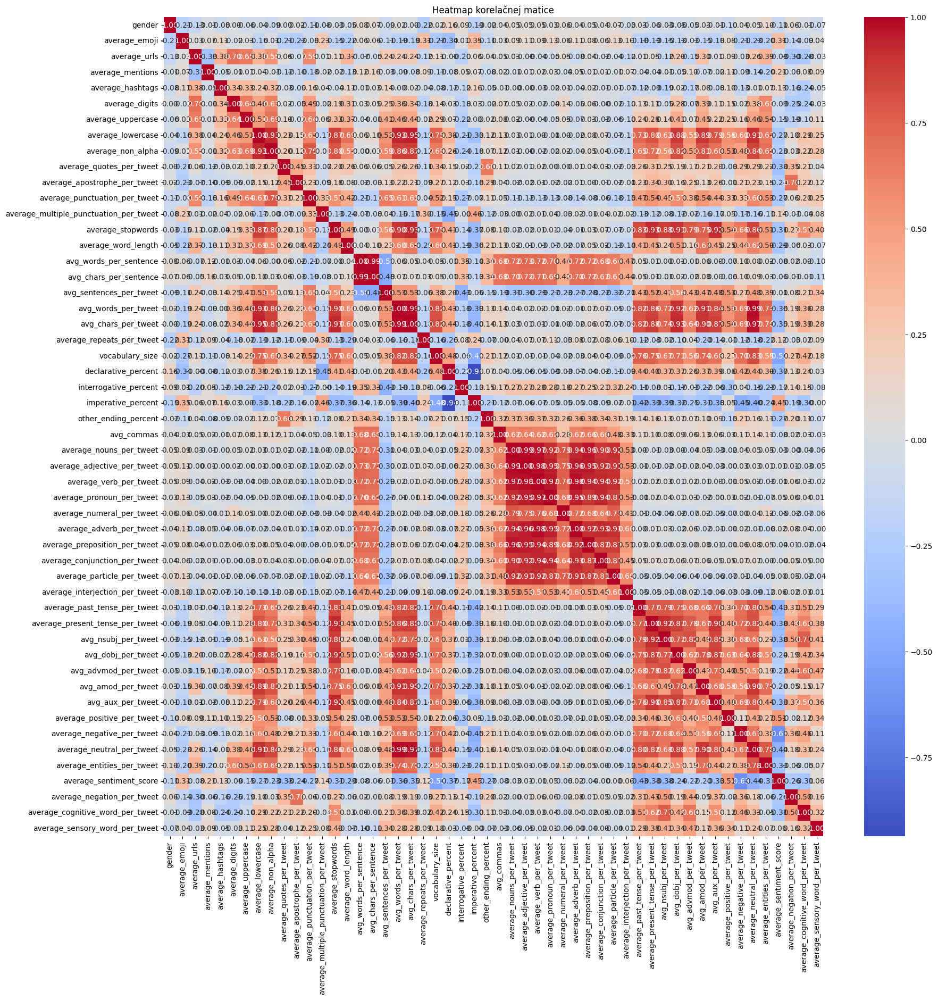

In [13]:
dataset_corr=dataset.drop([ 'lemmatized_text' ], axis=1)
corr_matrix = dataset_corr.corr()

# Vytvor heatmap
plt.figure(figsize=(20, 20))  # Nastav veľkosť obrázka podľa potreby
sns.heatmap(corr_matrix, annot=True, fmt=".2f", cmap='coolwarm', cbar=True)
plt.title('Heatmap korelačnej matice')
plt.show()

ROZDELENIE NA TRENOVACI A TESTOVACI DATASET

Bez outlieerov a skalovania

In [14]:
y = dataset['gender']
X = dataset.drop(['gender'], axis=1) 

In [15]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3)

In [16]:
X_train.info()

<class 'pandas.core.frame.DataFrame'>
Index: 3172 entries, 1811 to 2258
Data columns (total 52 columns):
 #   Column                                  Non-Null Count  Dtype  
---  ------                                  --------------  -----  
 0   average_emoji                           3172 non-null   float64
 1   average_urls                            3172 non-null   float64
 2   average_mentions                        3172 non-null   float64
 3   average_hashtags                        3172 non-null   float64
 4   average_digits                          3172 non-null   float64
 5   average_uppercase                       3172 non-null   float64
 6   average_lowercase                       3172 non-null   float64
 7   average_non_alpha                       3172 non-null   float64
 8   average_quotes_per_tweet                3172 non-null   float64
 9   average_apostrophe_per_tweet            3172 non-null   float64
 10  average_punctuation_per_tweet           3172 non-null   float6

In [17]:
X_test.info()

<class 'pandas.core.frame.DataFrame'>
Index: 1360 entries, 1170 to 3626
Data columns (total 52 columns):
 #   Column                                  Non-Null Count  Dtype  
---  ------                                  --------------  -----  
 0   average_emoji                           1360 non-null   float64
 1   average_urls                            1360 non-null   float64
 2   average_mentions                        1360 non-null   float64
 3   average_hashtags                        1360 non-null   float64
 4   average_digits                          1360 non-null   float64
 5   average_uppercase                       1360 non-null   float64
 6   average_lowercase                       1360 non-null   float64
 7   average_non_alpha                       1360 non-null   float64
 8   average_quotes_per_tweet                1360 non-null   float64
 9   average_apostrophe_per_tweet            1360 non-null   float64
 10  average_punctuation_per_tweet           1360 non-null   float6

Kedže veľkosť matice s frekvenciami n-gramov/slov môže byť veľmi vysoká a môže trvať aj veľmi dlho spustenie, tak sme sa rozhodli dať iba niekoľko nafrekventovanejším n-gramov/slov. Skúsili sme s rôznymi veľkosťami n-gramov natrénovať modeli aby sme videli, ktorá veľkosť je najefektívnejšia. Najlepšie by bolo toto spustiť aj s inými verziami datasetu (s outliermi, skalovaním a podobne), však to by bolo veľmi časovo náročné, tak sme zvolili túto možnosť so zakladnym datasetom. Po spustení tohto kodu sme väčšinou manuálne prepísali max_features v kode nižšie, kde sa vytvárali frekvencie n-gramov/slov, s ktorými pracujeme neskôr.

In [18]:
max_features_options = [500, 1000, 2000, 3000, 4000, 5000]  # Rôzne veľkosti slovníkov

for max_features in max_features_options:
    # Vektorizácia pre CountVectorizer
    vectorizer_ngram = CountVectorizer(ngram_range=(1, 4), analyzer='word', max_features=max_features)
    ngram_train = vectorizer_ngram.fit_transform(X_train['lemmatized_text'])
    ngram_test = vectorizer_ngram.transform(X_test['lemmatized_text'])
    
    # Kombinovanie n-gramov s ostatnými príznakmi, odstránenie 'lemmatized_text'
    X_train_dropped = X_train.drop(['lemmatized_text'], axis=1)
    X_test_dropped = X_test.drop(['lemmatized_text'], axis=1)
    X_train_combined = hstack([X_train_dropped, ngram_train])
    X_test_combined = hstack([X_test_dropped, ngram_test])

    # Trénovanie modelov
    models = {
        'SVC': SVC(),
        'Random Forest': RandomForestClassifier(),
        'Gradient Boosting Maschine': GradientBoostingClassifier()
    }

    for model_name, model in models.items():
        model.fit(X_train_combined, y_train)
        y_pred = model.predict(X_test_combined)
        accuracy = accuracy_score(y_test, y_pred)
        print(f'Model: {model_name}, Max Features: {max_features}, Accuracy: {accuracy:.2f}')

Model: SVC, Max Features: 500, Accuracy: 0.75
Model: Random Forest, Max Features: 500, Accuracy: 0.86
Model: Gradient Boosting Maschine, Max Features: 500, Accuracy: 0.88
Model: SVC, Max Features: 1000, Accuracy: 0.76
Model: Random Forest, Max Features: 1000, Accuracy: 0.85
Model: Gradient Boosting Maschine, Max Features: 1000, Accuracy: 0.89
Model: SVC, Max Features: 2000, Accuracy: 0.76
Model: Random Forest, Max Features: 2000, Accuracy: 0.84
Model: Gradient Boosting Maschine, Max Features: 2000, Accuracy: 0.90
Model: SVC, Max Features: 3000, Accuracy: 0.76
Model: Random Forest, Max Features: 3000, Accuracy: 0.85
Model: Gradient Boosting Maschine, Max Features: 3000, Accuracy: 0.90
Model: SVC, Max Features: 4000, Accuracy: 0.76
Model: Random Forest, Max Features: 4000, Accuracy: 0.85
Model: Gradient Boosting Maschine, Max Features: 4000, Accuracy: 0.90
Model: SVC, Max Features: 5000, Accuracy: 0.76
Model: Random Forest, Max Features: 5000, Accuracy: 0.85
Model: Gradient Boosting Masc

In [19]:
max_features_options = [500, 1000, 2000, 3000, 4000, 5000]  # Rôzne veľkosti slovníkov

for max_features in max_features_options:
    # Vektorizácia pre TfidfVectorizer
    vectorizer_ngram = TfidfVectorizer(ngram_range=(1, 4), analyzer='word', max_features=max_features)
    ngram_train = vectorizer_ngram.fit_transform(X_train['lemmatized_text'])
    ngram_test = vectorizer_ngram.transform(X_test['lemmatized_text'])
    
    # Kombinovanie n-gramov s ostatnými príznakmi, odstránenie 'lemmatized_text'
    X_train_dropped = X_train.drop(['lemmatized_text'], axis=1)
    X_test_dropped = X_test.drop(['lemmatized_text'], axis=1)
    X_train_combined = hstack([X_train_dropped, ngram_train])
    X_test_combined = hstack([X_test_dropped, ngram_test])

    # Trénovanie modelov
    models = {
        'SVC': SVC(),
        'Random Forest': RandomForestClassifier(),
        'Gradient Boosting Maschine': GradientBoostingClassifier()
    }

    for model_name, model in models.items():
        model.fit(X_train_combined, y_train)
        y_pred = model.predict(X_test_combined)
        accuracy = accuracy_score(y_test, y_pred)
        print(f'Model: {model_name}, Max Features: {max_features}, Accuracy: {accuracy:.2f}')

Model: SVC, Max Features: 500, Accuracy: 0.70
Model: Random Forest, Max Features: 500, Accuracy: 0.85
Model: Gradient Boosting Maschine, Max Features: 500, Accuracy: 0.88
Model: SVC, Max Features: 1000, Accuracy: 0.70
Model: Random Forest, Max Features: 1000, Accuracy: 0.84
Model: Gradient Boosting Maschine, Max Features: 1000, Accuracy: 0.89
Model: SVC, Max Features: 2000, Accuracy: 0.70
Model: Random Forest, Max Features: 2000, Accuracy: 0.85
Model: Gradient Boosting Maschine, Max Features: 2000, Accuracy: 0.89
Model: SVC, Max Features: 3000, Accuracy: 0.70
Model: Random Forest, Max Features: 3000, Accuracy: 0.85
Model: Gradient Boosting Maschine, Max Features: 3000, Accuracy: 0.90
Model: SVC, Max Features: 4000, Accuracy: 0.70
Model: Random Forest, Max Features: 4000, Accuracy: 0.84
Model: Gradient Boosting Maschine, Max Features: 4000, Accuracy: 0.89
Model: SVC, Max Features: 5000, Accuracy: 0.70
Model: Random Forest, Max Features: 5000, Accuracy: 0.85
Model: Gradient Boosting Masc

In [20]:
max_features_options = [500, 1000, 2000, 3000, 4000, 5000]  # Rôzne veľkosti slovníkov

for max_features in max_features_options:
    # Vektorizácia pre CountVectorizer
    vectorizer_ngram = CountVectorizer( analyzer='word', max_features=max_features)
    ngram_train = vectorizer_ngram.fit_transform(X_train['lemmatized_text'])
    ngram_test = vectorizer_ngram.transform(X_test['lemmatized_text'])
    
    # Kombinovanie n-gramov s ostatnými príznakmi, odstránenie 'lemmatized_text'
    X_train_dropped = X_train.drop(['lemmatized_text'], axis=1)
    X_test_dropped = X_test.drop(['lemmatized_text'], axis=1)
    X_train_combined = hstack([X_train_dropped, ngram_train])
    X_test_combined = hstack([X_test_dropped, ngram_test])

    # Trénovanie modelov
    models = {
        'SVC': SVC(),
        'Random Forest': RandomForestClassifier(),
        'Gradient Boosting Maschine': GradientBoostingClassifier()
    }

    for model_name, model in models.items():
        model.fit(X_train_combined, y_train)
        y_pred = model.predict(X_test_combined)
        accuracy = accuracy_score(y_test, y_pred)
        print(f'Model: {model_name}, Max Features: {max_features}, Accuracy: {accuracy:.2f}')

Model: SVC, Max Features: 500, Accuracy: 0.75
Model: Random Forest, Max Features: 500, Accuracy: 0.85
Model: Gradient Boosting Maschine, Max Features: 500, Accuracy: 0.90
Model: SVC, Max Features: 1000, Accuracy: 0.75
Model: Random Forest, Max Features: 1000, Accuracy: 0.86
Model: Gradient Boosting Maschine, Max Features: 1000, Accuracy: 0.90
Model: SVC, Max Features: 2000, Accuracy: 0.75
Model: Random Forest, Max Features: 2000, Accuracy: 0.85
Model: Gradient Boosting Maschine, Max Features: 2000, Accuracy: 0.90
Model: SVC, Max Features: 3000, Accuracy: 0.75
Model: Random Forest, Max Features: 3000, Accuracy: 0.85
Model: Gradient Boosting Maschine, Max Features: 3000, Accuracy: 0.90
Model: SVC, Max Features: 4000, Accuracy: 0.75
Model: Random Forest, Max Features: 4000, Accuracy: 0.85
Model: Gradient Boosting Maschine, Max Features: 4000, Accuracy: 0.90
Model: SVC, Max Features: 5000, Accuracy: 0.75
Model: Random Forest, Max Features: 5000, Accuracy: 0.85
Model: Gradient Boosting Masc

In [21]:
max_features_options = [500, 1000, 2000, 3000, 4000, 5000]  # Rôzne veľkosti slovníkov

for max_features in max_features_options:
    # Vektorizácia pre TfidfVectorizer
    vectorizer_ngram = TfidfVectorizer( analyzer='word', max_features=max_features)
    ngram_train = vectorizer_ngram.fit_transform(X_train['lemmatized_text'])
    ngram_test = vectorizer_ngram.transform(X_test['lemmatized_text'])
    
    # Kombinovanie n-gramov s ostatnými príznakmi, odstránenie 'lemmatized_text'
    X_train_dropped = X_train.drop(['lemmatized_text'], axis=1)
    X_test_dropped = X_test.drop(['lemmatized_text'], axis=1)
    X_train_combined = hstack([X_train_dropped, ngram_train])
    X_test_combined = hstack([X_test_dropped, ngram_test])

    # Trénovanie modelov
    models = {
        'SVC': SVC(),
        'Random Forest': RandomForestClassifier(),
        'Gradient Boosting Maschine': GradientBoostingClassifier()
    }

    for model_name, model in models.items():
        model.fit(X_train_combined, y_train)
        y_pred = model.predict(X_test_combined)
        accuracy = accuracy_score(y_test, y_pred)
        print(f'Model: {model_name}, Max Features: {max_features}, Accuracy: {accuracy:.2f}')

Model: SVC, Max Features: 500, Accuracy: 0.70
Model: Random Forest, Max Features: 500, Accuracy: 0.86
Model: Gradient Boosting Maschine, Max Features: 500, Accuracy: 0.88
Model: SVC, Max Features: 1000, Accuracy: 0.70
Model: Random Forest, Max Features: 1000, Accuracy: 0.86
Model: Gradient Boosting Maschine, Max Features: 1000, Accuracy: 0.89
Model: SVC, Max Features: 2000, Accuracy: 0.70
Model: Random Forest, Max Features: 2000, Accuracy: 0.85
Model: Gradient Boosting Maschine, Max Features: 2000, Accuracy: 0.90
Model: SVC, Max Features: 3000, Accuracy: 0.70
Model: Random Forest, Max Features: 3000, Accuracy: 0.85
Model: Gradient Boosting Maschine, Max Features: 3000, Accuracy: 0.90
Model: SVC, Max Features: 4000, Accuracy: 0.70
Model: Random Forest, Max Features: 4000, Accuracy: 0.85
Model: Gradient Boosting Maschine, Max Features: 4000, Accuracy: 0.90
Model: SVC, Max Features: 5000, Accuracy: 0.70
Model: Random Forest, Max Features: 5000, Accuracy: 0.86
Model: Gradient Boosting Masc

Vytvorenie frekvenci n-gramov, tfidf n-gramov, frekvenci slov, tfidf slov

In [22]:
vectorizer_ngram = CountVectorizer(ngram_range=(1, 4), analyzer='word', max_features=5000)
ngram_train = vectorizer_ngram.fit_transform(X_train['lemmatized_text'])
ngram_test = vectorizer_ngram.transform(X_test['lemmatized_text'])

In [23]:
vectorizer_ngram = TfidfVectorizer(ngram_range=(1, 4), analyzer='word',  max_features=3000)
ngram_train_tfidf = vectorizer_ngram.fit_transform(X_train['lemmatized_text'])
ngram_test_tfidf = vectorizer_ngram.transform(X_test['lemmatized_text'])

In [24]:
vectorizer_wfreq = CountVectorizer( analyzer='word', max_features=1000)
wfreq_train = vectorizer_wfreq.fit_transform(X_train['lemmatized_text'])
wfreq_test = vectorizer_wfreq.transform(X_test['lemmatized_text'])

In [25]:
vectorizer_wfreq = TfidfVectorizer( analyzer='word',  max_features=5000)
wfreq_train_tfidf = vectorizer_wfreq.fit_transform(X_train['lemmatized_text'])
wfreq_test_tfidf = vectorizer_wfreq.transform(X_test['lemmatized_text'])

Vymazeme slpcec, ktorý sme potrebovali na vytvorenie frekvencí n-gramov a slov, už ho viac nepotrebujeme

In [26]:
X_train = X_train.drop(['lemmatized_text'], axis=1)

In [27]:
X_test = X_test.drop(['lemmatized_text'], axis=1)

Spojíme stlpce datasetu s frekvenciami ngramov/ tfidf ngramov / slov / tfid slov

In [28]:
X_train_combined = hstack([X_train, ngram_train])
X_test_combined = hstack([X_test, ngram_test])
X_train_combined2 = hstack([X_train, ngram_train_tfidf])
X_test_combined2 = hstack([X_test, ngram_test_tfidf])
X_train_combined3 = hstack([X_train, wfreq_train])
X_test_combined3 = hstack([X_test, wfreq_test])
X_train_combined4 = hstack([X_train, wfreq_train_tfidf])
X_test_combined4 = hstack([X_test, wfreq_test_tfidf])

S ošetrenými outliermi

OUTLIERI

Rozhodla som sa riešiť outlierov (lebo niektoré algoritmy strojového učenia sú na to citlivé napríklad SVC) na základe pohlaví, kedže hodnoty v stlpcoch sa môžu líšiť na základe pohlavia a riešiť outlierov všeobecne v rámci celeho stlpca by mohlo zmenšiť rozdiely medzi pohlaviami. Zvolila som postup nahradenia outlierov meanom, kedže nechcem vymazávať a chcem ponechať rovnaký počet vzoriek. Zvolila som nahradiť dolných aj horných 10% aby som nahradila najviac vychýlené hodnoty, však aby som aj neskreslila veľmi distribúciu dát

In [29]:
dataset.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4532 entries, 0 to 4531
Data columns (total 53 columns):
 #   Column                                  Non-Null Count  Dtype  
---  ------                                  --------------  -----  
 0   gender                                  4532 non-null   int64  
 1   average_emoji                           4532 non-null   float64
 2   average_urls                            4532 non-null   float64
 3   average_mentions                        4532 non-null   float64
 4   average_hashtags                        4532 non-null   float64
 5   average_digits                          4532 non-null   float64
 6   average_uppercase                       4532 non-null   float64
 7   average_lowercase                       4532 non-null   float64
 8   average_non_alpha                       4532 non-null   float64
 9   average_quotes_per_tweet                4532 non-null   float64
 10  average_apostrophe_per_tweet            4532 non-null   floa

In [30]:
columns=['declarative_percent','interrogative_percent', 'imperative_percent', 'other_ending_percent', 'avg_commas','average_nouns_per_tweet', 'average_adjective_per_tweet', 'average_verb_per_tweet', 'average_pronoun_per_tweet', 'average_numeral_per_tweet', 'average_adverb_per_tweet', 'average_preposition_per_tweet','average_conjunction_per_tweet', 'average_particle_per_tweet', 'average_interjection_per_tweet', 'average_past_tense_per_tweet','average_present_tense_per_tweet', 'avg_nsubj_per_tweet','avg_dobj_per_tweet', 'avg_advmod_per_tweet', 'avg_amod_per_tweet','avg_aux_per_tweet' ]

Ako môžeme vidieť na grafe, tak veľa stlpcov obsahuje outlieerov - graf je pre celý dataset, nie pre x_train/x_test

C:\Users\danie\AppData\Local\Programs\Python\Python310\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\danie\AppData\Local\Programs\Python\Python310\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\danie\AppData\Local\Programs\Python\Python310\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):


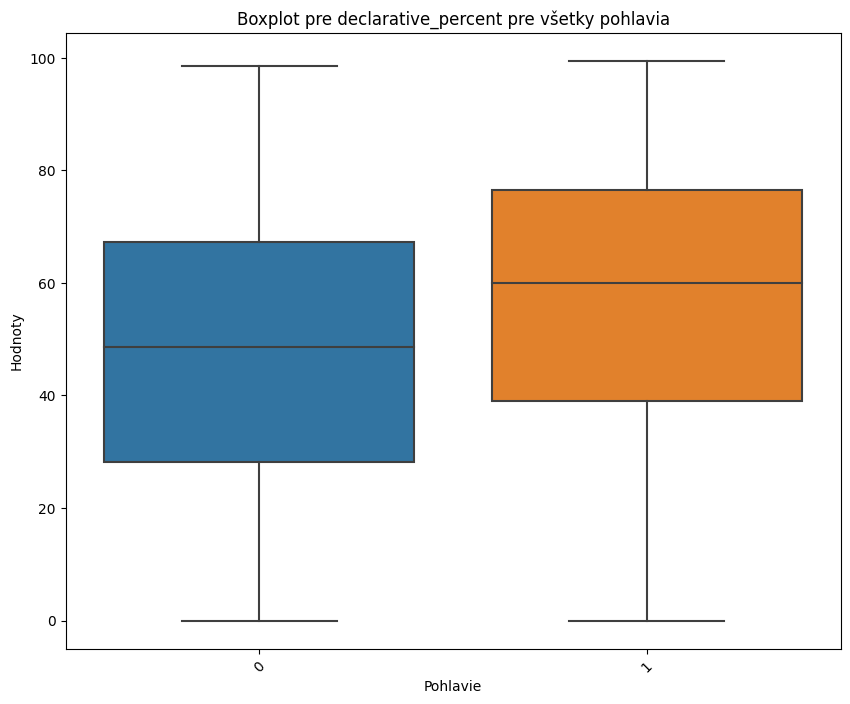

C:\Users\danie\AppData\Local\Programs\Python\Python310\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\danie\AppData\Local\Programs\Python\Python310\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\danie\AppData\Local\Programs\Python\Python310\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):


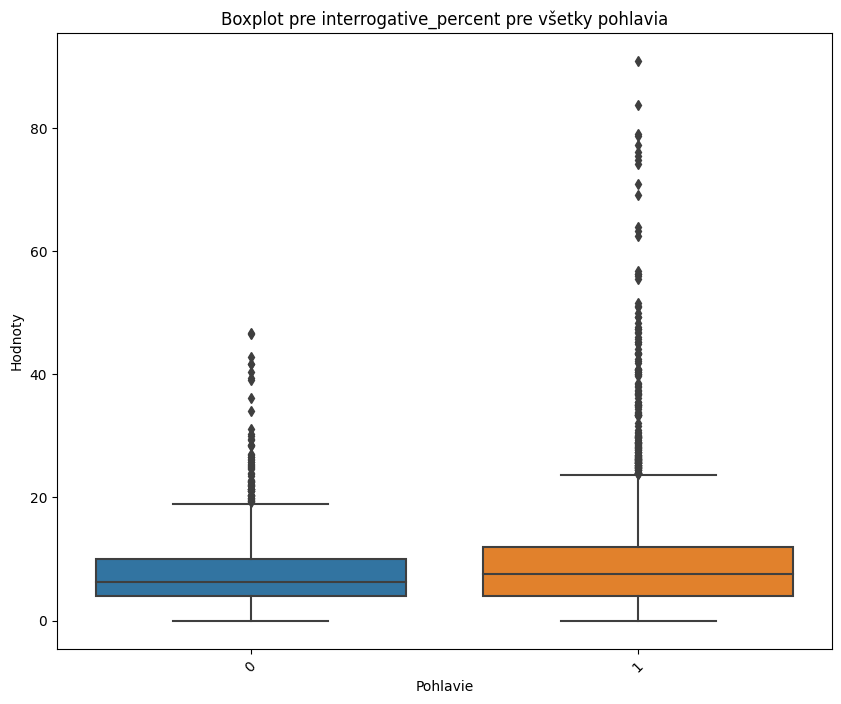

C:\Users\danie\AppData\Local\Programs\Python\Python310\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\danie\AppData\Local\Programs\Python\Python310\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\danie\AppData\Local\Programs\Python\Python310\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):


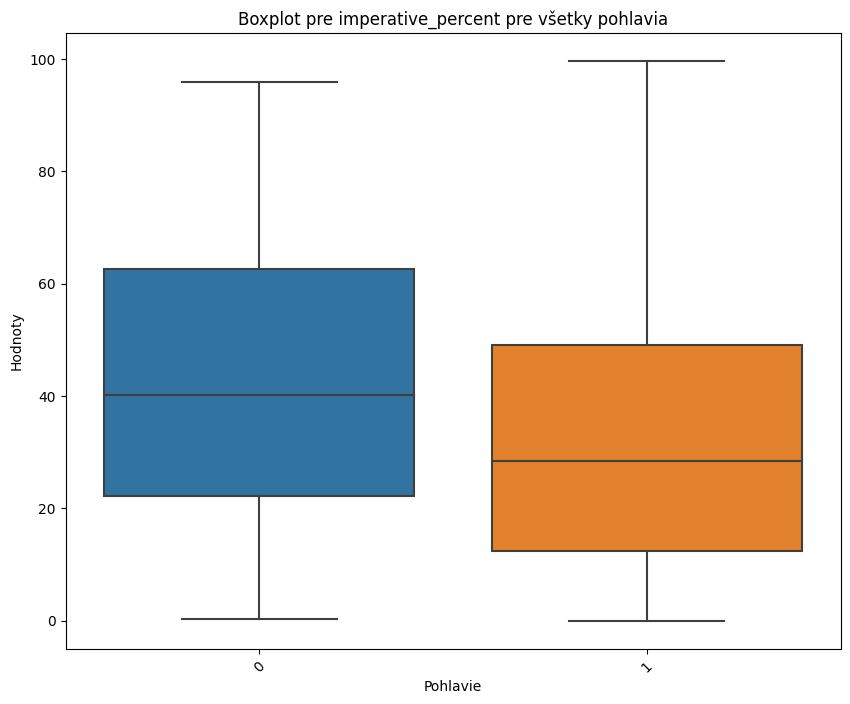

C:\Users\danie\AppData\Local\Programs\Python\Python310\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\danie\AppData\Local\Programs\Python\Python310\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\danie\AppData\Local\Programs\Python\Python310\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):


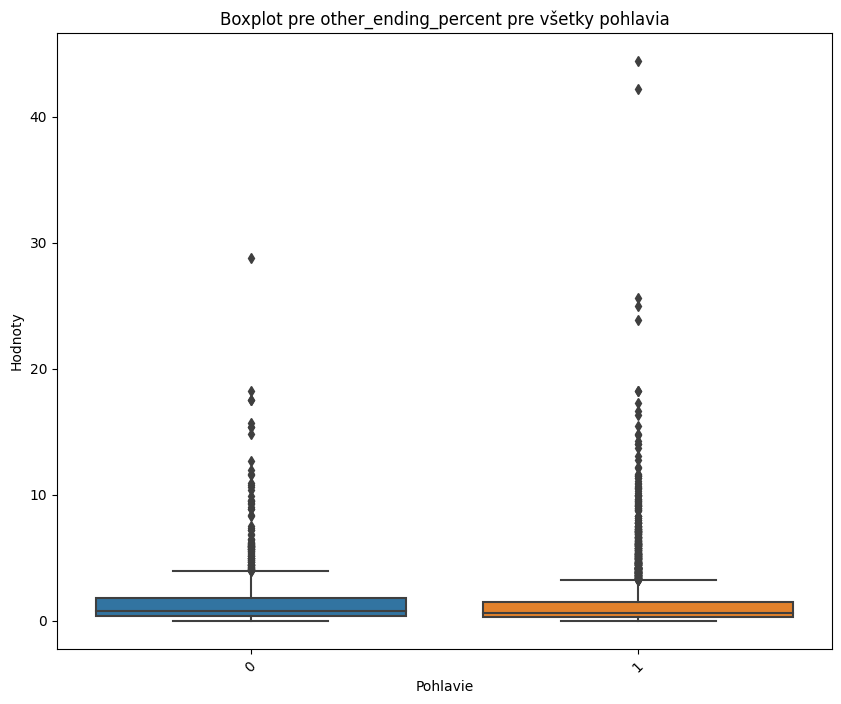

C:\Users\danie\AppData\Local\Programs\Python\Python310\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\danie\AppData\Local\Programs\Python\Python310\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\danie\AppData\Local\Programs\Python\Python310\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):


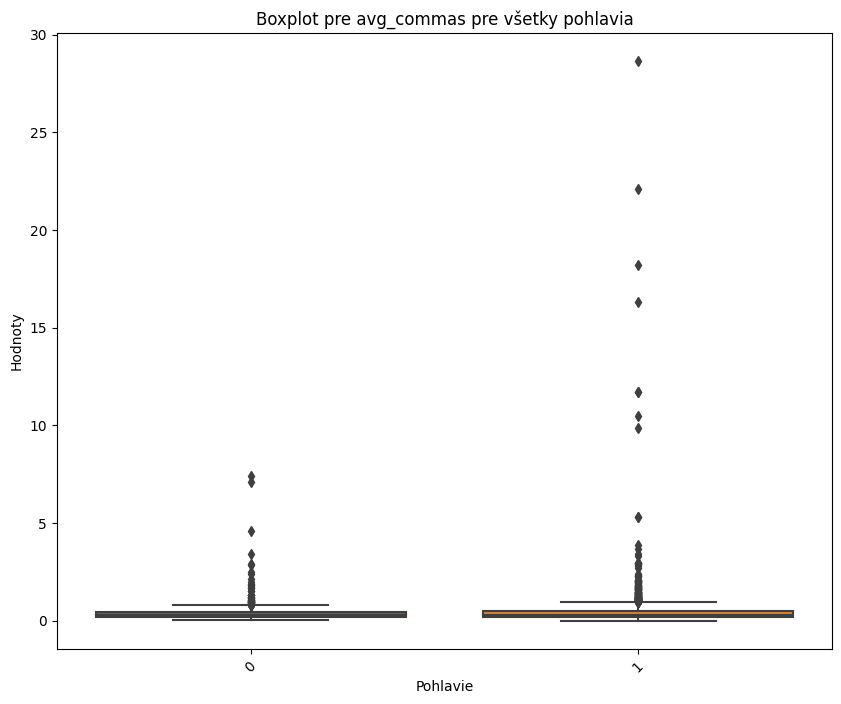

C:\Users\danie\AppData\Local\Programs\Python\Python310\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\danie\AppData\Local\Programs\Python\Python310\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\danie\AppData\Local\Programs\Python\Python310\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):


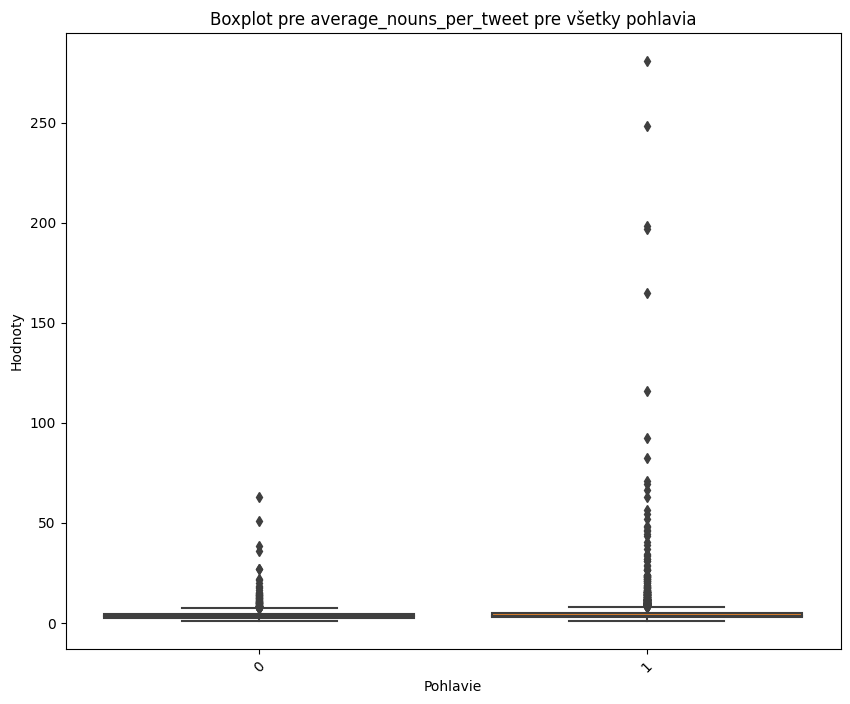

C:\Users\danie\AppData\Local\Programs\Python\Python310\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\danie\AppData\Local\Programs\Python\Python310\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\danie\AppData\Local\Programs\Python\Python310\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):


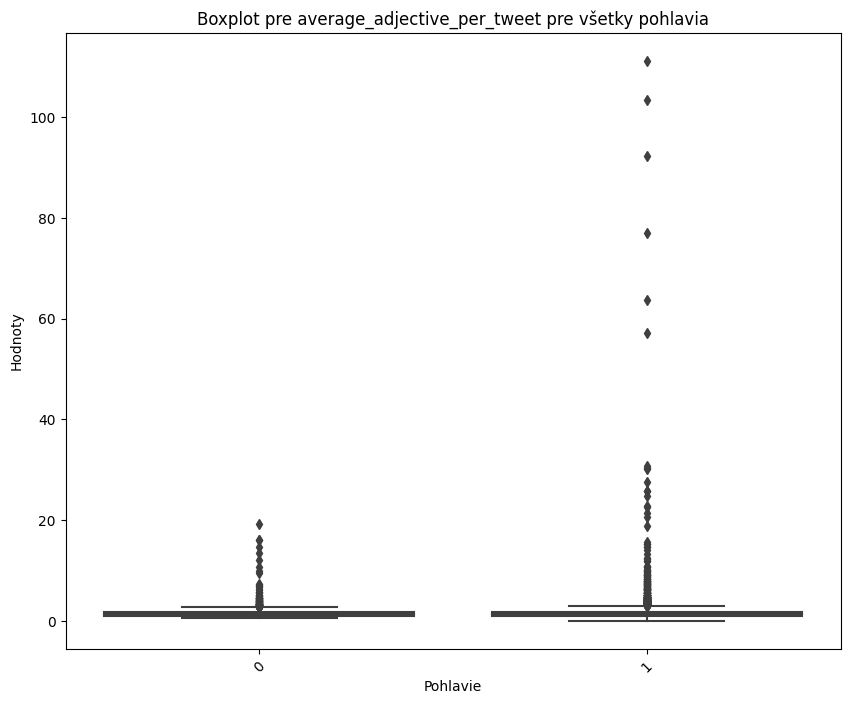

C:\Users\danie\AppData\Local\Programs\Python\Python310\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\danie\AppData\Local\Programs\Python\Python310\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\danie\AppData\Local\Programs\Python\Python310\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):


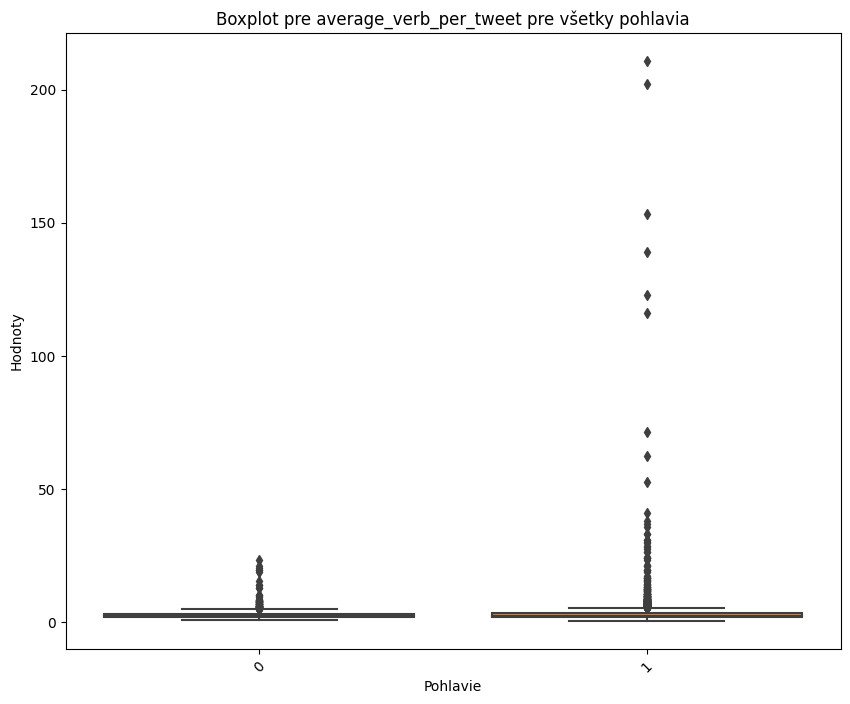

C:\Users\danie\AppData\Local\Programs\Python\Python310\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\danie\AppData\Local\Programs\Python\Python310\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\danie\AppData\Local\Programs\Python\Python310\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):


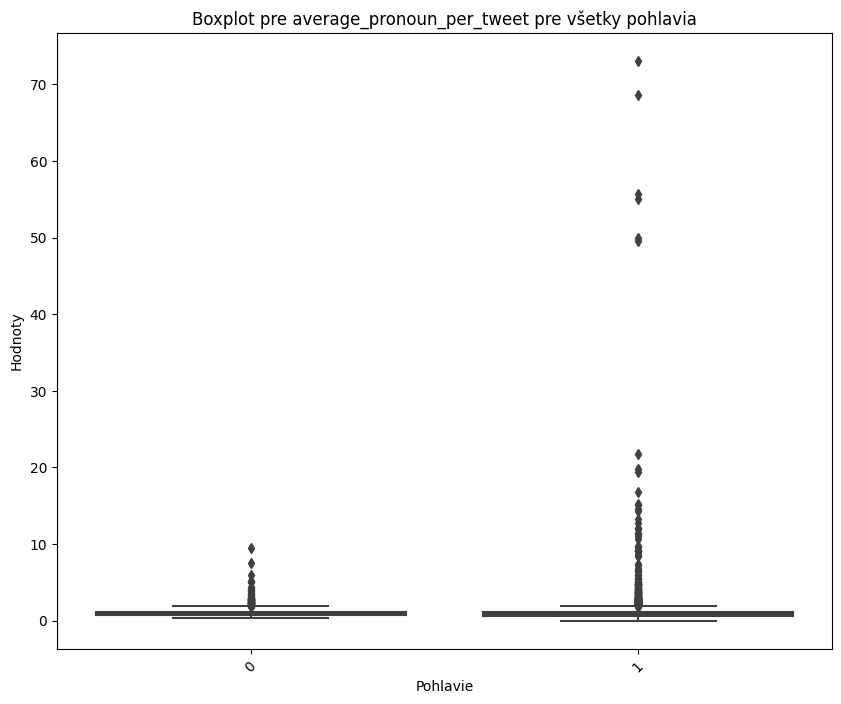

C:\Users\danie\AppData\Local\Programs\Python\Python310\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\danie\AppData\Local\Programs\Python\Python310\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\danie\AppData\Local\Programs\Python\Python310\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):


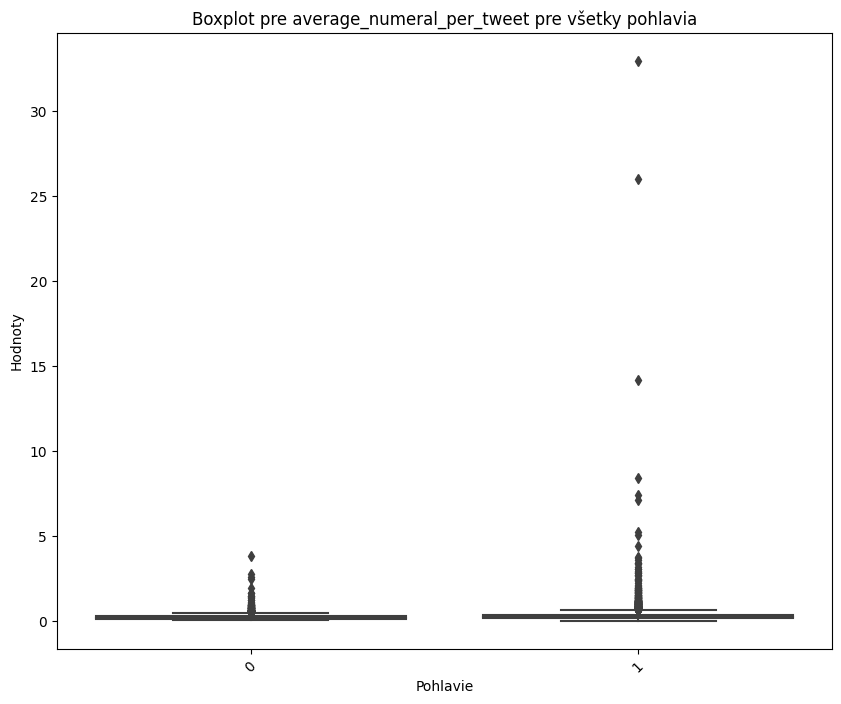

C:\Users\danie\AppData\Local\Programs\Python\Python310\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\danie\AppData\Local\Programs\Python\Python310\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\danie\AppData\Local\Programs\Python\Python310\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):


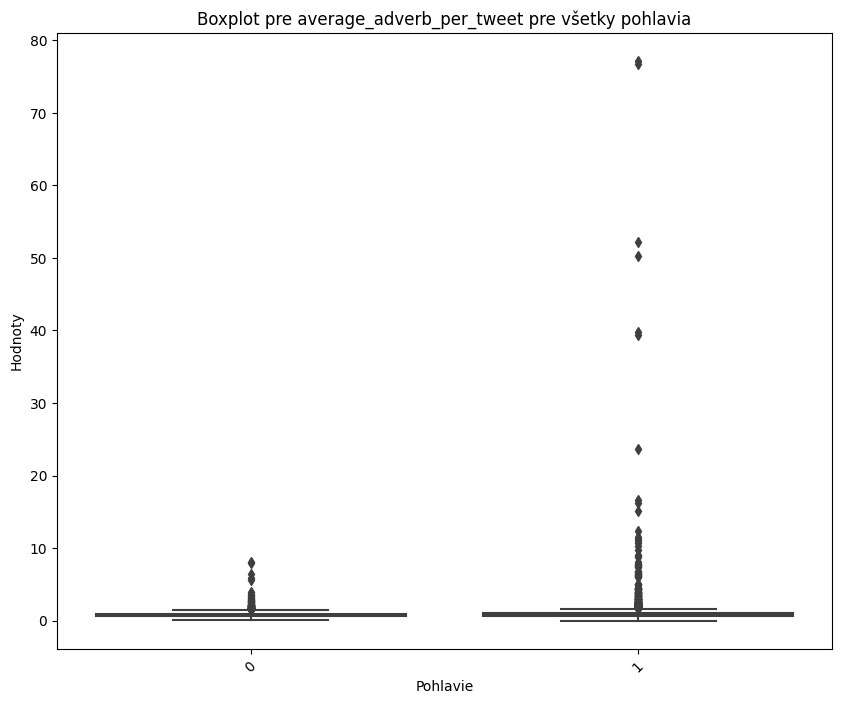

C:\Users\danie\AppData\Local\Programs\Python\Python310\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\danie\AppData\Local\Programs\Python\Python310\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\danie\AppData\Local\Programs\Python\Python310\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):


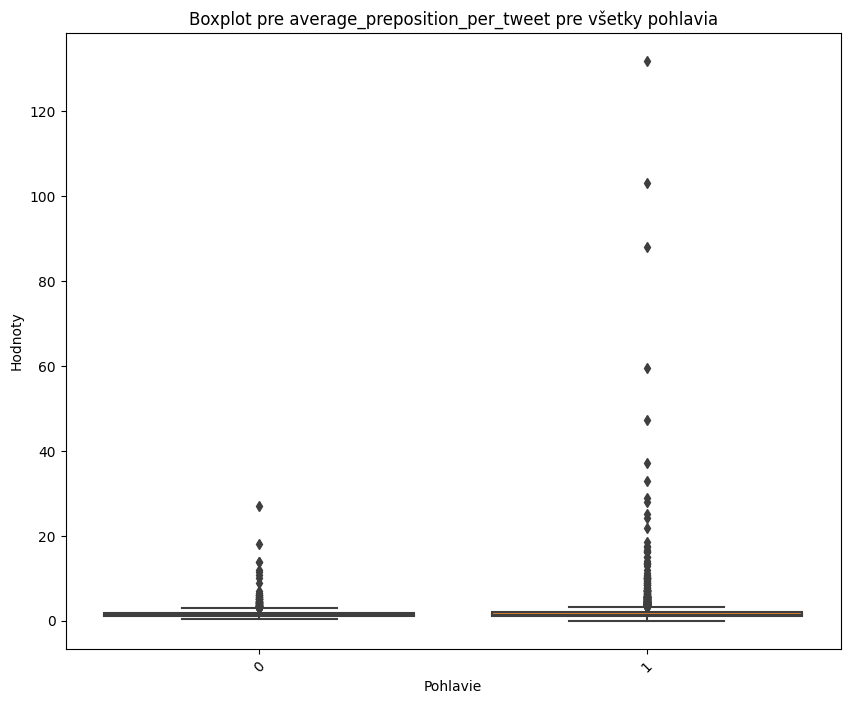

C:\Users\danie\AppData\Local\Programs\Python\Python310\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\danie\AppData\Local\Programs\Python\Python310\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\danie\AppData\Local\Programs\Python\Python310\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):


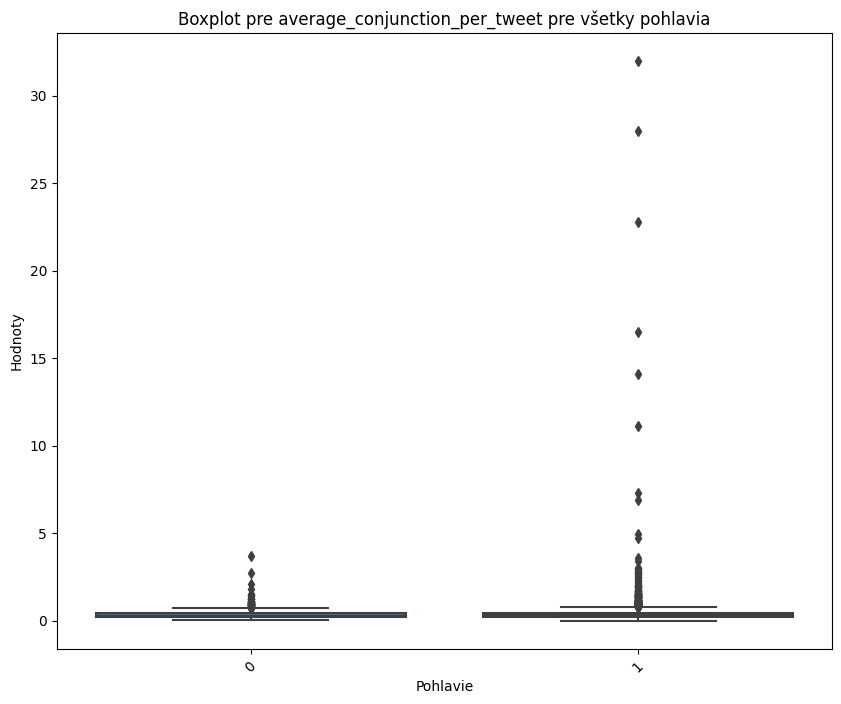

C:\Users\danie\AppData\Local\Programs\Python\Python310\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\danie\AppData\Local\Programs\Python\Python310\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\danie\AppData\Local\Programs\Python\Python310\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):


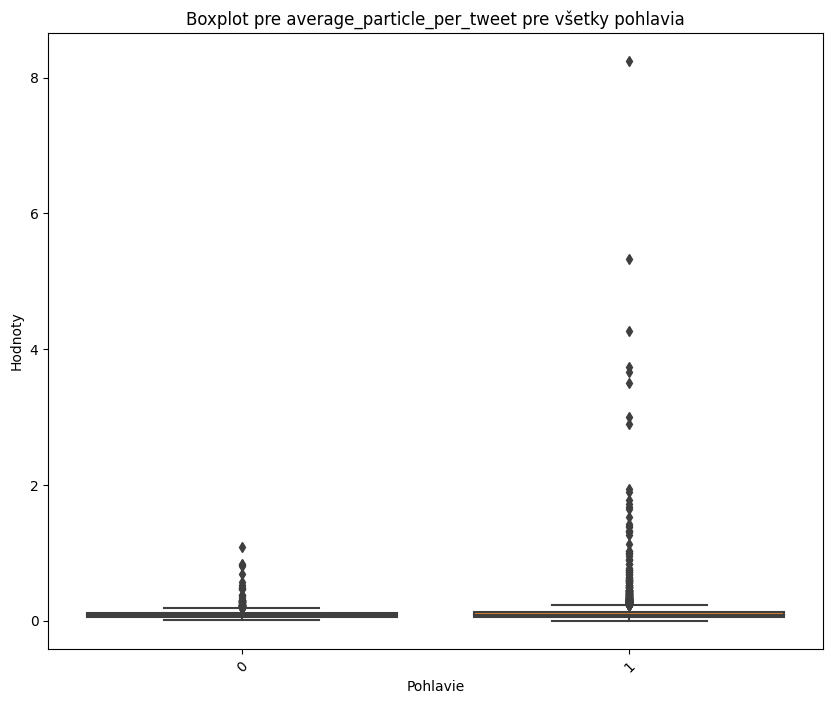

C:\Users\danie\AppData\Local\Programs\Python\Python310\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\danie\AppData\Local\Programs\Python\Python310\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\danie\AppData\Local\Programs\Python\Python310\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):


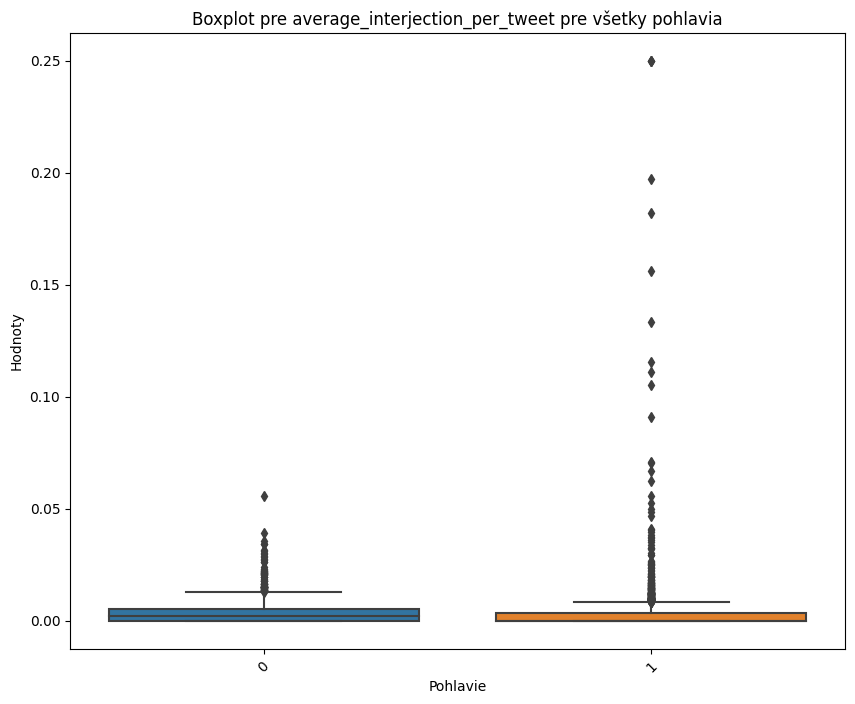

C:\Users\danie\AppData\Local\Programs\Python\Python310\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\danie\AppData\Local\Programs\Python\Python310\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\danie\AppData\Local\Programs\Python\Python310\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):


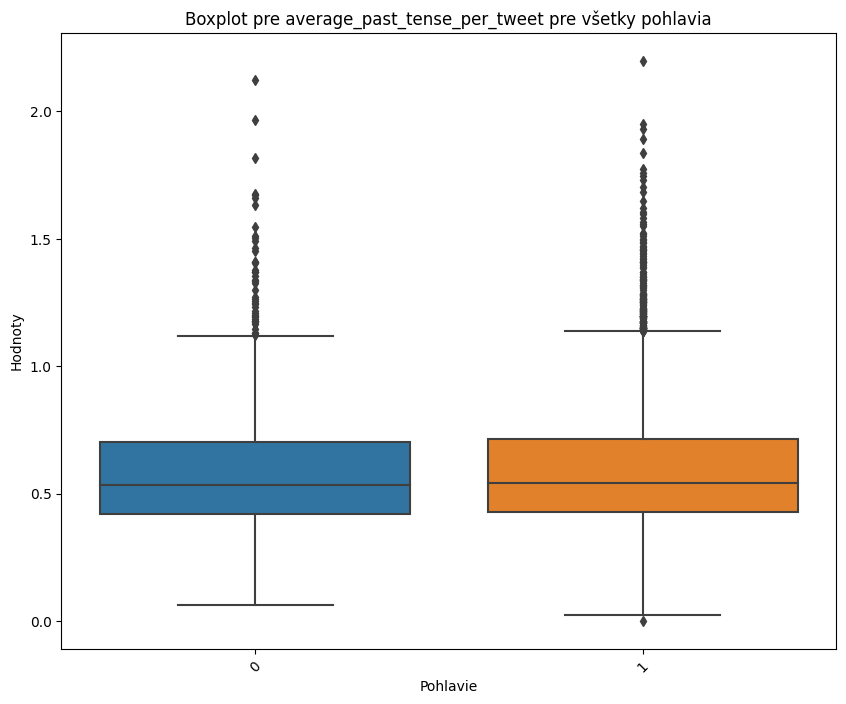

C:\Users\danie\AppData\Local\Programs\Python\Python310\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\danie\AppData\Local\Programs\Python\Python310\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\danie\AppData\Local\Programs\Python\Python310\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):


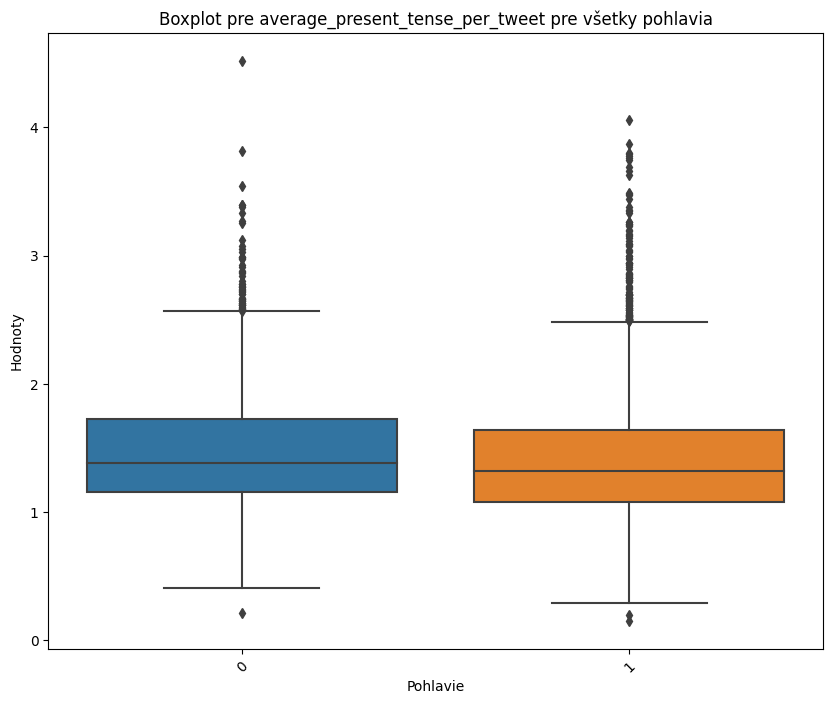

C:\Users\danie\AppData\Local\Programs\Python\Python310\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\danie\AppData\Local\Programs\Python\Python310\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\danie\AppData\Local\Programs\Python\Python310\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):


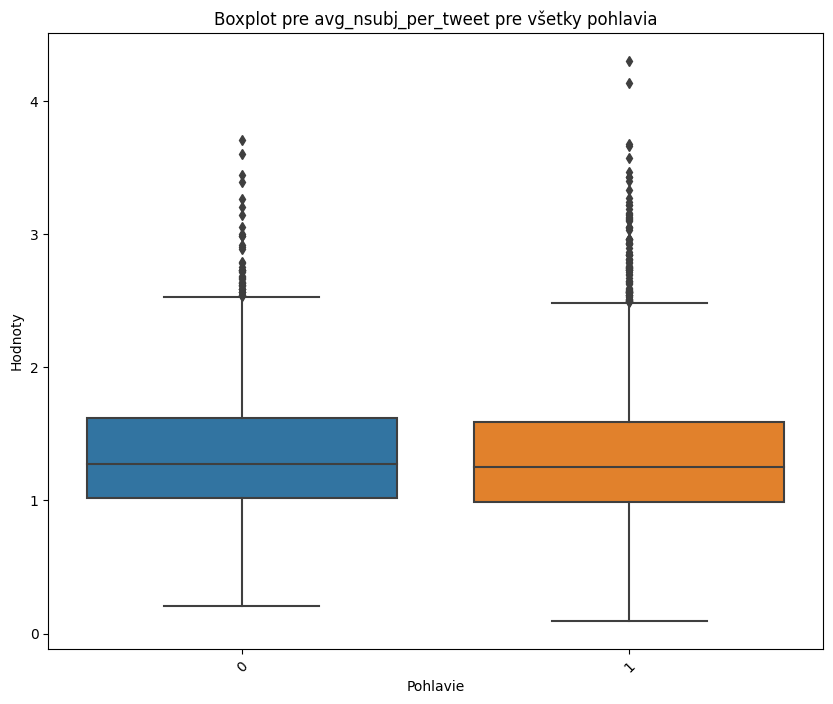

C:\Users\danie\AppData\Local\Programs\Python\Python310\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\danie\AppData\Local\Programs\Python\Python310\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\danie\AppData\Local\Programs\Python\Python310\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):


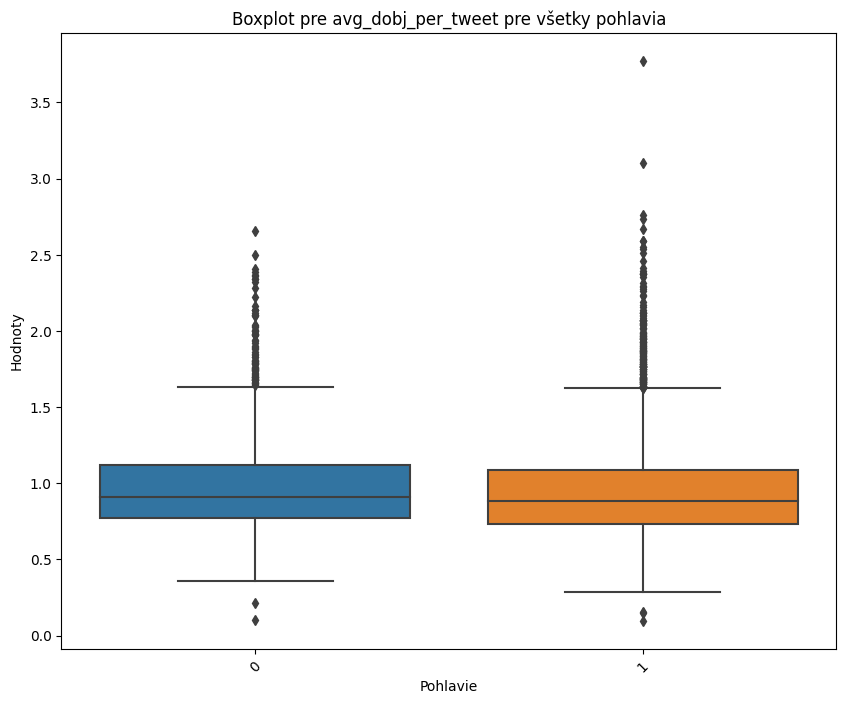

C:\Users\danie\AppData\Local\Programs\Python\Python310\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\danie\AppData\Local\Programs\Python\Python310\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\danie\AppData\Local\Programs\Python\Python310\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):


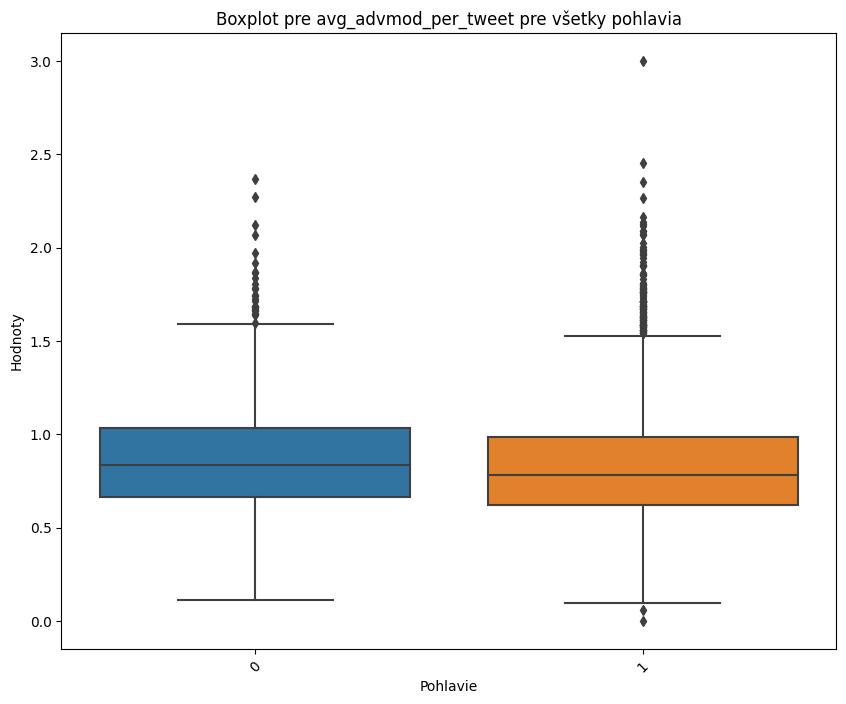

C:\Users\danie\AppData\Local\Programs\Python\Python310\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\danie\AppData\Local\Programs\Python\Python310\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\danie\AppData\Local\Programs\Python\Python310\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):


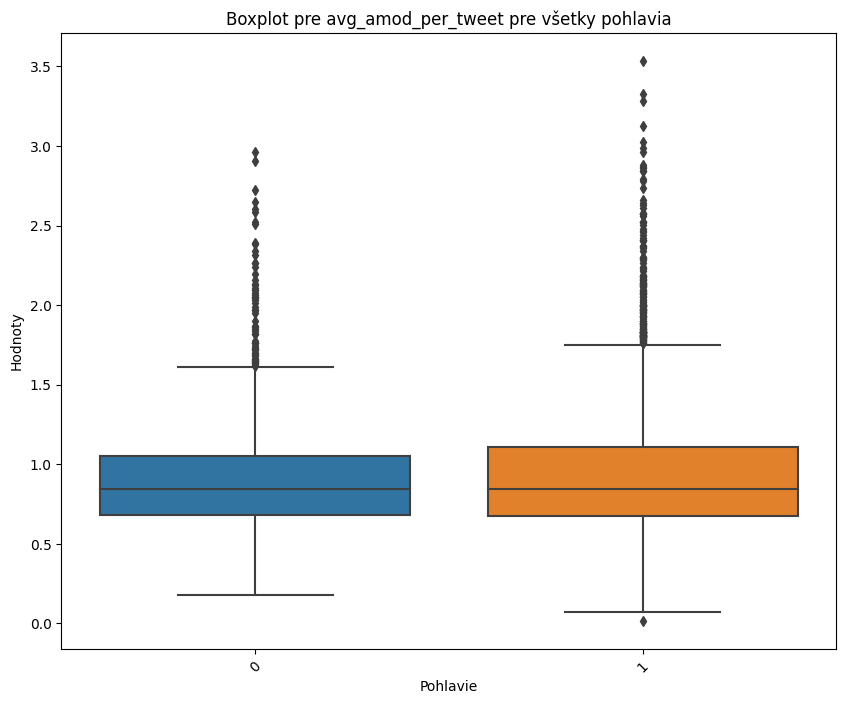

C:\Users\danie\AppData\Local\Programs\Python\Python310\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\danie\AppData\Local\Programs\Python\Python310\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\danie\AppData\Local\Programs\Python\Python310\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):


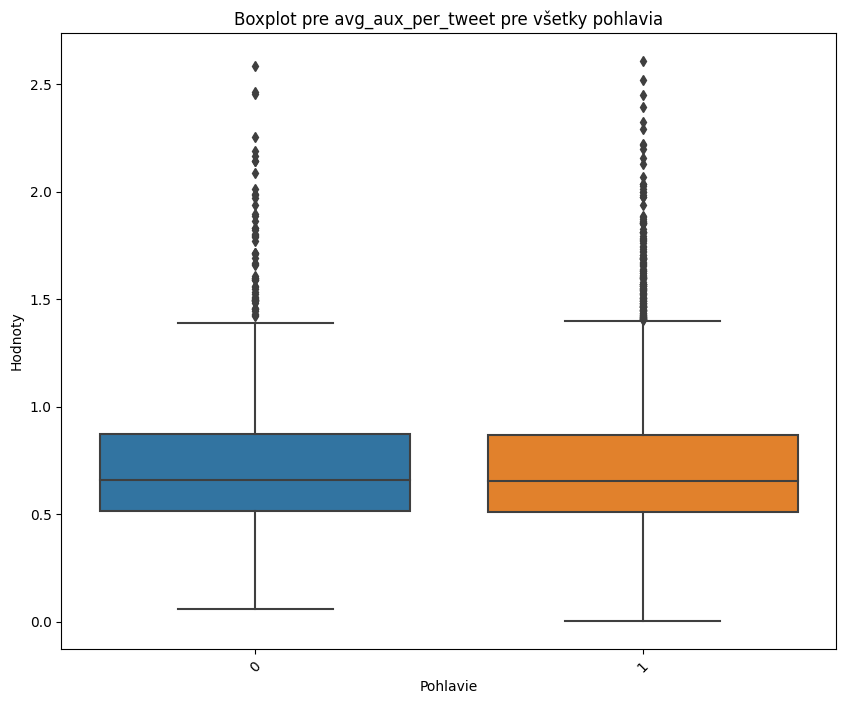

In [31]:
for column in columns:
    plt.figure(figsize=(10, 8)) # Nastaví veľkosť obrázku pre lepšiu čitateľnosť
    sns.boxplot(x='gender', y=column, data=dataset)
    plt.title(f'Boxplot pre {column} pre všetky pohlavia')
    plt.ylabel('Hodnoty')
    plt.xlabel('Pohlavie')
    plt.xticks(rotation=45) # Otáčanie menoviek pre lepšiu čitateľnosť
    plt.show()

Chceli sme zistiť outlierov pre každý slpcec a zároveň pohlavie. Zistili sme si v celkom datasete (nie pre X_train a X_test oddelene, kedže tie hranice by sa mohli líšiť) hranice a mean pre každý stlpec a zároveň každé pohlavie.

In [32]:
global_stats = {}
# Prechádza cez unikátne pohlavia v dátovom rámci
for gender in dataset['gender'].unique():
    # Prechádza cez zoznam stĺpcov, pre ktoré sa majú vypočítať štatistiky
    for column in columns:
        # Vyberie podmnožinu dát patriacu k aktuálneho pohlavia
        group_subset = dataset[dataset['gender'] == gender]
        # Vypočíta dolný limit ako 10. percentil hodnôt v aktuálnom stĺpci a pohlavi
        lower_limit = group_subset[column].quantile(0.10)
        # Vypočíta horny limit ako 90. percentil hodnôt v aktuálnom stĺpci a pohlavi
        upper_limit = group_subset[column].quantile(0.90)
        # Vypočítanie priemernej hodnoty pre dáta medzi dolným a horným limitom
        mean_value = group_subset[(group_subset[column] >= lower_limit) & (group_subset[column] <= upper_limit)][column].mean()
        # Uloženie vypočítaných štatistík do slovníka s kľúčom ako dvojica (pohlavie, názov stĺpca)
        global_stats[(gender, column)] = (lower_limit, upper_limit, mean_value)

In [33]:
X_train_out = X_train.copy()
X_test_out = X_test.copy()

Následne sme si prvky v stlpcoch, ktoré su pod dolnou hranicou alebo za hornou hranocou nahranili meanom v trenovacom aj v testovacom datasete.

In [34]:
# Iteruje cez každý riadok datasetu
for index, row in X_train_out.iterrows():
    # Získa skupinu pohlavia pre aktuálny riadok z iného DataFrame y_train pomocou indexu
    gender = y_train.loc[index] 
    
    # Iteruje cez stlpce
    for column in columns:
        # Získa dolný a horný limit a priemernú hodnotu pre aktuálnu kombináciu pohlavia a stĺpca z predtým vytvoreného slovníka global_stats
        lower_limit, upper_limit, mean_value = global_stats[(gender, column)]
        
        # Ak je hodnota v aktuálnom riadku a stĺpci menšia ako dolný limit alebo väčšia ako horný limit,
        # nastaví hodnotu v tomto riadku a stĺpci na priemernú hodnotu pre túto skupinu
        if row[column] < lower_limit or row[column] > upper_limit:
            X_train_out.at[index, column] = mean_value

In [35]:
# Iteruje cez každý riadok datasetu
for index, row in X_test_out.iterrows():
     # Získa skupinu pohlavia pre aktuálny riadok z iného DataFrame y_train pomocou indexu
    gender = y_test.loc[index] 
    # Iteruje cez stlpce
    for column in columns:
         # Získa dolný a horný limit a priemernú hodnotu pre aktuálnu kombináciu pohlavia a stĺpca z predtým vytvoreného slovníka global_stats
        lower_limit, upper_limit, mean_value = global_stats[(gender, column)]
        # Ak je hodnota v aktuálnom riadku a stĺpci menšia ako dolný limit alebo väčšia ako horný limit,
        # nastaví hodnotu v tomto riadku a stĺpci na priemernú hodnotu pre túto skupinu
        if row[column] < lower_limit or row[column] > upper_limit:
            X_test_out.at[index, column] = mean_value

Spojenie s ngramami / tfidf n-gramami /slovami / tfidf slovami

In [36]:
X_train_combined_out = hstack([X_train_out, ngram_train])
X_test_combined_out = hstack([X_test_out, ngram_test])
X_train_combined2_out = hstack([X_train_out, ngram_train_tfidf])
X_test_combined2_out = hstack([X_test_out, ngram_test_tfidf])
X_train_combined3_out = hstack([X_train_out, wfreq_train])
X_test_combined3_out = hstack([X_test_out, wfreq_test])
X_train_combined4_out = hstack([X_train_out, wfreq_train_tfidf])
X_test_combined4_out = hstack([X_test_out, wfreq_test_tfidf])

S aplikovaným škálovaním

SKALOVANIE

Kedže množstvo mojích dát má iné rozsahy a niektoré algoritmy strojového učenia (najmä tie, ktoré sú založené na vzdialenosti ) ako napríklad SVC sú citlivé na rozsahy tak som sa rozhodla pre škálovanie. Škálovanie môže pomôcť zabezpečiť, že jeden atribút neovládne ostatné pri výpočte vzdialeností.

C:\Users\danie\AppData\Local\Programs\Python\Python310\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\danie\AppData\Local\Programs\Python\Python310\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\danie\AppData\Local\Programs\Python\Python310\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):


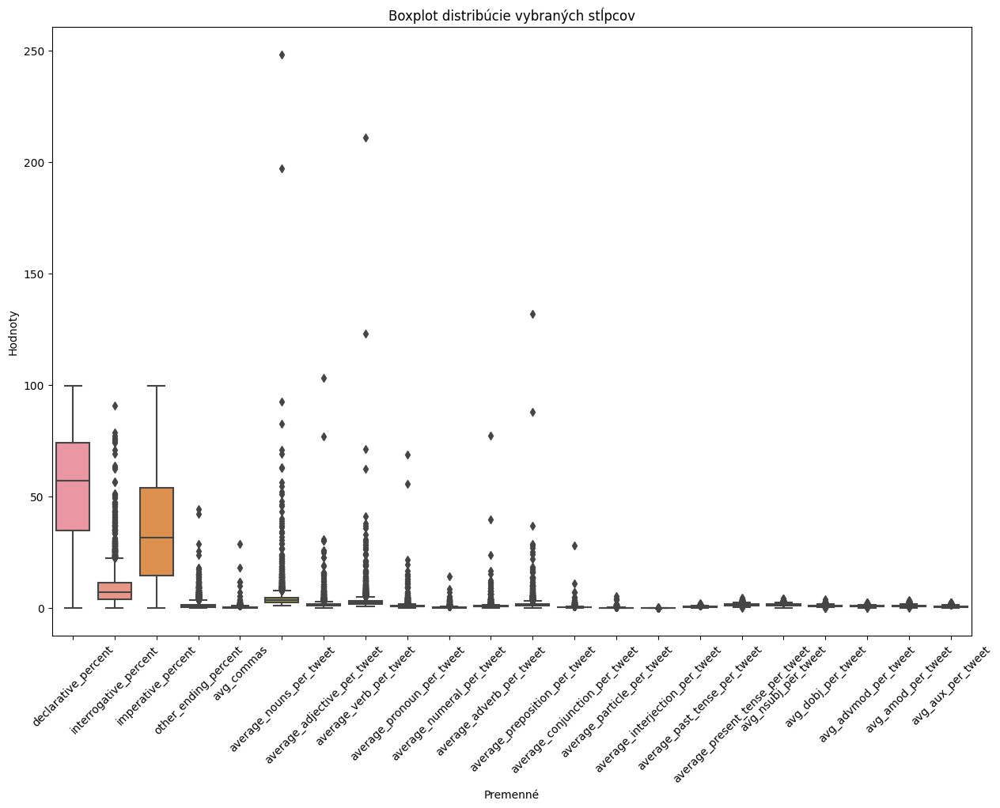

In [37]:
melted_df = pd.melt(X_train, value_vars=columns)

# Teraz použite Seaborn na zobrazenie distribúcií pomocou boxplotu
plt.figure(figsize=(15, 10))
sns.boxplot(x='variable', y='value', data=melted_df)
plt.xticks(rotation=45)
plt.title('Boxplot distribúcie vybraných stĺpcov')
plt.xlabel('Premenné')
plt.ylabel('Hodnoty')
plt.show()

In [38]:
X_train_scaled = X_train.copy()
X_test_scaled = X_test.copy()

Skalovala som si všetky numericke stpce a to tak, že som to fitla na trenovaci dataset a transormovala na obidvoch, aj na trenovacom aj testovacom

In [39]:
scaler = MinMaxScaler()
scaler.fit(X_train_scaled[columns])
X_train_scaled[columns] = scaler.transform(X_train_scaled[columns])
X_test_scaled[columns] = scaler.transform(X_test_scaled[columns])

Spojenie datasetu s ngramami / tfidf n-gramami / slovami / tfidf slovami

In [40]:
X_train_combined_scaled = hstack([X_train_scaled, ngram_train])
X_test_combined_scaled = hstack([X_test_scaled, ngram_test])
X_train_combined2_scaled = hstack([X_train_scaled, ngram_train_tfidf])
X_test_combined2_scaled = hstack([X_test_scaled, ngram_test_tfidf])
X_train_combined3_scaled = hstack([X_train_scaled, wfreq_train])
X_test_combined3_scaled = hstack([X_test_scaled, wfreq_test])
X_train_combined4_scaled = hstack([X_train_scaled, wfreq_train_tfidf])
X_test_combined4_scaled = hstack([X_test_scaled, wfreq_test_tfidf])

Zobrazili sme si zoskalovane data a vidíme, že sú v rovnakom rozmedzí, však nachádza sa tam množstvo outlierov

C:\Users\danie\AppData\Local\Programs\Python\Python310\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\danie\AppData\Local\Programs\Python\Python310\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\danie\AppData\Local\Programs\Python\Python310\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):


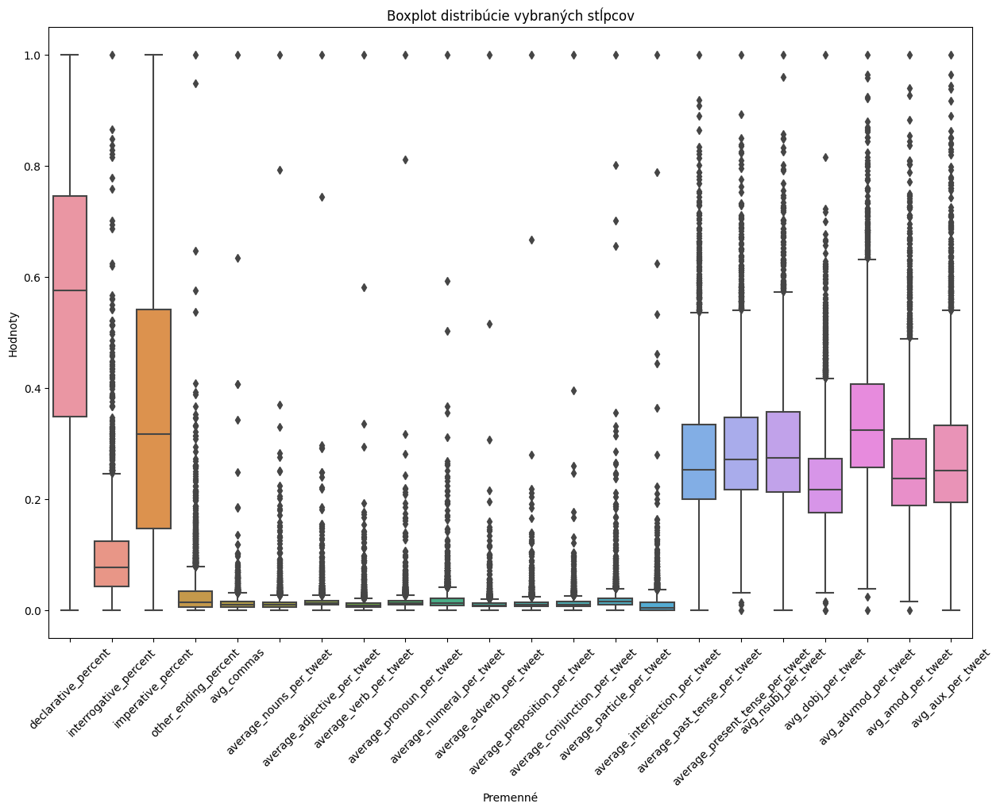

In [41]:
melted_df = pd.melt(X_train_scaled, value_vars=columns)

# Teraz použite Seaborn na zobrazenie distribúcií pomocou boxplotu
plt.figure(figsize=(15, 10))
sns.boxplot(x='variable', y='value', data=melted_df)
plt.xticks(rotation=45)
plt.title('Boxplot distribúcie vybraných stĺpcov')
plt.xlabel('Premenné')
plt.ylabel('Hodnoty')
plt.show()

S ošetrenými outliermi aj aplikovaným škálovaním

In [42]:
X_train_scal_out = X_train_out.copy()
X_test_scal_out = X_test_out.copy()

Zoškálujem si dataset s ošetrenými outliermi

In [43]:
scaler = MinMaxScaler()
scaler.fit(X_train_scaled[columns])
X_train_scal_out[columns] = scaler.transform(X_train_scal_out[columns])
X_test_scal_out[columns] = scaler.transform(X_test_scal_out[columns])

Spojím si dataset s ngramami / tfidf ngramami / slovami / tfidf slovami

In [44]:
X_train_combined_scal_out = hstack([X_train_scal_out, ngram_train])
X_test_combined_scal_out = hstack([X_test_scal_out, ngram_test])
X_train_combined2_scal_out = hstack([X_train_scal_out, ngram_train_tfidf])
X_test_combined2_scal_out = hstack([X_test_scal_out, ngram_test_tfidf])
X_train_combined3_scal_out = hstack([X_train_scal_out, wfreq_train])
X_test_combined3_scal_out = hstack([X_test_scal_out, wfreq_test])
X_train_combined4_scal_out = hstack([X_train_scal_out, wfreq_train_tfidf])
X_test_combined4_scal_out = hstack([X_test_scal_out, wfreq_test_tfidf])

TRENOVANIE 1

Prvé trenovanie som vykonala so všetkými premennými (bez výberu črt) aby som videla aké výsledky môžem dostať. Vykonala som testovanie na 3 modeloch: Random Forest, GBM a SVC. Taktiež na každom modeli som skúsila rôzne varianty datasetu aby som videla s ktorým viem dosiahnúť najlepšie výsledky: bez ošetrenia outlierov a bez škálovania, bez ošetrenia outlierov a bez škálovania a s ngramami, bez ošetrenia outlierov a bez škálovania a s tfidf ngramami, s ošetrením outlierov, s ošetrením outlierov a s ngrami, s ošetrením outlierov a s tfidf ngramami, so škálovaním, so škálovaním a s ngramami, so škálovaním a s tfidf ngramami, s ošetrením outlierov a so škálovaním, s ošetrením outlierov a so škálovaním a s ngramami, s ošetrením outlierov a so škálovaním a s tfidf ngramami.

In [45]:
results_list1_svc=[]#na ukladanie testovacej a trenovacej accuracy

SVC - bez ošetrenia outlierov a skalovania

Trenovanie modelu

In [46]:
svc_model = SVC()
svc_model.fit(X_train, y_train)

SVC()

Predikovanie na trenovacich datach

In [47]:
y_pred_train = svc_model.predict(X_train)
print("Presnosť:", accuracy_score(y_train, y_pred_train))
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train))


Presnosť: 0.705233291298865
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.00      0.00      0.00       935
           1       0.71      1.00      0.83      2237

    accuracy                           0.71      3172
   macro avg       0.35      0.50      0.41      3172
weighted avg       0.50      0.71      0.58      3172



C:\Users\danie\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\metrics\_classification.py:1469: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\danie\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\metrics\_classification.py:1469: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\danie\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\metrics\_classification.py:1469: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average,

Predikovanie na testovacich datach

In [48]:
y_pred = svc_model.predict(X_test)
print("Klasifikačný report:\n", classification_report(y_test, y_pred))

Klasifikačný report:
               precision    recall  f1-score   support

           0       0.00      0.00      0.00       406
           1       0.70      1.00      0.82       954

    accuracy                           0.70      1360
   macro avg       0.35      0.50      0.41      1360
weighted avg       0.49      0.70      0.58      1360



C:\Users\danie\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\metrics\_classification.py:1469: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\danie\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\metrics\_classification.py:1469: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\danie\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\metrics\_classification.py:1469: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average,

Uloženie trenovacej a testovacej accuracy do poľa s výsledkami z prveho testovania pre svc

In [49]:
results_list1_svc.append({
    'accuracy_train': accuracy_score(y_train, y_pred_train),
    'accuracy_test': accuracy_score(y_test, y_pred),
    'precision_train': precision_score(y_train, y_pred_train, average='binary'),
    'precision_test': precision_score(y_test, y_pred, average='binary'),
 'recall_train': recall_score(y_train, y_pred_train, average='binary'),
 'recall_test': recall_score(y_test, y_pred, average='binary'),
 'f1_train': f1_score(y_train, y_pred_train, average='binary'),
 'f1_test': f1_score(y_test, y_pred, average='binary')
    ,
    'precision_train': precision_score(y_train, y_pred_train, average='binary'),  
    'precision_test': precision_score(y_test, y_pred, average='binary'), 
    'recall_train': recall_score(y_train, y_pred_train, average='binary'), 
    'recall_test': recall_score(y_test, y_pred, average='binary'),  
    'f1_train': f1_score(y_train, y_pred_train, average='binary'), 
    'f1_test': f1_score(y_test, y_pred, average='binary') 
})


In [50]:
results_list1_svc

[{'accuracy_train': 0.705233291298865,
  'accuracy_test': 0.7014705882352941,
  'precision_train': 0.705233291298865,
  'precision_test': 0.7014705882352941,
  'recall_train': 1.0,
  'recall_test': 1.0,
  'f1_train': 0.8271399519319652,
  'f1_test': 0.8245462402765773}]

Zobrazenie metrik

In [51]:
accuracy = accuracy_score(y_test, y_pred)
recall = recall_score(y_test, y_pred, average='binary') 
precision = precision_score(y_test, y_pred, average='binary')
f1 = f1_score(y_test, y_pred, average='binary')

print("Accuracy: {:.3f}".format(accuracy))
print("Recall: {:.2f}".format(recall))
print("Precision: {:.2f}".format(precision))
print("F1 Score: {:.2f}".format(f1))


Accuracy: 0.701
Recall: 1.00
Precision: 0.70
F1 Score: 0.82


Vizualizácia výkonnosti modelu

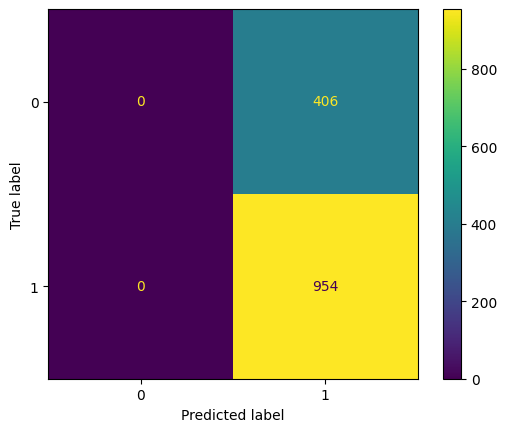

In [52]:
matrix1=confusion_matrix(y_test, y_pred)
ConfusionMatrixDisplay(matrix1).plot()

SVC - bez ošetrenia outlierov a skalovania a ngram

In [53]:
svc_model = SVC()
svc_model.fit(X_train_combined, y_train)

SVC()

In [54]:
y_pred_train = svc_model.predict(X_train_combined)
print("Presnosť:", accuracy_score(y_train, y_pred_train))
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train))

Presnosť: 0.7578814627994955
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.86      0.21      0.34       935
           1       0.75      0.99      0.85      2237

    accuracy                           0.76      3172
   macro avg       0.81      0.60      0.60      3172
weighted avg       0.78      0.76      0.70      3172



In [55]:
y_pred = svc_model.predict(X_test_combined)
print("Klasifikačný report:\n", classification_report(y_test, y_pred))

Klasifikačný report:
               precision    recall  f1-score   support

           0       0.91      0.22      0.35       406
           1       0.75      0.99      0.85       954

    accuracy                           0.76      1360
   macro avg       0.83      0.60      0.60      1360
weighted avg       0.80      0.76      0.70      1360



In [56]:
results_list1_svc.append({
        'accuracy_train': accuracy_score(y_train, y_pred_train),
    'accuracy_test': accuracy_score(y_test, y_pred),
    'precision_train': precision_score(y_train, y_pred_train, average='binary'),
    'precision_test': precision_score(y_test, y_pred, average='binary'),
 'recall_train': recall_score(y_train, y_pred_train, average='binary'),
 'recall_test': recall_score(y_test, y_pred, average='binary'),
 'f1_train': f1_score(y_train, y_pred_train, average='binary'),
 'f1_test': f1_score(y_test, y_pred, average='binary')
        
    })

In [57]:
accuracy = accuracy_score(y_test, y_pred)
recall = recall_score(y_test, y_pred, average='binary')  # 'macro' pre nevyvážené triedy, 'binary' pre binárnu klasifikáciu
precision = precision_score(y_test, y_pred, average='binary')
f1 = f1_score(y_test, y_pred, average='binary')

print("Accuracy: {:.2f}".format(accuracy))
print("Recall: {:.2f}".format(recall))
print("Precision: {:.2f}".format(precision))
print("F1 Score: {:.2f}".format(f1))

Accuracy: 0.76
Recall: 0.99
Precision: 0.75
F1 Score: 0.85


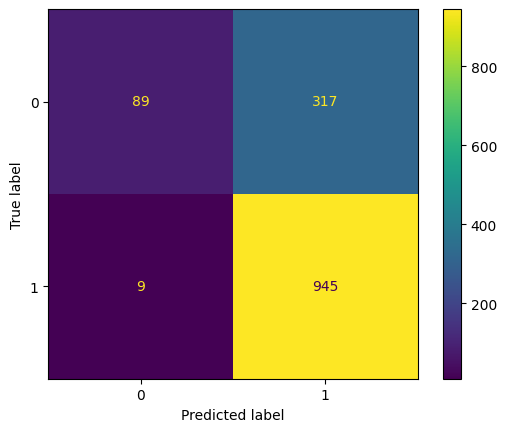

In [58]:
matrix1=confusion_matrix(y_test, y_pred)
ConfusionMatrixDisplay(matrix1).plot()

SVC - bez ošetrenia outlierov a skalovania a tfidf ngram

In [59]:
svc_model = SVC()
svc_model.fit(X_train_combined2, y_train)

SVC()

In [60]:
y_pred_train = svc_model.predict(X_train_combined2)
print("Presnosť:", accuracy_score(y_train, y_pred_train))
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train))

Presnosť: 0.705233291298865
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.00      0.00      0.00       935
           1       0.71      1.00      0.83      2237

    accuracy                           0.71      3172
   macro avg       0.35      0.50      0.41      3172
weighted avg       0.50      0.71      0.58      3172



C:\Users\danie\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\metrics\_classification.py:1469: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\danie\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\metrics\_classification.py:1469: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\danie\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\metrics\_classification.py:1469: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average,

In [61]:
y_pred = svc_model.predict(X_test_combined2)
print("Klasifikačný report:\n", classification_report(y_test, y_pred))

Klasifikačný report:
               precision    recall  f1-score   support

           0       0.00      0.00      0.00       406
           1       0.70      1.00      0.82       954

    accuracy                           0.70      1360
   macro avg       0.35      0.50      0.41      1360
weighted avg       0.49      0.70      0.58      1360



C:\Users\danie\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\metrics\_classification.py:1469: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\danie\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\metrics\_classification.py:1469: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\danie\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\metrics\_classification.py:1469: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average,

In [62]:
results_list1_svc.append({
        'accuracy_train': accuracy_score(y_train, y_pred_train),
    'accuracy_test': accuracy_score(y_test, y_pred),
    'precision_train': precision_score(y_train, y_pred_train, average='binary'),
    'precision_test': precision_score(y_test, y_pred, average='binary'),
 'recall_train': recall_score(y_train, y_pred_train, average='binary'),
 'recall_test': recall_score(y_test, y_pred, average='binary'),
 'f1_train': f1_score(y_train, y_pred_train, average='binary'),
 'f1_test': f1_score(y_test, y_pred, average='binary')
        
    })


In [63]:
accuracy = accuracy_score(y_test, y_pred)
recall = recall_score(y_test, y_pred, average='binary')  # 'macro' pre nevyvážené triedy, 'binary' pre binárnu klasifikáciu
precision = precision_score(y_test, y_pred, average='binary')
f1 = f1_score(y_test, y_pred, average='binary')

print("Accuracy: {:.2f}".format(accuracy))
print("Recall: {:.2f}".format(recall))
print("Precision: {:.2f}".format(precision))
print("F1 Score: {:.2f}".format(f1))


Accuracy: 0.70
Recall: 1.00
Precision: 0.70
F1 Score: 0.82


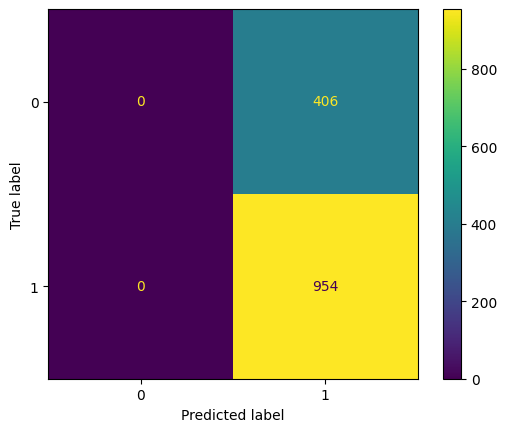

In [64]:
matrix1=confusion_matrix(y_test, y_pred)
ConfusionMatrixDisplay(matrix1).plot()

SVC - bez ošetrenia outlierov a skalovania a word frequency

In [65]:
svc_model = SVC()
svc_model.fit(X_train_combined3, y_train)

SVC()

In [66]:
y_pred_train = svc_model.predict(X_train_combined3)
print("Presnosť:", accuracy_score(y_train, y_pred_train))
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train))

Presnosť: 0.7462168978562421
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.85      0.17      0.28       935
           1       0.74      0.99      0.85      2237

    accuracy                           0.75      3172
   macro avg       0.80      0.58      0.56      3172
weighted avg       0.77      0.75      0.68      3172



In [67]:
y_pred = svc_model.predict(X_test_combined3)
print("Klasifikačný report:\n", classification_report(y_test, y_pred))

Klasifikačný report:
               precision    recall  f1-score   support

           0       0.91      0.18      0.31       406
           1       0.74      0.99      0.85       954

    accuracy                           0.75      1360
   macro avg       0.83      0.59      0.58      1360
weighted avg       0.79      0.75      0.69      1360



In [68]:
results_list1_svc.append({
        'accuracy_train': accuracy_score(y_train, y_pred_train),
    'accuracy_test': accuracy_score(y_test, y_pred),
    'precision_train': precision_score(y_train, y_pred_train, average='binary'),
    'precision_test': precision_score(y_test, y_pred, average='binary'),
 'recall_train': recall_score(y_train, y_pred_train, average='binary'),
 'recall_test': recall_score(y_test, y_pred, average='binary'),
 'f1_train': f1_score(y_train, y_pred_train, average='binary'),
 'f1_test': f1_score(y_test, y_pred, average='binary')
        
    })

In [69]:
accuracy = accuracy_score(y_test, y_pred)
recall = recall_score(y_test, y_pred, average='binary')  # 'macro' pre nevyvážené triedy, 'binary' pre binárnu klasifikáciu
precision = precision_score(y_test, y_pred, average='binary')
f1 = f1_score(y_test, y_pred, average='binary')

print("Accuracy: {:.2f}".format(accuracy))
print("Recall: {:.2f}".format(recall))
print("Precision: {:.2f}".format(precision))
print("F1 Score: {:.2f}".format(f1))

Accuracy: 0.75
Recall: 0.99
Precision: 0.74
F1 Score: 0.85


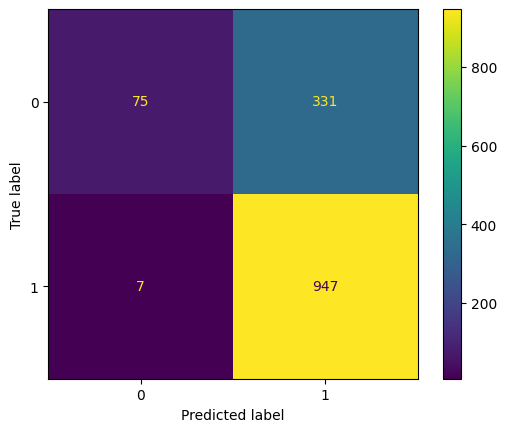

In [70]:
matrix1=confusion_matrix(y_test, y_pred)
ConfusionMatrixDisplay(matrix1).plot()

SVC - bez ošetrenia outlierov a skalovania a tfidf word frequency

In [71]:
svc_model = SVC()
svc_model.fit(X_train_combined4, y_train)

SVC()

In [72]:
y_pred_train = svc_model.predict(X_train_combined4)
print("Presnosť:", accuracy_score(y_train, y_pred_train))
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train))

Presnosť: 0.705233291298865
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.00      0.00      0.00       935
           1       0.71      1.00      0.83      2237

    accuracy                           0.71      3172
   macro avg       0.35      0.50      0.41      3172
weighted avg       0.50      0.71      0.58      3172



C:\Users\danie\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\metrics\_classification.py:1469: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\danie\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\metrics\_classification.py:1469: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\danie\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\metrics\_classification.py:1469: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average,

In [73]:
y_pred = svc_model.predict(X_test_combined4)
print("Klasifikačný report:\n", classification_report(y_test, y_pred))

Klasifikačný report:
               precision    recall  f1-score   support

           0       0.00      0.00      0.00       406
           1       0.70      1.00      0.82       954

    accuracy                           0.70      1360
   macro avg       0.35      0.50      0.41      1360
weighted avg       0.49      0.70      0.58      1360



C:\Users\danie\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\metrics\_classification.py:1469: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\danie\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\metrics\_classification.py:1469: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\danie\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\metrics\_classification.py:1469: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average,

In [74]:
results_list1_svc.append({
        'accuracy_train': accuracy_score(y_train, y_pred_train),
    'accuracy_test': accuracy_score(y_test, y_pred),
    'precision_train': precision_score(y_train, y_pred_train, average='binary'),
    'precision_test': precision_score(y_test, y_pred, average='binary'),
 'recall_train': recall_score(y_train, y_pred_train, average='binary'),
 'recall_test': recall_score(y_test, y_pred, average='binary'),
 'f1_train': f1_score(y_train, y_pred_train, average='binary'),
 'f1_test': f1_score(y_test, y_pred, average='binary')
        
    })

In [75]:
accuracy = accuracy_score(y_test, y_pred)
recall = recall_score(y_test, y_pred, average='binary')  # 'macro' pre nevyvážené triedy, 'binary' pre binárnu klasifikáciu
precision = precision_score(y_test, y_pred, average='binary')
f1 = f1_score(y_test, y_pred, average='binary')

print("Accuracy: {:.2f}".format(accuracy))
print("Recall: {:.2f}".format(recall))
print("Precision: {:.2f}".format(precision))

Accuracy: 0.70
Recall: 1.00
Precision: 0.70


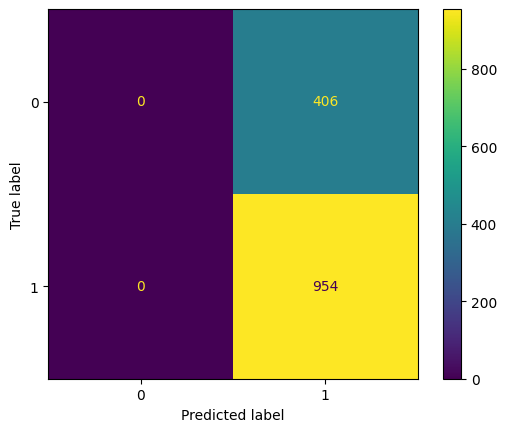

In [76]:
matrix1=confusion_matrix(y_test, y_pred)
ConfusionMatrixDisplay(matrix1).plot()

SVC - s ošetrím outlierov

In [77]:
svc_model = SVC()
svc_model.fit(X_train_out, y_train)

SVC()

In [78]:
y_pred_train = svc_model.predict(X_train_out)
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train))

Klasifikačný report:
               precision    recall  f1-score   support

           0       0.00      0.00      0.00       935
           1       0.71      1.00      0.83      2237

    accuracy                           0.71      3172
   macro avg       0.35      0.50      0.41      3172
weighted avg       0.50      0.71      0.58      3172



C:\Users\danie\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\metrics\_classification.py:1469: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\danie\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\metrics\_classification.py:1469: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\danie\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\metrics\_classification.py:1469: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average,

In [79]:
y_pred = svc_model.predict(X_test_out)
print("Klasifikačný report:\n", classification_report(y_test, y_pred))

Klasifikačný report:
               precision    recall  f1-score   support

           0       0.00      0.00      0.00       406
           1       0.70      1.00      0.82       954

    accuracy                           0.70      1360
   macro avg       0.35      0.50      0.41      1360
weighted avg       0.49      0.70      0.58      1360



C:\Users\danie\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\metrics\_classification.py:1469: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\danie\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\metrics\_classification.py:1469: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\danie\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\metrics\_classification.py:1469: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average,

In [80]:
results_list1_svc.append({
        'accuracy_train': accuracy_score(y_train, y_pred_train),
    'accuracy_test': accuracy_score(y_test, y_pred),
    'precision_train': precision_score(y_train, y_pred_train, average='binary'),
    'precision_test': precision_score(y_test, y_pred, average='binary'),
 'recall_train': recall_score(y_train, y_pred_train, average='binary'),
 'recall_test': recall_score(y_test, y_pred, average='binary'),
 'f1_train': f1_score(y_train, y_pred_train, average='binary'),
 'f1_test': f1_score(y_test, y_pred, average='binary')
        
    })


In [81]:
accuracy = accuracy_score(y_test, y_pred)
recall = recall_score(y_test, y_pred, average='binary')  # 'macro' pre nevyvážené triedy, 'binary' pre binárnu klasifikáciu
precision = precision_score(y_test, y_pred, average='binary')
f1 = f1_score(y_test, y_pred, average='binary')

print("Accuracy: {:.2f}".format(accuracy))
print("Recall: {:.2f}".format(recall))
print("Precision: {:.2f}".format(precision))
print("F1 Score: {:.2f}".format(f1))

Accuracy: 0.70
Recall: 1.00
Precision: 0.70
F1 Score: 0.82


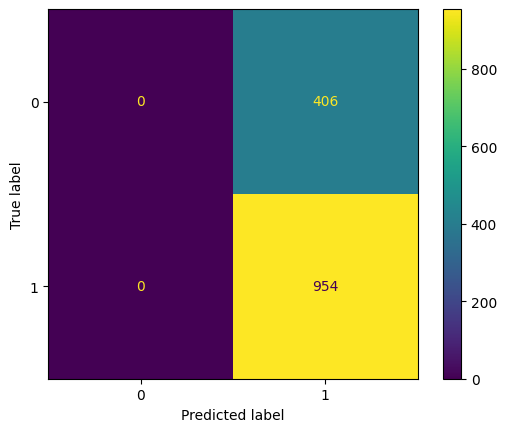

In [82]:
matrix1=confusion_matrix(y_test, y_pred)
ConfusionMatrixDisplay(matrix1).plot()

SVC - s ošetrím outlierov a ngram

In [83]:
svc_model = SVC()
svc_model.fit(X_train_combined_out, y_train)

SVC()

In [84]:
y_pred_train = svc_model.predict(X_train_combined_out)
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train))

Klasifikačný report:
               precision    recall  f1-score   support

           0       0.88      0.25      0.39       935
           1       0.76      0.99      0.86      2237

    accuracy                           0.77      3172
   macro avg       0.82      0.62      0.62      3172
weighted avg       0.79      0.77      0.72      3172



In [85]:
y_pred = svc_model.predict(X_test_combined_out)
print("Klasifikačný report:\n", classification_report(y_test, y_pred))

Klasifikačný report:
               precision    recall  f1-score   support

           0       0.89      0.25      0.39       406
           1       0.75      0.99      0.86       954

    accuracy                           0.77      1360
   macro avg       0.82      0.62      0.62      1360
weighted avg       0.80      0.77      0.72      1360



In [86]:
results_list1_svc.append({
        'accuracy_train': accuracy_score(y_train, y_pred_train),
    'accuracy_test': accuracy_score(y_test, y_pred),
    'precision_train': precision_score(y_train, y_pred_train, average='binary'),
    'precision_test': precision_score(y_test, y_pred, average='binary'),
 'recall_train': recall_score(y_train, y_pred_train, average='binary'),
 'recall_test': recall_score(y_test, y_pred, average='binary'),
 'f1_train': f1_score(y_train, y_pred_train, average='binary'),
 'f1_test': f1_score(y_test, y_pred, average='binary')
        
    })

In [87]:
accuracy = accuracy_score(y_test, y_pred)
recall = recall_score(y_test, y_pred, average='binary')  # 'macro' pre nevyvážené triedy, 'binary' pre binárnu klasifikáciu
precision = precision_score(y_test, y_pred, average='binary')
f1 = f1_score(y_test, y_pred, average='binary')

print("Accuracy: {:.2f}".format(accuracy))
print("Recall: {:.2f}".format(recall))
print("Precision: {:.2f}".format(precision))
print("F1 Score: {:.2f}".format(f1))

Accuracy: 0.77
Recall: 0.99
Precision: 0.75
F1 Score: 0.86


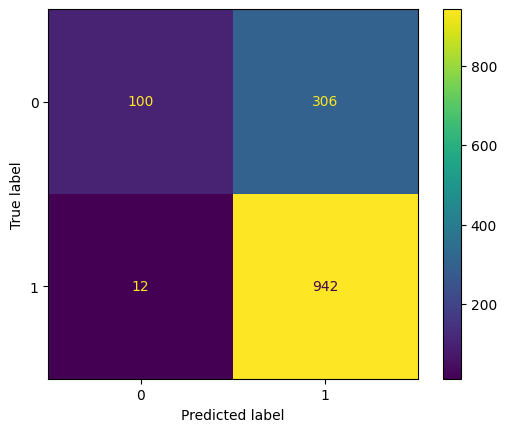

In [88]:
matrix1=confusion_matrix(y_test, y_pred)
ConfusionMatrixDisplay(matrix1).plot()

SVC - s ošetrím outlierov a tfidf ngram

In [89]:
svc_model = SVC()
svc_model.fit(X_train_combined2_out, y_train)

SVC()

In [90]:
y_pred_train = svc_model.predict(X_train_combined2_out)
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train))

Klasifikačný report:
               precision    recall  f1-score   support

           0       0.00      0.00      0.00       935
           1       0.71      1.00      0.83      2237

    accuracy                           0.71      3172
   macro avg       0.35      0.50      0.41      3172
weighted avg       0.50      0.71      0.58      3172



C:\Users\danie\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\metrics\_classification.py:1469: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\danie\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\metrics\_classification.py:1469: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\danie\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\metrics\_classification.py:1469: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average,

In [91]:
y_pred = svc_model.predict(X_test_combined2_out)
print("Klasifikačný report:\n", classification_report(y_test, y_pred))

Klasifikačný report:
               precision    recall  f1-score   support

           0       0.00      0.00      0.00       406
           1       0.70      1.00      0.82       954

    accuracy                           0.70      1360
   macro avg       0.35      0.50      0.41      1360
weighted avg       0.49      0.70      0.58      1360



C:\Users\danie\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\metrics\_classification.py:1469: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\danie\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\metrics\_classification.py:1469: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\danie\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\metrics\_classification.py:1469: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average,

In [92]:
results_list1_svc.append({
        'accuracy_train': accuracy_score(y_train, y_pred_train),
    'accuracy_test': accuracy_score(y_test, y_pred),
    'precision_train': precision_score(y_train, y_pred_train, average='binary'),
    'precision_test': precision_score(y_test, y_pred, average='binary'),
 'recall_train': recall_score(y_train, y_pred_train, average='binary'),
 'recall_test': recall_score(y_test, y_pred, average='binary'),
 'f1_train': f1_score(y_train, y_pred_train, average='binary'),
 'f1_test': f1_score(y_test, y_pred, average='binary')
        
    })

In [93]:
accuracy = accuracy_score(y_test, y_pred)
recall = recall_score(y_test, y_pred, average='binary')  # 'macro' pre nevyvážené triedy, 'binary' pre binárnu klasifikáciu
precision = precision_score(y_test, y_pred, average='binary')
f1 = f1_score(y_test, y_pred, average='binary')

print("Accuracy: {:.2f}".format(accuracy))
print("Recall: {:.2f}".format(recall))
print("Precision: {:.2f}".format(precision))
print("F1 Score: {:.2f}".format(f1))

Accuracy: 0.70
Recall: 1.00
Precision: 0.70
F1 Score: 0.82


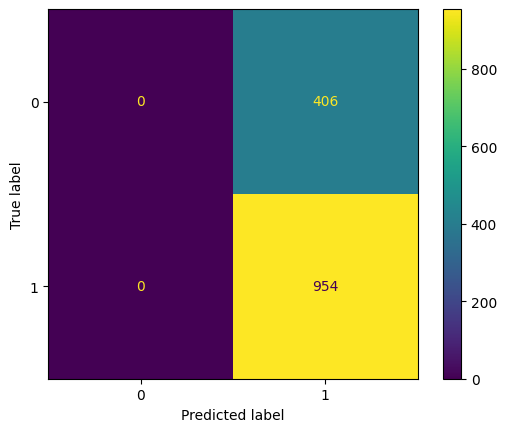

In [94]:
matrix1=confusion_matrix(y_test, y_pred)
ConfusionMatrixDisplay(matrix1).plot()

SVC - s ošetrím outlierov a word frequency

In [95]:
svc_model = SVC()
svc_model.fit(X_train_combined3_out, y_train)

SVC()

In [96]:
y_pred_train = svc_model.predict(X_train_combined3_out)
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train))

Klasifikačný report:
               precision    recall  f1-score   support

           0       0.89      0.22      0.35       935
           1       0.75      0.99      0.85      2237

    accuracy                           0.76      3172
   macro avg       0.82      0.60      0.60      3172
weighted avg       0.79      0.76      0.71      3172



In [97]:
y_pred = svc_model.predict(X_test_combined3_out)
print("Klasifikačný report:\n", classification_report(y_test, y_pred))

Klasifikačný report:
               precision    recall  f1-score   support

           0       0.89      0.22      0.36       406
           1       0.75      0.99      0.85       954

    accuracy                           0.76      1360
   macro avg       0.82      0.61      0.60      1360
weighted avg       0.79      0.76      0.70      1360



In [98]:
results_list1_svc.append({
        'accuracy_train': accuracy_score(y_train, y_pred_train),
    'accuracy_test': accuracy_score(y_test, y_pred),
    'precision_train': precision_score(y_train, y_pred_train, average='binary'),
    'precision_test': precision_score(y_test, y_pred, average='binary'),
 'recall_train': recall_score(y_train, y_pred_train, average='binary'),
 'recall_test': recall_score(y_test, y_pred, average='binary'),
 'f1_train': f1_score(y_train, y_pred_train, average='binary'),
 'f1_test': f1_score(y_test, y_pred, average='binary')
        
    })

In [99]:
accuracy = accuracy_score(y_test, y_pred)
recall = recall_score(y_test, y_pred, average='binary')  # 'macro' pre nevyvážené triedy, 'binary' pre binárnu klasifikáciu
precision = precision_score(y_test, y_pred, average='binary')
f1 = f1_score(y_test, y_pred, average='binary')

print("Accuracy: {:.2f}".format(accuracy))
print("Recall: {:.2f}".format(recall))
print("Precision: {:.2f}".format(precision))
print("F1 Score: {:.2f}".format(f1))

Accuracy: 0.76
Recall: 0.99
Precision: 0.75
F1 Score: 0.85


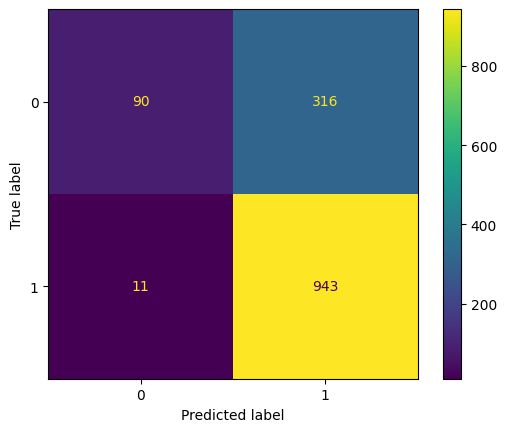

In [100]:
matrix1=confusion_matrix(y_test, y_pred)
ConfusionMatrixDisplay(matrix1).plot()

SVC - s ošetrím outlierov a tfidf word frequency

In [101]:
svc_model = SVC()
svc_model.fit(X_train_combined4_out, y_train)

SVC()

In [102]:
y_pred_train = svc_model.predict(X_train_combined4_out)
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train))

Klasifikačný report:
               precision    recall  f1-score   support

           0       0.00      0.00      0.00       935
           1       0.71      1.00      0.83      2237

    accuracy                           0.71      3172
   macro avg       0.35      0.50      0.41      3172
weighted avg       0.50      0.71      0.58      3172



C:\Users\danie\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\metrics\_classification.py:1469: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\danie\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\metrics\_classification.py:1469: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\danie\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\metrics\_classification.py:1469: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average,

In [103]:
y_pred = svc_model.predict(X_test_combined4_out)
print("Klasifikačný report:\n", classification_report(y_test, y_pred))

Klasifikačný report:
               precision    recall  f1-score   support

           0       0.00      0.00      0.00       406
           1       0.70      1.00      0.82       954

    accuracy                           0.70      1360
   macro avg       0.35      0.50      0.41      1360
weighted avg       0.49      0.70      0.58      1360



C:\Users\danie\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\metrics\_classification.py:1469: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\danie\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\metrics\_classification.py:1469: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\danie\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\metrics\_classification.py:1469: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average,

In [104]:
results_list1_svc.append({
        'accuracy_train': accuracy_score(y_train, y_pred_train),
    'accuracy_test': accuracy_score(y_test, y_pred),
    'precision_train': precision_score(y_train, y_pred_train, average='binary'),
    'precision_test': precision_score(y_test, y_pred, average='binary'),
 'recall_train': recall_score(y_train, y_pred_train, average='binary'),
 'recall_test': recall_score(y_test, y_pred, average='binary'),
 'f1_train': f1_score(y_train, y_pred_train, average='binary'),
 'f1_test': f1_score(y_test, y_pred, average='binary')
        
    })

In [105]:
accuracy = accuracy_score(y_test, y_pred)
recall = recall_score(y_test, y_pred, average='binary')  # 'macro' pre nevyvážené triedy, 'binary' pre binárnu klasifikáciu
precision = precision_score(y_test, y_pred, average='binary')
f1 = f1_score(y_test, y_pred, average='binary')

print("Accuracy: {:.2f}".format(accuracy))
print("Recall: {:.2f}".format(recall))
print("Precision: {:.2f}".format(precision))
print("F1 Score: {:.2f}".format(f1))

Accuracy: 0.70
Recall: 1.00
Precision: 0.70
F1 Score: 0.82


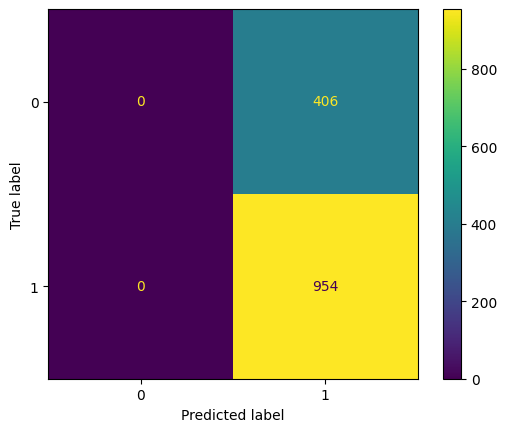

In [106]:
matrix1=confusion_matrix(y_test, y_pred)
ConfusionMatrixDisplay(matrix1).plot()

SVC - so skalovanim

In [107]:
svc_model = SVC()
svc_model.fit(X_train_scaled, y_train)

SVC()

In [108]:
y_pred_train = svc_model.predict(X_train_scaled)
print("Presnosť:", accuracy_score(y_train, y_pred_train))
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train))

Presnosť: 0.705233291298865
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.00      0.00      0.00       935
           1       0.71      1.00      0.83      2237

    accuracy                           0.71      3172
   macro avg       0.35      0.50      0.41      3172
weighted avg       0.50      0.71      0.58      3172



C:\Users\danie\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\metrics\_classification.py:1469: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\danie\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\metrics\_classification.py:1469: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\danie\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\metrics\_classification.py:1469: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average,

In [109]:
y_pred = svc_model.predict(X_test_scaled)
print("Presnosť:", accuracy_score(y_test, y_pred))
print("Klasifikačný report:\n", classification_report(y_test, y_pred))

Presnosť: 0.7014705882352941
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.00      0.00      0.00       406
           1       0.70      1.00      0.82       954

    accuracy                           0.70      1360
   macro avg       0.35      0.50      0.41      1360
weighted avg       0.49      0.70      0.58      1360



C:\Users\danie\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\metrics\_classification.py:1469: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\danie\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\metrics\_classification.py:1469: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\danie\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\metrics\_classification.py:1469: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average,

In [110]:
results_list1_svc.append({
        'accuracy_train': accuracy_score(y_train, y_pred_train),
    'accuracy_test': accuracy_score(y_test, y_pred),
    'precision_train': precision_score(y_train, y_pred_train, average='binary'),
    'precision_test': precision_score(y_test, y_pred, average='binary'),
 'recall_train': recall_score(y_train, y_pred_train, average='binary'),
 'recall_test': recall_score(y_test, y_pred, average='binary'),
 'f1_train': f1_score(y_train, y_pred_train, average='binary'),
 'f1_test': f1_score(y_test, y_pred, average='binary')
        
    })

In [111]:
accuracy = accuracy_score(y_test, y_pred)
recall = recall_score(y_test, y_pred, average='binary')  # 'macro' pre nevyvážené triedy, 'binary' pre binárnu klasifikáciu
precision = precision_score(y_test, y_pred, average='binary')
f1 = f1_score(y_test, y_pred, average='binary')

print("Accuracy: {:.2f}".format(accuracy))
print("Recall: {:.2f}".format(recall))
print("Precision: {:.2f}".format(precision))
print("F1 Score: {:.2f}".format(f1))

Accuracy: 0.70
Recall: 1.00
Precision: 0.70
F1 Score: 0.82


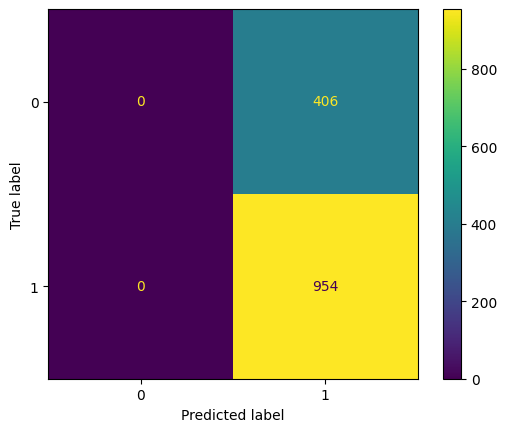

In [112]:
matrix1=confusion_matrix(y_test, y_pred)
ConfusionMatrixDisplay(matrix1).plot()

SVC - so skalovanim a ngram

In [113]:
svc_model = SVC()
svc_model.fit(X_train_combined_scaled, y_train)

SVC()

In [114]:
y_pred_train = svc_model.predict(X_train_combined_scaled)
print("Presnosť:", accuracy_score(y_train, y_pred_train))
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train))

Presnosť: 0.7443253467843631
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.85      0.16      0.27       935
           1       0.74      0.99      0.85      2237

    accuracy                           0.74      3172
   macro avg       0.80      0.57      0.56      3172
weighted avg       0.77      0.74      0.68      3172



In [115]:
y_pred = svc_model.predict(X_test_combined_scaled)
print("Presnosť:", accuracy_score(y_test, y_pred))
print("Klasifikačný report:\n", classification_report(y_test, y_pred))

Presnosť: 0.7477941176470588
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.90      0.17      0.29       406
           1       0.74      0.99      0.85       954

    accuracy                           0.75      1360
   macro avg       0.82      0.58      0.57      1360
weighted avg       0.79      0.75      0.68      1360



In [116]:
results_list1_svc.append({
        'accuracy_train': accuracy_score(y_train, y_pred_train),
    'accuracy_test': accuracy_score(y_test, y_pred),
    'precision_train': precision_score(y_train, y_pred_train, average='binary'),
    'precision_test': precision_score(y_test, y_pred, average='binary'),
 'recall_train': recall_score(y_train, y_pred_train, average='binary'),
 'recall_test': recall_score(y_test, y_pred, average='binary'),
 'f1_train': f1_score(y_train, y_pred_train, average='binary'),
 'f1_test': f1_score(y_test, y_pred, average='binary')
        
    })

In [117]:
accuracy = accuracy_score(y_test, y_pred)
recall = recall_score(y_test, y_pred, average='binary')  # 'macro' pre nevyvážené triedy, 'binary' pre binárnu klasifikáciu
precision = precision_score(y_test, y_pred, average='binary')
f1 = f1_score(y_test, y_pred, average='binary')

print("Accuracy: {:.2f}".format(accuracy))
print("Recall: {:.2f}".format(recall))
print("Precision: {:.2f}".format(precision))
print("F1 Score: {:.2f}".format(f1))

Accuracy: 0.75
Recall: 0.99
Precision: 0.74
F1 Score: 0.85


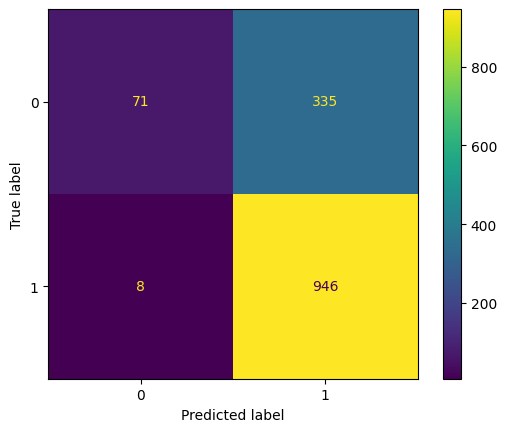

In [118]:
matrix1=confusion_matrix(y_test, y_pred)
ConfusionMatrixDisplay(matrix1).plot()

SVC - so skalovanim a tfidf ngram

In [119]:
svc_model = SVC()
svc_model.fit(X_train_combined2_scaled, y_train)

SVC()

In [120]:
y_pred_train = svc_model.predict(X_train_combined2_scaled)
print("Presnosť:", accuracy_score(y_train, y_pred_train))
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train))

Presnosť: 0.705233291298865
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.00      0.00      0.00       935
           1       0.71      1.00      0.83      2237

    accuracy                           0.71      3172
   macro avg       0.35      0.50      0.41      3172
weighted avg       0.50      0.71      0.58      3172



C:\Users\danie\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\metrics\_classification.py:1469: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\danie\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\metrics\_classification.py:1469: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\danie\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\metrics\_classification.py:1469: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average,

In [121]:
y_pred = svc_model.predict(X_test_combined2_scaled)
print("Presnosť:", accuracy_score(y_test, y_pred))
print("Klasifikačný report:\n", classification_report(y_test, y_pred))

Presnosť: 0.7014705882352941
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.00      0.00      0.00       406
           1       0.70      1.00      0.82       954

    accuracy                           0.70      1360
   macro avg       0.35      0.50      0.41      1360
weighted avg       0.49      0.70      0.58      1360



C:\Users\danie\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\metrics\_classification.py:1469: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\danie\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\metrics\_classification.py:1469: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\danie\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\metrics\_classification.py:1469: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average,

In [122]:
results_list1_svc.append({
        'accuracy_train': accuracy_score(y_train, y_pred_train),
    'accuracy_test': accuracy_score(y_test, y_pred),
    'precision_train': precision_score(y_train, y_pred_train, average='binary'),
    'precision_test': precision_score(y_test, y_pred, average='binary'),
 'recall_train': recall_score(y_train, y_pred_train, average='binary'),
 'recall_test': recall_score(y_test, y_pred, average='binary'),
 'f1_train': f1_score(y_train, y_pred_train, average='binary'),
 'f1_test': f1_score(y_test, y_pred, average='binary')
        
    })

In [123]:
accuracy = accuracy_score(y_test, y_pred)
recall = recall_score(y_test, y_pred, average='binary')  # 'macro' pre nevyvážené triedy, 'binary' pre binárnu klasifikáciu
precision = precision_score(y_test, y_pred, average='binary')
f1 = f1_score(y_test, y_pred, average='binary')

print("Accuracy: {:.2f}".format(accuracy))
print("Recall: {:.2f}".format(recall))
print("Precision: {:.2f}".format(precision))
print("F1 Score: {:.2f}".format(f1))

Accuracy: 0.70
Recall: 1.00
Precision: 0.70
F1 Score: 0.82


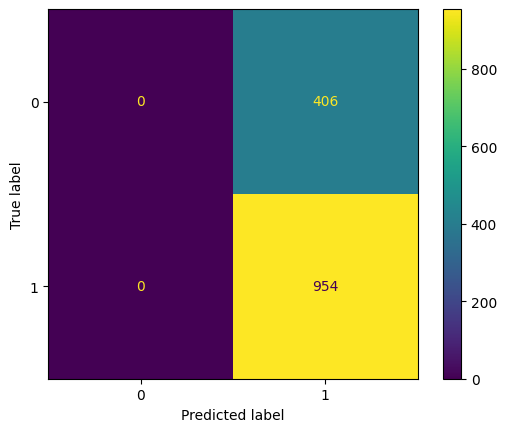

In [124]:
matrix1=confusion_matrix(y_test, y_pred)
ConfusionMatrixDisplay(matrix1).plot()

SVC - so skalovanim a word frequency

In [125]:
svc_model = SVC()
svc_model.fit(X_train_combined3_scaled, y_train)

SVC()

In [126]:
y_pred_train = svc_model.predict(X_train_combined3_scaled)
print("Presnosť:", accuracy_score(y_train, y_pred_train))
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train))

Presnosť: 0.7317150063051703
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.86      0.11      0.19       935
           1       0.73      0.99      0.84      2237

    accuracy                           0.73      3172
   macro avg       0.79      0.55      0.51      3172
weighted avg       0.77      0.73      0.65      3172



In [127]:
y_pred = svc_model.predict(X_test_combined3_scaled)
print("Presnosť:", accuracy_score(y_test, y_pred))
print("Klasifikačný report:\n", classification_report(y_test, y_pred))

Presnosť: 0.736764705882353
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.91      0.13      0.23       406
           1       0.73      0.99      0.84       954

    accuracy                           0.74      1360
   macro avg       0.82      0.56      0.53      1360
weighted avg       0.78      0.74      0.66      1360



In [128]:
results_list1_svc.append({
        'accuracy_train': accuracy_score(y_train, y_pred_train),
    'accuracy_test': accuracy_score(y_test, y_pred),
    'precision_train': precision_score(y_train, y_pred_train, average='binary'),
    'precision_test': precision_score(y_test, y_pred, average='binary'),
 'recall_train': recall_score(y_train, y_pred_train, average='binary'),
 'recall_test': recall_score(y_test, y_pred, average='binary'),
 'f1_train': f1_score(y_train, y_pred_train, average='binary'),
 'f1_test': f1_score(y_test, y_pred, average='binary')
        
    })

In [129]:
accuracy = accuracy_score(y_test, y_pred)
recall = recall_score(y_test, y_pred, average='binary')  # 'macro' pre nevyvážené triedy, 'binary' pre binárnu klasifikáciu
precision = precision_score(y_test, y_pred, average='binary')
f1 = f1_score(y_test, y_pred, average='binary')

print("Accuracy: {:.2f}".format(accuracy))
print("Recall: {:.2f}".format(recall))
print("Precision: {:.2f}".format(precision))
print("F1 Score: {:.2f}".format(f1))

Accuracy: 0.74
Recall: 0.99
Precision: 0.73
F1 Score: 0.84


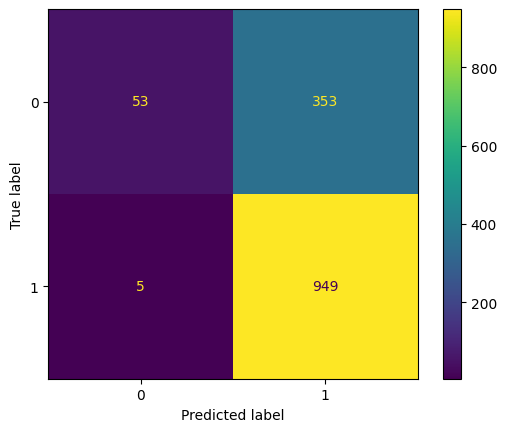

In [130]:
matrix1=confusion_matrix(y_test, y_pred)
ConfusionMatrixDisplay(matrix1).plot()

SVC - so skalovanim a tfidf word frequency

In [131]:
svc_model = SVC()
svc_model.fit(X_train_combined4_scaled, y_train)

SVC()

In [132]:
y_pred_train = svc_model.predict(X_train_combined4_scaled)
print("Presnosť:", accuracy_score(y_train, y_pred_train))
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train))

Presnosť: 0.705233291298865
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.00      0.00      0.00       935
           1       0.71      1.00      0.83      2237

    accuracy                           0.71      3172
   macro avg       0.35      0.50      0.41      3172
weighted avg       0.50      0.71      0.58      3172



C:\Users\danie\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\metrics\_classification.py:1469: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\danie\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\metrics\_classification.py:1469: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\danie\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\metrics\_classification.py:1469: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average,

In [133]:
y_pred = svc_model.predict(X_test_combined4_scaled)
print("Presnosť:", accuracy_score(y_test, y_pred))
print("Klasifikačný report:\n", classification_report(y_test, y_pred))

Presnosť: 0.7014705882352941
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.00      0.00      0.00       406
           1       0.70      1.00      0.82       954

    accuracy                           0.70      1360
   macro avg       0.35      0.50      0.41      1360
weighted avg       0.49      0.70      0.58      1360



C:\Users\danie\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\metrics\_classification.py:1469: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\danie\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\metrics\_classification.py:1469: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\danie\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\metrics\_classification.py:1469: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average,

In [134]:
results_list1_svc.append({
        'accuracy_train': accuracy_score(y_train, y_pred_train),
    'accuracy_test': accuracy_score(y_test, y_pred),
    'precision_train': precision_score(y_train, y_pred_train, average='binary'),
    'precision_test': precision_score(y_test, y_pred, average='binary'),
 'recall_train': recall_score(y_train, y_pred_train, average='binary'),
 'recall_test': recall_score(y_test, y_pred, average='binary'),
 'f1_train': f1_score(y_train, y_pred_train, average='binary'),
 'f1_test': f1_score(y_test, y_pred, average='binary')
        
    })

In [135]:
accuracy = accuracy_score(y_test, y_pred)
recall = recall_score(y_test, y_pred, average='binary')  # 'macro' pre nevyvážené triedy, 'binary' pre binárnu klasifikáciu
precision = precision_score(y_test, y_pred, average='binary')
f1 = f1_score(y_test, y_pred, average='binary')

print("Accuracy: {:.2f}".format(accuracy))
print("Recall: {:.2f}".format(recall))
print("Precision: {:.2f}".format(precision))
print("F1 Score: {:.2f}".format(f1))

Accuracy: 0.70
Recall: 1.00
Precision: 0.70
F1 Score: 0.82


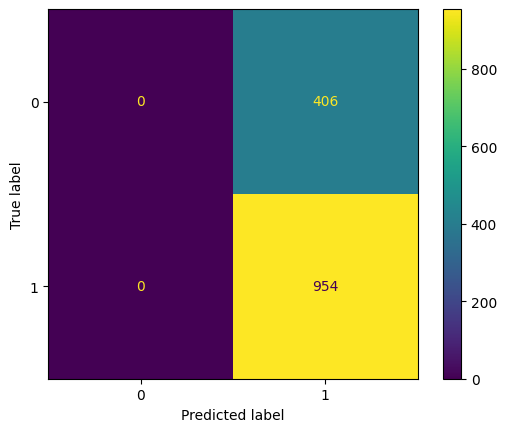

In [136]:
matrix1=confusion_matrix(y_test, y_pred)
ConfusionMatrixDisplay(matrix1).plot()

SVC - s ošetrim outlierov a skalovanim

In [137]:
svc_model = SVC()
svc_model.fit(X_train_scal_out, y_train)

SVC()

In [138]:
y_pred_train = svc_model.predict(X_train_scal_out)
print("Presnosť:", accuracy_score(y_train, y_pred_train))
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train))

Presnosť: 0.705233291298865
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.00      0.00      0.00       935
           1       0.71      1.00      0.83      2237

    accuracy                           0.71      3172
   macro avg       0.35      0.50      0.41      3172
weighted avg       0.50      0.71      0.58      3172



C:\Users\danie\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\metrics\_classification.py:1469: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\danie\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\metrics\_classification.py:1469: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\danie\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\metrics\_classification.py:1469: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average,

In [139]:
y_pred = svc_model.predict(X_test_scal_out)
print("Presnosť:", accuracy_score(y_test, y_pred))
print("Klasifikačný report:\n", classification_report(y_test, y_pred))

Presnosť: 0.7014705882352941
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.00      0.00      0.00       406
           1       0.70      1.00      0.82       954

    accuracy                           0.70      1360
   macro avg       0.35      0.50      0.41      1360
weighted avg       0.49      0.70      0.58      1360



C:\Users\danie\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\metrics\_classification.py:1469: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\danie\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\metrics\_classification.py:1469: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\danie\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\metrics\_classification.py:1469: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average,

In [140]:
results_list1_svc.append({
        'accuracy_train': accuracy_score(y_train, y_pred_train),
    'accuracy_test': accuracy_score(y_test, y_pred),
    'precision_train': precision_score(y_train, y_pred_train, average='binary'),
    'precision_test': precision_score(y_test, y_pred, average='binary'),
 'recall_train': recall_score(y_train, y_pred_train, average='binary'),
 'recall_test': recall_score(y_test, y_pred, average='binary'),
 'f1_train': f1_score(y_train, y_pred_train, average='binary'),
 'f1_test': f1_score(y_test, y_pred, average='binary')
        
    })


In [141]:
accuracy = accuracy_score(y_test, y_pred)
recall = recall_score(y_test, y_pred, average='binary')  # 'macro' pre nevyvážené triedy
precision = precision_score(y_test, y_pred, average='binary')
f1 = f1_score(y_test, y_pred, average='binary')

print("Accuracy: {:.2f}".format(accuracy))
print("Recall: {:.2f}".format(recall))
print("Precision: {:.2f}".format(precision))
print("F1 Score: {:.2f}".format(f1))

Accuracy: 0.70
Recall: 1.00
Precision: 0.70
F1 Score: 0.82


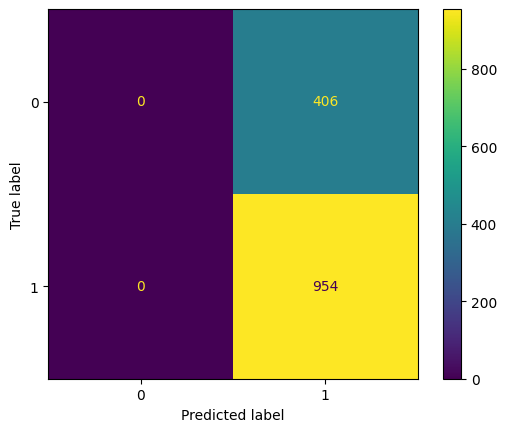

In [142]:
matrix1=confusion_matrix(y_test, y_pred)
ConfusionMatrixDisplay(matrix1).plot()

SVC - s ošetrim outlierov a skalovanim a ngram

In [143]:
svc_model = SVC()
svc_model.fit(X_train_combined_scal_out, y_train)

SVC()

In [144]:
y_pred_train = svc_model.predict(X_train_combined_scal_out)
print("Presnosť:", accuracy_score(y_train, y_pred_train))
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train))

Presnosť: 0.7689155107187894
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.88      0.25      0.39       935
           1       0.76      0.99      0.86      2237

    accuracy                           0.77      3172
   macro avg       0.82      0.62      0.62      3172
weighted avg       0.79      0.77      0.72      3172



In [145]:
y_pred = svc_model.predict(X_test_combined_scal_out)
print("Presnosť:", accuracy_score(y_test, y_pred))
print("Klasifikačný report:\n", classification_report(y_test, y_pred))

Presnosť: 0.7661764705882353
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.89      0.25      0.39       406
           1       0.75      0.99      0.86       954

    accuracy                           0.77      1360
   macro avg       0.82      0.62      0.62      1360
weighted avg       0.80      0.77      0.72      1360



In [146]:
results_list1_svc.append({
        'accuracy_train': accuracy_score(y_train, y_pred_train),
    'accuracy_test': accuracy_score(y_test, y_pred),
    'precision_train': precision_score(y_train, y_pred_train, average='binary'),
    'precision_test': precision_score(y_test, y_pred, average='binary'),
 'recall_train': recall_score(y_train, y_pred_train, average='binary'),
 'recall_test': recall_score(y_test, y_pred, average='binary'),
 'f1_train': f1_score(y_train, y_pred_train, average='binary'),
 'f1_test': f1_score(y_test, y_pred, average='binary')
        
    })

In [147]:
accuracy = accuracy_score(y_test, y_pred)
recall = recall_score(y_test, y_pred, average='binary')  # 'macro' pre nevyvážené triedy
precision = precision_score(y_test, y_pred, average='binary')
f1 = f1_score(y_test, y_pred, average='binary')

print("Accuracy: {:.2f}".format(accuracy))
print("Recall: {:.2f}".format(recall))
print("Precision: {:.2f}".format(precision))
print("F1 Score: {:.2f}".format(f1))

Accuracy: 0.77
Recall: 0.99
Precision: 0.75
F1 Score: 0.86


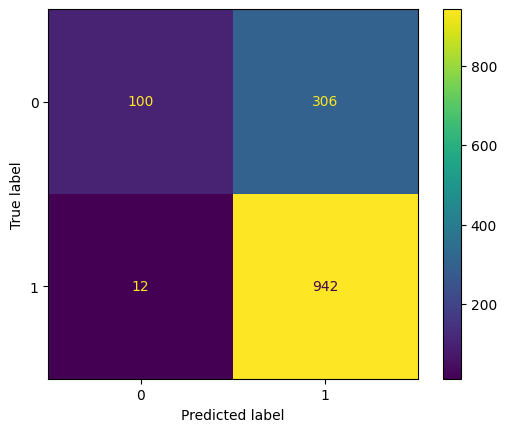

In [148]:
matrix1=confusion_matrix(y_test, y_pred)
ConfusionMatrixDisplay(matrix1).plot()

SVC - s ošetrim outlierov a skalovanim a tfidf ngram

In [149]:
svc_model = SVC()
svc_model.fit(X_train_combined2_scal_out, y_train)

SVC()

In [150]:
y_pred_train = svc_model.predict(X_train_combined2_scal_out)
print("Presnosť:", accuracy_score(y_train, y_pred_train))
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train))

Presnosť: 0.705233291298865
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.00      0.00      0.00       935
           1       0.71      1.00      0.83      2237

    accuracy                           0.71      3172
   macro avg       0.35      0.50      0.41      3172
weighted avg       0.50      0.71      0.58      3172



C:\Users\danie\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\metrics\_classification.py:1469: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\danie\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\metrics\_classification.py:1469: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\danie\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\metrics\_classification.py:1469: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average,

In [151]:
y_pred = svc_model.predict(X_test_combined2_scal_out)
print("Presnosť:", accuracy_score(y_test, y_pred))
print("Klasifikačný report:\n", classification_report(y_test, y_pred))

Presnosť: 0.7014705882352941
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.00      0.00      0.00       406
           1       0.70      1.00      0.82       954

    accuracy                           0.70      1360
   macro avg       0.35      0.50      0.41      1360
weighted avg       0.49      0.70      0.58      1360



C:\Users\danie\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\metrics\_classification.py:1469: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\danie\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\metrics\_classification.py:1469: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\danie\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\metrics\_classification.py:1469: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average,

In [152]:
results_list1_svc.append({
        'accuracy_train': accuracy_score(y_train, y_pred_train),
    'accuracy_test': accuracy_score(y_test, y_pred),
    'precision_train': precision_score(y_train, y_pred_train, average='binary'),
    'precision_test': precision_score(y_test, y_pred, average='binary'),
 'recall_train': recall_score(y_train, y_pred_train, average='binary'),
 'recall_test': recall_score(y_test, y_pred, average='binary'),
 'f1_train': f1_score(y_train, y_pred_train, average='binary'),
 'f1_test': f1_score(y_test, y_pred, average='binary')
        
    })

In [153]:
accuracy = accuracy_score(y_test, y_pred)
recall = recall_score(y_test, y_pred, average='binary')  # 'macro' pre nevyvážené triedy
precision = precision_score(y_test, y_pred, average='binary')
f1 = f1_score(y_test, y_pred, average='binary')

print("Accuracy: {:.2f}".format(accuracy))
print("Recall: {:.2f}".format(recall))
print("Precision: {:.2f}".format(precision))
print("F1 Score: {:.2f}".format(f1))

Accuracy: 0.70
Recall: 1.00
Precision: 0.70
F1 Score: 0.82


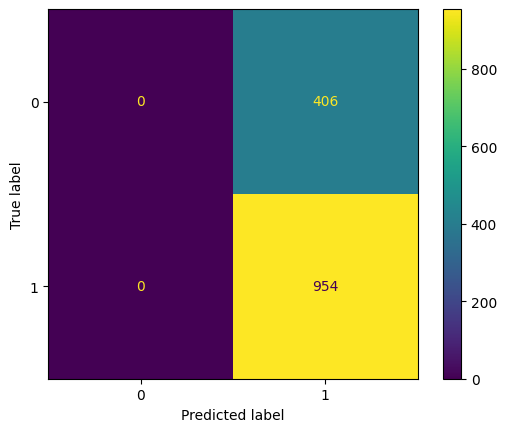

In [154]:
matrix1=confusion_matrix(y_test, y_pred)
ConfusionMatrixDisplay(matrix1).plot()

SVC - s ošetrim outlierov a skalovanim a word frequency

In [155]:
svc_model = SVC()
svc_model.fit(X_train_combined3_scal_out, y_train)

SVC()

In [156]:
y_pred_train = svc_model.predict(X_train_combined3_scal_out)
print("Presnosť:", accuracy_score(y_train, y_pred_train))
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train))

Presnosť: 0.7622950819672131
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.89      0.22      0.35       935
           1       0.75      0.99      0.85      2237

    accuracy                           0.76      3172
   macro avg       0.82      0.60      0.60      3172
weighted avg       0.79      0.76      0.71      3172



In [157]:
y_pred = svc_model.predict(X_test_combined3_scal_out)
print("Presnosť:", accuracy_score(y_test, y_pred))
print("Klasifikačný report:\n", classification_report(y_test, y_pred))

Presnosť: 0.7595588235294117
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.89      0.22      0.36       406
           1       0.75      0.99      0.85       954

    accuracy                           0.76      1360
   macro avg       0.82      0.61      0.60      1360
weighted avg       0.79      0.76      0.70      1360



In [158]:
results_list1_svc.append({
        'accuracy_train': accuracy_score(y_train, y_pred_train),
    'accuracy_test': accuracy_score(y_test, y_pred),
    'precision_train': precision_score(y_train, y_pred_train, average='binary'),
    'precision_test': precision_score(y_test, y_pred, average='binary'),
 'recall_train': recall_score(y_train, y_pred_train, average='binary'),
 'recall_test': recall_score(y_test, y_pred, average='binary'),
 'f1_train': f1_score(y_train, y_pred_train, average='binary'),
 'f1_test': f1_score(y_test, y_pred, average='binary')
        
    })

In [159]:
accuracy = accuracy_score(y_test, y_pred)
recall = recall_score(y_test, y_pred, average='binary')  # 'macro' pre nevyvážené triedy
precision = precision_score(y_test, y_pred, average='binary')
f1 = f1_score(y_test, y_pred, average='binary')

print("Accuracy: {:.2f}".format(accuracy))
print("Recall: {:.2f}".format(recall))
print("Precision: {:.2f}".format(precision))
print("F1 Score: {:.2f}".format(f1))

Accuracy: 0.76
Recall: 0.99
Precision: 0.75
F1 Score: 0.85


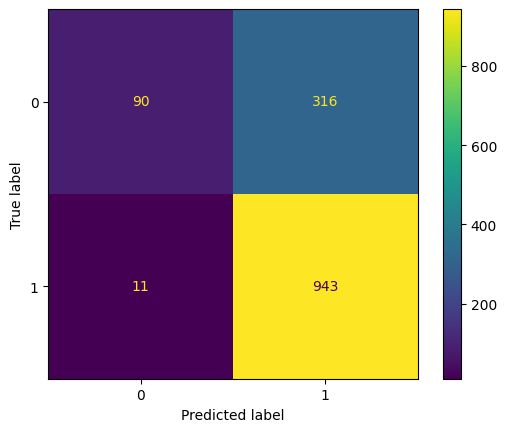

In [160]:
matrix1=confusion_matrix(y_test, y_pred)
ConfusionMatrixDisplay(matrix1).plot()

SVC - s ošetrim outlierov a skalovanim a tfidf word frequency

In [161]:
svc_model = SVC()
svc_model.fit(X_train_combined4_scal_out, y_train)

SVC()

In [162]:
y_pred_train = svc_model.predict(X_train_combined4_scal_out)
print("Presnosť:", accuracy_score(y_train, y_pred_train))
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train))

Presnosť: 0.705233291298865
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.00      0.00      0.00       935
           1       0.71      1.00      0.83      2237

    accuracy                           0.71      3172
   macro avg       0.35      0.50      0.41      3172
weighted avg       0.50      0.71      0.58      3172



C:\Users\danie\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\metrics\_classification.py:1469: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\danie\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\metrics\_classification.py:1469: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\danie\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\metrics\_classification.py:1469: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average,

In [163]:
y_pred = svc_model.predict(X_test_combined4_scal_out)
print("Presnosť:", accuracy_score(y_test, y_pred))
print("Klasifikačný report:\n", classification_report(y_test, y_pred))

Presnosť: 0.7014705882352941
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.00      0.00      0.00       406
           1       0.70      1.00      0.82       954

    accuracy                           0.70      1360
   macro avg       0.35      0.50      0.41      1360
weighted avg       0.49      0.70      0.58      1360



C:\Users\danie\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\metrics\_classification.py:1469: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\danie\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\metrics\_classification.py:1469: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\danie\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\metrics\_classification.py:1469: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average,

In [164]:
results_list1_svc.append({
        'accuracy_train': accuracy_score(y_train, y_pred_train),
    'accuracy_test': accuracy_score(y_test, y_pred),
    'precision_train': precision_score(y_train, y_pred_train, average='binary'),
    'precision_test': precision_score(y_test, y_pred, average='binary'),
 'recall_train': recall_score(y_train, y_pred_train, average='binary'),
 'recall_test': recall_score(y_test, y_pred, average='binary'),
 'f1_train': f1_score(y_train, y_pred_train, average='binary'),
 'f1_test': f1_score(y_test, y_pred, average='binary')
        
    })

In [165]:
accuracy = accuracy_score(y_test, y_pred)
recall = recall_score(y_test, y_pred, average='binary')  # 'macro' pre nevyvážené triedy
precision = precision_score(y_test, y_pred, average='binary')
f1 = f1_score(y_test, y_pred, average='binary')

print("Accuracy: {:.2f}".format(accuracy))
print("Recall: {:.2f}".format(recall))
print("Precision: {:.2f}".format(precision))
print("F1 Score: {:.2f}".format(f1))

Accuracy: 0.70
Recall: 1.00
Precision: 0.70
F1 Score: 0.82


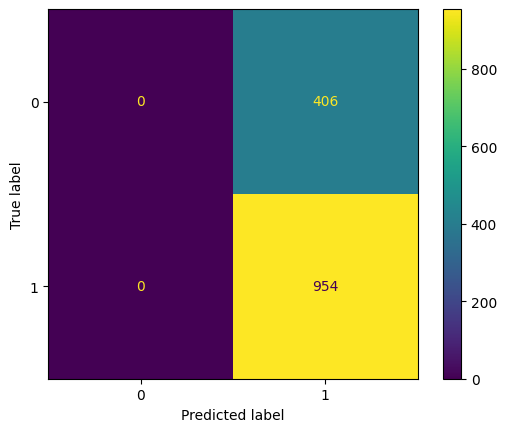

In [166]:
matrix1=confusion_matrix(y_test, y_pred)
ConfusionMatrixDisplay(matrix1).plot()

In [167]:
results_svc1 = pd.DataFrame(results_list1_svc)
print(results_svc1)

    accuracy_train  accuracy_test  precision_train  precision_test  \
0         0.705233       0.701471         0.705233        0.701471   
1         0.757881       0.760294         0.749745        0.748811   
2         0.705233       0.701471         0.705233        0.701471   
3         0.746217       0.751471         0.739625        0.741002   
4         0.705233       0.701471         0.705233        0.701471   
5         0.705233       0.701471         0.705233        0.701471   
6         0.768916       0.766176         0.758775        0.754808   
7         0.705233       0.701471         0.705233        0.701471   
8         0.762295       0.759559         0.752125        0.749007   
9         0.705233       0.701471         0.705233        0.701471   
10        0.705233       0.701471         0.705233        0.701471   
11        0.744325       0.747794         0.737984        0.738486   
12        0.705233       0.701471         0.705233        0.701471   
13        0.731715  

Podľa výsledkov po prvom testovani svc môžeme vidieť, že najlepší výsledok mal dataset s ošetrenými outliermi s ngram a s ošetrenými outliermi so skalovanim s ngram. Takže je zrejme, že najväčší vplyv na úspešnosť malo ošetrenie outlierov a pridanie textovej reprezentácie n-gram alebo word frequency. Aj ked sme použili všetký dáta, tak model nevyzerá byť pretrénovaný, kedže trénovacie accuracy nie je priveľmi vysoké oproti trénovacému accuracy.

RANDOM FOREST - bez ošetrenia outlierov a skalovania

In [168]:
results_list1_rf=[]#na ukladanie trenovacej a testovacej accuracy

Trenovanie modelu na trenovacich datach

In [169]:
rf_model = RandomForestClassifier()
rf_model.fit(X_train, y_train)

RandomForestClassifier()

Predikovanie na trenovacich datach

In [170]:
y_pred_train = rf_model.predict(X_train)
print("Presnosť:", accuracy_score(y_train, y_pred_train))
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train))

Presnosť: 1.0
Klasifikačný report:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00       935
           1       1.00      1.00      1.00      2237

    accuracy                           1.00      3172
   macro avg       1.00      1.00      1.00      3172
weighted avg       1.00      1.00      1.00      3172



Predikovanie na testovacich datach

In [171]:
y_pred = rf_model.predict(X_test)
print("Presnosť:", accuracy_score(y_test, y_pred))
print("Klasifikačný report:\n", classification_report(y_test, y_pred))

Presnosť: 0.7691176470588236
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.74      0.35      0.47       406
           1       0.77      0.95      0.85       954

    accuracy                           0.77      1360
   macro avg       0.76      0.65      0.66      1360
weighted avg       0.76      0.77      0.74      1360



In [172]:
results_list1_rf.append({
        'accuracy_train': accuracy_score(y_train, y_pred_train),
    'accuracy_test': accuracy_score(y_test, y_pred),
    'precision_train': precision_score(y_train, y_pred_train, average='binary'),
    'precision_test': precision_score(y_test, y_pred, average='binary'),
 'recall_train': recall_score(y_train, y_pred_train, average='binary'),
 'recall_test': recall_score(y_test, y_pred, average='binary'),
 'f1_train': f1_score(y_train, y_pred_train, average='binary'),
 'f1_test': f1_score(y_test, y_pred, average='binary')
        
    })


Zobrazenie metrik

In [173]:
accuracy = accuracy_score(y_test, y_pred)
recall = recall_score(y_test, y_pred, average='binary')  # 'macro' pre nevyvážené triedy, 'binary' pre binárnu klasifikáciu
precision = precision_score(y_test, y_pred, average='binary')
f1 = f1_score(y_test, y_pred, average='binary')

print("Accuracy: {:.2f}".format(accuracy))
print("Recall: {:.2f}".format(recall))
print("Precision: {:.2f}".format(precision))
print("F1 Score: {:.2f}".format(f1))

Accuracy: 0.77
Recall: 0.95
Precision: 0.77
F1 Score: 0.85


Vizualizácia výkonnosti modelu

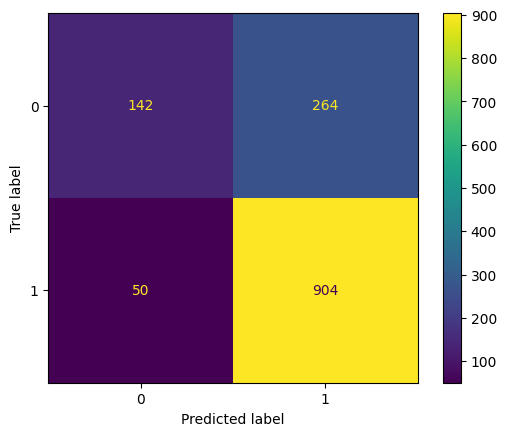

In [174]:
matrix1=confusion_matrix(y_test, y_pred)
ConfusionMatrixDisplay(matrix1).plot()

RANDOM FOREST - bez ošetrenia outlierov a skalovania a ngram

In [175]:
rf_model = RandomForestClassifier()
rf_model.fit(X_train_combined, y_train)

RandomForestClassifier()

In [176]:
y_pred_train = rf_model.predict(X_train_combined)
print("Presnosť:", accuracy_score(y_train, y_pred_train))
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train))

Presnosť: 1.0
Klasifikačný report:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00       935
           1       1.00      1.00      1.00      2237

    accuracy                           1.00      3172
   macro avg       1.00      1.00      1.00      3172
weighted avg       1.00      1.00      1.00      3172



In [177]:
y_pred = rf_model.predict(X_test_combined)
print("Presnosť:", accuracy_score(y_test, y_pred))
print("Klasifikačný report:\n", classification_report(y_test, y_pred))

Presnosť: 0.8470588235294118
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.89      0.56      0.68       406
           1       0.84      0.97      0.90       954

    accuracy                           0.85      1360
   macro avg       0.86      0.76      0.79      1360
weighted avg       0.85      0.85      0.84      1360



In [178]:
results_list1_rf.append({
        'accuracy_train': accuracy_score(y_train, y_pred_train),
    'accuracy_test': accuracy_score(y_test, y_pred),
    'precision_train': precision_score(y_train, y_pred_train, average='binary'),
    'precision_test': precision_score(y_test, y_pred, average='binary'),
 'recall_train': recall_score(y_train, y_pred_train, average='binary'),
 'recall_test': recall_score(y_test, y_pred, average='binary'),
 'f1_train': f1_score(y_train, y_pred_train, average='binary'),
 'f1_test': f1_score(y_test, y_pred, average='binary')
        
    })

In [179]:
accuracy = accuracy_score(y_test, y_pred)
recall = recall_score(y_test, y_pred, average='binary')  # 'macro' pre nevyvážené triedy, 'binary' pre binárnu klasifikáciu
precision = precision_score(y_test, y_pred, average='binary')
f1 = f1_score(y_test, y_pred, average='binary')

print("Accuracy: {:.2f}".format(accuracy))
print("Recall: {:.2f}".format(recall))
print("Precision: {:.2f}".format(precision))
print("F1 Score: {:.2f}".format(f1))

Accuracy: 0.85
Recall: 0.97
Precision: 0.84
F1 Score: 0.90


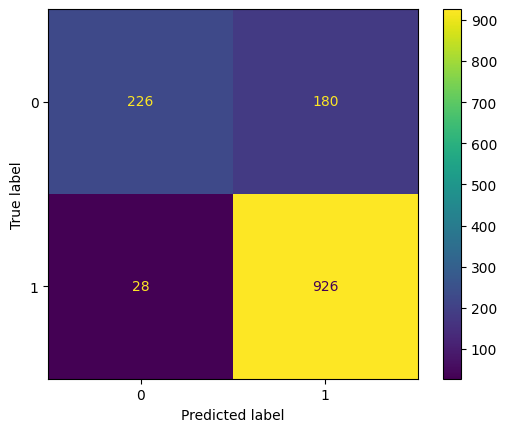

In [180]:
matrix1=confusion_matrix(y_test, y_pred)
ConfusionMatrixDisplay(matrix1).plot()

RANDOM FOREST - bez ošetrenia outlierov a skalovania a tfidf ngram

In [181]:
rf_model = RandomForestClassifier()
rf_model.fit(X_train_combined2, y_train)

RandomForestClassifier()

In [182]:
y_pred_train = rf_model.predict(X_train_combined2)
print("Presnosť:", accuracy_score(y_train, y_pred_train))
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train))

Presnosť: 1.0
Klasifikačný report:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00       935
           1       1.00      1.00      1.00      2237

    accuracy                           1.00      3172
   macro avg       1.00      1.00      1.00      3172
weighted avg       1.00      1.00      1.00      3172



In [183]:
y_pred = rf_model.predict(X_test_combined2)
print("Presnosť:", accuracy_score(y_test, y_pred))
print("Klasifikačný report:\n", classification_report(y_test, y_pred))

Presnosť: 0.8492647058823529
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.89      0.56      0.69       406
           1       0.84      0.97      0.90       954

    accuracy                           0.85      1360
   macro avg       0.87      0.77      0.80      1360
weighted avg       0.85      0.85      0.84      1360



In [184]:
results_list1_rf.append({
        'accuracy_train': accuracy_score(y_train, y_pred_train),
    'accuracy_test': accuracy_score(y_test, y_pred),
    'precision_train': precision_score(y_train, y_pred_train, average='binary'),
    'precision_test': precision_score(y_test, y_pred, average='binary'),
 'recall_train': recall_score(y_train, y_pred_train, average='binary'),
 'recall_test': recall_score(y_test, y_pred, average='binary'),
 'f1_train': f1_score(y_train, y_pred_train, average='binary'),
 'f1_test': f1_score(y_test, y_pred, average='binary')
        
    })

In [185]:
accuracy = accuracy_score(y_test, y_pred)
recall = recall_score(y_test, y_pred, average='binary')  # 'macro' pre nevyvážené triedy, 'binary' pre binárnu klasifikáciu
precision = precision_score(y_test, y_pred, average='binary')
f1 = f1_score(y_test, y_pred, average='binary')

print("Accuracy: {:.2f}".format(accuracy))
print("Recall: {:.2f}".format(recall))
print("Precision: {:.2f}".format(precision))
print("F1 Score: {:.2f}".format(f1))

Accuracy: 0.85
Recall: 0.97
Precision: 0.84
F1 Score: 0.90


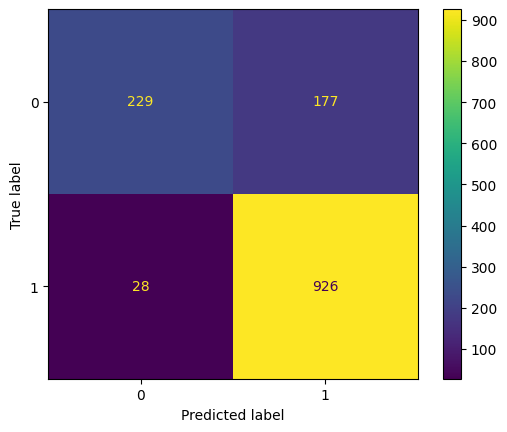

In [186]:
matrix1=confusion_matrix(y_test, y_pred)
ConfusionMatrixDisplay(matrix1).plot()

RANDOM FOREST - bez ošetrenia outlierov a skalovania a word frequency

In [187]:
rf_model = RandomForestClassifier()
rf_model.fit(X_train_combined3, y_train)

RandomForestClassifier()

In [188]:
y_pred_train = rf_model.predict(X_train_combined3)
print("Presnosť:", accuracy_score(y_train, y_pred_train))
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train))

Presnosť: 1.0
Klasifikačný report:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00       935
           1       1.00      1.00      1.00      2237

    accuracy                           1.00      3172
   macro avg       1.00      1.00      1.00      3172
weighted avg       1.00      1.00      1.00      3172



In [189]:
y_pred = rf_model.predict(X_test_combined3)
print("Presnosť:", accuracy_score(y_test, y_pred))
print("Klasifikačný report:\n", classification_report(y_test, y_pred))

Presnosť: 0.8463235294117647
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.91      0.54      0.68       406
           1       0.83      0.98      0.90       954

    accuracy                           0.85      1360
   macro avg       0.87      0.76      0.79      1360
weighted avg       0.85      0.85      0.83      1360



In [190]:
results_list1_rf.append({
        'accuracy_train': accuracy_score(y_train, y_pred_train),
    'accuracy_test': accuracy_score(y_test, y_pred),
    'precision_train': precision_score(y_train, y_pred_train, average='binary'),
    'precision_test': precision_score(y_test, y_pred, average='binary'),
 'recall_train': recall_score(y_train, y_pred_train, average='binary'),
 'recall_test': recall_score(y_test, y_pred, average='binary'),
 'f1_train': f1_score(y_train, y_pred_train, average='binary'),
 'f1_test': f1_score(y_test, y_pred, average='binary')
        
    })

In [191]:
accuracy = accuracy_score(y_test, y_pred)
recall = recall_score(y_test, y_pred, average='binary')  # 'macro' pre nevyvážené triedy, 'binary' pre binárnu klasifikáciu
precision = precision_score(y_test, y_pred, average='binary')
f1 = f1_score(y_test, y_pred, average='binary')

print("Accuracy: {:.2f}".format(accuracy))
print("Recall: {:.2f}".format(recall))
print("Precision: {:.2f}".format(precision))
print("F1 Score: {:.2f}".format(f1))

Accuracy: 0.85
Recall: 0.98
Precision: 0.83
F1 Score: 0.90


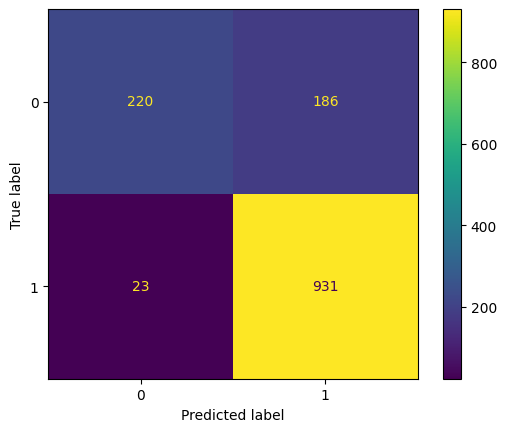

In [192]:
matrix1=confusion_matrix(y_test, y_pred)
ConfusionMatrixDisplay(matrix1).plot()

RANDOM FOREST - bez ošetrenia outlierov a skalovania a tfidf word frequency

In [193]:
rf_model = RandomForestClassifier()
rf_model.fit(X_train_combined4, y_train)

RandomForestClassifier()

In [194]:
y_pred_train = rf_model.predict(X_train_combined4)
print("Presnosť:", accuracy_score(y_train, y_pred_train))
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train))

Presnosť: 1.0
Klasifikačný report:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00       935
           1       1.00      1.00      1.00      2237

    accuracy                           1.00      3172
   macro avg       1.00      1.00      1.00      3172
weighted avg       1.00      1.00      1.00      3172



In [195]:
y_pred = rf_model.predict(X_test_combined4)
print("Presnosť:", accuracy_score(y_test, y_pred))
print("Klasifikačný report:\n", classification_report(y_test, y_pred))

Presnosť: 0.8448529411764706
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.91      0.53      0.67       406
           1       0.83      0.98      0.90       954

    accuracy                           0.84      1360
   macro avg       0.87      0.76      0.79      1360
weighted avg       0.85      0.84      0.83      1360



In [196]:
results_list1_rf.append({
        'accuracy_train': accuracy_score(y_train, y_pred_train),
    'accuracy_test': accuracy_score(y_test, y_pred),
    'precision_train': precision_score(y_train, y_pred_train, average='binary'),
    'precision_test': precision_score(y_test, y_pred, average='binary'),
 'recall_train': recall_score(y_train, y_pred_train, average='binary'),
 'recall_test': recall_score(y_test, y_pred, average='binary'),
 'f1_train': f1_score(y_train, y_pred_train, average='binary'),
 'f1_test': f1_score(y_test, y_pred, average='binary')
        
    })

In [197]:
accuracy = accuracy_score(y_test, y_pred)
recall = recall_score(y_test, y_pred, average='binary')  # 'macro' pre nevyvážené triedy, 'binary' pre binárnu klasifikáciu
precision = precision_score(y_test, y_pred, average='binary')
f1 = f1_score(y_test, y_pred, average='binary')

print("Accuracy: {:.2f}".format(accuracy))
print("Recall: {:.2f}".format(recall))
print("Precision: {:.2f}".format(precision))
print("F1 Score: {:.2f}".format(f1))

Accuracy: 0.84
Recall: 0.98
Precision: 0.83
F1 Score: 0.90


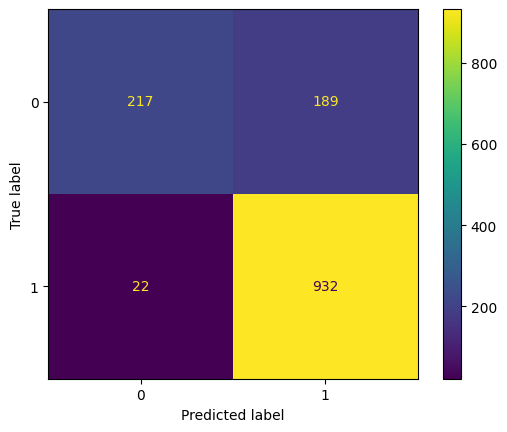

In [198]:
matrix1=confusion_matrix(y_test, y_pred)
ConfusionMatrixDisplay(matrix1).plot()

RANDOM FOREST - s ošetrenim outlierov

In [199]:
rf_model = RandomForestClassifier()
rf_model.fit(X_train_out, y_train)

RandomForestClassifier()

In [200]:
y_pred_train = rf_model.predict(X_train_out)
print("Presnosť:", accuracy_score(y_train, y_pred_train))
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train))

Presnosť: 1.0
Klasifikačný report:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00       935
           1       1.00      1.00      1.00      2237

    accuracy                           1.00      3172
   macro avg       1.00      1.00      1.00      3172
weighted avg       1.00      1.00      1.00      3172



In [201]:
y_pred = rf_model.predict(X_test_out)
print("Presnosť:", accuracy_score(y_test, y_pred))
print("Klasifikačný report:\n", classification_report(y_test, y_pred))

Presnosť: 0.9088235294117647
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.92      0.76      0.83       406
           1       0.90      0.97      0.94       954

    accuracy                           0.91      1360
   macro avg       0.91      0.87      0.88      1360
weighted avg       0.91      0.91      0.91      1360



In [202]:
results_list1_rf.append({
        'accuracy_train': accuracy_score(y_train, y_pred_train),
    'accuracy_test': accuracy_score(y_test, y_pred),
    'precision_train': precision_score(y_train, y_pred_train, average='binary'),
    'precision_test': precision_score(y_test, y_pred, average='binary'),
 'recall_train': recall_score(y_train, y_pred_train, average='binary'),
 'recall_test': recall_score(y_test, y_pred, average='binary'),
 'f1_train': f1_score(y_train, y_pred_train, average='binary'),
 'f1_test': f1_score(y_test, y_pred, average='binary')
        
    })

In [203]:
accuracy = accuracy_score(y_test, y_pred)
recall = recall_score(y_test, y_pred, average='binary')  # 'macro' pre nevyvážené triedy, 'binary' pre binárnu klasifikáciu
precision = precision_score(y_test, y_pred, average='binary')
f1 = f1_score(y_test, y_pred, average='binary')

print("Accuracy: {:.2f}".format(accuracy))
print("Recall: {:.2f}".format(recall))
print("Precision: {:.2f}".format(precision))
print("F1 Score: {:.2f}".format(f1))

Accuracy: 0.91
Recall: 0.97
Precision: 0.90
F1 Score: 0.94


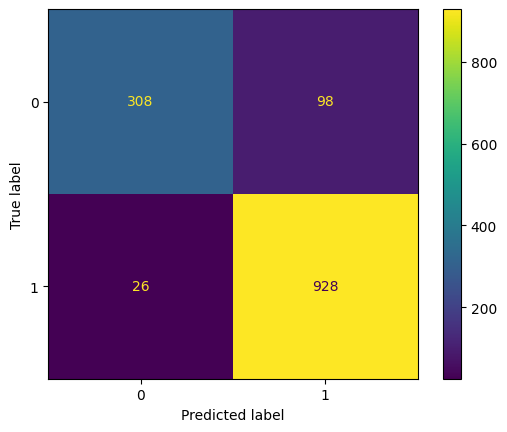

In [204]:
matrix1=confusion_matrix(y_test, y_pred)
ConfusionMatrixDisplay(matrix1).plot()

RANDOM FOREST - s ošetrenim outlierov a ngram

In [205]:
rf_model = RandomForestClassifier()
rf_model.fit(X_train_combined_out, y_train)

RandomForestClassifier()

In [206]:
y_pred_train = rf_model.predict(X_train_combined_out)
print("Presnosť:", accuracy_score(y_train, y_pred_train))
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train))

Presnosť: 1.0
Klasifikačný report:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00       935
           1       1.00      1.00      1.00      2237

    accuracy                           1.00      3172
   macro avg       1.00      1.00      1.00      3172
weighted avg       1.00      1.00      1.00      3172



In [207]:
y_pred = rf_model.predict(X_test_combined_out)
print("Presnosť:", accuracy_score(y_test, y_pred))
print("Klasifikačný report:\n", classification_report(y_test, y_pred))

Presnosť: 0.8654411764705883
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.92      0.60      0.73       406
           1       0.85      0.98      0.91       954

    accuracy                           0.87      1360
   macro avg       0.89      0.79      0.82      1360
weighted avg       0.87      0.87      0.86      1360



In [208]:
results_list1_rf.append({
        'accuracy_train': accuracy_score(y_train, y_pred_train),
    'accuracy_test': accuracy_score(y_test, y_pred),
    'precision_train': precision_score(y_train, y_pred_train, average='binary'),
    'precision_test': precision_score(y_test, y_pred, average='binary'),
 'recall_train': recall_score(y_train, y_pred_train, average='binary'),
 'recall_test': recall_score(y_test, y_pred, average='binary'),
 'f1_train': f1_score(y_train, y_pred_train, average='binary'),
 'f1_test': f1_score(y_test, y_pred, average='binary')
        
    })

In [209]:
accuracy = accuracy_score(y_test, y_pred)
recall = recall_score(y_test, y_pred, average='binary')  # 'macro' pre nevyvážené triedy, 'binary' pre binárnu klasifikáciu
precision = precision_score(y_test, y_pred, average='binary')
f1 = f1_score(y_test, y_pred, average='binary')

print("Accuracy: {:.2f}".format(accuracy))
print("Recall: {:.2f}".format(recall))
print("Precision: {:.2f}".format(precision))
print("F1 Score: {:.2f}".format(f1))

Accuracy: 0.87
Recall: 0.98
Precision: 0.85
F1 Score: 0.91


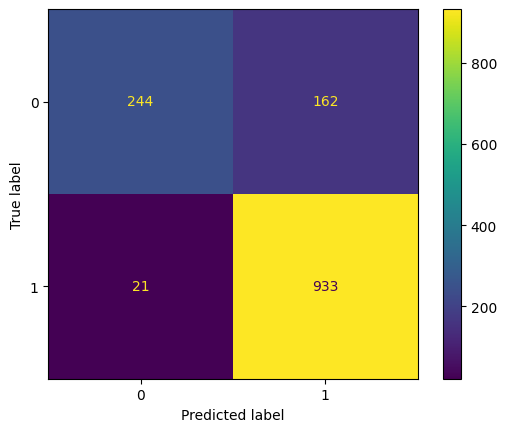

In [210]:
matrix1=confusion_matrix(y_test, y_pred)
ConfusionMatrixDisplay(matrix1).plot()

RANDOM FOREST - s ošetrenim outlierov a tfidf ngram

In [211]:
rf_model = RandomForestClassifier()
rf_model.fit(X_train_combined2_out, y_train)

RandomForestClassifier()

In [212]:
y_pred_train = rf_model.predict(X_train_combined2_out)
print("Presnosť:", accuracy_score(y_train, y_pred_train))
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train))

Presnosť: 1.0
Klasifikačný report:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00       935
           1       1.00      1.00      1.00      2237

    accuracy                           1.00      3172
   macro avg       1.00      1.00      1.00      3172
weighted avg       1.00      1.00      1.00      3172



In [213]:
y_pred = rf_model.predict(X_test_combined2_out)
print("Presnosť:", accuracy_score(y_test, y_pred))
print("Klasifikačný report:\n", classification_report(y_test, y_pred))

Presnosť: 0.8794117647058823
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.93      0.64      0.76       406
           1       0.87      0.98      0.92       954

    accuracy                           0.88      1360
   macro avg       0.90      0.81      0.84      1360
weighted avg       0.89      0.88      0.87      1360



In [214]:
results_list1_rf.append({
        'accuracy_train': accuracy_score(y_train, y_pred_train),
    'accuracy_test': accuracy_score(y_test, y_pred),
    'precision_train': precision_score(y_train, y_pred_train, average='binary'),
    'precision_test': precision_score(y_test, y_pred, average='binary'),
 'recall_train': recall_score(y_train, y_pred_train, average='binary'),
 'recall_test': recall_score(y_test, y_pred, average='binary'),
 'f1_train': f1_score(y_train, y_pred_train, average='binary'),
 'f1_test': f1_score(y_test, y_pred, average='binary')
        
    })

In [215]:
accuracy = accuracy_score(y_test, y_pred)
recall = recall_score(y_test, y_pred, average='binary')  # 'macro' pre nevyvážené triedy, 'binary' pre binárnu klasifikáciu
precision = precision_score(y_test, y_pred, average='binary')
f1 = f1_score(y_test, y_pred, average='binary')

print("Accuracy: {:.2f}".format(accuracy))
print("Recall: {:.2f}".format(recall))
print("Precision: {:.2f}".format(precision))
print("F1 Score: {:.2f}".format(f1))

Accuracy: 0.88
Recall: 0.98
Precision: 0.87
F1 Score: 0.92


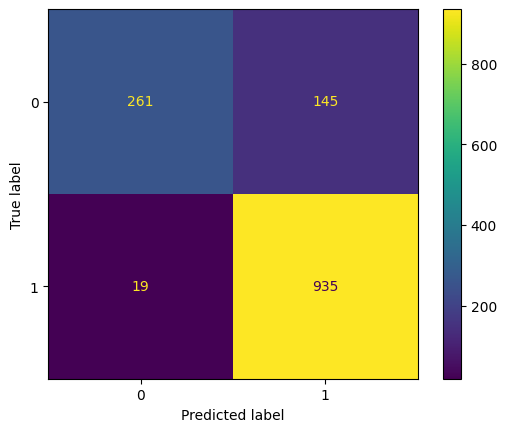

In [216]:
matrix1=confusion_matrix(y_test, y_pred)
ConfusionMatrixDisplay(matrix1).plot()

RANDOM FOREST - s ošetrenim outlierov a word frequency

In [217]:
rf_model = RandomForestClassifier()
rf_model.fit(X_train_combined3_out, y_train)

RandomForestClassifier()

In [218]:
y_pred_train = rf_model.predict(X_train_combined3_out)
print("Presnosť:", accuracy_score(y_train, y_pred_train))
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train))

Presnosť: 1.0
Klasifikačný report:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00       935
           1       1.00      1.00      1.00      2237

    accuracy                           1.00      3172
   macro avg       1.00      1.00      1.00      3172
weighted avg       1.00      1.00      1.00      3172



In [219]:
y_pred = rf_model.predict(X_test_combined3_out)
print("Presnosť:", accuracy_score(y_test, y_pred))
print("Klasifikačný report:\n", classification_report(y_test, y_pred))

Presnosť: 0.8970588235294118
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.95      0.69      0.80       406
           1       0.88      0.98      0.93       954

    accuracy                           0.90      1360
   macro avg       0.91      0.84      0.87      1360
weighted avg       0.90      0.90      0.89      1360



In [220]:
results_list1_rf.append({
        'accuracy_train': accuracy_score(y_train, y_pred_train),
    'accuracy_test': accuracy_score(y_test, y_pred),
    'precision_train': precision_score(y_train, y_pred_train, average='binary'),
    'precision_test': precision_score(y_test, y_pred, average='binary'),
 'recall_train': recall_score(y_train, y_pred_train, average='binary'),
 'recall_test': recall_score(y_test, y_pred, average='binary'),
 'f1_train': f1_score(y_train, y_pred_train, average='binary'),
 'f1_test': f1_score(y_test, y_pred, average='binary')
        
    })

In [221]:
accuracy = accuracy_score(y_test, y_pred)
recall = recall_score(y_test, y_pred, average='binary')  # 'macro' pre nevyvážené triedy, 'binary' pre binárnu klasifikáciu
precision = precision_score(y_test, y_pred, average='binary')
f1 = f1_score(y_test, y_pred, average='binary')

print("Accuracy: {:.2f}".format(accuracy))
print("Recall: {:.2f}".format(recall))
print("Precision: {:.2f}".format(precision))
print("F1 Score: {:.2f}".format(f1))

Accuracy: 0.90
Recall: 0.98
Precision: 0.88
F1 Score: 0.93


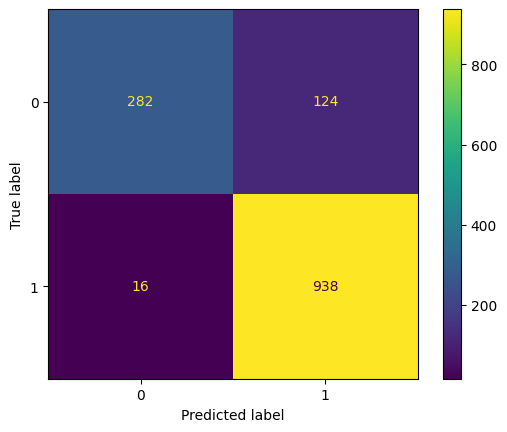

In [222]:
matrix1=confusion_matrix(y_test, y_pred)
ConfusionMatrixDisplay(matrix1).plot()

RANDOM FOREST - s ošetrenim outlierov a tfidf word frequency

In [223]:
rf_model = RandomForestClassifier()
rf_model.fit(X_train_combined4_out, y_train)

RandomForestClassifier()

In [224]:
y_pred_train = rf_model.predict(X_train_combined4_out)
print("Presnosť:", accuracy_score(y_train, y_pred_train))
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train))

Presnosť: 1.0
Klasifikačný report:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00       935
           1       1.00      1.00      1.00      2237

    accuracy                           1.00      3172
   macro avg       1.00      1.00      1.00      3172
weighted avg       1.00      1.00      1.00      3172



In [225]:
y_pred = rf_model.predict(X_test_combined4_out)
print("Presnosť:", accuracy_score(y_test, y_pred))
print("Klasifikačný report:\n", classification_report(y_test, y_pred))

Presnosť: 0.8735294117647059
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.93      0.62      0.75       406
           1       0.86      0.98      0.92       954

    accuracy                           0.87      1360
   macro avg       0.90      0.80      0.83      1360
weighted avg       0.88      0.87      0.87      1360



In [226]:
results_list1_rf.append({
        'accuracy_train': accuracy_score(y_train, y_pred_train),
    'accuracy_test': accuracy_score(y_test, y_pred),
    'precision_train': precision_score(y_train, y_pred_train, average='binary'),
    'precision_test': precision_score(y_test, y_pred, average='binary'),
 'recall_train': recall_score(y_train, y_pred_train, average='binary'),
 'recall_test': recall_score(y_test, y_pred, average='binary'),
 'f1_train': f1_score(y_train, y_pred_train, average='binary'),
 'f1_test': f1_score(y_test, y_pred, average='binary')
        
    })

In [227]:
accuracy = accuracy_score(y_test, y_pred)
recall = recall_score(y_test, y_pred, average='binary')  # 'macro' pre nevyvážené triedy, 'binary' pre binárnu klasifikáciu
precision = precision_score(y_test, y_pred, average='binary')
f1 = f1_score(y_test, y_pred, average='binary')

print("Accuracy: {:.2f}".format(accuracy))
print("Recall: {:.2f}".format(recall))
print("Precision: {:.2f}".format(precision))
print("F1 Score: {:.2f}".format(f1))

Accuracy: 0.87
Recall: 0.98
Precision: 0.86
F1 Score: 0.92


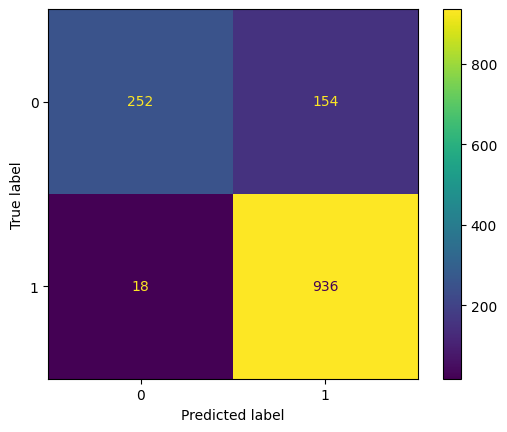

In [228]:
matrix1=confusion_matrix(y_test, y_pred)
ConfusionMatrixDisplay(matrix1).plot()

RANDOM FOREST - so skalovanim

In [229]:
rf_model = RandomForestClassifier()
rf_model.fit(X_train_scaled, y_train)

RandomForestClassifier()

In [230]:
y_pred_train = rf_model.predict(X_train_scaled)
print("Presnosť:", accuracy_score(y_train, y_pred_train))
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train))

Presnosť: 1.0
Klasifikačný report:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00       935
           1       1.00      1.00      1.00      2237

    accuracy                           1.00      3172
   macro avg       1.00      1.00      1.00      3172
weighted avg       1.00      1.00      1.00      3172



In [231]:
y_pred = rf_model.predict(X_test_scaled)
print("Presnosť:", accuracy_score(y_test, y_pred))
print("Klasifikačný report:\n", classification_report(y_test, y_pred))

Presnosť: 0.7698529411764706
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.77      0.33      0.46       406
           1       0.77      0.96      0.85       954

    accuracy                           0.77      1360
   macro avg       0.77      0.64      0.66      1360
weighted avg       0.77      0.77      0.74      1360



In [232]:
results_list1_rf.append({
        'accuracy_train': accuracy_score(y_train, y_pred_train),
    'accuracy_test': accuracy_score(y_test, y_pred),
    'precision_train': precision_score(y_train, y_pred_train, average='binary'),
    'precision_test': precision_score(y_test, y_pred, average='binary'),
 'recall_train': recall_score(y_train, y_pred_train, average='binary'),
 'recall_test': recall_score(y_test, y_pred, average='binary'),
 'f1_train': f1_score(y_train, y_pred_train, average='binary'),
 'f1_test': f1_score(y_test, y_pred, average='binary')
        
    })

In [233]:
accuracy = accuracy_score(y_test, y_pred)
recall = recall_score(y_test, y_pred, average='binary')  # 'macro' pre nevyvážené triedy, 'binary' pre binárnu klasifikáciu
precision = precision_score(y_test, y_pred, average='binary')
f1 = f1_score(y_test, y_pred, average='binary')

print("Accuracy: {:.2f}".format(accuracy))
print("Recall: {:.2f}".format(recall))
print("Precision: {:.2f}".format(precision))
print("F1 Score: {:.2f}".format(f1))

Accuracy: 0.77
Recall: 0.96
Precision: 0.77
F1 Score: 0.85


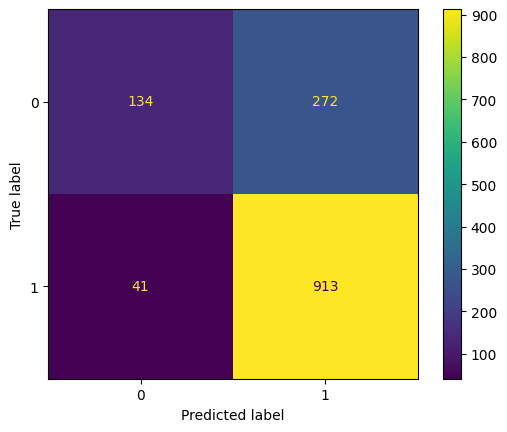

In [234]:
matrix1=confusion_matrix(y_test, y_pred)
ConfusionMatrixDisplay(matrix1).plot()

RANDOM FOREST - so skalovanim a ngram

In [235]:
rf_model = RandomForestClassifier()
rf_model.fit(X_train_combined_scaled, y_train)

RandomForestClassifier()

In [236]:
y_pred_train = rf_model.predict(X_train_combined_scaled)
print("Presnosť:", accuracy_score(y_train, y_pred_train))
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train))

Presnosť: 1.0
Klasifikačný report:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00       935
           1       1.00      1.00      1.00      2237

    accuracy                           1.00      3172
   macro avg       1.00      1.00      1.00      3172
weighted avg       1.00      1.00      1.00      3172



In [237]:
y_pred = rf_model.predict(X_test_combined_scaled)
print("Presnosť:", accuracy_score(y_test, y_pred))
print("Klasifikačný report:\n", classification_report(y_test, y_pred))

Presnosť: 0.8352941176470589
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.89      0.51      0.65       406
           1       0.82      0.97      0.89       954

    accuracy                           0.84      1360
   macro avg       0.86      0.74      0.77      1360
weighted avg       0.84      0.84      0.82      1360



In [238]:
results_list1_rf.append({
        'accuracy_train': accuracy_score(y_train, y_pred_train),
    'accuracy_test': accuracy_score(y_test, y_pred),
    'precision_train': precision_score(y_train, y_pred_train, average='binary'),
    'precision_test': precision_score(y_test, y_pred, average='binary'),
 'recall_train': recall_score(y_train, y_pred_train, average='binary'),
 'recall_test': recall_score(y_test, y_pred, average='binary'),
 'f1_train': f1_score(y_train, y_pred_train, average='binary'),
 'f1_test': f1_score(y_test, y_pred, average='binary')
        
    })

In [239]:
accuracy = accuracy_score(y_test, y_pred)
recall = recall_score(y_test, y_pred, average='binary')  # 'macro' pre nevyvážené triedy, 'binary' pre binárnu klasifikáciu
precision = precision_score(y_test, y_pred, average='binary')
f1 = f1_score(y_test, y_pred, average='binary')

print("Accuracy: {:.2f}".format(accuracy))
print("Recall: {:.2f}".format(recall))
print("Precision: {:.2f}".format(precision))
print("F1 Score: {:.2f}".format(f1))

Accuracy: 0.84
Recall: 0.97
Precision: 0.82
F1 Score: 0.89


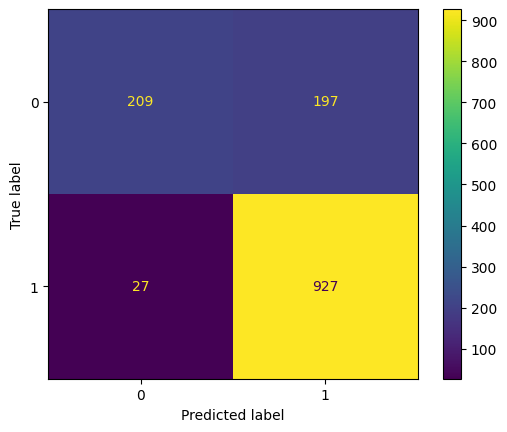

In [240]:
matrix1=confusion_matrix(y_test, y_pred)
ConfusionMatrixDisplay(matrix1).plot()

RANDOM FOREST - so skalovanim a tfidf ngram

In [241]:
rf_model = RandomForestClassifier()
rf_model.fit(X_train_combined2_scaled, y_train)

RandomForestClassifier()

In [242]:
y_pred_train = rf_model.predict(X_train_combined2_scaled)
print("Presnosť:", accuracy_score(y_train, y_pred_train))
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train))

Presnosť: 1.0
Klasifikačný report:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00       935
           1       1.00      1.00      1.00      2237

    accuracy                           1.00      3172
   macro avg       1.00      1.00      1.00      3172
weighted avg       1.00      1.00      1.00      3172



In [243]:
y_pred = rf_model.predict(X_test_combined2_scaled)
print("Presnosť:", accuracy_score(y_test, y_pred))
print("Klasifikačný report:\n", classification_report(y_test, y_pred))

Presnosť: 0.8558823529411764
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.90      0.58      0.71       406
           1       0.85      0.97      0.90       954

    accuracy                           0.86      1360
   macro avg       0.87      0.78      0.81      1360
weighted avg       0.86      0.86      0.85      1360



In [244]:
results_list1_rf.append({
        'accuracy_train': accuracy_score(y_train, y_pred_train),
    'accuracy_test': accuracy_score(y_test, y_pred),
    'precision_train': precision_score(y_train, y_pred_train, average='binary'),
    'precision_test': precision_score(y_test, y_pred, average='binary'),
 'recall_train': recall_score(y_train, y_pred_train, average='binary'),
 'recall_test': recall_score(y_test, y_pred, average='binary'),
 'f1_train': f1_score(y_train, y_pred_train, average='binary'),
 'f1_test': f1_score(y_test, y_pred, average='binary')
        
    })

In [245]:
accuracy = accuracy_score(y_test, y_pred)
recall = recall_score(y_test, y_pred, average='binary')  # 'macro' pre nevyvážené triedy, 'binary' pre binárnu klasifikáciu
precision = precision_score(y_test, y_pred, average='binary')
f1 = f1_score(y_test, y_pred, average='binary')

print("Accuracy: {:.2f}".format(accuracy))
print("Recall: {:.2f}".format(recall))
print("Precision: {:.2f}".format(precision))
print("F1 Score: {:.2f}".format(f1))

Accuracy: 0.86
Recall: 0.97
Precision: 0.85
F1 Score: 0.90


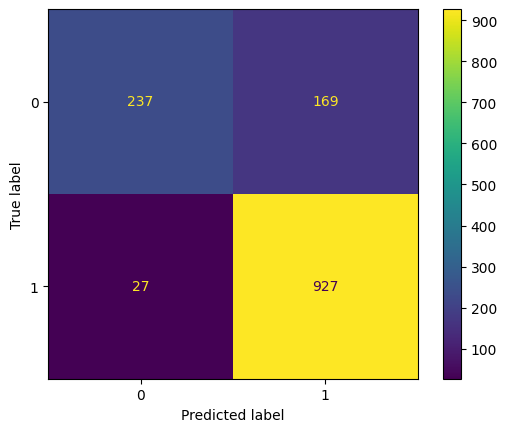

In [246]:
matrix1=confusion_matrix(y_test, y_pred)
ConfusionMatrixDisplay(matrix1).plot()

RANDOM FOREST - so skalovanim a word frequency

In [247]:
rf_model = RandomForestClassifier()
rf_model.fit(X_train_combined3_scaled, y_train)

RandomForestClassifier()

In [248]:
y_pred_train = rf_model.predict(X_train_combined3_scaled)
print("Presnosť:", accuracy_score(y_train, y_pred_train))
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train))

Presnosť: 1.0
Klasifikačný report:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00       935
           1       1.00      1.00      1.00      2237

    accuracy                           1.00      3172
   macro avg       1.00      1.00      1.00      3172
weighted avg       1.00      1.00      1.00      3172



In [249]:
y_pred = rf_model.predict(X_test_combined3_scaled)
print("Presnosť:", accuracy_score(y_test, y_pred))
print("Klasifikačný report:\n", classification_report(y_test, y_pred))

Presnosť: 0.8455882352941176
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.90      0.55      0.68       406
           1       0.83      0.97      0.90       954

    accuracy                           0.85      1360
   macro avg       0.86      0.76      0.79      1360
weighted avg       0.85      0.85      0.83      1360



In [250]:
results_list1_rf.append({
        'accuracy_train': accuracy_score(y_train, y_pred_train),
    'accuracy_test': accuracy_score(y_test, y_pred),
    'precision_train': precision_score(y_train, y_pred_train, average='binary'),
    'precision_test': precision_score(y_test, y_pred, average='binary'),
 'recall_train': recall_score(y_train, y_pred_train, average='binary'),
 'recall_test': recall_score(y_test, y_pred, average='binary'),
 'f1_train': f1_score(y_train, y_pred_train, average='binary'),
 'f1_test': f1_score(y_test, y_pred, average='binary')
        
    })

In [251]:
accuracy = accuracy_score(y_test, y_pred)
recall = recall_score(y_test, y_pred, average='binary')  # 'macro' pre nevyvážené triedy, 'binary' pre binárnu klasifikáciu
precision = precision_score(y_test, y_pred, average='binary')
f1 = f1_score(y_test, y_pred, average='binary')

print("Accuracy: {:.2f}".format(accuracy))
print("Recall: {:.2f}".format(recall))
print("Precision: {:.2f}".format(precision))
print("F1 Score: {:.2f}".format(f1))

Accuracy: 0.85
Recall: 0.97
Precision: 0.83
F1 Score: 0.90


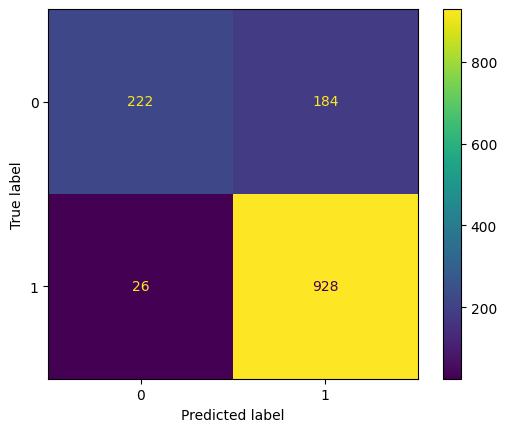

In [252]:
matrix1=confusion_matrix(y_test, y_pred)
ConfusionMatrixDisplay(matrix1).plot()

RANDOM FOREST - so skalovanim a tfidf word frequency

In [253]:
rf_model = RandomForestClassifier()
rf_model.fit(X_train_combined4_scaled, y_train)

RandomForestClassifier()

In [254]:
y_pred_train = rf_model.predict(X_train_combined4_scaled)
print("Presnosť:", accuracy_score(y_train, y_pred_train))
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train))

Presnosť: 1.0
Klasifikačný report:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00       935
           1       1.00      1.00      1.00      2237

    accuracy                           1.00      3172
   macro avg       1.00      1.00      1.00      3172
weighted avg       1.00      1.00      1.00      3172



In [255]:
y_pred = rf_model.predict(X_test_combined4_scaled)
print("Presnosť:", accuracy_score(y_test, y_pred))
print("Klasifikačný report:\n", classification_report(y_test, y_pred))

Presnosť: 0.8492647058823529
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.92      0.54      0.68       406
           1       0.83      0.98      0.90       954

    accuracy                           0.85      1360
   macro avg       0.88      0.76      0.79      1360
weighted avg       0.86      0.85      0.84      1360



In [256]:
results_list1_rf.append({
        'accuracy_train': accuracy_score(y_train, y_pred_train),
    'accuracy_test': accuracy_score(y_test, y_pred),
    'precision_train': precision_score(y_train, y_pred_train, average='binary'),
    'precision_test': precision_score(y_test, y_pred, average='binary'),
 'recall_train': recall_score(y_train, y_pred_train, average='binary'),
 'recall_test': recall_score(y_test, y_pred, average='binary'),
 'f1_train': f1_score(y_train, y_pred_train, average='binary'),
 'f1_test': f1_score(y_test, y_pred, average='binary')
        
    })

In [257]:
accuracy = accuracy_score(y_test, y_pred)
recall = recall_score(y_test, y_pred, average='binary')  # 'macro' pre nevyvážené triedy, 'binary' pre binárnu klasifikáciu
precision = precision_score(y_test, y_pred, average='binary')
f1 = f1_score(y_test, y_pred, average='binary')

print("Accuracy: {:.2f}".format(accuracy))
print("Recall: {:.2f}".format(recall))
print("Precision: {:.2f}".format(precision))
print("F1 Score: {:.2f}".format(f1))

Accuracy: 0.85
Recall: 0.98
Precision: 0.83
F1 Score: 0.90


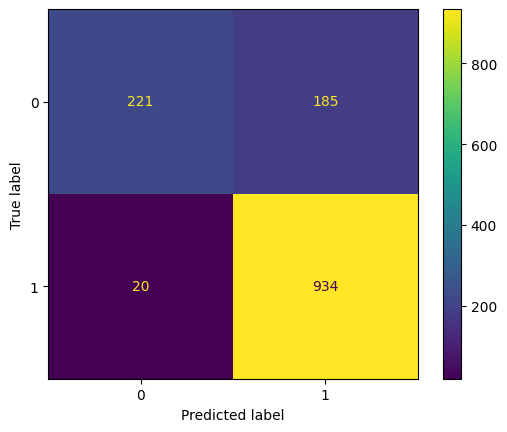

In [258]:
matrix1=confusion_matrix(y_test, y_pred)
ConfusionMatrixDisplay(matrix1).plot()

RANDOM FOREST - s ošetrením outlierov a skalovanim

In [259]:
rf_model = RandomForestClassifier()
rf_model.fit(X_train_scal_out, y_train)

RandomForestClassifier()

In [260]:
y_pred_train = rf_model.predict(X_train_scal_out)
print("Presnosť:", accuracy_score(y_train, y_pred_train))
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train))

Presnosť: 1.0
Klasifikačný report:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00       935
           1       1.00      1.00      1.00      2237

    accuracy                           1.00      3172
   macro avg       1.00      1.00      1.00      3172
weighted avg       1.00      1.00      1.00      3172



In [261]:
y_pred = rf_model.predict(X_test_scal_out)
print("Presnosť:", accuracy_score(y_test, y_pred))
print("Klasifikačný report:\n", classification_report(y_test, y_pred))

Presnosť: 0.9058823529411765
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.91      0.76      0.83       406
           1       0.90      0.97      0.94       954

    accuracy                           0.91      1360
   macro avg       0.91      0.86      0.88      1360
weighted avg       0.91      0.91      0.90      1360



In [262]:
results_list1_rf.append({
        'accuracy_train': accuracy_score(y_train, y_pred_train),
    'accuracy_test': accuracy_score(y_test, y_pred),
    'precision_train': precision_score(y_train, y_pred_train, average='binary'),
    'precision_test': precision_score(y_test, y_pred, average='binary'),
 'recall_train': recall_score(y_train, y_pred_train, average='binary'),
 'recall_test': recall_score(y_test, y_pred, average='binary'),
 'f1_train': f1_score(y_train, y_pred_train, average='binary'),
 'f1_test': f1_score(y_test, y_pred, average='binary')
        
    })

In [263]:
accuracy = accuracy_score(y_test, y_pred)
recall = recall_score(y_test, y_pred, average='binary')  # 'macro' pre nevyvážené triedy, 'binary' pre binárnu klasifikáciu
precision = precision_score(y_test, y_pred, average='binary')
f1 = f1_score(y_test, y_pred, average='binary')

print("Accuracy: {:.2f}".format(accuracy))
print("Recall: {:.2f}".format(recall))
print("Precision: {:.2f}".format(precision))
print("F1 Score: {:.2f}".format(f1))

Accuracy: 0.91
Recall: 0.97
Precision: 0.90
F1 Score: 0.94


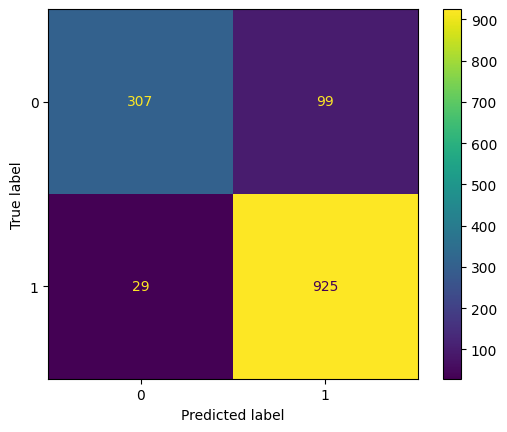

In [264]:
matrix1=confusion_matrix(y_test, y_pred)
ConfusionMatrixDisplay(matrix1).plot()

RANDOM FOREST - s ošetrením outlierov a skalovanim a ngram

In [265]:
rf_model = RandomForestClassifier()
rf_model.fit(X_train_combined_scal_out, y_train)

RandomForestClassifier()

In [266]:
y_pred_train = rf_model.predict(X_train_combined_scal_out)
print("Presnosť:", accuracy_score(y_train, y_pred_train))
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train))

Presnosť: 1.0
Klasifikačný report:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00       935
           1       1.00      1.00      1.00      2237

    accuracy                           1.00      3172
   macro avg       1.00      1.00      1.00      3172
weighted avg       1.00      1.00      1.00      3172



In [267]:
y_pred = rf_model.predict(X_test_combined_scal_out)
print("Presnosť:", accuracy_score(y_test, y_pred))
print("Klasifikačný report:\n", classification_report(y_test, y_pred))

Presnosť: 0.8757352941176471
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.93      0.63      0.75       406
           1       0.86      0.98      0.92       954

    accuracy                           0.88      1360
   macro avg       0.90      0.81      0.83      1360
weighted avg       0.88      0.88      0.87      1360



In [268]:
results_list1_rf.append({
        'accuracy_train': accuracy_score(y_train, y_pred_train),
    'accuracy_test': accuracy_score(y_test, y_pred),
    'precision_train': precision_score(y_train, y_pred_train, average='binary'),
    'precision_test': precision_score(y_test, y_pred, average='binary'),
 'recall_train': recall_score(y_train, y_pred_train, average='binary'),
 'recall_test': recall_score(y_test, y_pred, average='binary'),
 'f1_train': f1_score(y_train, y_pred_train, average='binary'),
 'f1_test': f1_score(y_test, y_pred, average='binary')
        
    })

In [269]:
accuracy = accuracy_score(y_test, y_pred)
recall = recall_score(y_test, y_pred, average='binary')  # 'macro' pre nevyvážené triedy, 'binary' pre binárnu klasifikáciu
precision = precision_score(y_test, y_pred, average='binary')
f1 = f1_score(y_test, y_pred, average='binary')

print("Accuracy: {:.2f}".format(accuracy))
print("Recall: {:.2f}".format(recall))
print("Precision: {:.2f}".format(precision))
print("F1 Score: {:.2f}".format(f1))

Accuracy: 0.88
Recall: 0.98
Precision: 0.86
F1 Score: 0.92


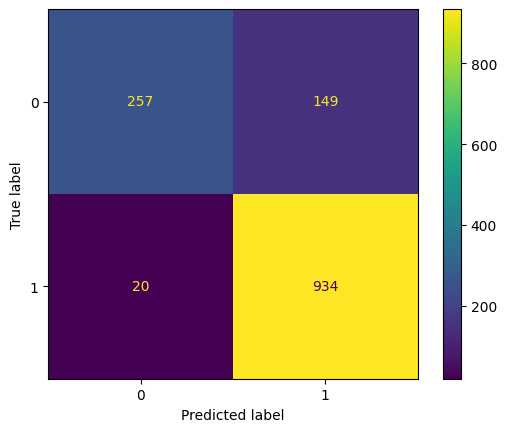

In [270]:
matrix1=confusion_matrix(y_test, y_pred)
ConfusionMatrixDisplay(matrix1).plot()

RANDOM FOREST - s ošetrením outlierov a skalovanim a tfidf ngram

In [271]:
rf_model = RandomForestClassifier()
rf_model.fit(X_train_combined2_scal_out, y_train)

RandomForestClassifier()

In [272]:
y_pred_train = rf_model.predict(X_train_combined2_scal_out)
print("Presnosť:", accuracy_score(y_train, y_pred_train))
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train))

Presnosť: 1.0
Klasifikačný report:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00       935
           1       1.00      1.00      1.00      2237

    accuracy                           1.00      3172
   macro avg       1.00      1.00      1.00      3172
weighted avg       1.00      1.00      1.00      3172



In [273]:
y_pred = rf_model.predict(X_test_combined2_scal_out)
print("Presnosť:", accuracy_score(y_test, y_pred))
print("Klasifikačný report:\n", classification_report(y_test, y_pred))

Presnosť: 0.8772058823529412
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.93      0.64      0.76       406
           1       0.86      0.98      0.92       954

    accuracy                           0.88      1360
   macro avg       0.90      0.81      0.84      1360
weighted avg       0.88      0.88      0.87      1360



In [274]:
results_list1_rf.append({
        'accuracy_train': accuracy_score(y_train, y_pred_train),
    'accuracy_test': accuracy_score(y_test, y_pred),
    'precision_train': precision_score(y_train, y_pred_train, average='binary'),
    'precision_test': precision_score(y_test, y_pred, average='binary'),
 'recall_train': recall_score(y_train, y_pred_train, average='binary'),
 'recall_test': recall_score(y_test, y_pred, average='binary'),
 'f1_train': f1_score(y_train, y_pred_train, average='binary'),
 'f1_test': f1_score(y_test, y_pred, average='binary')
        
    })

In [275]:
accuracy = accuracy_score(y_test, y_pred)
recall = recall_score(y_test, y_pred, average='binary')  # 'macro' pre nevyvážené triedy, 'binary' pre binárnu klasifikáciu
precision = precision_score(y_test, y_pred, average='binary')
f1 = f1_score(y_test, y_pred, average='binary')

print("Accuracy: {:.2f}".format(accuracy))
print("Recall: {:.2f}".format(recall))
print("Precision: {:.2f}".format(precision))
print("F1 Score: {:.2f}".format(f1))

Accuracy: 0.88
Recall: 0.98
Precision: 0.86
F1 Score: 0.92


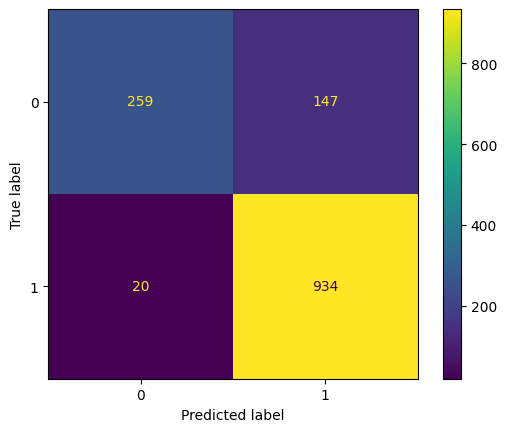

In [276]:
matrix1=confusion_matrix(y_test, y_pred)
ConfusionMatrixDisplay(matrix1).plot()

RANDOM FOREST - s ošetrením outlierov a skalovanim a word frequency

In [277]:
rf_model = RandomForestClassifier()
rf_model.fit(X_train_combined3_scal_out, y_train)

RandomForestClassifier()

In [278]:
y_pred_train = rf_model.predict(X_train_combined3_scal_out)
print("Presnosť:", accuracy_score(y_train, y_pred_train))
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train))

Presnosť: 1.0
Klasifikačný report:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00       935
           1       1.00      1.00      1.00      2237

    accuracy                           1.00      3172
   macro avg       1.00      1.00      1.00      3172
weighted avg       1.00      1.00      1.00      3172



In [279]:
y_pred = rf_model.predict(X_test_combined3_scal_out)
print("Presnosť:", accuracy_score(y_test, y_pred))
print("Klasifikačný report:\n", classification_report(y_test, y_pred))

Presnosť: 0.8911764705882353
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.94      0.68      0.79       406
           1       0.88      0.98      0.93       954

    accuracy                           0.89      1360
   macro avg       0.91      0.83      0.86      1360
weighted avg       0.90      0.89      0.89      1360



In [280]:
results_list1_rf.append({
        'accuracy_train': accuracy_score(y_train, y_pred_train),
    'accuracy_test': accuracy_score(y_test, y_pred),
    'precision_train': precision_score(y_train, y_pred_train, average='binary'),
    'precision_test': precision_score(y_test, y_pred, average='binary'),
 'recall_train': recall_score(y_train, y_pred_train, average='binary'),
 'recall_test': recall_score(y_test, y_pred, average='binary'),
 'f1_train': f1_score(y_train, y_pred_train, average='binary'),
 'f1_test': f1_score(y_test, y_pred, average='binary')
        
    })

In [281]:
accuracy = accuracy_score(y_test, y_pred)
recall = recall_score(y_test, y_pred, average='binary')  # 'macro' pre nevyvážené triedy, 'binary' pre binárnu klasifikáciu
precision = precision_score(y_test, y_pred, average='binary')
f1 = f1_score(y_test, y_pred, average='binary')

print("Accuracy: {:.2f}".format(accuracy))
print("Recall: {:.2f}".format(recall))
print("Precision: {:.2f}".format(precision))
print("F1 Score: {:.2f}".format(f1))

Accuracy: 0.89
Recall: 0.98
Precision: 0.88
F1 Score: 0.93


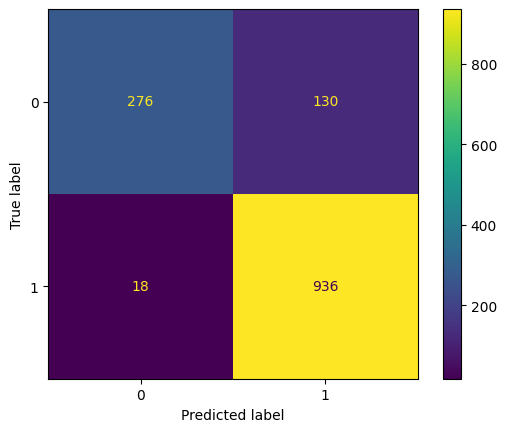

In [282]:
matrix1=confusion_matrix(y_test, y_pred)
ConfusionMatrixDisplay(matrix1).plot()

RANDOM FOREST - s ošetrením outlierov a skalovanim a tfidf word frequency

In [283]:
rf_model = RandomForestClassifier()
rf_model.fit(X_train_combined4_scal_out, y_train)

RandomForestClassifier()

In [284]:
y_pred_train = rf_model.predict(X_train_combined4_scal_out)
print("Presnosť:", accuracy_score(y_train, y_pred_train))
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train))

Presnosť: 1.0
Klasifikačný report:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00       935
           1       1.00      1.00      1.00      2237

    accuracy                           1.00      3172
   macro avg       1.00      1.00      1.00      3172
weighted avg       1.00      1.00      1.00      3172



In [285]:
y_pred = rf_model.predict(X_test_combined4_scal_out)
print("Presnosť:", accuracy_score(y_test, y_pred))
print("Klasifikačný report:\n", classification_report(y_test, y_pred))

Presnosť: 0.8772058823529412
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.94      0.63      0.75       406
           1       0.86      0.98      0.92       954

    accuracy                           0.88      1360
   macro avg       0.90      0.80      0.84      1360
weighted avg       0.89      0.88      0.87      1360



In [286]:
results_list1_rf.append({
        'accuracy_train': accuracy_score(y_train, y_pred_train),
    'accuracy_test': accuracy_score(y_test, y_pred),
    'precision_train': precision_score(y_train, y_pred_train, average='binary'),
    'precision_test': precision_score(y_test, y_pred, average='binary'),
 'recall_train': recall_score(y_train, y_pred_train, average='binary'),
 'recall_test': recall_score(y_test, y_pred, average='binary'),
 'f1_train': f1_score(y_train, y_pred_train, average='binary'),
 'f1_test': f1_score(y_test, y_pred, average='binary')
        
    })

In [287]:
accuracy = accuracy_score(y_test, y_pred)
recall = recall_score(y_test, y_pred, average='binary')  # 'macro' pre nevyvážené triedy, 'binary' pre binárnu klasifikáciu
precision = precision_score(y_test, y_pred, average='binary')
f1 = f1_score(y_test, y_pred, average='binary')

print("Accuracy: {:.2f}".format(accuracy))
print("Recall: {:.2f}".format(recall))
print("Precision: {:.2f}".format(precision))
print("F1 Score: {:.2f}".format(f1))

Accuracy: 0.88
Recall: 0.98
Precision: 0.86
F1 Score: 0.92


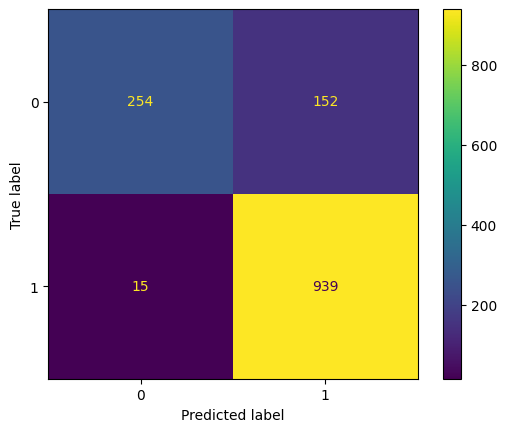

In [288]:
matrix1=confusion_matrix(y_test, y_pred)
ConfusionMatrixDisplay(matrix1).plot()

In [289]:
results_rf1 = pd.DataFrame(results_list1_rf)
print(results_rf1)

    accuracy_train  accuracy_test  precision_train  precision_test  \
0              1.0       0.769118              1.0        0.773973   
1              1.0       0.847059              1.0        0.837251   
2              1.0       0.849265              1.0        0.839529   
3              1.0       0.846324              1.0        0.833483   
4              1.0       0.844853              1.0        0.831401   
5              1.0       0.908824              1.0        0.904483   
6              1.0       0.865441              1.0        0.852055   
7              1.0       0.879412              1.0        0.865741   
8              1.0       0.897059              1.0        0.883239   
9              1.0       0.873529              1.0        0.858716   
10             1.0       0.769853              1.0        0.770464   
11             1.0       0.835294              1.0        0.824733   
12             1.0       0.855882              1.0        0.845803   
13             1.0  

Podľa výsledkov po prvom testovani random forest môžeme vidieť, že najlepší výsledok mal dataset s ošetrenými outliermi (bez textových reprezentácií). Takže je zrejme, že najväčší vplyv na úspešnosť malo ošetrenie outlierov. Ked si porovnáme accuracy pri trenovacom a testovacom datasete je zrejme, že model sa pretrénoval, však toto je celkom bežné pri stromových algoritmoch a treba to ošetriť hyperparametrami. Zatiaľ tento model vykazuje vyššiu presnoť ako svc.

GRADIENT BOOSTING CLASSIFIER - bez ošetrenia outlierov a skalovania

In [290]:
results_list1_gbm=[]

Trenovanie modelu

In [291]:
gbm_model = GradientBoostingClassifier()
gbm_model.fit(X_train, y_train)

GradientBoostingClassifier()

Predikovanie na trenovacich datach

In [292]:
y_pred_train = gbm_model.predict(X_train)
print("Presnosť:", accuracy_score(y_train, y_pred_train))
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train))

Presnosť: 0.855296343001261
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.89      0.59      0.70       935
           1       0.85      0.97      0.90      2237

    accuracy                           0.86      3172
   macro avg       0.87      0.78      0.80      3172
weighted avg       0.86      0.86      0.85      3172



Predikovanie na testovacich datach

In [293]:
y_pred = gbm_model.predict(X_test)
print("Presnosť:", accuracy_score(y_test, y_pred))
print("Klasifikačný report:\n", classification_report(y_test, y_pred))

Presnosť: 0.7727941176470589
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.72      0.39      0.51       406
           1       0.78      0.93      0.85       954

    accuracy                           0.77      1360
   macro avg       0.75      0.66      0.68      1360
weighted avg       0.76      0.77      0.75      1360



In [294]:
results_list1_gbm.append({
        'accuracy_train': accuracy_score(y_train, y_pred_train),
    'accuracy_test': accuracy_score(y_test, y_pred),
    'precision_train': precision_score(y_train, y_pred_train, average='binary'),
    'precision_test': precision_score(y_test, y_pred, average='binary'),
 'recall_train': recall_score(y_train, y_pred_train, average='binary'),
 'recall_test': recall_score(y_test, y_pred, average='binary'),
 'f1_train': f1_score(y_train, y_pred_train, average='binary'),
 'f1_test': f1_score(y_test, y_pred, average='binary')
        
    })

Zobrazenie metrik

In [295]:
accuracy = accuracy_score(y_test, y_pred)
recall = recall_score(y_test, y_pred, average='binary')  # 'macro' pre nevyvážené triedy, 'binary' pre binárnu klasifikáciu
precision = precision_score(y_test, y_pred, average='binary')
f1 = f1_score(y_test, y_pred, average='binary')

print("Accuracy: {:.2f}".format(accuracy))
print("Recall: {:.2f}".format(recall))
print("Precision: {:.2f}".format(precision))
print("F1 Score: {:.2f}".format(f1))

Accuracy: 0.77
Recall: 0.93
Precision: 0.78
F1 Score: 0.85


Vizualizácia výkonnosti modelu

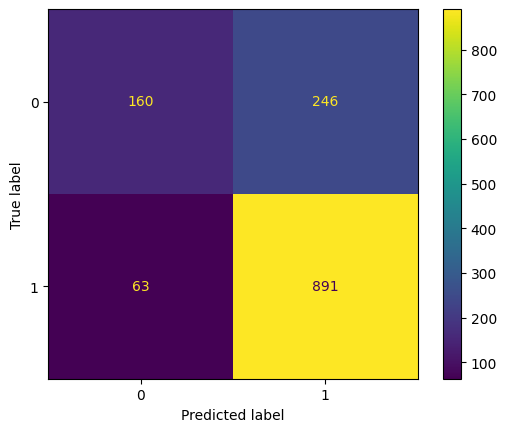

In [296]:
matrix1=confusion_matrix(y_test, y_pred)
ConfusionMatrixDisplay(matrix1).plot()

GRADIENT BOOSTING CLASSIFIER - bez ošetrenia outlierov a skalovania a ngram

In [297]:
gbm_model = GradientBoostingClassifier()
gbm_model.fit(X_train_combined, y_train)

GradientBoostingClassifier()

In [298]:
y_pred_train = gbm_model.predict(X_train_combined)
print("Presnosť:", accuracy_score(y_train, y_pred_train))
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train))

Presnosť: 0.9719419924337958
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.98      0.93      0.95       935
           1       0.97      0.99      0.98      2237

    accuracy                           0.97      3172
   macro avg       0.97      0.96      0.97      3172
weighted avg       0.97      0.97      0.97      3172



In [299]:
y_pred = gbm_model.predict(X_test_combined)
print("Presnosť:", accuracy_score(y_test, y_pred))
print("Klasifikačný report:\n", classification_report(y_test, y_pred))

Presnosť: 0.9051470588235294
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.88      0.79      0.83       406
           1       0.91      0.95      0.93       954

    accuracy                           0.91      1360
   macro avg       0.90      0.87      0.88      1360
weighted avg       0.90      0.91      0.90      1360



In [300]:
results_list1_gbm.append({
        'accuracy_train': accuracy_score(y_train, y_pred_train),
    'accuracy_test': accuracy_score(y_test, y_pred),
    'precision_train': precision_score(y_train, y_pred_train, average='binary'),
    'precision_test': precision_score(y_test, y_pred, average='binary'),
 'recall_train': recall_score(y_train, y_pred_train, average='binary'),
 'recall_test': recall_score(y_test, y_pred, average='binary'),
 'f1_train': f1_score(y_train, y_pred_train, average='binary'),
 'f1_test': f1_score(y_test, y_pred, average='binary')
        
    })

In [301]:
accuracy = accuracy_score(y_test, y_pred)
recall = recall_score(y_test, y_pred, average='binary')  # 'macro' pre nevyvážené triedy, 'binary' pre binárnu klasifikáciu
precision = precision_score(y_test, y_pred, average='binary')
f1 = f1_score(y_test, y_pred, average='binary')

print("Accuracy: {:.2f}".format(accuracy))
print("Recall: {:.2f}".format(recall))
print("Precision: {:.2f}".format(precision))
print("F1 Score: {:.2f}".format(f1))

Accuracy: 0.91
Recall: 0.95
Precision: 0.91
F1 Score: 0.93


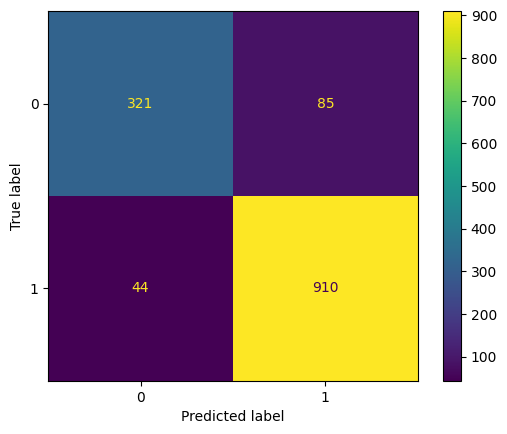

In [302]:
matrix1=confusion_matrix(y_test, y_pred)
ConfusionMatrixDisplay(matrix1).plot()


GRADIENT BOOSTING CLASSIFIER - bez ošetrenia outlierov a skalovania a tfidf ngram

In [303]:
gbm_model = GradientBoostingClassifier()
gbm_model.fit(X_train_combined2, y_train)

GradientBoostingClassifier()

In [304]:
y_pred_train = gbm_model.predict(X_train_combined2)
print("Presnosť:", accuracy_score(y_train, y_pred_train))
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train))

Presnosť: 0.9735182849936949
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.97      0.94      0.95       935
           1       0.97      0.99      0.98      2237

    accuracy                           0.97      3172
   macro avg       0.97      0.96      0.97      3172
weighted avg       0.97      0.97      0.97      3172



In [305]:
y_pred = gbm_model.predict(X_test_combined2)
print("Presnosť:", accuracy_score(y_test, y_pred))
print("Klasifikačný report:\n", classification_report(y_test, y_pred))

Presnosť: 0.8970588235294118
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.88      0.76      0.81       406
           1       0.90      0.96      0.93       954

    accuracy                           0.90      1360
   macro avg       0.89      0.86      0.87      1360
weighted avg       0.90      0.90      0.89      1360



In [306]:
results_list1_gbm.append({
        'accuracy_train': accuracy_score(y_train, y_pred_train),
    'accuracy_test': accuracy_score(y_test, y_pred),
    'precision_train': precision_score(y_train, y_pred_train, average='binary'),
    'precision_test': precision_score(y_test, y_pred, average='binary'),
 'recall_train': recall_score(y_train, y_pred_train, average='binary'),
 'recall_test': recall_score(y_test, y_pred, average='binary'),
 'f1_train': f1_score(y_train, y_pred_train, average='binary'),
 'f1_test': f1_score(y_test, y_pred, average='binary')
        
    })

In [307]:
accuracy = accuracy_score(y_test, y_pred)
recall = recall_score(y_test, y_pred, average='binary')  # 'macro' pre nevyvážené triedy, 'binary' pre binárnu klasifikáciu
precision = precision_score(y_test, y_pred, average='binary')
f1 = f1_score(y_test, y_pred, average='binary')

print("Accuracy: {:.2f}".format(accuracy))
print("Recall: {:.2f}".format(recall))
print("Precision: {:.2f}".format(precision))
print("F1 Score: {:.2f}".format(f1))

Accuracy: 0.90
Recall: 0.96
Precision: 0.90
F1 Score: 0.93


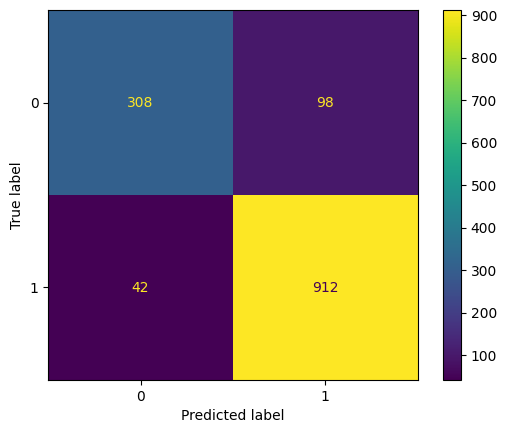

In [308]:
matrix1=confusion_matrix(y_test, y_pred)
ConfusionMatrixDisplay(matrix1).plot()

GRADIENT BOOSTING CLASSIFIER - bez ošetrenia outlierov a skalovania a word frequency

In [309]:
gbm_model = GradientBoostingClassifier()
gbm_model.fit(X_train_combined3, y_train)

GradientBoostingClassifier()

In [310]:
y_pred_train = gbm_model.predict(X_train_combined3)
print("Presnosť:", accuracy_score(y_train, y_pred_train))
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train))

Presnosť: 0.9618537200504413
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.96      0.91      0.93       935
           1       0.96      0.98      0.97      2237

    accuracy                           0.96      3172
   macro avg       0.96      0.95      0.95      3172
weighted avg       0.96      0.96      0.96      3172



In [311]:
y_pred = gbm_model.predict(X_test_combined3)
print("Presnosť:", accuracy_score(y_test, y_pred))
print("Klasifikačný report:\n", classification_report(y_test, y_pred))

Presnosť: 0.8955882352941177
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.87      0.77      0.81       406
           1       0.91      0.95      0.93       954

    accuracy                           0.90      1360
   macro avg       0.89      0.86      0.87      1360
weighted avg       0.89      0.90      0.89      1360



In [312]:
results_list1_gbm.append({
        'accuracy_train': accuracy_score(y_train, y_pred_train),
    'accuracy_test': accuracy_score(y_test, y_pred),
    'precision_train': precision_score(y_train, y_pred_train, average='binary'),
    'precision_test': precision_score(y_test, y_pred, average='binary'),
 'recall_train': recall_score(y_train, y_pred_train, average='binary'),
 'recall_test': recall_score(y_test, y_pred, average='binary'),
 'f1_train': f1_score(y_train, y_pred_train, average='binary'),
 'f1_test': f1_score(y_test, y_pred, average='binary')
        
    })

In [313]:
accuracy = accuracy_score(y_test, y_pred)
recall = recall_score(y_test, y_pred, average='binary')  # 'macro' pre nevyvážené triedy, 'binary' pre binárnu klasifikáciu
precision = precision_score(y_test, y_pred, average='binary')
f1 = f1_score(y_test, y_pred, average='binary')

print("Accuracy: {:.2f}".format(accuracy))
print("Recall: {:.2f}".format(recall))
print("Precision: {:.2f}".format(precision))
print("F1 Score: {:.2f}".format(f1))

Accuracy: 0.90
Recall: 0.95
Precision: 0.91
F1 Score: 0.93


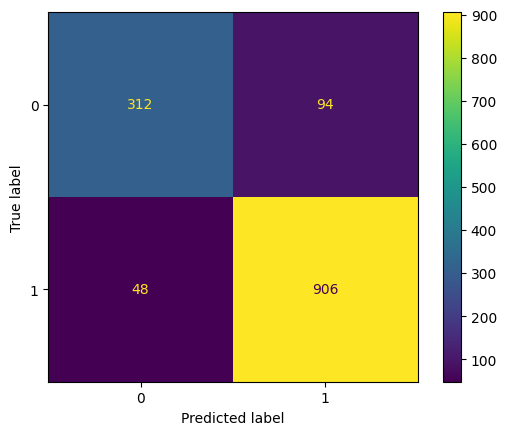

In [314]:
matrix1=confusion_matrix(y_test, y_pred)
ConfusionMatrixDisplay(matrix1).plot()

GRADIENT BOOSTING CLASSIFIER - bez ošetrenia outlierov a skalovania a word frequency

In [315]:
gbm_model = GradientBoostingClassifier()
gbm_model.fit(X_train_combined4, y_train)

GradientBoostingClassifier()

In [316]:
y_pred_train = gbm_model.predict(X_train_combined4)
print("Presnosť:", accuracy_score(y_train, y_pred_train))
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train))

Presnosť: 0.973203026481715
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.97      0.93      0.95       935
           1       0.97      0.99      0.98      2237

    accuracy                           0.97      3172
   macro avg       0.97      0.96      0.97      3172
weighted avg       0.97      0.97      0.97      3172



In [317]:
y_pred = gbm_model.predict(X_test_combined4)
print("Presnosť:", accuracy_score(y_test, y_pred))
print("Klasifikačný report:\n", classification_report(y_test, y_pred))

Presnosť: 0.9036764705882353
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.89      0.78      0.83       406
           1       0.91      0.96      0.93       954

    accuracy                           0.90      1360
   macro avg       0.90      0.87      0.88      1360
weighted avg       0.90      0.90      0.90      1360



In [318]:
results_list1_gbm.append({
        'accuracy_train': accuracy_score(y_train, y_pred_train),
    'accuracy_test': accuracy_score(y_test, y_pred),
    'precision_train': precision_score(y_train, y_pred_train, average='binary'),
    'precision_test': precision_score(y_test, y_pred, average='binary'),
 'recall_train': recall_score(y_train, y_pred_train, average='binary'),
 'recall_test': recall_score(y_test, y_pred, average='binary'),
 'f1_train': f1_score(y_train, y_pred_train, average='binary'),
 'f1_test': f1_score(y_test, y_pred, average='binary')
        
    })

In [319]:
accuracy = accuracy_score(y_test, y_pred)
recall = recall_score(y_test, y_pred, average='binary')  # 'macro' pre nevyvážené triedy, 'binary' pre binárnu klasifikáciu
precision = precision_score(y_test, y_pred, average='binary')
f1 = f1_score(y_test, y_pred, average='binary')

print("Accuracy: {:.2f}".format(accuracy))
print("Recall: {:.2f}".format(recall))
print("Precision: {:.2f}".format(precision))
print("F1 Score: {:.2f}".format(f1))

Accuracy: 0.90
Recall: 0.96
Precision: 0.91
F1 Score: 0.93


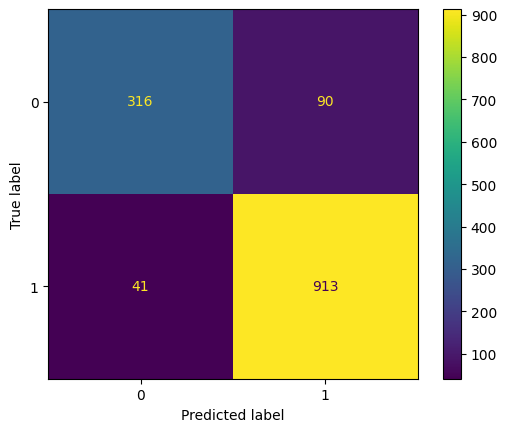

In [320]:
matrix1=confusion_matrix(y_test, y_pred)
ConfusionMatrixDisplay(matrix1).plot()

GRADIENT BOOSTING CLASSIFIER - s ošetrenim outlierov

In [321]:
gbm_model = GradientBoostingClassifier()
gbm_model.fit(X_train_out, y_train)

GradientBoostingClassifier()

In [322]:
y_pred_train = gbm_model.predict(X_train_out)
print("Presnosť:", accuracy_score(y_train, y_pred_train))
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train))

Presnosť: 0.9706809583858764
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.98      0.92      0.95       935
           1       0.97      0.99      0.98      2237

    accuracy                           0.97      3172
   macro avg       0.97      0.96      0.96      3172
weighted avg       0.97      0.97      0.97      3172



In [323]:
y_pred = gbm_model.predict(X_test_out)
print("Presnosť:", accuracy_score(y_test, y_pred))
print("Klasifikačný report:\n", classification_report(y_test, y_pred))

Presnosť: 0.9375
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.94      0.84      0.89       406
           1       0.94      0.98      0.96       954

    accuracy                           0.94      1360
   macro avg       0.94      0.91      0.92      1360
weighted avg       0.94      0.94      0.94      1360



In [324]:
results_list1_gbm.append({
        'accuracy_train': accuracy_score(y_train, y_pred_train),
    'accuracy_test': accuracy_score(y_test, y_pred),
    'precision_train': precision_score(y_train, y_pred_train, average='binary'),
    'precision_test': precision_score(y_test, y_pred, average='binary'),
 'recall_train': recall_score(y_train, y_pred_train, average='binary'),
 'recall_test': recall_score(y_test, y_pred, average='binary'),
 'f1_train': f1_score(y_train, y_pred_train, average='binary'),
 'f1_test': f1_score(y_test, y_pred, average='binary')
        
    })

In [325]:
accuracy = accuracy_score(y_test, y_pred)
recall = recall_score(y_test, y_pred, average='binary')  # 'macro' pre nevyvážené triedy, 'binary' pre binárnu klasifikáciu
precision = precision_score(y_test, y_pred, average='binary')
f1 = f1_score(y_test, y_pred, average='binary')

print("Accuracy: {:.2f}".format(accuracy))
print("Recall: {:.2f}".format(recall))
print("Precision: {:.2f}".format(precision))
print("F1 Score: {:.2f}".format(f1))

Accuracy: 0.94
Recall: 0.98
Precision: 0.94
F1 Score: 0.96


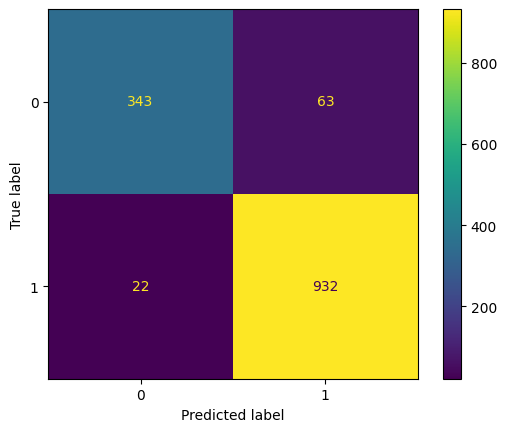

In [326]:
matrix1=confusion_matrix(y_test, y_pred)
ConfusionMatrixDisplay(matrix1).plot()

GRADIENT BOOSTING CLASSIFIER - s ošetrenim outlierov a ngram

In [327]:
gbm_model = GradientBoostingClassifier()
gbm_model.fit(X_train_combined_out, y_train)

GradientBoostingClassifier()

In [328]:
y_pred_train = gbm_model.predict(X_train_combined_out)
print("Presnosť:", accuracy_score(y_train, y_pred_train))
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train))

Presnosť: 0.9984237074401009
Klasifikačný report:
               precision    recall  f1-score   support

           0       1.00      0.99      1.00       935
           1       1.00      1.00      1.00      2237

    accuracy                           1.00      3172
   macro avg       1.00      1.00      1.00      3172
weighted avg       1.00      1.00      1.00      3172



In [329]:
y_pred = gbm_model.predict(X_test_combined_out)
print("Presnosť:", accuracy_score(y_test, y_pred))
print("Klasifikačný report:\n", classification_report(y_test, y_pred))

Presnosť: 0.9602941176470589
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.96      0.90      0.93       406
           1       0.96      0.98      0.97       954

    accuracy                           0.96      1360
   macro avg       0.96      0.94      0.95      1360
weighted avg       0.96      0.96      0.96      1360



In [330]:
results_list1_gbm.append({
        'accuracy_train': accuracy_score(y_train, y_pred_train),
    'accuracy_test': accuracy_score(y_test, y_pred),
    'precision_train': precision_score(y_train, y_pred_train, average='binary'),
    'precision_test': precision_score(y_test, y_pred, average='binary'),
 'recall_train': recall_score(y_train, y_pred_train, average='binary'),
 'recall_test': recall_score(y_test, y_pred, average='binary'),
 'f1_train': f1_score(y_train, y_pred_train, average='binary'),
 'f1_test': f1_score(y_test, y_pred, average='binary')
        
    })

In [331]:
accuracy = accuracy_score(y_test, y_pred)
recall = recall_score(y_test, y_pred, average='binary')  # 'macro' pre nevyvážené triedy, 'binary' pre binárnu klasifikáciu
precision = precision_score(y_test, y_pred, average='binary')
f1 = f1_score(y_test, y_pred, average='binary')

print("Accuracy: {:.2f}".format(accuracy))
print("Recall: {:.2f}".format(recall))
print("Precision: {:.2f}".format(precision))
print("F1 Score: {:.2f}".format(f1))

Accuracy: 0.96
Recall: 0.98
Precision: 0.96
F1 Score: 0.97


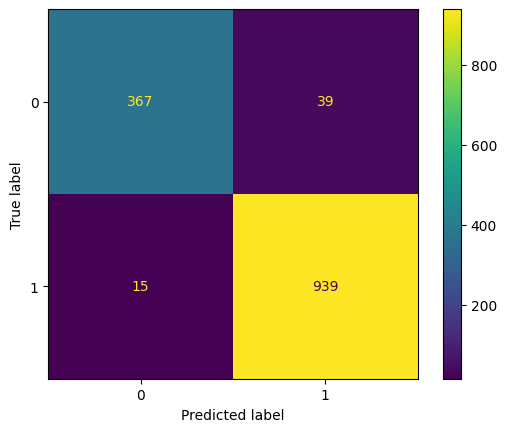

In [332]:
matrix1=confusion_matrix(y_test, y_pred)
ConfusionMatrixDisplay(matrix1).plot()

GRADIENT BOOSTING CLASSIFIER - s ošetrenim outlierov a tfidf ngram

In [333]:
gbm_model = GradientBoostingClassifier()
gbm_model.fit(X_train_combined2_out, y_train)

GradientBoostingClassifier()

In [334]:
y_pred_train = gbm_model.predict(X_train_combined2_out)
print("Presnosť:", accuracy_score(y_train, y_pred_train))
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train))

Presnosť: 0.9987389659520807
Klasifikačný report:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00       935
           1       1.00      1.00      1.00      2237

    accuracy                           1.00      3172
   macro avg       1.00      1.00      1.00      3172
weighted avg       1.00      1.00      1.00      3172



In [335]:
y_pred = gbm_model.predict(X_test_combined2_out)
print("Presnosť:", accuracy_score(y_test, y_pred))
print("Klasifikačný report:\n", classification_report(y_test, y_pred))

Presnosť: 0.9573529411764706
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.96      0.90      0.93       406
           1       0.96      0.98      0.97       954

    accuracy                           0.96      1360
   macro avg       0.96      0.94      0.95      1360
weighted avg       0.96      0.96      0.96      1360



In [336]:
results_list1_gbm.append({
        'accuracy_train': accuracy_score(y_train, y_pred_train),
    'accuracy_test': accuracy_score(y_test, y_pred),
    'precision_train': precision_score(y_train, y_pred_train, average='binary'),
    'precision_test': precision_score(y_test, y_pred, average='binary'),
 'recall_train': recall_score(y_train, y_pred_train, average='binary'),
 'recall_test': recall_score(y_test, y_pred, average='binary'),
 'f1_train': f1_score(y_train, y_pred_train, average='binary'),
 'f1_test': f1_score(y_test, y_pred, average='binary')
        
    })

In [337]:
accuracy = accuracy_score(y_test, y_pred)
recall = recall_score(y_test, y_pred, average='binary')  # 'macro' pre nevyvážené triedy, 'binary' pre binárnu klasifikáciu
precision = precision_score(y_test, y_pred, average='binary')
f1 = f1_score(y_test, y_pred, average='binary')

print("Accuracy: {:.2f}".format(accuracy))
print("Recall: {:.2f}".format(recall))
print("Precision: {:.2f}".format(precision))
print("F1 Score: {:.2f}".format(f1))

Accuracy: 0.96
Recall: 0.98
Precision: 0.96
F1 Score: 0.97


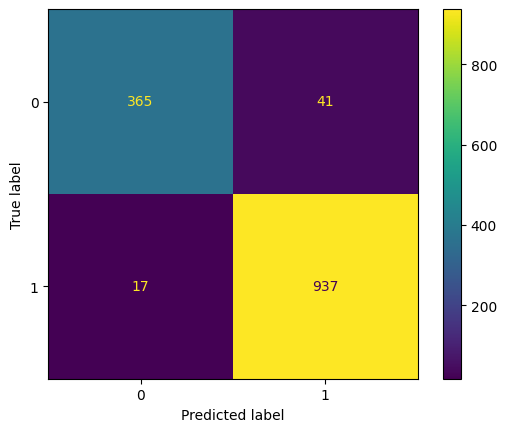

In [338]:
matrix1=confusion_matrix(y_test, y_pred)
ConfusionMatrixDisplay(matrix1).plot()

GRADIENT BOOSTING CLASSIFIER - s ošetrenim outlierov a word frequency

In [339]:
gbm_model = GradientBoostingClassifier()
gbm_model.fit(X_train_combined3_out, y_train)

GradientBoostingClassifier()

In [340]:
y_pred_train = gbm_model.predict(X_train_combined3_out)
print("Presnosť:", accuracy_score(y_train, y_pred_train))
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train))

Presnosť: 0.9959016393442623
Klasifikačný report:
               precision    recall  f1-score   support

           0       1.00      0.99      0.99       935
           1       1.00      1.00      1.00      2237

    accuracy                           1.00      3172
   macro avg       1.00      0.99      1.00      3172
weighted avg       1.00      1.00      1.00      3172



In [341]:
y_pred = gbm_model.predict(X_test_combined3_out)
print("Presnosť:", accuracy_score(y_test, y_pred))
print("Klasifikačný report:\n", classification_report(y_test, y_pred))

Presnosť: 0.9632352941176471
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.97      0.91      0.94       406
           1       0.96      0.99      0.97       954

    accuracy                           0.96      1360
   macro avg       0.96      0.95      0.96      1360
weighted avg       0.96      0.96      0.96      1360



In [342]:
results_list1_gbm.append({
        'accuracy_train': accuracy_score(y_train, y_pred_train),
    'accuracy_test': accuracy_score(y_test, y_pred),
    'precision_train': precision_score(y_train, y_pred_train, average='binary'),
    'precision_test': precision_score(y_test, y_pred, average='binary'),
 'recall_train': recall_score(y_train, y_pred_train, average='binary'),
 'recall_test': recall_score(y_test, y_pred, average='binary'),
 'f1_train': f1_score(y_train, y_pred_train, average='binary'),
 'f1_test': f1_score(y_test, y_pred, average='binary')
        
    })

In [343]:
accuracy = accuracy_score(y_test, y_pred)
recall = recall_score(y_test, y_pred, average='binary')  # 'macro' pre nevyvážené triedy, 'binary' pre binárnu klasifikáciu
precision = precision_score(y_test, y_pred, average='binary')
f1 = f1_score(y_test, y_pred, average='binary')

print("Accuracy: {:.2f}".format(accuracy))
print("Recall: {:.2f}".format(recall))
print("Precision: {:.2f}".format(precision))
print("F1 Score: {:.2f}".format(f1))

Accuracy: 0.96
Recall: 0.99
Precision: 0.96
F1 Score: 0.97


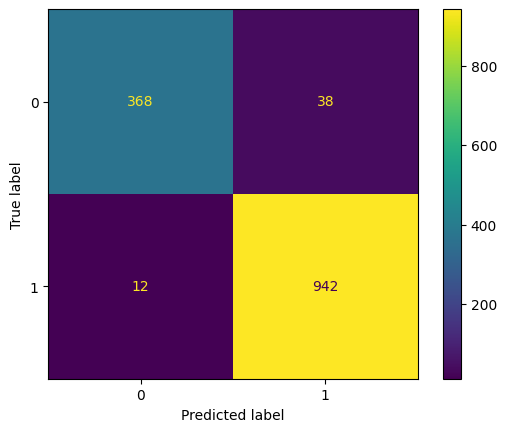

In [344]:
matrix1=confusion_matrix(y_test, y_pred)
ConfusionMatrixDisplay(matrix1).plot()

GRADIENT BOOSTING CLASSIFIER - s ošetrenim outlierov a tfidf word frequency

In [345]:
gbm_model = GradientBoostingClassifier()
gbm_model.fit(X_train_combined4_out, y_train)

GradientBoostingClassifier()

In [346]:
y_pred_train = gbm_model.predict(X_train_combined4_out)
print("Presnosť:", accuracy_score(y_train, y_pred_train))
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train))

Presnosť: 0.9996847414880202
Klasifikačný report:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00       935
           1       1.00      1.00      1.00      2237

    accuracy                           1.00      3172
   macro avg       1.00      1.00      1.00      3172
weighted avg       1.00      1.00      1.00      3172



In [347]:
y_pred = gbm_model.predict(X_test_combined4_out)
print("Presnosť:", accuracy_score(y_test, y_pred))
print("Klasifikačný report:\n", classification_report(y_test, y_pred))

Presnosť: 0.9595588235294118
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.97      0.89      0.93       406
           1       0.95      0.99      0.97       954

    accuracy                           0.96      1360
   macro avg       0.96      0.94      0.95      1360
weighted avg       0.96      0.96      0.96      1360



In [348]:
results_list1_gbm.append({
        'accuracy_train': accuracy_score(y_train, y_pred_train),
    'accuracy_test': accuracy_score(y_test, y_pred),
    'precision_train': precision_score(y_train, y_pred_train, average='binary'),
    'precision_test': precision_score(y_test, y_pred, average='binary'),
 'recall_train': recall_score(y_train, y_pred_train, average='binary'),
 'recall_test': recall_score(y_test, y_pred, average='binary'),
 'f1_train': f1_score(y_train, y_pred_train, average='binary'),
 'f1_test': f1_score(y_test, y_pred, average='binary')
        
    })

In [349]:
accuracy = accuracy_score(y_test, y_pred)
recall = recall_score(y_test, y_pred, average='binary')  # 'macro' pre nevyvážené triedy, 'binary' pre binárnu klasifikáciu
precision = precision_score(y_test, y_pred, average='binary')
f1 = f1_score(y_test, y_pred, average='binary')

print("Accuracy: {:.2f}".format(accuracy))
print("Recall: {:.2f}".format(recall))
print("Precision: {:.2f}".format(precision))
print("F1 Score: {:.2f}".format(f1))

Accuracy: 0.96
Recall: 0.99
Precision: 0.95
F1 Score: 0.97


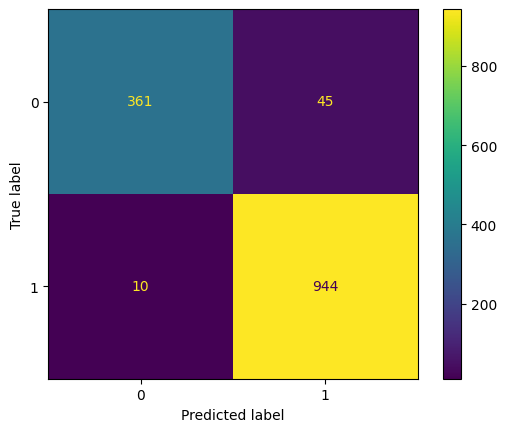

In [350]:
matrix1=confusion_matrix(y_test, y_pred)
ConfusionMatrixDisplay(matrix1).plot()

GRADIENT BOOSTING CLASSIFIER - so skalovanim

In [351]:
gbm_model = GradientBoostingClassifier()
gbm_model.fit(X_train_scaled, y_train)

GradientBoostingClassifier()

In [352]:
y_pred_train = gbm_model.predict(X_train_scaled)
print("Presnosť:", accuracy_score(y_train, y_pred_train))
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train))

Presnosť: 0.855296343001261
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.89      0.59      0.70       935
           1       0.85      0.97      0.90      2237

    accuracy                           0.86      3172
   macro avg       0.87      0.78      0.80      3172
weighted avg       0.86      0.86      0.85      3172



In [353]:
y_pred = gbm_model.predict(X_test_scaled)
print("Presnosť:", accuracy_score(y_test, y_pred))
print("Klasifikačný report:\n", classification_report(y_test, y_pred))

Presnosť: 0.7727941176470589
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.72      0.39      0.51       406
           1       0.78      0.93      0.85       954

    accuracy                           0.77      1360
   macro avg       0.75      0.66      0.68      1360
weighted avg       0.76      0.77      0.75      1360



In [354]:
results_list1_gbm.append({
        'accuracy_train': accuracy_score(y_train, y_pred_train),
    'accuracy_test': accuracy_score(y_test, y_pred),
    'precision_train': precision_score(y_train, y_pred_train, average='binary'),
    'precision_test': precision_score(y_test, y_pred, average='binary'),
 'recall_train': recall_score(y_train, y_pred_train, average='binary'),
 'recall_test': recall_score(y_test, y_pred, average='binary'),
 'f1_train': f1_score(y_train, y_pred_train, average='binary'),
 'f1_test': f1_score(y_test, y_pred, average='binary')
        
    })

In [355]:
accuracy = accuracy_score(y_test, y_pred)
recall = recall_score(y_test, y_pred, average='binary')  # 'macro' pre nevyvážené triedy, 'binary' pre binárnu klasifikáciu
precision = precision_score(y_test, y_pred, average='binary')
f1 = f1_score(y_test, y_pred, average='binary')

print("Accuracy: {:.2f}".format(accuracy))
print("Recall: {:.2f}".format(recall))
print("Precision: {:.2f}".format(precision))
print("F1 Score: {:.2f}".format(f1))

Accuracy: 0.77
Recall: 0.93
Precision: 0.78
F1 Score: 0.85


GRADIENT BOOSTING CLASSIFIER - so skalovanim a ngram

In [356]:
gbm_model = GradientBoostingClassifier()
gbm_model.fit(X_train_combined_scaled, y_train)

GradientBoostingClassifier()

In [357]:
y_pred_train = gbm_model.predict(X_train_combined_scaled)
print("Presnosť:", accuracy_score(y_train, y_pred_train))
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train))

Presnosť: 0.9719419924337958
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.98      0.93      0.95       935
           1       0.97      0.99      0.98      2237

    accuracy                           0.97      3172
   macro avg       0.97      0.96      0.97      3172
weighted avg       0.97      0.97      0.97      3172



In [358]:
y_pred = gbm_model.predict(X_test_combined_scaled)
print("Presnosť:", accuracy_score(y_test, y_pred))
print("Klasifikačný report:\n", classification_report(y_test, y_pred))

Presnosť: 0.9066176470588235
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.88      0.80      0.84       406
           1       0.92      0.95      0.93       954

    accuracy                           0.91      1360
   macro avg       0.90      0.87      0.89      1360
weighted avg       0.91      0.91      0.91      1360



In [359]:
results_list1_gbm.append({
        'accuracy_train': accuracy_score(y_train, y_pred_train),
    'accuracy_test': accuracy_score(y_test, y_pred),
    'precision_train': precision_score(y_train, y_pred_train, average='binary'),
    'precision_test': precision_score(y_test, y_pred, average='binary'),
 'recall_train': recall_score(y_train, y_pred_train, average='binary'),
 'recall_test': recall_score(y_test, y_pred, average='binary'),
 'f1_train': f1_score(y_train, y_pred_train, average='binary'),
 'f1_test': f1_score(y_test, y_pred, average='binary')
        
    })

In [360]:
accuracy = accuracy_score(y_test, y_pred)
recall = recall_score(y_test, y_pred, average='binary')  # 'macro' pre nevyvážené triedy, 'binary' pre binárnu klasifikáciu
precision = precision_score(y_test, y_pred, average='binary')
f1 = f1_score(y_test, y_pred, average='binary')

print("Accuracy: {:.2f}".format(accuracy))
print("Recall: {:.2f}".format(recall))
print("Precision: {:.2f}".format(precision))
print("F1 Score: {:.2f}".format(f1))

Accuracy: 0.91
Recall: 0.95
Precision: 0.92
F1 Score: 0.93


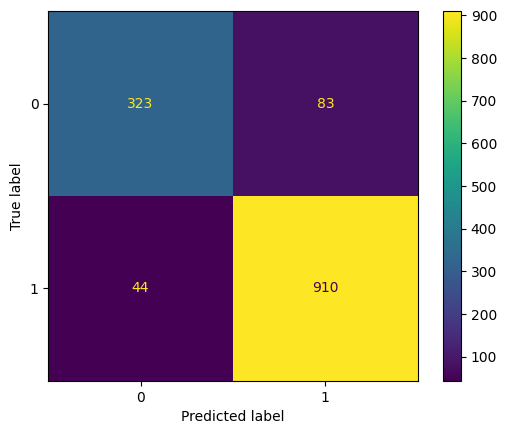

In [361]:
matrix1=confusion_matrix(y_test, y_pred)
ConfusionMatrixDisplay(matrix1).plot()

GRADIENT BOOSTING CLASSIFIER - so skalovanim a tfidf ngram

In [362]:
gbm_model = GradientBoostingClassifier()
gbm_model.fit(X_train_combined2_scaled, y_train)

GradientBoostingClassifier()

In [363]:
y_pred_train = gbm_model.predict(X_train_combined2_scaled)
print("Presnosť:", accuracy_score(y_train, y_pred_train))
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train))

Presnosť: 0.9735182849936949
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.97      0.94      0.95       935
           1       0.97      0.99      0.98      2237

    accuracy                           0.97      3172
   macro avg       0.97      0.96      0.97      3172
weighted avg       0.97      0.97      0.97      3172



In [364]:
y_pred = gbm_model.predict(X_test_combined2_scaled)
print("Presnosť:", accuracy_score(y_test, y_pred))
print("Klasifikačný report:\n", classification_report(y_test, y_pred))

Presnosť: 0.8977941176470589
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.88      0.76      0.82       406
           1       0.90      0.96      0.93       954

    accuracy                           0.90      1360
   macro avg       0.89      0.86      0.87      1360
weighted avg       0.90      0.90      0.90      1360



In [365]:
results_list1_gbm.append({
        'accuracy_train': accuracy_score(y_train, y_pred_train),
    'accuracy_test': accuracy_score(y_test, y_pred),
    'precision_train': precision_score(y_train, y_pred_train, average='binary'),
    'precision_test': precision_score(y_test, y_pred, average='binary'),
 'recall_train': recall_score(y_train, y_pred_train, average='binary'),
 'recall_test': recall_score(y_test, y_pred, average='binary'),
 'f1_train': f1_score(y_train, y_pred_train, average='binary'),
 'f1_test': f1_score(y_test, y_pred, average='binary')
        
    })

In [366]:
accuracy = accuracy_score(y_test, y_pred)
recall = recall_score(y_test, y_pred, average='binary')  # 'macro' pre nevyvážené triedy, 'binary' pre binárnu klasifikáciu
precision = precision_score(y_test, y_pred, average='binary')
f1 = f1_score(y_test, y_pred, average='binary')

print("Accuracy: {:.2f}".format(accuracy))
print("Recall: {:.2f}".format(recall))
print("Precision: {:.2f}".format(precision))
print("F1 Score: {:.2f}".format(f1))

Accuracy: 0.90
Recall: 0.96
Precision: 0.90
F1 Score: 0.93


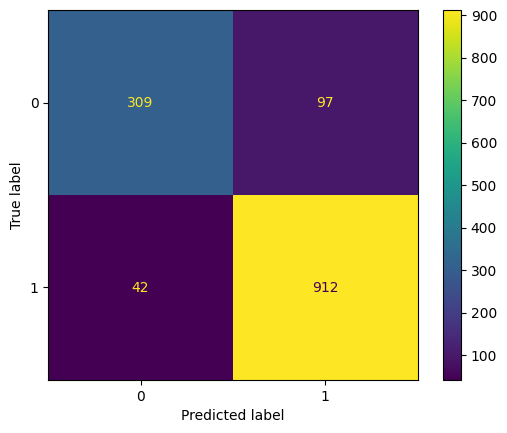

In [367]:
matrix1=confusion_matrix(y_test, y_pred)
ConfusionMatrixDisplay(matrix1).plot()

GRADIENT BOOSTING CLASSIFIER - so skalovanim a word frequency

In [368]:
gbm_model = GradientBoostingClassifier()
gbm_model.fit(X_train_combined3_scaled, y_train)

GradientBoostingClassifier()

In [369]:
y_pred_train = gbm_model.predict(X_train_combined3_scaled)
print("Presnosť:", accuracy_score(y_train, y_pred_train))
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train))

Presnosť: 0.9618537200504413
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.96      0.91      0.93       935
           1       0.96      0.98      0.97      2237

    accuracy                           0.96      3172
   macro avg       0.96      0.95      0.95      3172
weighted avg       0.96      0.96      0.96      3172



In [370]:
y_pred = gbm_model.predict(X_test_combined3_scaled)
print("Presnosť:", accuracy_score(y_test, y_pred))
print("Klasifikačný report:\n", classification_report(y_test, y_pred))

Presnosť: 0.8963235294117647
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.87      0.77      0.82       406
           1       0.91      0.95      0.93       954

    accuracy                           0.90      1360
   macro avg       0.89      0.86      0.87      1360
weighted avg       0.90      0.90      0.89      1360



In [371]:
results_list1_gbm.append({
        'accuracy_train': accuracy_score(y_train, y_pred_train),
    'accuracy_test': accuracy_score(y_test, y_pred),
    'precision_train': precision_score(y_train, y_pred_train, average='binary'),
    'precision_test': precision_score(y_test, y_pred, average='binary'),
 'recall_train': recall_score(y_train, y_pred_train, average='binary'),
 'recall_test': recall_score(y_test, y_pred, average='binary'),
 'f1_train': f1_score(y_train, y_pred_train, average='binary'),
 'f1_test': f1_score(y_test, y_pred, average='binary')
        
    })

In [372]:
accuracy = accuracy_score(y_test, y_pred)
recall = recall_score(y_test, y_pred, average='binary')  # 'macro' pre nevyvážené triedy, 'binary' pre binárnu klasifikáciu
precision = precision_score(y_test, y_pred, average='binary')
f1 = f1_score(y_test, y_pred, average='binary')

print("Accuracy: {:.2f}".format(accuracy))
print("Recall: {:.2f}".format(recall))
print("Precision: {:.2f}".format(precision))
print("F1 Score: {:.2f}".format(f1))

Accuracy: 0.90
Recall: 0.95
Precision: 0.91
F1 Score: 0.93


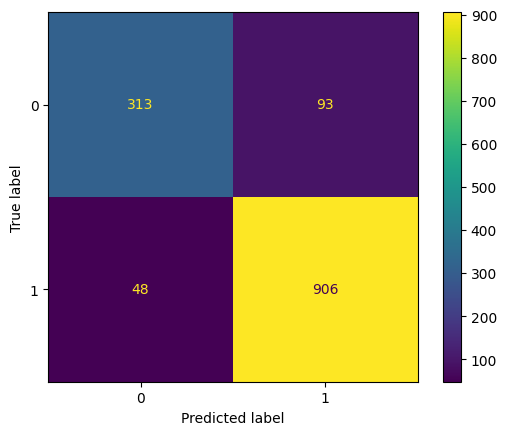

In [373]:
matrix1=confusion_matrix(y_test, y_pred)
ConfusionMatrixDisplay(matrix1).plot()

GRADIENT BOOSTING CLASSIFIER - so skalovanim a tfidf word frequency

In [374]:
gbm_model = GradientBoostingClassifier()
gbm_model.fit(X_train_combined4_scaled, y_train)

GradientBoostingClassifier()

In [375]:
y_pred_train = gbm_model.predict(X_train_combined4_scaled)
print("Presnosť:", accuracy_score(y_train, y_pred_train))
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train))

Presnosť: 0.973203026481715
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.97      0.93      0.95       935
           1       0.97      0.99      0.98      2237

    accuracy                           0.97      3172
   macro avg       0.97      0.96      0.97      3172
weighted avg       0.97      0.97      0.97      3172



In [376]:
y_pred = gbm_model.predict(X_test_combined4_scaled)
print("Presnosť:", accuracy_score(y_test, y_pred))
print("Klasifikačný report:\n", classification_report(y_test, y_pred))

Presnosť: 0.9044117647058824
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.89      0.78      0.83       406
           1       0.91      0.96      0.93       954

    accuracy                           0.90      1360
   macro avg       0.90      0.87      0.88      1360
weighted avg       0.90      0.90      0.90      1360



In [377]:
results_list1_gbm.append({
        'accuracy_train': accuracy_score(y_train, y_pred_train),
    'accuracy_test': accuracy_score(y_test, y_pred),
    'precision_train': precision_score(y_train, y_pred_train, average='binary'),
    'precision_test': precision_score(y_test, y_pred, average='binary'),
 'recall_train': recall_score(y_train, y_pred_train, average='binary'),
 'recall_test': recall_score(y_test, y_pred, average='binary'),
 'f1_train': f1_score(y_train, y_pred_train, average='binary'),
 'f1_test': f1_score(y_test, y_pred, average='binary')
        
    })

In [378]:
accuracy = accuracy_score(y_test, y_pred)
recall = recall_score(y_test, y_pred, average='binary')  # 'macro' pre nevyvážené triedy, 'binary' pre binárnu klasifikáciu
precision = precision_score(y_test, y_pred, average='binary')
f1 = f1_score(y_test, y_pred, average='binary')

print("Accuracy: {:.2f}".format(accuracy))
print("Recall: {:.2f}".format(recall))
print("Precision: {:.2f}".format(precision))
print("F1 Score: {:.2f}".format(f1))

Accuracy: 0.90
Recall: 0.96
Precision: 0.91
F1 Score: 0.93


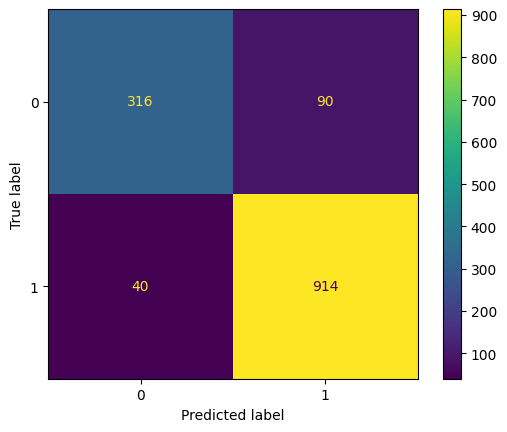

In [379]:
matrix1=confusion_matrix(y_test, y_pred)
ConfusionMatrixDisplay(matrix1).plot()

GRADIENT BOOSTING CLASSIFIER - s ošetrenim outlierov a skalovanim

In [380]:
gbm_model = GradientBoostingClassifier()
gbm_model.fit(X_train_scal_out, y_train)

GradientBoostingClassifier()

In [381]:
y_pred_train = gbm_model.predict(X_train_scal_out)
print("Presnosť:", accuracy_score(y_train, y_pred_train))
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train))

Presnosť: 0.9706809583858764
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.98      0.92      0.95       935
           1       0.97      0.99      0.98      2237

    accuracy                           0.97      3172
   macro avg       0.97      0.96      0.96      3172
weighted avg       0.97      0.97      0.97      3172



In [382]:
y_pred = gbm_model.predict(X_test_scal_out)
print("Presnosť:", accuracy_score(y_test, y_pred))
print("Klasifikačný report:\n", classification_report(y_test, y_pred))

Presnosť: 0.9375
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.94      0.84      0.89       406
           1       0.94      0.98      0.96       954

    accuracy                           0.94      1360
   macro avg       0.94      0.91      0.92      1360
weighted avg       0.94      0.94      0.94      1360



In [383]:
results_list1_gbm.append({
        'accuracy_train': accuracy_score(y_train, y_pred_train),
    'accuracy_test': accuracy_score(y_test, y_pred),
    'precision_train': precision_score(y_train, y_pred_train, average='binary'),
    'precision_test': precision_score(y_test, y_pred, average='binary'),
 'recall_train': recall_score(y_train, y_pred_train, average='binary'),
 'recall_test': recall_score(y_test, y_pred, average='binary'),
 'f1_train': f1_score(y_train, y_pred_train, average='binary'),
 'f1_test': f1_score(y_test, y_pred, average='binary')
        
    })

In [384]:
accuracy = accuracy_score(y_test, y_pred)
recall = recall_score(y_test, y_pred, average='binary')  # 'macro' pre nevyvážené triedy, 'binary' pre binárnu klasifikáciu
precision = precision_score(y_test, y_pred, average='binary')
f1 = f1_score(y_test, y_pred, average='binary')

print("Accuracy: {:.2f}".format(accuracy))
print("Recall: {:.2f}".format(recall))
print("Precision: {:.2f}".format(precision))
print("F1 Score: {:.2f}".format(f1))

Accuracy: 0.94
Recall: 0.98
Precision: 0.94
F1 Score: 0.96


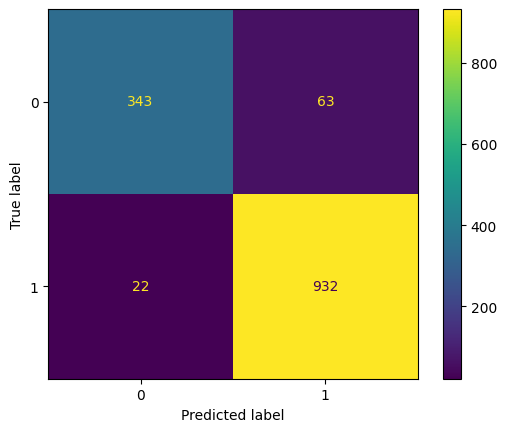

In [385]:
matrix1=confusion_matrix(y_test, y_pred)
ConfusionMatrixDisplay(matrix1).plot()

GRADIENT BOOSTING CLASSIFIER - s ošetrenim outlierov a skalovanim a ngram

In [386]:
gbm_model = GradientBoostingClassifier()
gbm_model.fit(X_train_combined_scal_out, y_train)

GradientBoostingClassifier()

In [387]:
y_pred_train = gbm_model.predict(X_train_combined_scal_out)
print("Presnosť:", accuracy_score(y_train, y_pred_train))
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train))

Presnosť: 0.9984237074401009
Klasifikačný report:
               precision    recall  f1-score   support

           0       1.00      0.99      1.00       935
           1       1.00      1.00      1.00      2237

    accuracy                           1.00      3172
   macro avg       1.00      1.00      1.00      3172
weighted avg       1.00      1.00      1.00      3172



In [388]:
y_pred = gbm_model.predict(X_test_combined_scal_out)
print("Presnosť:", accuracy_score(y_test, y_pred))
print("Klasifikačný report:\n", classification_report(y_test, y_pred))

Presnosť: 0.9602941176470589
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.96      0.90      0.93       406
           1       0.96      0.98      0.97       954

    accuracy                           0.96      1360
   macro avg       0.96      0.94      0.95      1360
weighted avg       0.96      0.96      0.96      1360



In [389]:
results_list1_gbm.append({
        'accuracy_train': accuracy_score(y_train, y_pred_train),
    'accuracy_test': accuracy_score(y_test, y_pred),
    'precision_train': precision_score(y_train, y_pred_train, average='binary'),
    'precision_test': precision_score(y_test, y_pred, average='binary'),
 'recall_train': recall_score(y_train, y_pred_train, average='binary'),
 'recall_test': recall_score(y_test, y_pred, average='binary'),
 'f1_train': f1_score(y_train, y_pred_train, average='binary'),
 'f1_test': f1_score(y_test, y_pred, average='binary')
        
    })

In [390]:
accuracy = accuracy_score(y_test, y_pred)
recall = recall_score(y_test, y_pred, average='binary')  # 'macro' pre nevyvážené triedy, 'binary' pre binárnu klasifikáciu
precision = precision_score(y_test, y_pred, average='binary')
f1 = f1_score(y_test, y_pred, average='binary')

print("Accuracy: {:.2f}".format(accuracy))
print("Recall: {:.2f}".format(recall))
print("Precision: {:.2f}".format(precision))
print("F1 Score: {:.2f}".format(f1))

Accuracy: 0.96
Recall: 0.98
Precision: 0.96
F1 Score: 0.97


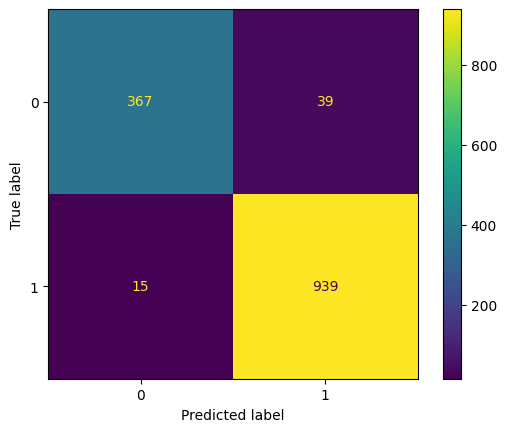

In [391]:
matrix1=confusion_matrix(y_test, y_pred)
ConfusionMatrixDisplay(matrix1).plot()

GRADIENT BOOSTING CLASSIFIER - s ošetrenim outlierov a skalovanim a tfidf ngram

In [392]:
gbm_model = GradientBoostingClassifier()
gbm_model.fit(X_train_combined2_scal_out, y_train)

GradientBoostingClassifier()

In [393]:
y_pred_train = gbm_model.predict(X_train_combined2_scal_out)
print("Presnosť:", accuracy_score(y_train, y_pred_train))
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train))

Presnosť: 0.9987389659520807
Klasifikačný report:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00       935
           1       1.00      1.00      1.00      2237

    accuracy                           1.00      3172
   macro avg       1.00      1.00      1.00      3172
weighted avg       1.00      1.00      1.00      3172



In [394]:
y_pred = gbm_model.predict(X_test_combined2_scal_out)
print("Presnosť:", accuracy_score(y_test, y_pred))
print("Klasifikačný report:\n", classification_report(y_test, y_pred))

Presnosť: 0.9573529411764706
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.96      0.90      0.93       406
           1       0.96      0.98      0.97       954

    accuracy                           0.96      1360
   macro avg       0.96      0.94      0.95      1360
weighted avg       0.96      0.96      0.96      1360



In [395]:
results_list1_gbm.append({
        'accuracy_train': accuracy_score(y_train, y_pred_train),
    'accuracy_test': accuracy_score(y_test, y_pred),
    'precision_train': precision_score(y_train, y_pred_train, average='binary'),
    'precision_test': precision_score(y_test, y_pred, average='binary'),
 'recall_train': recall_score(y_train, y_pred_train, average='binary'),
 'recall_test': recall_score(y_test, y_pred, average='binary'),
 'f1_train': f1_score(y_train, y_pred_train, average='binary'),
 'f1_test': f1_score(y_test, y_pred, average='binary')
        
    })

In [396]:
accuracy = accuracy_score(y_test, y_pred)
recall = recall_score(y_test, y_pred, average='binary')  # 'macro' pre nevyvážené triedy, 'binary' pre binárnu klasifikáciu
precision = precision_score(y_test, y_pred, average='binary')
f1 = f1_score(y_test, y_pred, average='binary')

print("Accuracy: {:.2f}".format(accuracy))
print("Recall: {:.2f}".format(recall))
print("Precision: {:.2f}".format(precision))
print("F1 Score: {:.2f}".format(f1))

Accuracy: 0.96
Recall: 0.98
Precision: 0.96
F1 Score: 0.97


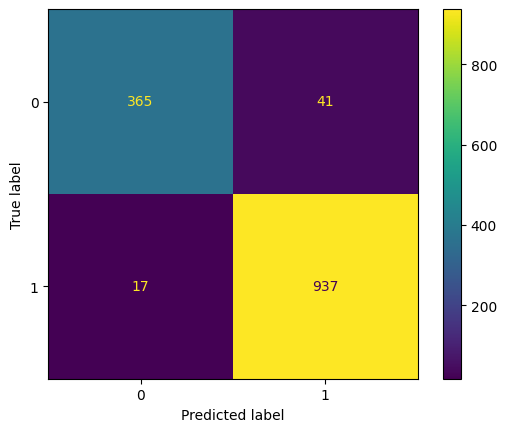

In [397]:
matrix1=confusion_matrix(y_test, y_pred)
ConfusionMatrixDisplay(matrix1).plot()

GRADIENT BOOSTING CLASSIFIER - s ošetrenim outlierov a skalovanim a word frequency

In [398]:
gbm_model = GradientBoostingClassifier()
gbm_model.fit(X_train_combined3_scal_out, y_train)

GradientBoostingClassifier()

In [399]:
y_pred_train = gbm_model.predict(X_train_combined3_scal_out)
print("Presnosť:", accuracy_score(y_train, y_pred_train))
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train))

Presnosť: 0.9959016393442623
Klasifikačný report:
               precision    recall  f1-score   support

           0       1.00      0.99      0.99       935
           1       1.00      1.00      1.00      2237

    accuracy                           1.00      3172
   macro avg       1.00      0.99      1.00      3172
weighted avg       1.00      1.00      1.00      3172



In [400]:
y_pred = gbm_model.predict(X_test_combined3_scal_out)
print("Presnosť:", accuracy_score(y_test, y_pred))
print("Klasifikačný report:\n", classification_report(y_test, y_pred))

Presnosť: 0.9632352941176471
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.97      0.91      0.94       406
           1       0.96      0.99      0.97       954

    accuracy                           0.96      1360
   macro avg       0.96      0.95      0.96      1360
weighted avg       0.96      0.96      0.96      1360



In [401]:
results_list1_gbm.append({
        'accuracy_train': accuracy_score(y_train, y_pred_train),
    'accuracy_test': accuracy_score(y_test, y_pred),
    'precision_train': precision_score(y_train, y_pred_train, average='binary'),
    'precision_test': precision_score(y_test, y_pred, average='binary'),
 'recall_train': recall_score(y_train, y_pred_train, average='binary'),
 'recall_test': recall_score(y_test, y_pred, average='binary'),
 'f1_train': f1_score(y_train, y_pred_train, average='binary'),
 'f1_test': f1_score(y_test, y_pred, average='binary')
        
    })

In [402]:
accuracy = accuracy_score(y_test, y_pred)
recall = recall_score(y_test, y_pred, average='binary')  # 'macro' pre nevyvážené triedy, 'binary' pre binárnu klasifikáciu
precision = precision_score(y_test, y_pred, average='binary')
f1 = f1_score(y_test, y_pred, average='binary')

print("Accuracy: {:.2f}".format(accuracy))
print("Recall: {:.2f}".format(recall))
print("Precision: {:.2f}".format(precision))
print("F1 Score: {:.2f}".format(f1))

Accuracy: 0.96
Recall: 0.99
Precision: 0.96
F1 Score: 0.97


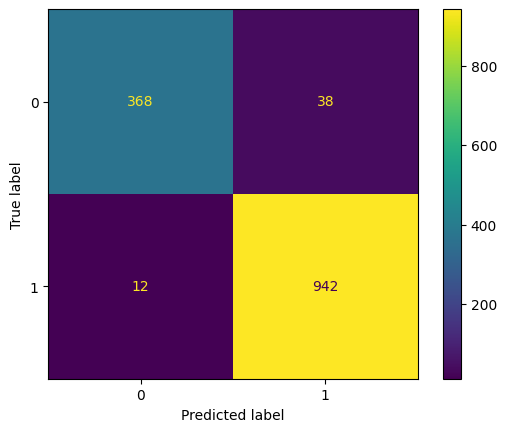

In [403]:
matrix1=confusion_matrix(y_test, y_pred)
ConfusionMatrixDisplay(matrix1).plot()

GRADIENT BOOSTING CLASSIFIER - s ošetrenim outlierov a skalovanim a tfidf word frequency

In [404]:
gbm_model = GradientBoostingClassifier()
gbm_model.fit(X_train_combined4_scal_out, y_train)

GradientBoostingClassifier()

In [405]:
y_pred_train = gbm_model.predict(X_train_combined4_scal_out)
print("Presnosť:", accuracy_score(y_train, y_pred_train))
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train))

Presnosť: 0.9996847414880202
Klasifikačný report:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00       935
           1       1.00      1.00      1.00      2237

    accuracy                           1.00      3172
   macro avg       1.00      1.00      1.00      3172
weighted avg       1.00      1.00      1.00      3172



In [406]:
y_pred = gbm_model.predict(X_test_combined4_scal_out)
print("Presnosť:", accuracy_score(y_test, y_pred))
print("Klasifikačný report:\n", classification_report(y_test, y_pred))

Presnosť: 0.9595588235294118
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.97      0.89      0.93       406
           1       0.95      0.99      0.97       954

    accuracy                           0.96      1360
   macro avg       0.96      0.94      0.95      1360
weighted avg       0.96      0.96      0.96      1360



In [407]:
results_list1_gbm.append({
        'accuracy_train': accuracy_score(y_train, y_pred_train),
    'accuracy_test': accuracy_score(y_test, y_pred),
    'precision_train': precision_score(y_train, y_pred_train, average='binary'),
    'precision_test': precision_score(y_test, y_pred, average='binary'),
 'recall_train': recall_score(y_train, y_pred_train, average='binary'),
 'recall_test': recall_score(y_test, y_pred, average='binary'),
 'f1_train': f1_score(y_train, y_pred_train, average='binary'),
 'f1_test': f1_score(y_test, y_pred, average='binary')
        
    })

In [408]:
accuracy = accuracy_score(y_test, y_pred)
recall = recall_score(y_test, y_pred, average='binary')  # 'macro' pre nevyvážené triedy, 'binary' pre binárnu klasifikáciu
precision = precision_score(y_test, y_pred, average='binary')
f1 = f1_score(y_test, y_pred, average='binary')

print("Accuracy: {:.2f}".format(accuracy))
print("Recall: {:.2f}".format(recall))
print("Precision: {:.2f}".format(precision))
print("F1 Score: {:.2f}".format(f1))

Accuracy: 0.96
Recall: 0.99
Precision: 0.95
F1 Score: 0.97


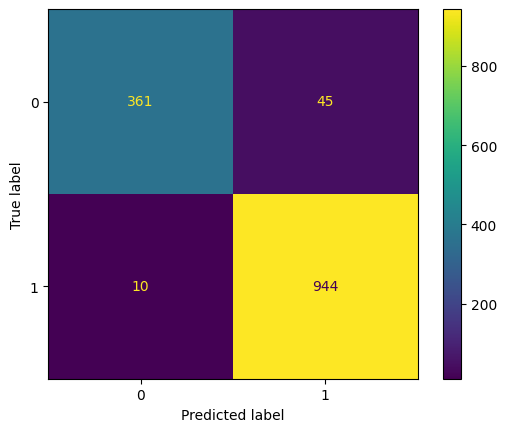

In [409]:
matrix1=confusion_matrix(y_test, y_pred)
ConfusionMatrixDisplay(matrix1).plot()

In [410]:
results_gbm1 = pd.DataFrame(results_list1_gbm)
print(results_gbm1)

    accuracy_train  accuracy_test  precision_train  precision_test  \
0         0.855296       0.772794         0.848081        0.783641   
1         0.971942       0.905147         0.970228        0.914573   
2         0.973518       0.897059         0.974857        0.902970   
3         0.961854       0.895588         0.964442        0.906000   
4         0.973203       0.903676         0.973175        0.910269   
5         0.970681       0.937500         0.966899        0.936683   
6         0.998424       0.960294         0.997770        0.960123   
7         0.998739       0.957353         0.998660        0.958078   
8         0.995902       0.963235         0.995102        0.961224   
9         0.999685       0.959559         0.999553        0.954499   
10        0.855296       0.772794         0.848081        0.783641   
11        0.971942       0.906618         0.970228        0.916415   
12        0.973518       0.897794         0.974857        0.903865   
13        0.961854  

Podľa výsledkov po prvom testovani GBM môžeme vidieť, že najlepší výsledok mal dataset s ošetrenými outliermi a s frekvenciou slov a dataset s ošetrenými outliermi a skalovanim a s frekvenciou slov. Takže je zrejme, že najväčší vplyv na úspešnosť malo ošetrenie outlierov a pridávanie textových reprezentácií. Tento model má zatiaľ najvyššiu presnosť.

VYBER CRT

In [411]:
X_train.info()

<class 'pandas.core.frame.DataFrame'>
Index: 3172 entries, 1811 to 2258
Data columns (total 51 columns):
 #   Column                                  Non-Null Count  Dtype  
---  ------                                  --------------  -----  
 0   average_emoji                           3172 non-null   float64
 1   average_urls                            3172 non-null   float64
 2   average_mentions                        3172 non-null   float64
 3   average_hashtags                        3172 non-null   float64
 4   average_digits                          3172 non-null   float64
 5   average_uppercase                       3172 non-null   float64
 6   average_lowercase                       3172 non-null   float64
 7   average_non_alpha                       3172 non-null   float64
 8   average_quotes_per_tweet                3172 non-null   float64
 9   average_apostrophe_per_tweet            3172 non-null   float64
 10  average_punctuation_per_tweet           3172 non-null   float6

SVC - FORWARD SELECTION - najdenie najlepšej črty pre accuracy  modelu, následne hľadanie dalšej najlepšej ktorá pridá na accuracy...

In [412]:

model = SVC()

# Získajte zoznam všetkých vlastností v trénovacom datasete
features = list(X_train.columns)
selected_features = []
best_acc = 0

# Proces postupného pridávania prvkov (Forward Selection)
while features:
    best_feature = None
    for feature in features:
        # Skúška pridania súčasného prvku do zoznamu vybraných prvkov
        candidate_features = selected_features + [feature]
        candidate_feature_indices = [X_train.columns.get_loc(feat) for feat in candidate_features]

        # Vytvorenie trénovacieho a testovacieho datasetu len so zvolenými prvkami
        X_train_selected = X_train.iloc[:, candidate_feature_indices]
        X_test_selected = X_test.iloc[:, candidate_feature_indices]

        # Trénovanie modelu na vybraných prvkoch
        model.fit(X_train_selected, y_train)
        predictions = model.predict(X_test_selected)
        acc = accuracy_score(y_test, predictions)

        # Ak je nová presnosť vyššia ako najlepšia doterajšia, aktualizuj najlepšiu presnosť a ulož prvok
        if acc > best_acc:
            best_acc = acc
            best_feature = feature

    # Ak bol nájdený lepší prvok, pridaj ho do zoznamu vybraných prvkov
    if best_feature:
        selected_features.append(best_feature)
        features.remove(best_feature)
        print(f"Pridaný prvok {best_feature} do modelu, presnosť: {best_acc}")
    else:
        break  # Ak žiaden prvok nezlepšil model, ukonči cyklus

# Výpis a uloženie vybraných prvkov pre konečný model
print(f"Vybrané prvky: {selected_features}")
X_train_svc = X_train.loc[:, selected_features].copy()
X_test_svc = X_test.loc[:, selected_features].copy()


Pridaný prvok average_repeats_per_tweet do modelu, presnosť: 0.7154411764705882
Pridaný prvok average_sentiment_score do modelu, presnosť: 0.7198529411764706
Pridaný prvok average_cognitive_word_per_tweet do modelu, presnosť: 0.725
Vybrané prvky: ['average_repeats_per_tweet', 'average_sentiment_score', 'average_cognitive_word_per_tweet']


SVC - ošetrený outlieri

In [413]:

model = SVC()

features = list(X_train_out.columns)
selected_features = []
best_acc = 0

# Proces postupného pridávania prvkov (Forward Selection)
while features:
    best_feature = None
    for feature in features:
        # Testovanie pridania súčasného prvku do zoznamu vybraných prvkov
        candidate_features = selected_features + [feature]
        candidate_feature_indices = [X_train_out.columns.get_loc(feat) for feat in candidate_features]

        # Vytvorenie trénovacieho a testovacieho datasetu len so zvolenými prvkami
        X_train_selected = X_train_out.iloc[:, candidate_feature_indices]
        X_test_selected = X_test_out.iloc[:, candidate_feature_indices]

        # Trénovanie modelu na vybraných prvkoch
        model.fit(X_train_selected, y_train)
        predictions = model.predict(X_test_selected)
        acc = accuracy_score(y_test, predictions)

        # Ak je nová presnosť vyššia ako najlepšia doterajšia, aktualizuj najlepšiu presnosť a ulož prvok
        if acc > best_acc:
            best_acc = acc
            best_feature = feature

    # Ak bol nájdený lepší prvok, pridaj ho do zoznamu vybraných prvkov
    if best_feature:
        selected_features.append(best_feature)
        features.remove(best_feature)
        print(f"Pridaný prvok {best_feature} do modelu, presnosť: {best_acc}")
    else:
        break  # Ak žiaden prvok nezlepšil model, ukonči cyklus

# Výpis a uloženie vybraných prvkov pre konečný model
print(f"Vybrané prvky: {selected_features}")
X_train_out_svc = X_train_out.loc[:, selected_features].copy()
X_test_out_svc = X_test_out.loc[:, selected_features].copy()

Pridaný prvok imperative_percent do modelu, presnosť: 0.7272058823529411
Pridaný prvok average_non_alpha do modelu, presnosť: 0.7463235294117647
Vybrané prvky: ['imperative_percent', 'average_non_alpha']


SVC-scalovanie

In [414]:

model = SVC()

features = list(X_train_scaled.columns)
selected_features = []
best_acc = 0

# Proces postupného pridávania prvkov (Forward Selection)
while features:
    best_feature = None
    for feature in features:
        # Testovanie pridania súčasného prvku do zoznamu vybraných prvkov
        candidate_features = selected_features + [feature]
        candidate_feature_indices = [X_train_scaled.columns.get_loc(feat) for feat in candidate_features]

        # Vytvorenie trénovacieho a testovacieho datasetu len so zvolenými prvkami
        X_train_selected = X_train_scaled.iloc[:, candidate_feature_indices]
        X_test_selected = X_test_scaled.iloc[:, candidate_feature_indices]

        # Trénovanie modelu na vybraných prvkoch
        model.fit(X_train_selected, y_train)
        predictions = model.predict(X_test_selected)
        acc = accuracy_score(y_test, predictions)

        # Ak je nová presnosť vyššia ako najlepšia doterajšia, aktualizuj najlepšiu presnosť a ulož prvok
        if acc > best_acc:
            best_acc = acc
            best_feature = feature

    # Ak bol nájdený lepší prvok, pridaj ho do zoznamu vybraných prvkov
    if best_feature:
        selected_features.append(best_feature)
        features.remove(best_feature)
        print(f"Pridaný prvok {best_feature} do modelu, presnosť: {best_acc}")
    else:
        break  # Ak žiaden prvok nezlepšil model, ukonči cyklus

# Výpis a uloženie vybraných prvkov pre konečný model
print(f"Vybrané prvky: {selected_features}")
X_train_scaled_svc = X_train_scaled.loc[:, selected_features].copy()
X_test_scaled_svc = X_test_scaled.loc[:, selected_features].copy()

Pridaný prvok average_repeats_per_tweet do modelu, presnosť: 0.7154411764705882
Pridaný prvok average_particle_per_tweet do modelu, presnosť: 0.7220588235294118
Pridaný prvok average_sentiment_score do modelu, presnosť: 0.7279411764705882
Pridaný prvok average_interjection_per_tweet do modelu, presnosť: 0.7323529411764705
Pridaný prvok average_preposition_per_tweet do modelu, presnosť: 0.7330882352941176
Vybrané prvky: ['average_repeats_per_tweet', 'average_particle_per_tweet', 'average_sentiment_score', 'average_interjection_per_tweet', 'average_preposition_per_tweet']


SVC -scalovanie a ošetreny outlieri

In [415]:

model = SVC()

features = list(X_train_scal_out.columns)
selected_features = []
best_acc = 0

# Proces postupného pridávania prvkov (Forward Selection)
while features:
    best_feature = None
    for feature in features:
        # Testovanie pridania súčasného prvku do zoznamu vybraných prvkov
        candidate_features = selected_features + [feature]
        candidate_feature_indices = [X_train_scal_out.columns.get_loc(feat) for feat in candidate_features]

        # Vytvorenie trénovacieho a testovacieho datasetu len so zvolenými prvkami
        X_train_selected = X_train_scal_out.iloc[:, candidate_feature_indices]
        X_test_selected = X_test_scal_out.iloc[:, candidate_feature_indices]

        # Trénovanie modelu na vybraných prvkoch
        model.fit(X_train_selected, y_train)
        predictions = model.predict(X_test_selected)
        acc = accuracy_score(y_test, predictions)

        # Ak je nová presnosť vyššia ako najlepšia doterajšia, aktualizuj najlepšiu presnosť a ulož prvok
        if acc > best_acc:
            best_acc = acc
            best_feature = feature

    # Ak bol nájdený lepší prvok, pridaj ho do zoznamu vybraných prvkov
    if best_feature:
        selected_features.append(best_feature)
        features.remove(best_feature)
        print(f"Pridaný prvok {best_feature} do modelu, presnosť: {best_acc}")
    else:
        break  # Ak žiaden prvok nezlepšil model, ukonči cyklus

# Výpis a uloženie vybraných prvkov pre konečný model
print(f"Vybrané prvky: {selected_features}")
X_train_scal_out_svc = X_train_scal_out.loc[:, selected_features].copy()
X_test_scal_out_svc = X_test_scal_out.loc[:, selected_features].copy()

Pridaný prvok imperative_percent do modelu, presnosť: 0.7272058823529411
Pridaný prvok average_non_alpha do modelu, presnosť: 0.7463235294117647
Vybrané prvky: ['imperative_percent', 'average_non_alpha']


RANDOM FOREST - BEZ OšETRENIA OUTLIEROV A SKALOVANIA

In [416]:
model = RandomForestClassifier()

# Získajte zoznam všetkých vlastností v trénovacom datasete
features = list(X_train.columns)
selected_features = []
best_acc = 0

# Proces postupného pridávania prvkov (Forward Selection)
while features:
    best_feature = None
    for feature in features:
        # Skúška pridania súčasného prvku do zoznamu vybraných prvkov
        candidate_features = selected_features + [feature]
        candidate_feature_indices = [X_train.columns.get_loc(feat) for feat in candidate_features]

        # Vytvorenie trénovacieho a testovacieho datasetu len so zvolenými prvkami
        X_train_selected = X_train.iloc[:, candidate_feature_indices]
        X_test_selected = X_test.iloc[:, candidate_feature_indices]

        # Trénovanie modelu na vybraných prvkoch
        model.fit(X_train_selected, y_train)
        predictions = model.predict(X_test_selected)
        acc = accuracy_score(y_test, predictions)

        # Ak je nová presnosť vyššia ako najlepšia doterajšia, aktualizuj najlepšiu presnosť a ulož prvok
        if acc > best_acc:
            best_acc = acc
            best_feature = feature

    # Ak bol nájdený lepší prvok, pridaj ho do zoznamu vybraných prvkov
    if best_feature:
        selected_features.append(best_feature)
        features.remove(best_feature)
        print(f"Pridaný prvok {best_feature} do modelu, presnosť: {best_acc}")
    else:
        break  # Ak žiaden prvok nezlepšil model, ukonči cyklus

# Výpis a uloženie vybraných prvkov pre konečný model
print(f"Vybrané prvky: {selected_features}")
X_train_rf = X_train.loc[:, selected_features].copy()
X_test_rf = X_test.loc[:, selected_features].copy()

Pridaný prvok average_interjection_per_tweet do modelu, presnosť: 0.674264705882353
Vybrané prvky: ['average_interjection_per_tweet']


RANDOM FOREST - S OšETRENIM OUTLIEROV 

In [417]:

model = RandomForestClassifier()

# Získajte zoznam všetkých vlastností v trénovacom datasete
features = list(X_train_out.columns)
selected_features = []
best_acc = 0

# Proces postupného pridávania prvkov (Forward Selection)
while features:
    best_feature = None
    for feature in features:
        # Skúška pridania súčasného prvku do zoznamu vybraných prvkov
        candidate_features = selected_features + [feature]
        candidate_feature_indices = [X_train_out.columns.get_loc(feat) for feat in candidate_features]

        # Vytvorenie trénovacieho a testovacieho datasetu len so zvolenými prvkami
        X_train_selected = X_train_out.iloc[:, candidate_feature_indices]
        X_test_selected = X_test_out.iloc[:, candidate_feature_indices]

        # Trénovanie modelu na vybraných prvkoch
        model.fit(X_train_selected, y_train)
        predictions = model.predict(X_test_selected)
        acc = accuracy_score(y_test, predictions)

        # Ak je nová presnosť vyššia ako najlepšia doterajšia, aktualizuj najlepšiu presnosť a ulož prvok
        if acc > best_acc:
            best_acc = acc
            best_feature = feature

    # Ak bol nájdený lepší prvok, pridaj ho do zoznamu vybraných prvkov
    if best_feature:
        selected_features.append(best_feature)
        features.remove(best_feature)
        print(f"Pridaný prvok {best_feature} do modelu, presnosť: {best_acc}")
    else:
        break  # Ak žiaden prvok nezlepšil model, ukonči cyklus

# Výpis a uloženie vybraných prvkov pre konečný model
print(f"Vybrané prvky: {selected_features}")
X_train_out_rf = X_train_out.loc[:, selected_features].copy()
X_test_out_rf = X_test_out.loc[:, selected_features].copy()

Pridaný prvok average_interjection_per_tweet do modelu, presnosť: 0.725
Pridaný prvok imperative_percent do modelu, presnosť: 0.7639705882352941
Pridaný prvok average_numeral_per_tweet do modelu, presnosť: 0.8419117647058824
Pridaný prvok average_present_tense_per_tweet do modelu, presnosť: 0.8735294117647059
Pridaný prvok interrogative_percent do modelu, presnosť: 0.8867647058823529
Pridaný prvok average_pronoun_per_tweet do modelu, presnosť: 0.8948529411764706
Pridaný prvok average_adverb_per_tweet do modelu, presnosť: 0.9014705882352941
Pridaný prvok avg_dobj_per_tweet do modelu, presnosť: 0.9058823529411765
Pridaný prvok average_adjective_per_tweet do modelu, presnosť: 0.9125
Pridaný prvok average_particle_per_tweet do modelu, presnosť: 0.913235294117647
Pridaný prvok average_stopwords do modelu, presnosť: 0.9154411764705882
Pridaný prvok average_word_length do modelu, presnosť: 0.9176470588235294
Pridaný prvok average_past_tense_per_tweet do modelu, presnosť: 0.9198529411764705
Vy

RANDOM FOREST - SKALOVANIE

In [418]:

model = RandomForestClassifier()

# Získajte zoznam všetkých vlastností v trénovacom datasete
features = list(X_train_scaled.columns)
selected_features = []
best_acc = 0

# Proces postupného pridávania prvkov (Forward Selection)
while features:
    best_feature = None
    for feature in features:
        # Skúška pridania súčasného prvku do zoznamu vybraných prvkov
        candidate_features = selected_features + [feature]
        candidate_feature_indices = [X_train_scaled.columns.get_loc(feat) for feat in candidate_features]

        # Vytvorenie trénovacieho a testovacieho datasetu len so zvolenými prvkami
        X_train_selected = X_train_scaled.iloc[:, candidate_feature_indices]
        X_test_selected = X_test_scaled.iloc[:, candidate_feature_indices]

        # Trénovanie modelu na vybraných prvkoch
        model.fit(X_train_selected, y_train)
        predictions = model.predict(X_test_selected)
        acc = accuracy_score(y_test, predictions)

        # Ak je nová presnosť vyššia ako najlepšia doterajšia, aktualizuj najlepšiu presnosť a ulož prvok
        if acc > best_acc:
            best_acc = acc
            best_feature = feature

    # Ak bol nájdený lepší prvok, pridaj ho do zoznamu vybraných prvkov
    if best_feature:
        selected_features.append(best_feature)
        features.remove(best_feature)
        print(f"Pridaný prvok {best_feature} do modelu, presnosť: {best_acc}")
    else:
        break  # Ak žiaden prvok nezlepšil model, ukonči cyklus

# Výpis a uloženie vybraných prvkov pre konečný model
print(f"Vybrané prvky: {selected_features}")
X_train_scaled_rf = X_train_scaled.loc[:, selected_features].copy()
X_test_scaled_rf = X_test_scaled.loc[:, selected_features].copy()



Pridaný prvok average_interjection_per_tweet do modelu, presnosť: 0.6691176470588235
Vybrané prvky: ['average_interjection_per_tweet']


RANDOM FOREST - S OšETRENIM OUTLIEROV A SKALOVANIM

In [419]:

model = RandomForestClassifier()

# Získajte zoznam všetkých vlastností v trénovacom datasete
features = list(X_train_scal_out.columns)
selected_features = []
best_acc = 0

# Proces postupného pridávania prvkov (Forward Selection)
while features:
    best_feature = None
    for feature in features:
        # Skúška pridania súčasného prvku do zoznamu vybraných prvkov
        candidate_features = selected_features + [feature]
        candidate_feature_indices = [X_train_scal_out.columns.get_loc(feat) for feat in candidate_features]

        # Vytvorenie trénovacieho a testovacieho datasetu len so zvolenými prvkami
        X_train_selected = X_train_scal_out.iloc[:, candidate_feature_indices]
        X_test_selected = X_test_scal_out.iloc[:, candidate_feature_indices]

        # Trénovanie modelu na vybraných prvkoch
        model.fit(X_train_selected, y_train)
        predictions = model.predict(X_test_selected)
        acc = accuracy_score(y_test, predictions)

        # Ak je nová presnosť vyššia ako najlepšia doterajšia, aktualizuj najlepšiu presnosť a ulož prvok
        if acc > best_acc:
            best_acc = acc
            best_feature = feature

    # Ak bol nájdený lepší prvok, pridaj ho do zoznamu vybraných prvkov
    if best_feature:
        selected_features.append(best_feature)
        features.remove(best_feature)
        print(f"Pridaný prvok {best_feature} do modelu, presnosť: {best_acc}")
    else:
        break  # Ak žiaden prvok nezlepšil model, ukonči cyklus

# Výpis a uloženie vybraných prvkov pre konečný model
print(f"Vybrané prvky: {selected_features}")
X_train_scal_out_rf = X_train_scal_out.loc[:, selected_features].copy()
X_test_scal_out_rf = X_test_scal_out.loc[:, selected_features].copy()

Pridaný prvok average_interjection_per_tweet do modelu, presnosť: 0.7264705882352941
Pridaný prvok imperative_percent do modelu, presnosť: 0.763235294117647
Pridaný prvok avg_dobj_per_tweet do modelu, presnosť: 0.8426470588235294
Pridaný prvok average_nouns_per_tweet do modelu, presnosť: 0.8683823529411765
Pridaný prvok average_pronoun_per_tweet do modelu, presnosť: 0.888235294117647
Pridaný prvok average_numeral_per_tweet do modelu, presnosť: 0.9051470588235294
Pridaný prvok average_entities_per_tweet do modelu, presnosť: 0.9058823529411765
Vybrané prvky: ['average_interjection_per_tweet', 'imperative_percent', 'avg_dobj_per_tweet', 'average_nouns_per_tweet', 'average_pronoun_per_tweet', 'average_numeral_per_tweet', 'average_entities_per_tweet']


GRADIENT BOOSTING CLASSIFIER - BEZ OšETRENIA OUTLIEROV A SKALOVANIA

In [420]:
model = GradientBoostingClassifier()

# Získajte zoznam všetkých vlastností v trénovacom datasete
features = list(X_train.columns)
selected_features = []
best_acc = 0

# Proces postupného pridávania prvkov (Forward Selection)
while features:
    best_feature = None
    for feature in features:
        # Skúška pridania súčasného prvku do zoznamu vybraných prvkov
        candidate_features = selected_features + [feature]
        candidate_feature_indices = [X_train.columns.get_loc(feat) for feat in candidate_features]

        # Vytvorenie trénovacieho a testovacieho datasetu len so zvolenými prvkami
        X_train_selected = X_train.iloc[:, candidate_feature_indices]
        X_test_selected = X_test.iloc[:, candidate_feature_indices]

        # Trénovanie modelu na vybraných prvkoch
        model.fit(X_train_selected, y_train)
        predictions = model.predict(X_test_selected)
        acc = accuracy_score(y_test, predictions)

        # Ak je nová presnosť vyššia ako najlepšia doterajšia, aktualizuj najlepšiu presnosť a ulož prvok
        if acc > best_acc:
            best_acc = acc
            best_feature = feature

    # Ak bol nájdený lepší prvok, pridaj ho do zoznamu vybraných prvkov
    if best_feature:
        selected_features.append(best_feature)
        features.remove(best_feature)
        print(f"Pridaný prvok {best_feature} do modelu, presnosť: {best_acc}")
    else:
        break  # Ak žiaden prvok nezlepšil model, ukonči cyklus

# Výpis a uloženie vybraných prvkov pre konečný model
print(f"Vybrané prvky: {selected_features}")
X_train_gbm = X_train.loc[:, selected_features].copy()
X_test_gbm = X_test.loc[:, selected_features].copy()

Pridaný prvok average_repeats_per_tweet do modelu, presnosť: 0.7080882352941177
Pridaný prvok average_non_alpha do modelu, presnosť: 0.725
Pridaný prvok average_neutral_per_tweet do modelu, presnosť: 0.7330882352941176
Pridaný prvok average_sentiment_score do modelu, presnosť: 0.7411764705882353
Pridaný prvok average_present_tense_per_tweet do modelu, presnosť: 0.7477941176470588
Pridaný prvok average_word_length do modelu, presnosť: 0.7522058823529412
Pridaný prvok avg_aux_per_tweet do modelu, presnosť: 0.7580882352941176
Pridaný prvok other_ending_percent do modelu, presnosť: 0.7610294117647058
Pridaný prvok average_emoji do modelu, presnosť: 0.7661764705882353
Pridaný prvok average_negation_per_tweet do modelu, presnosť: 0.7683823529411765
Pridaný prvok avg_advmod_per_tweet do modelu, presnosť: 0.774264705882353
Vybrané prvky: ['average_repeats_per_tweet', 'average_non_alpha', 'average_neutral_per_tweet', 'average_sentiment_score', 'average_present_tense_per_tweet', 'average_word_le

GRADIENT BOOSTING CLASSIFIER - S OšETRENIM OUTLIEROV 

In [421]:
model = GradientBoostingClassifier()

# Získajte zoznam všetkých vlastností v trénovacom datasete
features = list(X_train_out.columns)
selected_features = []
best_acc = 0

# Proces postupného pridávania prvkov (Forward Selection)
while features:
    best_feature = None
    for feature in features:
        # Skúška pridania súčasného prvku do zoznamu vybraných prvkov
        candidate_features = selected_features + [feature]
        candidate_feature_indices = [X_train_out.columns.get_loc(feat) for feat in candidate_features]

        # Vytvorenie trénovacieho a testovacieho datasetu len so zvolenými prvkami
        X_train_selected = X_train_out.iloc[:, candidate_feature_indices]
        X_test_selected = X_test_out.iloc[:, candidate_feature_indices]

        # Trénovanie modelu na vybraných prvkoch
        model.fit(X_train_selected, y_train)
        predictions = model.predict(X_test_selected)
        acc = accuracy_score(y_test, predictions)

        # Ak je nová presnosť vyššia ako najlepšia doterajšia, aktualizuj najlepšiu presnosť a ulož prvok
        if acc > best_acc:
            best_acc = acc
            best_feature = feature

    # Ak bol nájdený lepší prvok, pridaj ho do zoznamu vybraných prvkov
    if best_feature:
        selected_features.append(best_feature)
        features.remove(best_feature)
        print(f"Pridaný prvok {best_feature} do modelu, presnosť: {best_acc}")
    else:
        break  # Ak žiaden prvok nezlepšil model, ukonči cyklus

# Výpis a uloženie vybraných prvkov pre konečný model
print(f"Vybrané prvky: {selected_features}")
X_train_out_gbm = X_train_out.loc[:, selected_features].copy()
X_test_out_gbm = X_test_out.loc[:, selected_features].copy()

Pridaný prvok imperative_percent do modelu, presnosť: 0.7794117647058824
Pridaný prvok average_numeral_per_tweet do modelu, presnosť: 0.8323529411764706
Pridaný prvok avg_nsubj_per_tweet do modelu, presnosť: 0.8676470588235294
Pridaný prvok average_particle_per_tweet do modelu, presnosť: 0.8926470588235295
Pridaný prvok interrogative_percent do modelu, presnosť: 0.9117647058823529
Pridaný prvok average_pronoun_per_tweet do modelu, presnosť: 0.9198529411764705
Pridaný prvok other_ending_percent do modelu, presnosť: 0.9257352941176471
Pridaný prvok average_adverb_per_tweet do modelu, presnosť: 0.9286764705882353
Pridaný prvok avg_commas do modelu, presnosť: 0.9316176470588236
Pridaný prvok average_apostrophe_per_tweet do modelu, presnosť: 0.9323529411764706
Pridaný prvok average_preposition_per_tweet do modelu, presnosť: 0.9338235294117647
Pridaný prvok avg_sentences_per_tweet do modelu, presnosť: 0.9367647058823529
Vybrané prvky: ['imperative_percent', 'average_numeral_per_tweet', 'avg_

GRADIENT BOOSTING CLASSIFIER - SKALOVANIE

In [422]:
model = GradientBoostingClassifier()

# Získajte zoznam všetkých vlastností v trénovacom datasete
features = list(X_train_scaled.columns)
selected_features = []
best_acc = 0

# Proces postupného pridávania prvkov (Forward Selection)
while features:
    best_feature = None
    for feature in features:
        # Skúška pridania súčasného prvku do zoznamu vybraných prvkov
        candidate_features = selected_features + [feature]
        candidate_feature_indices = [X_train_scaled.columns.get_loc(feat) for feat in candidate_features]

        # Vytvorenie trénovacieho a testovacieho datasetu len so zvolenými prvkami
        X_train_selected = X_train_scaled.iloc[:, candidate_feature_indices]
        X_test_selected = X_test_scaled.iloc[:, candidate_feature_indices]

        # Trénovanie modelu na vybraných prvkoch
        model.fit(X_train_selected, y_train)
        predictions = model.predict(X_test_selected)
        acc = accuracy_score(y_test, predictions)

        # Ak je nová presnosť vyššia ako najlepšia doterajšia, aktualizuj najlepšiu presnosť a ulož prvok
        if acc > best_acc:
            best_acc = acc
            best_feature = feature

    # Ak bol nájdený lepší prvok, pridaj ho do zoznamu vybraných prvkov
    if best_feature:
        selected_features.append(best_feature)
        features.remove(best_feature)
        print(f"Pridaný prvok {best_feature} do modelu, presnosť: {best_acc}")
    else:
        break  # Ak žiaden prvok nezlepšil model, ukonči cyklus

# Výpis a uloženie vybraných prvkov pre konečný model
print(f"Vybrané prvky: {selected_features}")
X_train_scaled_gbm = X_train_scaled.loc[:, selected_features].copy()
X_test_scaled_gbm = X_test_scaled.loc[:, selected_features].copy()

Pridaný prvok average_repeats_per_tweet do modelu, presnosť: 0.7080882352941177
Pridaný prvok average_non_alpha do modelu, presnosť: 0.725
Pridaný prvok average_entities_per_tweet do modelu, presnosť: 0.7338235294117647
Pridaný prvok average_emoji do modelu, presnosť: 0.7441176470588236
Pridaný prvok average_positive_per_tweet do modelu, presnosť: 0.7485294117647059
Pridaný prvok avg_aux_per_tweet do modelu, presnosť: 0.7529411764705882
Vybrané prvky: ['average_repeats_per_tweet', 'average_non_alpha', 'average_entities_per_tweet', 'average_emoji', 'average_positive_per_tweet', 'avg_aux_per_tweet']


GRADIENT BOOSTING CLASSIFIER - S OšETRENIM OUTLIEROV A SKALOVANIM

In [423]:
model = GradientBoostingClassifier()

# Získajte zoznam všetkých vlastností v trénovacom datasete
features = list(X_train_scal_out.columns)
selected_features = []
best_acc = 0

# Proces postupného pridávania prvkov (Forward Selection)
while features:
    best_feature = None
    for feature in features:
        # Skúška pridania súčasného prvku do zoznamu vybraných prvkov
        candidate_features = selected_features + [feature]
        candidate_feature_indices = [X_train_scal_out.columns.get_loc(feat) for feat in candidate_features]

        # Vytvorenie trénovacieho a testovacieho datasetu len so zvolenými prvkami
        X_train_selected = X_train_scal_out.iloc[:, candidate_feature_indices]
        X_test_selected = X_test_scal_out.iloc[:, candidate_feature_indices]

        # Trénovanie modelu na vybraných prvkoch
        model.fit(X_train_selected, y_train)
        predictions = model.predict(X_test_selected)
        acc = accuracy_score(y_test, predictions)

        # Ak je nová presnosť vyššia ako najlepšia doterajšia, aktualizuj najlepšiu presnosť a ulož prvok
        if acc > best_acc:
            best_acc = acc
            best_feature = feature

    # Ak bol nájdený lepší prvok, pridaj ho do zoznamu vybraných prvkov
    if best_feature:
        selected_features.append(best_feature)
        features.remove(best_feature)
        print(f"Pridaný prvok {best_feature} do modelu, presnosť: {best_acc}")
    else:
        break  # Ak žiaden prvok nezlepšil model, ukonči cyklus

# Výpis a uloženie vybraných prvkov pre konečný model
print(f"Vybrané prvky: {selected_features}")
X_train_scal_out_gbm = X_train_scal_out.loc[:, selected_features].copy()
X_test_scal_out_gbm = X_test_scal_out.loc[:, selected_features].copy()

Pridaný prvok imperative_percent do modelu, presnosť: 0.7794117647058824
Pridaný prvok average_numeral_per_tweet do modelu, presnosť: 0.8323529411764706
Pridaný prvok avg_nsubj_per_tweet do modelu, presnosť: 0.8676470588235294
Pridaný prvok average_particle_per_tweet do modelu, presnosť: 0.8926470588235295
Pridaný prvok interrogative_percent do modelu, presnosť: 0.9117647058823529
Pridaný prvok average_pronoun_per_tweet do modelu, presnosť: 0.9198529411764705
Pridaný prvok other_ending_percent do modelu, presnosť: 0.9257352941176471
Pridaný prvok average_adverb_per_tweet do modelu, presnosť: 0.9286764705882353
Pridaný prvok avg_commas do modelu, presnosť: 0.9316176470588236
Pridaný prvok average_apostrophe_per_tweet do modelu, presnosť: 0.9323529411764706
Pridaný prvok average_preposition_per_tweet do modelu, presnosť: 0.9338235294117647
Pridaný prvok avg_sentences_per_tweet do modelu, presnosť: 0.9367647058823529
Vybrané prvky: ['imperative_percent', 'average_numeral_per_tweet', 'avg_

Spájanie nových datasetov s n-grammi/slovami

In [424]:

X_train_combined_svc = hstack([X_train_svc, ngram_train])
X_test_combined_svc = hstack([X_test_svc, ngram_test])
X_train_combined2_svc = hstack([X_train_svc, ngram_train_tfidf])
X_test_combined2_svc = hstack([X_test_svc, ngram_test_tfidf])
X_train_combined3_svc = hstack([X_train_svc, wfreq_train])
X_test_combined3_svc = hstack([X_test_svc, wfreq_test])
X_train_combined4_svc = hstack([X_train_svc, wfreq_train_tfidf])
X_test_combined4_svc = hstack([X_test_svc, wfreq_test_tfidf])

X_train_combined_rf = hstack([X_train_rf, ngram_train])
X_test_combined_rf = hstack([X_test_rf, ngram_test])
X_train_combined2_rf = hstack([X_train_rf, ngram_train_tfidf])
X_test_combined2_rf = hstack([X_test_rf, ngram_test_tfidf])
X_train_combined3_rf = hstack([X_train_rf, wfreq_train])
X_test_combined3_rf = hstack([X_test_rf, wfreq_test])
X_train_combined4_rf = hstack([X_train_rf, wfreq_train_tfidf])
X_test_combined4_rf = hstack([X_test_rf, wfreq_test_tfidf])

X_train_combined_gbm = hstack([X_train_gbm, ngram_train])
X_test_combined_gbm = hstack([X_test_gbm, ngram_test])
X_train_combined2_gbm = hstack([X_train_gbm, ngram_train_tfidf])
X_test_combined2_gbm = hstack([X_test_gbm, ngram_test_tfidf])
X_train_combined3_gbm = hstack([X_train_gbm, wfreq_train])
X_test_combined3_gbm = hstack([X_test_gbm, wfreq_test])
X_train_combined4_gbm = hstack([X_train_gbm, wfreq_train_tfidf])
X_test_combined4_gbm = hstack([X_test_gbm, wfreq_test_tfidf])



X_train_combined_out_svc = hstack([X_train_out_svc, ngram_train])
X_test_combined_out_svc = hstack([X_test_out_svc, ngram_test])
X_train_combined2_out_svc = hstack([X_train_out_svc, ngram_train_tfidf])
X_test_combined2_out_svc = hstack([X_test_out_svc, ngram_test_tfidf])
X_train_combined3_out_svc = hstack([X_train_out_svc, wfreq_train])
X_test_combined3_out_svc = hstack([X_test_out_svc, wfreq_test])
X_train_combined4_out_svc = hstack([X_train_out_svc, wfreq_train_tfidf])
X_test_combined4_out_svc = hstack([X_test_out_svc, wfreq_test_tfidf])

X_train_combined_out_rf = hstack([X_train_out_rf, ngram_train])
X_test_combined_out_rf = hstack([X_test_out_rf, ngram_test])
X_train_combined2_out_rf = hstack([X_train_out_rf, ngram_train_tfidf])
X_test_combined2_out_rf = hstack([X_test_out_rf, ngram_test_tfidf])
X_train_combined3_out_rf = hstack([X_train_out_rf, wfreq_train])
X_test_combined3_out_rf = hstack([X_test_out_rf, wfreq_test])
X_train_combined4_out_rf = hstack([X_train_out_rf, wfreq_train_tfidf])
X_test_combined4_out_rf = hstack([X_test_out_rf, wfreq_test_tfidf])

X_train_combined_out_gbm = hstack([X_train_out_gbm, ngram_train])
X_test_combined_out_gbm = hstack([X_test_out_gbm, ngram_test])
X_train_combined2_out_gbm = hstack([X_train_out_gbm, ngram_train_tfidf])
X_test_combined2_out_gbm = hstack([X_test_out_gbm, ngram_test_tfidf])
X_train_combined3_out_gbm = hstack([X_train_out_gbm, wfreq_train])
X_test_combined3_out_gbm = hstack([X_test_out_gbm, wfreq_test])
X_train_combined4_out_gbm = hstack([X_train_out_gbm, wfreq_train_tfidf])
X_test_combined4_out_gbm = hstack([X_test_out_gbm, wfreq_test_tfidf])




X_train_combined_scaled_svc = hstack([X_train_scaled_svc, ngram_train])
X_test_combined_scaled_svc = hstack([X_test_scaled_svc, ngram_test])
X_train_combined2_scaled_svc = hstack([X_train_scaled_svc, ngram_train_tfidf])
X_test_combined2_scaled_svc = hstack([X_test_scaled_svc, ngram_test_tfidf])
X_train_combined3_scaled_svc = hstack([X_train_scaled_svc, wfreq_train])
X_test_combined3_scaled_svc = hstack([X_test_scaled_svc, wfreq_test])
X_train_combined4_scaled_svc = hstack([X_train_scaled_svc, wfreq_train_tfidf])
X_test_combined4_scaled_svc = hstack([X_test_scaled_svc, wfreq_test_tfidf])

X_train_combined_scaled_rf = hstack([X_train_scaled_rf, ngram_train])
X_test_combined_scaled_rf = hstack([X_test_scaled_rf, ngram_test])
X_train_combined2_scaled_rf = hstack([X_train_scaled_rf, ngram_train_tfidf])
X_test_combined2_scaled_rf = hstack([X_test_scaled_rf, ngram_test_tfidf])
X_train_combined3_scaled_rf = hstack([X_train_scaled_rf, wfreq_train])
X_test_combined3_scaled_rf = hstack([X_test_scaled_rf, wfreq_test])
X_train_combined4_scaled_rf = hstack([X_train_scaled_rf, wfreq_train_tfidf])
X_test_combined4_scaled_rf = hstack([X_test_scaled_rf, wfreq_test_tfidf])

X_train_combined_scaled_gbm = hstack([X_train_scaled_gbm, ngram_train])
X_test_combined_scaled_gbm = hstack([X_test_scaled_gbm, ngram_test])
X_train_combined2_scaled_gbm = hstack([X_train_scaled_gbm, ngram_train_tfidf])
X_test_combined2_scaled_gbm = hstack([X_test_scaled_gbm, ngram_test_tfidf])
X_train_combined3_scaled_gbm = hstack([X_train_scaled_gbm, wfreq_train])
X_test_combined3_scaled_gbm = hstack([X_test_scaled_gbm, wfreq_test])
X_train_combined4_scaled_gbm = hstack([X_train_scaled_gbm, wfreq_train_tfidf])
X_test_combined4_scaled_gbm = hstack([X_test_scaled_gbm, wfreq_test_tfidf])




X_train_combined_scal_out_svc = hstack([X_train_scal_out_svc, ngram_train])
X_test_combined_scal_out_svc = hstack([X_test_scal_out_svc, ngram_test])
X_train_combined2_scal_out_svc = hstack([X_train_scal_out_svc, ngram_train_tfidf])
X_test_combined2_scal_out_svc = hstack([X_test_scal_out_svc, ngram_test_tfidf])
X_train_combined3_scal_out_svc = hstack([X_train_scal_out_svc, wfreq_train])
X_test_combined3_scal_out_svc = hstack([X_test_scal_out_svc, wfreq_test])
X_train_combined4_scal_out_svc = hstack([X_train_scal_out_svc, wfreq_train_tfidf])
X_test_combined4_scal_out_svc = hstack([X_test_scal_out_svc, wfreq_test_tfidf])

X_train_combined_scal_out_rf = hstack([X_train_scal_out_rf, ngram_train])
X_test_combined_scal_out_rf = hstack([X_test_scal_out_rf, ngram_test])
X_train_combined2_scal_out_rf = hstack([X_train_scal_out_rf, ngram_train_tfidf])
X_test_combined2_scal_out_rf = hstack([X_test_scal_out_rf, ngram_test_tfidf])
X_train_combined3_scal_out_rf = hstack([X_train_scal_out_rf, wfreq_train])
X_test_combined3_scal_out_rf = hstack([X_test_scal_out_rf, wfreq_test])
X_train_combined4_scal_out_rf = hstack([X_train_scal_out_rf, wfreq_train_tfidf])
X_test_combined4_scal_out_rf = hstack([X_test_scal_out_rf, wfreq_test_tfidf])

X_train_combined_scal_out_gbm = hstack([X_train_scal_out_gbm, ngram_train])
X_test_combined_scal_out_gbm = hstack([X_test_scal_out_gbm, ngram_test])
X_train_combined2_scal_out_gbm = hstack([X_train_scal_out_gbm, ngram_train_tfidf])
X_test_combined2_scal_out_gbm = hstack([X_test_scal_out_gbm, ngram_test_tfidf])
X_train_combined3_scal_out_gbm = hstack([X_train_scal_out_gbm, wfreq_train])
X_test_combined3_scal_out_gbm = hstack([X_test_scal_out_gbm, wfreq_test])
X_train_combined4_scal_out_gbm = hstack([X_train_scal_out_gbm, wfreq_train_tfidf])
X_test_combined4_scal_out_gbm = hstack([X_test_scal_out_gbm, wfreq_test_tfidf])


TRENOVANIE - s vyberom crt

Následne som urobila druhý test, pričom som pre každý model a zároveň každý typ datasetu urobila výber črt vyššie. Tie som používala na trenovanie datasetov. Výber črt som robila RFE metodou a mojím hlavným cieľom bolo týmto zvýšiť accuracy. Inak som postupovala rovnako ako pri prvom testovaní.

In [425]:
results_list2_svc=[]

SVC - Bez ošetrenia outlierov a bez skalovania

Trenovanie modelu

In [426]:
svc_model = SVC()
svc_model.fit(X_train_svc, y_train)

SVC()

Predikovanie na trenovacich datach

In [427]:
y_pred_train = svc_model.predict(X_train_svc)
print("Presnosť:", accuracy_score(y_train, y_pred_train))
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train))

Presnosť: 0.7247793190416141
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.68      0.12      0.21       935
           1       0.73      0.98      0.83      2237

    accuracy                           0.72      3172
   macro avg       0.71      0.55      0.52      3172
weighted avg       0.71      0.72      0.65      3172



Predikovanie na testovacich datach

In [428]:
y_pred = svc_model.predict(X_test_svc)
print("Klasifikačný report:\n", classification_report(y_test, y_pred))

Klasifikačný report:
               precision    recall  f1-score   support

           0       0.73      0.13      0.21       406
           1       0.72      0.98      0.83       954

    accuracy                           0.73      1360
   macro avg       0.73      0.55      0.52      1360
weighted avg       0.73      0.72      0.65      1360



In [429]:
results_list2_svc.append({
        'accuracy_train': accuracy_score(y_train, y_pred_train),
    'accuracy_test': accuracy_score(y_test, y_pred),
    'precision_train': precision_score(y_train, y_pred_train, average='binary'),
    'precision_test': precision_score(y_test, y_pred, average='binary'),
 'recall_train': recall_score(y_train, y_pred_train, average='binary'),
 'recall_test': recall_score(y_test, y_pred, average='binary'),
 'f1_train': f1_score(y_train, y_pred_train, average='binary'),
 'f1_test': f1_score(y_test, y_pred, average='binary')
        
    })

Zobrazenie metrik

In [430]:
accuracy = accuracy_score(y_test, y_pred)
recall = recall_score(y_test, y_pred, average='binary')  # 'macro' pre nevyvážené triedy, 'binary' pre binárnu klasifikáciu
precision = precision_score(y_test, y_pred, average='binary')
f1 = f1_score(y_test, y_pred, average='binary')

print("Accuracy: {:.3f}".format(accuracy))
print("Recall: {:.2f}".format(recall))
print("Precision: {:.2f}".format(precision))
print("F1 Score: {:.2f}".format(f1))

Accuracy: 0.725
Recall: 0.98
Precision: 0.72
F1 Score: 0.83


Vizualizácia výkonnosti modelu

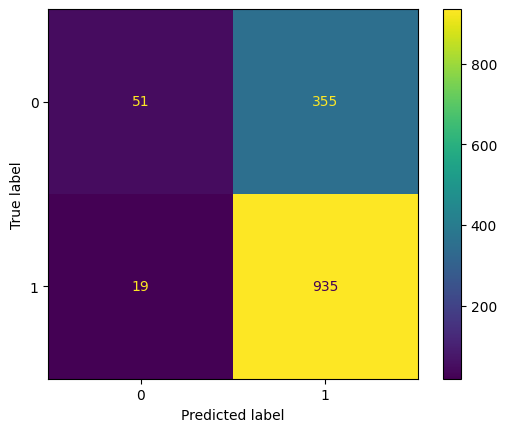

In [431]:
matrix1=confusion_matrix(y_test, y_pred)
ConfusionMatrixDisplay(matrix1).plot()

SVC - S n-gram

In [432]:
svc_model = SVC()
svc_model.fit(X_train_combined_svc, y_train)

SVC()

In [433]:
y_pred_train = svc_model.predict(X_train_combined_svc)
print("Presnosť:", accuracy_score(y_train, y_pred_train))
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train))

Presnosť: 0.8688524590163934
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.90      0.63      0.74       935
           1       0.86      0.97      0.91      2237

    accuracy                           0.87      3172
   macro avg       0.88      0.80      0.83      3172
weighted avg       0.87      0.87      0.86      3172



In [434]:
y_pred = svc_model.predict(X_test_combined_svc)
print("Klasifikačný report:\n", classification_report(y_test, y_pred))

Klasifikačný report:
               precision    recall  f1-score   support

           0       0.87      0.57      0.69       406
           1       0.84      0.97      0.90       954

    accuracy                           0.85      1360
   macro avg       0.86      0.77      0.79      1360
weighted avg       0.85      0.85      0.84      1360



In [435]:
results_list2_svc.append({
        'accuracy_train': accuracy_score(y_train, y_pred_train),
    'accuracy_test': accuracy_score(y_test, y_pred),
    'precision_train': precision_score(y_train, y_pred_train, average='binary'),
    'precision_test': precision_score(y_test, y_pred, average='binary'),
 'recall_train': recall_score(y_train, y_pred_train, average='binary'),
 'recall_test': recall_score(y_test, y_pred, average='binary'),
 'f1_train': f1_score(y_train, y_pred_train, average='binary'),
 'f1_test': f1_score(y_test, y_pred, average='binary')
        
    })

In [436]:
accuracy = accuracy_score(y_test, y_pred)
recall = recall_score(y_test, y_pred, average='binary')  # 'macro' pre nevyvážené triedy, 'binary' pre binárnu klasifikáciu
precision = precision_score(y_test, y_pred, average='binary')
f1 = f1_score(y_test, y_pred, average='binary')

print("Accuracy: {:.2f}".format(accuracy))
print("Recall: {:.2f}".format(recall))
print("Precision: {:.2f}".format(precision))
print("F1 Score: {:.2f}".format(f1))

Accuracy: 0.85
Recall: 0.97
Precision: 0.84
F1 Score: 0.90


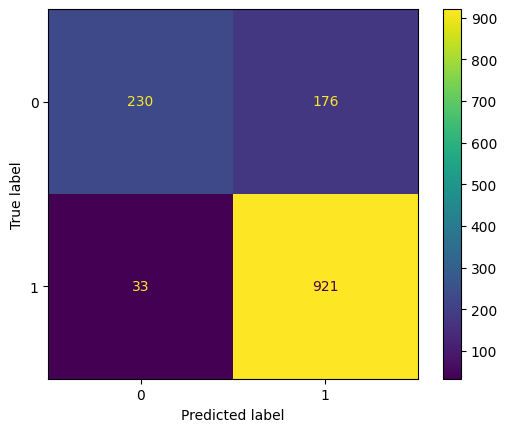

In [437]:
matrix1=confusion_matrix(y_test, y_pred)
ConfusionMatrixDisplay(matrix1).plot()

SVC - S n-gram tfidf

In [438]:
svc_model = SVC()
svc_model.fit(X_train_combined2_svc, y_train)

SVC()

In [439]:
y_pred_train = svc_model.predict(X_train_combined2_svc)
print("Presnosť:", accuracy_score(y_train, y_pred_train))
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train))

Presnosť: 0.9158259773013872
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.93      0.77      0.84       935
           1       0.91      0.98      0.94      2237

    accuracy                           0.92      3172
   macro avg       0.92      0.87      0.89      3172
weighted avg       0.92      0.92      0.91      3172



In [440]:
y_pred = svc_model.predict(X_test_combined2_svc)
print("Klasifikačný report:\n", classification_report(y_test, y_pred))

Klasifikačný report:
               precision    recall  f1-score   support

           0       0.88      0.68      0.77       406
           1       0.88      0.96      0.92       954

    accuracy                           0.88      1360
   macro avg       0.88      0.82      0.84      1360
weighted avg       0.88      0.88      0.87      1360



In [441]:
results_list2_svc.append({
        'accuracy_train': accuracy_score(y_train, y_pred_train),
    'accuracy_test': accuracy_score(y_test, y_pred),
    'precision_train': precision_score(y_train, y_pred_train, average='binary'),
    'precision_test': precision_score(y_test, y_pred, average='binary'),
 'recall_train': recall_score(y_train, y_pred_train, average='binary'),
 'recall_test': recall_score(y_test, y_pred, average='binary'),
 'f1_train': f1_score(y_train, y_pred_train, average='binary'),
 'f1_test': f1_score(y_test, y_pred, average='binary')
        
    })

In [442]:
accuracy = accuracy_score(y_test, y_pred)
recall = recall_score(y_test, y_pred, average='binary')  # 'macro' pre nevyvážené triedy, 'binary' pre binárnu klasifikáciu
precision = precision_score(y_test, y_pred, average='binary')
f1 = f1_score(y_test, y_pred, average='binary')

print("Accuracy: {:.2f}".format(accuracy))
print("Recall: {:.2f}".format(recall))
print("Precision: {:.2f}".format(precision))
print("F1 Score: {:.2f}".format(f1))

Accuracy: 0.88
Recall: 0.96
Precision: 0.88
F1 Score: 0.92


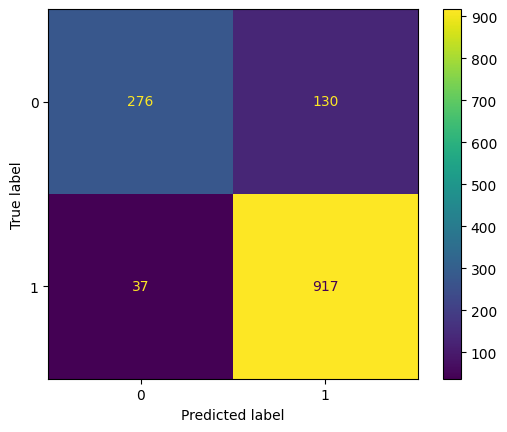

In [443]:
matrix1=confusion_matrix(y_test, y_pred)
ConfusionMatrixDisplay(matrix1).plot()

SVC - S word frequency

In [444]:
svc_model = SVC()
svc_model.fit(X_train_combined3_svc, y_train)

SVC()

In [445]:
y_pred_train = svc_model.predict(X_train_combined3_svc)
print("Presnosť:", accuracy_score(y_train, y_pred_train))
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train))

Presnosť: 0.862547288776797
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.89      0.61      0.72       935
           1       0.86      0.97      0.91      2237

    accuracy                           0.86      3172
   macro avg       0.87      0.79      0.82      3172
weighted avg       0.87      0.86      0.85      3172



In [446]:
y_pred = svc_model.predict(X_test_combined3_svc)
print("Klasifikačný report:\n", classification_report(y_test, y_pred))

Klasifikačný report:
               precision    recall  f1-score   support

           0       0.87      0.55      0.67       406
           1       0.83      0.96      0.89       954

    accuracy                           0.84      1360
   macro avg       0.85      0.76      0.78      1360
weighted avg       0.84      0.84      0.83      1360



In [447]:
results_list2_svc.append({
        'accuracy_train': accuracy_score(y_train, y_pred_train),
    'accuracy_test': accuracy_score(y_test, y_pred),
    'precision_train': precision_score(y_train, y_pred_train, average='binary'),
    'precision_test': precision_score(y_test, y_pred, average='binary'),
 'recall_train': recall_score(y_train, y_pred_train, average='binary'),
 'recall_test': recall_score(y_test, y_pred, average='binary'),
 'f1_train': f1_score(y_train, y_pred_train, average='binary'),
 'f1_test': f1_score(y_test, y_pred, average='binary')
        
    })

In [448]:
accuracy = accuracy_score(y_test, y_pred)
recall = recall_score(y_test, y_pred, average='binary')  # 'macro' pre nevyvážené triedy, 'binary' pre binárnu klasifikáciu
precision = precision_score(y_test, y_pred, average='binary')
f1 = f1_score(y_test, y_pred, average='binary')

print("Accuracy: {:.2f}".format(accuracy))
print("Recall: {:.2f}".format(recall))
print("Precision: {:.2f}".format(precision))
print("F1 Score: {:.2f}".format(f1))

Accuracy: 0.84
Recall: 0.96
Precision: 0.83
F1 Score: 0.89


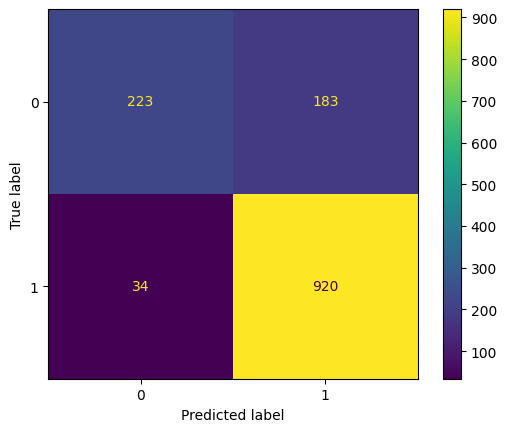

In [449]:
matrix1=confusion_matrix(y_test, y_pred)
ConfusionMatrixDisplay(matrix1).plot()

SVC - S tfidf word frequency

In [450]:
svc_model = SVC()
svc_model.fit(X_train_combined4_svc, y_train)

SVC()

In [451]:
y_pred_train = svc_model.predict(X_train_combined4_svc)
print("Presnosť:", accuracy_score(y_train, y_pred_train))
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train))

Presnosť: 0.9243379571248423
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.94      0.79      0.86       935
           1       0.92      0.98      0.95      2237

    accuracy                           0.92      3172
   macro avg       0.93      0.89      0.90      3172
weighted avg       0.93      0.92      0.92      3172



In [452]:
y_pred = svc_model.predict(X_test_combined4_svc)
print("Klasifikačný report:\n", classification_report(y_test, y_pred))

Klasifikačný report:
               precision    recall  f1-score   support

           0       0.89      0.68      0.77       406
           1       0.88      0.96      0.92       954

    accuracy                           0.88      1360
   macro avg       0.88      0.82      0.84      1360
weighted avg       0.88      0.88      0.87      1360



In [453]:
results_list2_svc.append({
        'accuracy_train': accuracy_score(y_train, y_pred_train),
    'accuracy_test': accuracy_score(y_test, y_pred),
    'precision_train': precision_score(y_train, y_pred_train, average='binary'),
    'precision_test': precision_score(y_test, y_pred, average='binary'),
 'recall_train': recall_score(y_train, y_pred_train, average='binary'),
 'recall_test': recall_score(y_test, y_pred, average='binary'),
 'f1_train': f1_score(y_train, y_pred_train, average='binary'),
 'f1_test': f1_score(y_test, y_pred, average='binary')
        
    })

In [454]:
accuracy = accuracy_score(y_test, y_pred)
recall = recall_score(y_test, y_pred, average='binary')  # 'macro' pre nevyvážené triedy, 'binary' pre binárnu klasifikáciu
precision = precision_score(y_test, y_pred, average='binary')
f1 = f1_score(y_test, y_pred, average='binary')

print("Accuracy: {:.2f}".format(accuracy))
print("Recall: {:.2f}".format(recall))
print("Precision: {:.2f}".format(precision))
print("F1 Score: {:.2f}".format(f1))

Accuracy: 0.88
Recall: 0.96
Precision: 0.88
F1 Score: 0.92


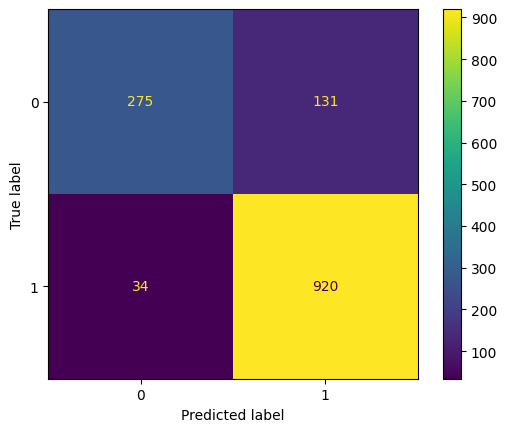

In [455]:
matrix1=confusion_matrix(y_test, y_pred)
ConfusionMatrixDisplay(matrix1).plot()

SVC - S ošetrenim outlierov

In [456]:
svc_model = SVC()
svc_model.fit(X_train_out_svc, y_train)

SVC()

In [457]:
y_pred_train = svc_model.predict(X_train_out_svc)
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train))

Klasifikačný report:
               precision    recall  f1-score   support

           0       0.69      0.26      0.38       935
           1       0.76      0.95      0.84      2237

    accuracy                           0.75      3172
   macro avg       0.72      0.61      0.61      3172
weighted avg       0.74      0.75      0.71      3172



In [458]:
y_pred = svc_model.predict(X_test_out_svc)
print("Klasifikačný report:\n", classification_report(y_test, y_pred))

Klasifikačný report:
               precision    recall  f1-score   support

           0       0.69      0.27      0.39       406
           1       0.75      0.95      0.84       954

    accuracy                           0.75      1360
   macro avg       0.72      0.61      0.61      1360
weighted avg       0.74      0.75      0.70      1360



In [459]:
results_list2_svc.append({
        'accuracy_train': accuracy_score(y_train, y_pred_train),
    'accuracy_test': accuracy_score(y_test, y_pred),
    'precision_train': precision_score(y_train, y_pred_train, average='binary'),
    'precision_test': precision_score(y_test, y_pred, average='binary'),
 'recall_train': recall_score(y_train, y_pred_train, average='binary'),
 'recall_test': recall_score(y_test, y_pred, average='binary'),
 'f1_train': f1_score(y_train, y_pred_train, average='binary'),
 'f1_test': f1_score(y_test, y_pred, average='binary')
        
    })

In [460]:
accuracy = accuracy_score(y_test, y_pred)
recall = recall_score(y_test, y_pred, average='binary')  # 'macro' pre nevyvážené triedy, 'binary' pre binárnu klasifikáciu
precision = precision_score(y_test, y_pred, average='binary')
f1 = f1_score(y_test, y_pred, average='binary')

print("Accuracy: {:.2f}".format(accuracy))
print("Recall: {:.2f}".format(recall))
print("Precision: {:.2f}".format(precision))
print("F1 Score: {:.2f}".format(f1))

Accuracy: 0.75
Recall: 0.95
Precision: 0.75
F1 Score: 0.84


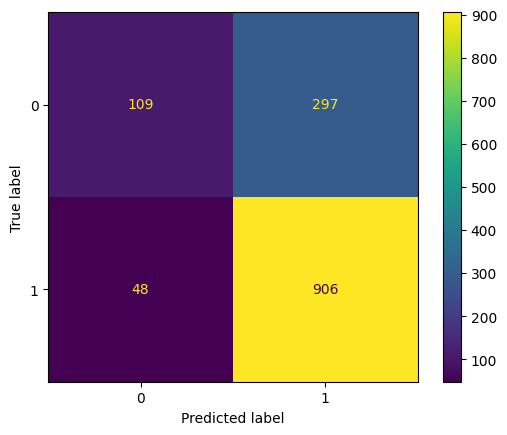

In [461]:
matrix1=confusion_matrix(y_test, y_pred)
ConfusionMatrixDisplay(matrix1).plot()

SVC - S ošetrenim outlierov a n-gram

In [462]:
svc_model = SVC()
svc_model.fit(X_train_combined_out_svc, y_train)

SVC()

In [463]:
y_pred_train = svc_model.predict(X_train_combined_out_svc)
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train))

Klasifikačný report:
               precision    recall  f1-score   support

           0       0.90      0.69      0.78       935
           1       0.88      0.97      0.92      2237

    accuracy                           0.89      3172
   macro avg       0.89      0.83      0.85      3172
weighted avg       0.89      0.89      0.88      3172



In [464]:
y_pred = svc_model.predict(X_test_combined_out_svc)
print("Klasifikačný report:\n", classification_report(y_test, y_pred))

Klasifikačný report:
               precision    recall  f1-score   support

           0       0.86      0.60      0.70       406
           1       0.85      0.96      0.90       954

    accuracy                           0.85      1360
   macro avg       0.85      0.78      0.80      1360
weighted avg       0.85      0.85      0.84      1360



In [465]:
results_list2_svc.append({
        'accuracy_train': accuracy_score(y_train, y_pred_train),
    'accuracy_test': accuracy_score(y_test, y_pred),
    'precision_train': precision_score(y_train, y_pred_train, average='binary'),
    'precision_test': precision_score(y_test, y_pred, average='binary'),
 'recall_train': recall_score(y_train, y_pred_train, average='binary'),
 'recall_test': recall_score(y_test, y_pred, average='binary'),
 'f1_train': f1_score(y_train, y_pred_train, average='binary'),
 'f1_test': f1_score(y_test, y_pred, average='binary')
        
    })

In [466]:
accuracy = accuracy_score(y_test, y_pred)
recall = recall_score(y_test, y_pred, average='binary')  # 'macro' pre nevyvážené triedy, 'binary' pre binárnu klasifikáciu
precision = precision_score(y_test, y_pred, average='binary')
f1 = f1_score(y_test, y_pred, average='binary')

print("Accuracy: {:.2f}".format(accuracy))
print("Recall: {:.2f}".format(recall))
print("Precision: {:.2f}".format(precision))
print("F1 Score: {:.2f}".format(f1))

Accuracy: 0.85
Recall: 0.96
Precision: 0.85
F1 Score: 0.90


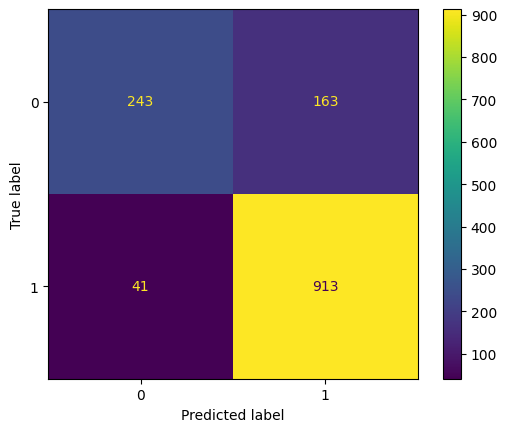

In [467]:
matrix1=confusion_matrix(y_test, y_pred)
ConfusionMatrixDisplay(matrix1).plot()

SVC - S ošetrenim outlierov a tfidf n-gram

In [468]:
svc_model = SVC()
svc_model.fit(X_train_combined2_out_svc, y_train)

SVC()

In [469]:
y_pred_train = svc_model.predict(X_train_combined2_out_svc)
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train))

Klasifikačný report:
               precision    recall  f1-score   support

           0       0.66      0.13      0.22       935
           1       0.73      0.97      0.83      2237

    accuracy                           0.72      3172
   macro avg       0.70      0.55      0.52      3172
weighted avg       0.71      0.72      0.65      3172



In [470]:
y_pred = svc_model.predict(X_test_combined2_out_svc)
print("Klasifikačný report:\n", classification_report(y_test, y_pred))

Klasifikačný report:
               precision    recall  f1-score   support

           0       0.70      0.15      0.24       406
           1       0.73      0.97      0.83       954

    accuracy                           0.73      1360
   macro avg       0.72      0.56      0.54      1360
weighted avg       0.72      0.73      0.66      1360



In [471]:
results_list2_svc.append({
        'accuracy_train': accuracy_score(y_train, y_pred_train),
    'accuracy_test': accuracy_score(y_test, y_pred),
    'precision_train': precision_score(y_train, y_pred_train, average='binary'),
    'precision_test': precision_score(y_test, y_pred, average='binary'),
 'recall_train': recall_score(y_train, y_pred_train, average='binary'),
 'recall_test': recall_score(y_test, y_pred, average='binary'),
 'f1_train': f1_score(y_train, y_pred_train, average='binary'),
 'f1_test': f1_score(y_test, y_pred, average='binary')
        
    })

In [472]:
accuracy = accuracy_score(y_test, y_pred)
recall = recall_score(y_test, y_pred, average='binary')  # 'macro' pre nevyvážené triedy, 'binary' pre binárnu klasifikáciu
precision = precision_score(y_test, y_pred, average='binary')
f1 = f1_score(y_test, y_pred, average='binary')

print("Accuracy: {:.2f}".format(accuracy))
print("Recall: {:.2f}".format(recall))
print("Precision: {:.2f}".format(precision))
print("F1 Score: {:.2f}".format(f1))

Accuracy: 0.73
Recall: 0.97
Precision: 0.73
F1 Score: 0.83


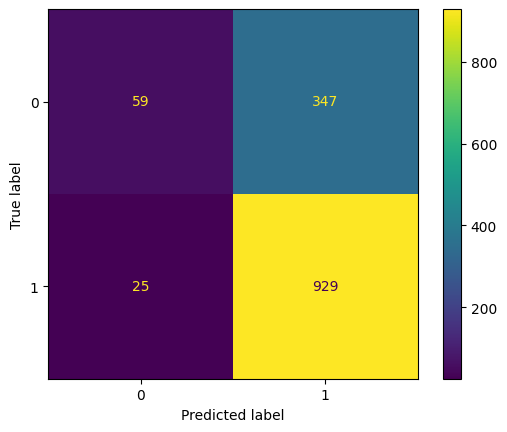

In [473]:
matrix1=confusion_matrix(y_test, y_pred)
ConfusionMatrixDisplay(matrix1).plot()

SVC - S ošetrenim outlierov a word frequency

In [474]:
svc_model = SVC()
svc_model.fit(X_train_combined3_out_svc, y_train)

SVC()

In [475]:
y_pred_train = svc_model.predict(X_train_combined3_out_svc)
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train))

Klasifikačný report:
               precision    recall  f1-score   support

           0       0.90      0.66      0.76       935
           1       0.87      0.97      0.92      2237

    accuracy                           0.88      3172
   macro avg       0.89      0.81      0.84      3172
weighted avg       0.88      0.88      0.87      3172



In [476]:
y_pred = svc_model.predict(X_test_combined3_out_svc)
print("Klasifikačný report:\n", classification_report(y_test, y_pred))

Klasifikačný report:
               precision    recall  f1-score   support

           0       0.85      0.59      0.70       406
           1       0.85      0.96      0.90       954

    accuracy                           0.85      1360
   macro avg       0.85      0.77      0.80      1360
weighted avg       0.85      0.85      0.84      1360



In [477]:
results_list2_svc.append({
        'accuracy_train': accuracy_score(y_train, y_pred_train),
    'accuracy_test': accuracy_score(y_test, y_pred),
    'precision_train': precision_score(y_train, y_pred_train, average='binary'),
    'precision_test': precision_score(y_test, y_pred, average='binary'),
 'recall_train': recall_score(y_train, y_pred_train, average='binary'),
 'recall_test': recall_score(y_test, y_pred, average='binary'),
 'f1_train': f1_score(y_train, y_pred_train, average='binary'),
 'f1_test': f1_score(y_test, y_pred, average='binary')
        
    })

In [478]:
accuracy = accuracy_score(y_test, y_pred)
recall = recall_score(y_test, y_pred, average='binary')  # 'macro' pre nevyvážené triedy, 'binary' pre binárnu klasifikáciu
precision = precision_score(y_test, y_pred, average='binary')
f1 = f1_score(y_test, y_pred, average='binary')

print("Accuracy: {:.2f}".format(accuracy))
print("Recall: {:.2f}".format(recall))
print("Precision: {:.2f}".format(precision))
print("F1 Score: {:.2f}".format(f1))

Accuracy: 0.85
Recall: 0.96
Precision: 0.85
F1 Score: 0.90


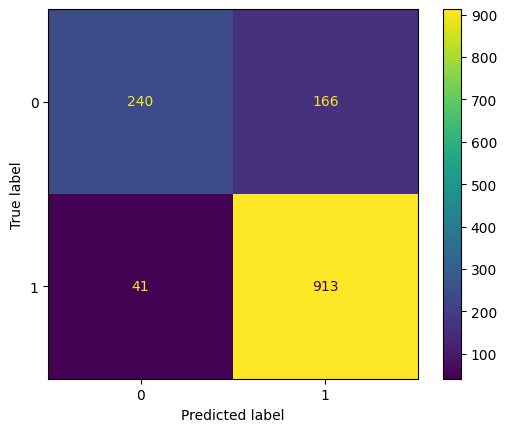

In [479]:
matrix1=confusion_matrix(y_test, y_pred)
ConfusionMatrixDisplay(matrix1).plot()

SVC - S ošetrenim outlierov a tfidf word frequency

In [480]:
svc_model = SVC()
svc_model.fit(X_train_combined4_out_svc, y_train)

SVC()

In [481]:
y_pred_train = svc_model.predict(X_train_combined4_out_svc)
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train))

Klasifikačný report:
               precision    recall  f1-score   support

           0       0.66      0.13      0.22       935
           1       0.73      0.97      0.83      2237

    accuracy                           0.72      3172
   macro avg       0.70      0.55      0.52      3172
weighted avg       0.71      0.72      0.65      3172



In [482]:
y_pred = svc_model.predict(X_test_combined4_out_svc)
print("Klasifikačný report:\n", classification_report(y_test, y_pred))

Klasifikačný report:
               precision    recall  f1-score   support

           0       0.70      0.15      0.24       406
           1       0.73      0.97      0.83       954

    accuracy                           0.73      1360
   macro avg       0.72      0.56      0.54      1360
weighted avg       0.72      0.73      0.66      1360



In [483]:
results_list2_svc.append({
        'accuracy_train': accuracy_score(y_train, y_pred_train),
    'accuracy_test': accuracy_score(y_test, y_pred),
    'precision_train': precision_score(y_train, y_pred_train, average='binary'),
    'precision_test': precision_score(y_test, y_pred, average='binary'),
 'recall_train': recall_score(y_train, y_pred_train, average='binary'),
 'recall_test': recall_score(y_test, y_pred, average='binary'),
 'f1_train': f1_score(y_train, y_pred_train, average='binary'),
 'f1_test': f1_score(y_test, y_pred, average='binary')
        
    })

In [484]:
accuracy = accuracy_score(y_test, y_pred)
recall = recall_score(y_test, y_pred, average='binary')  # 'macro' pre nevyvážené triedy, 'binary' pre binárnu klasifikáciu
precision = precision_score(y_test, y_pred, average='binary')
f1 = f1_score(y_test, y_pred, average='binary')

print("Accuracy: {:.2f}".format(accuracy))
print("Recall: {:.2f}".format(recall))
print("Precision: {:.2f}".format(precision))
print("F1 Score: {:.2f}".format(f1))

Accuracy: 0.73
Recall: 0.97
Precision: 0.73
F1 Score: 0.83


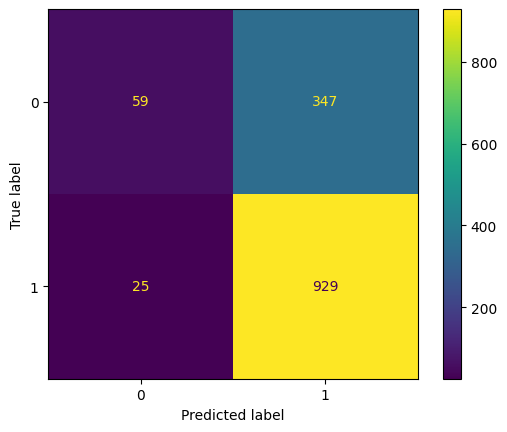

In [485]:
matrix1=confusion_matrix(y_test, y_pred)
ConfusionMatrixDisplay(matrix1).plot()

SVC - So škálovaním

In [486]:
svc_model = SVC()
svc_model.fit(X_train_scaled_svc, y_train)

SVC()

In [487]:
y_pred_train = svc_model.predict(X_train_scaled_svc)
print("Presnosť:", accuracy_score(y_train, y_pred_train))
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train))

Presnosť: 0.7326607818411097
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.70      0.16      0.26       935
           1       0.73      0.97      0.84      2237

    accuracy                           0.73      3172
   macro avg       0.72      0.57      0.55      3172
weighted avg       0.73      0.73      0.67      3172



In [488]:
y_pred = svc_model.predict(X_test_scaled_svc)
print("Presnosť:", accuracy_score(y_test, y_pred))
print("Klasifikačný report:\n", classification_report(y_test, y_pred))

Presnosť: 0.7330882352941176
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.73      0.17      0.28       406
           1       0.73      0.97      0.84       954

    accuracy                           0.73      1360
   macro avg       0.73      0.57      0.56      1360
weighted avg       0.73      0.73      0.67      1360



In [489]:
results_list2_svc.append({
        'accuracy_train': accuracy_score(y_train, y_pred_train),
    'accuracy_test': accuracy_score(y_test, y_pred),
    'precision_train': precision_score(y_train, y_pred_train, average='binary'),
    'precision_test': precision_score(y_test, y_pred, average='binary'),
 'recall_train': recall_score(y_train, y_pred_train, average='binary'),
 'recall_test': recall_score(y_test, y_pred, average='binary'),
 'f1_train': f1_score(y_train, y_pred_train, average='binary'),
 'f1_test': f1_score(y_test, y_pred, average='binary')
        
    })

In [490]:
accuracy = accuracy_score(y_test, y_pred)
recall = recall_score(y_test, y_pred, average='binary')  # 'macro' pre nevyvážené triedy, 'binary' pre binárnu klasifikáciu
precision = precision_score(y_test, y_pred, average='binary')
f1 = f1_score(y_test, y_pred, average='binary')

print("Accuracy: {:.2f}".format(accuracy))
print("Recall: {:.2f}".format(recall))
print("Precision: {:.2f}".format(precision))
print("F1 Score: {:.2f}".format(f1))

Accuracy: 0.73
Recall: 0.97
Precision: 0.73
F1 Score: 0.84


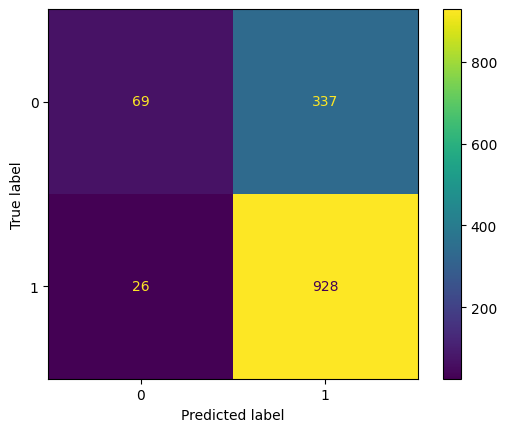

In [491]:
matrix1=confusion_matrix(y_test, y_pred)
ConfusionMatrixDisplay(matrix1).plot()

SVC - So škálovaním a n-grammi

In [492]:
svc_model = SVC()
svc_model.fit(X_train_combined_scaled_svc, y_train)

SVC()

In [493]:
y_pred_train = svc_model.predict(X_train_combined_scaled_svc)
print("Presnosť:", accuracy_score(y_train, y_pred_train))
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train))

Presnosť: 0.8688524590163934
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.90      0.63      0.74       935
           1       0.86      0.97      0.91      2237

    accuracy                           0.87      3172
   macro avg       0.88      0.80      0.83      3172
weighted avg       0.87      0.87      0.86      3172



In [494]:
y_pred = svc_model.predict(X_test_combined_scaled_svc)
print("Presnosť:", accuracy_score(y_test, y_pred))
print("Klasifikačný report:\n", classification_report(y_test, y_pred))

Presnosť: 0.8463235294117647
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.87      0.57      0.69       406
           1       0.84      0.97      0.90       954

    accuracy                           0.85      1360
   macro avg       0.86      0.77      0.79      1360
weighted avg       0.85      0.85      0.84      1360



In [495]:
results_list2_svc.append({
        'accuracy_train': accuracy_score(y_train, y_pred_train),
    'accuracy_test': accuracy_score(y_test, y_pred),
    'precision_train': precision_score(y_train, y_pred_train, average='binary'),
    'precision_test': precision_score(y_test, y_pred, average='binary'),
 'recall_train': recall_score(y_train, y_pred_train, average='binary'),
 'recall_test': recall_score(y_test, y_pred, average='binary'),
 'f1_train': f1_score(y_train, y_pred_train, average='binary'),
 'f1_test': f1_score(y_test, y_pred, average='binary')
        
    })

In [496]:
accuracy = accuracy_score(y_test, y_pred)
recall = recall_score(y_test, y_pred, average='binary')  # 'macro' pre nevyvážené triedy, 'binary' pre binárnu klasifikáciu
precision = precision_score(y_test, y_pred, average='binary')
f1 = f1_score(y_test, y_pred, average='binary')

print("Accuracy: {:.2f}".format(accuracy))
print("Recall: {:.2f}".format(recall))
print("Precision: {:.2f}".format(precision))
print("F1 Score: {:.2f}".format(f1))

Accuracy: 0.85
Recall: 0.97
Precision: 0.84
F1 Score: 0.90


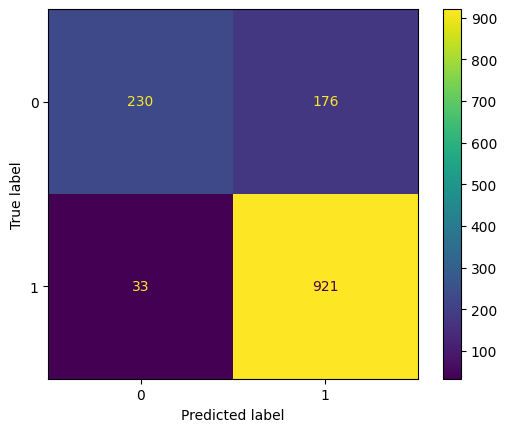

In [497]:
matrix1=confusion_matrix(y_test, y_pred)
ConfusionMatrixDisplay(matrix1).plot()

SVC - So škálovaním a tfidf n-gram

In [498]:
svc_model = SVC()
svc_model.fit(X_train_combined2_scaled_svc, y_train)

SVC()

In [499]:
y_pred_train = svc_model.predict(X_train_combined2_scaled_svc)
print("Presnosť:", accuracy_score(y_train, y_pred_train))
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train))

Presnosť: 0.9167717528373266
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.93      0.77      0.85       935
           1       0.91      0.98      0.94      2237

    accuracy                           0.92      3172
   macro avg       0.92      0.88      0.89      3172
weighted avg       0.92      0.92      0.91      3172



In [500]:
y_pred = svc_model.predict(X_test_combined2_scaled_svc)
print("Presnosť:", accuracy_score(y_test, y_pred))
print("Klasifikačný report:\n", classification_report(y_test, y_pred))

Presnosť: 0.8786764705882353
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.88      0.68      0.77       406
           1       0.88      0.96      0.92       954

    accuracy                           0.88      1360
   macro avg       0.88      0.82      0.84      1360
weighted avg       0.88      0.88      0.87      1360



In [501]:
results_list2_svc.append({
        'accuracy_train': accuracy_score(y_train, y_pred_train),
    'accuracy_test': accuracy_score(y_test, y_pred),
    'precision_train': precision_score(y_train, y_pred_train, average='binary'),
    'precision_test': precision_score(y_test, y_pred, average='binary'),
 'recall_train': recall_score(y_train, y_pred_train, average='binary'),
 'recall_test': recall_score(y_test, y_pred, average='binary'),
 'f1_train': f1_score(y_train, y_pred_train, average='binary'),
 'f1_test': f1_score(y_test, y_pred, average='binary')
        
    })

In [502]:
accuracy = accuracy_score(y_test, y_pred)
recall = recall_score(y_test, y_pred, average='binary')  # 'macro' pre nevyvážené triedy, 'binary' pre binárnu klasifikáciu
precision = precision_score(y_test, y_pred, average='binary')
f1 = f1_score(y_test, y_pred, average='binary')

print("Accuracy: {:.2f}".format(accuracy))
print("Recall: {:.2f}".format(recall))
print("Precision: {:.2f}".format(precision))
print("F1 Score: {:.2f}".format(f1))

Accuracy: 0.88
Recall: 0.96
Precision: 0.88
F1 Score: 0.92


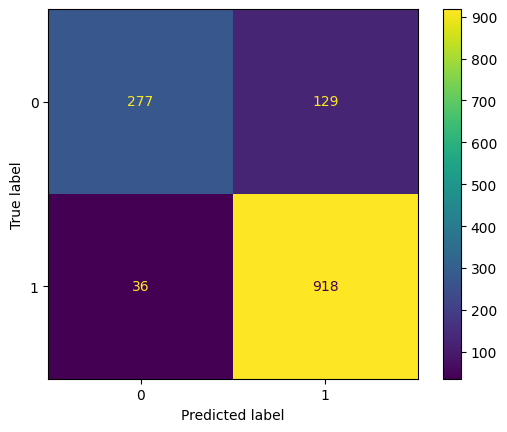

In [503]:
matrix1=confusion_matrix(y_test, y_pred)
ConfusionMatrixDisplay(matrix1).plot()

SVC - So škálovaním a word frequency

In [504]:
svc_model = SVC()
svc_model.fit(X_train_combined3_scaled_svc, y_train)

SVC()

In [505]:
y_pred_train = svc_model.predict(X_train_combined3_scaled_svc)
print("Presnosť:", accuracy_score(y_train, y_pred_train))
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train))

Presnosť: 0.862547288776797
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.89      0.61      0.72       935
           1       0.86      0.97      0.91      2237

    accuracy                           0.86      3172
   macro avg       0.87      0.79      0.82      3172
weighted avg       0.87      0.86      0.85      3172



In [506]:
y_pred = svc_model.predict(X_test_combined3_scaled_svc)
print("Presnosť:", accuracy_score(y_test, y_pred))
print("Klasifikačný report:\n", classification_report(y_test, y_pred))

Presnosť: 0.8404411764705882
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.87      0.55      0.67       406
           1       0.83      0.96      0.89       954

    accuracy                           0.84      1360
   macro avg       0.85      0.76      0.78      1360
weighted avg       0.84      0.84      0.83      1360



In [507]:
results_list2_svc.append({
        'accuracy_train': accuracy_score(y_train, y_pred_train),
    'accuracy_test': accuracy_score(y_test, y_pred),
    'precision_train': precision_score(y_train, y_pred_train, average='binary'),
    'precision_test': precision_score(y_test, y_pred, average='binary'),
 'recall_train': recall_score(y_train, y_pred_train, average='binary'),
 'recall_test': recall_score(y_test, y_pred, average='binary'),
 'f1_train': f1_score(y_train, y_pred_train, average='binary'),
 'f1_test': f1_score(y_test, y_pred, average='binary')
        
    })

In [508]:
accuracy = accuracy_score(y_test, y_pred)
recall = recall_score(y_test, y_pred, average='binary')  # 'macro' pre nevyvážené triedy, 'binary' pre binárnu klasifikáciu
precision = precision_score(y_test, y_pred, average='binary')
f1 = f1_score(y_test, y_pred, average='binary')

print("Accuracy: {:.2f}".format(accuracy))
print("Recall: {:.2f}".format(recall))
print("Precision: {:.2f}".format(precision))
print("F1 Score: {:.2f}".format(f1))

Accuracy: 0.84
Recall: 0.96
Precision: 0.83
F1 Score: 0.89


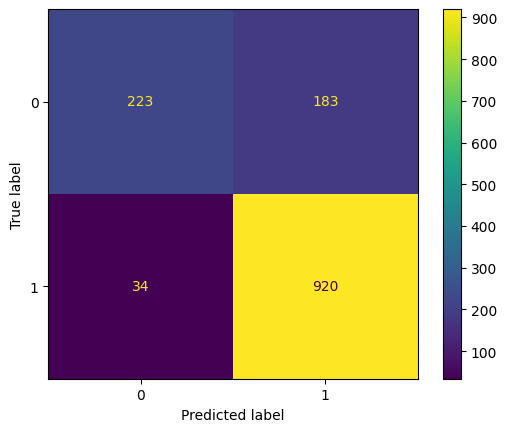

In [509]:
matrix1=confusion_matrix(y_test, y_pred)
ConfusionMatrixDisplay(matrix1).plot()

SVC - So škálovaním a tfidf word frequency

In [510]:
svc_model = SVC()
svc_model.fit(X_train_combined4_scaled_svc, y_train)

SVC()

In [511]:
y_pred_train = svc_model.predict(X_train_combined4_scaled_svc)
print("Presnosť:", accuracy_score(y_train, y_pred_train))
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train))

Presnosť: 0.9246532156368222
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.94      0.79      0.86       935
           1       0.92      0.98      0.95      2237

    accuracy                           0.92      3172
   macro avg       0.93      0.89      0.90      3172
weighted avg       0.93      0.92      0.92      3172



In [512]:
y_pred = svc_model.predict(X_test_combined4_scaled_svc)
print("Presnosť:", accuracy_score(y_test, y_pred))
print("Klasifikačný report:\n", classification_report(y_test, y_pred))

Presnosť: 0.8779411764705882
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.88      0.68      0.77       406
           1       0.88      0.96      0.92       954

    accuracy                           0.88      1360
   macro avg       0.88      0.82      0.84      1360
weighted avg       0.88      0.88      0.87      1360



In [513]:
results_list2_svc.append({
        'accuracy_train': accuracy_score(y_train, y_pred_train),
    'accuracy_test': accuracy_score(y_test, y_pred),
    'precision_train': precision_score(y_train, y_pred_train, average='binary'),
    'precision_test': precision_score(y_test, y_pred, average='binary'),
 'recall_train': recall_score(y_train, y_pred_train, average='binary'),
 'recall_test': recall_score(y_test, y_pred, average='binary'),
 'f1_train': f1_score(y_train, y_pred_train, average='binary'),
 'f1_test': f1_score(y_test, y_pred, average='binary')
        
    })

In [514]:
accuracy = accuracy_score(y_test, y_pred)
recall = recall_score(y_test, y_pred, average='binary')  # 'macro' pre nevyvážené triedy, 'binary' pre binárnu klasifikáciu
precision = precision_score(y_test, y_pred, average='binary')
f1 = f1_score(y_test, y_pred, average='binary')

print("Accuracy: {:.2f}".format(accuracy))
print("Recall: {:.2f}".format(recall))
print("Precision: {:.2f}".format(precision))
print("F1 Score: {:.2f}".format(f1))

Accuracy: 0.88
Recall: 0.96
Precision: 0.88
F1 Score: 0.92


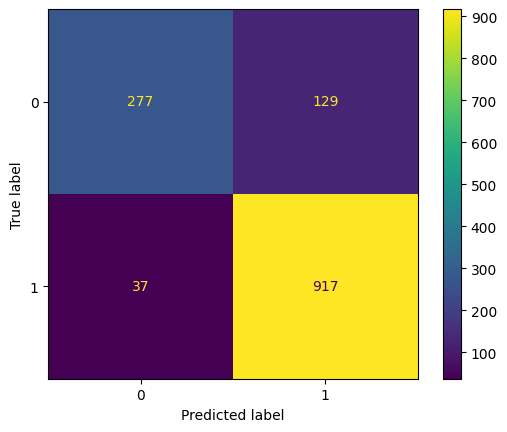

In [515]:
matrix1=confusion_matrix(y_test, y_pred)
ConfusionMatrixDisplay(matrix1).plot()

SVC - S ošetrením outlierov a so škálovaním

In [516]:
svc_model = SVC()
svc_model.fit(X_train_scal_out_svc, y_train)

SVC()

In [517]:
y_pred_train = svc_model.predict(X_train_scal_out_svc)
print("Presnosť:", accuracy_score(y_train, y_pred_train))
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train))

Presnosť: 0.7487389659520807
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.69      0.26      0.38       935
           1       0.76      0.95      0.84      2237

    accuracy                           0.75      3172
   macro avg       0.72      0.61      0.61      3172
weighted avg       0.74      0.75      0.71      3172



In [518]:
y_pred = svc_model.predict(X_test_scal_out_svc)
print("Presnosť:", accuracy_score(y_test, y_pred))
print("Klasifikačný report:\n", classification_report(y_test, y_pred))

Presnosť: 0.7463235294117647
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.69      0.27      0.39       406
           1       0.75      0.95      0.84       954

    accuracy                           0.75      1360
   macro avg       0.72      0.61      0.61      1360
weighted avg       0.74      0.75      0.70      1360



In [519]:
results_list2_svc.append({
        'accuracy_train': accuracy_score(y_train, y_pred_train),
    'accuracy_test': accuracy_score(y_test, y_pred),
    'precision_train': precision_score(y_train, y_pred_train, average='binary'),
    'precision_test': precision_score(y_test, y_pred, average='binary'),
 'recall_train': recall_score(y_train, y_pred_train, average='binary'),
 'recall_test': recall_score(y_test, y_pred, average='binary'),
 'f1_train': f1_score(y_train, y_pred_train, average='binary'),
 'f1_test': f1_score(y_test, y_pred, average='binary')
        
    })

In [520]:
accuracy = accuracy_score(y_test, y_pred)
recall = recall_score(y_test, y_pred, average='binary')  # 'macro' pre nevyvážené triedy
precision = precision_score(y_test, y_pred, average='binary')
f1 = f1_score(y_test, y_pred, average='binary')

print("Accuracy: {:.2f}".format(accuracy))
print("Recall: {:.2f}".format(recall))
print("Precision: {:.2f}".format(precision))
print("F1 Score: {:.2f}".format(f1))

Accuracy: 0.75
Recall: 0.95
Precision: 0.75
F1 Score: 0.84


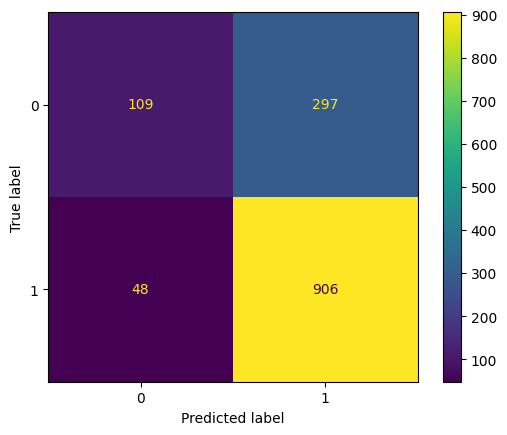

In [521]:
matrix1=confusion_matrix(y_test, y_pred)
ConfusionMatrixDisplay(matrix1).plot()

SVC - S ošetrením outlierov a so škálovaním a s n-gram

In [522]:
svc_model = SVC()
svc_model.fit(X_train_combined_scal_out_svc, y_train)

SVC()

In [523]:
y_pred_train = svc_model.predict(X_train_combined_scal_out_svc)
print("Presnosť:", accuracy_score(y_train, y_pred_train))
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train))

Presnosť: 0.8855611601513241
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.90      0.69      0.78       935
           1       0.88      0.97      0.92      2237

    accuracy                           0.89      3172
   macro avg       0.89      0.83      0.85      3172
weighted avg       0.89      0.89      0.88      3172



In [524]:
y_pred = svc_model.predict(X_test_combined_scal_out_svc)
print("Presnosť:", accuracy_score(y_test, y_pred))
print("Klasifikačný report:\n", classification_report(y_test, y_pred))

Presnosť: 0.85
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.86      0.60      0.70       406
           1       0.85      0.96      0.90       954

    accuracy                           0.85      1360
   macro avg       0.85      0.78      0.80      1360
weighted avg       0.85      0.85      0.84      1360



In [525]:
results_list2_svc.append({
        'accuracy_train': accuracy_score(y_train, y_pred_train),
    'accuracy_test': accuracy_score(y_test, y_pred),
    'precision_train': precision_score(y_train, y_pred_train, average='binary'),
    'precision_test': precision_score(y_test, y_pred, average='binary'),
 'recall_train': recall_score(y_train, y_pred_train, average='binary'),
 'recall_test': recall_score(y_test, y_pred, average='binary'),
 'f1_train': f1_score(y_train, y_pred_train, average='binary'),
 'f1_test': f1_score(y_test, y_pred, average='binary')
        
    })

In [526]:
accuracy = accuracy_score(y_test, y_pred)
recall = recall_score(y_test, y_pred, average='binary')  # 'macro' pre nevyvážené triedy
precision = precision_score(y_test, y_pred, average='binary')
f1 = f1_score(y_test, y_pred, average='binary')

print("Accuracy: {:.2f}".format(accuracy))
print("Recall: {:.2f}".format(recall))
print("Precision: {:.2f}".format(precision))
print("F1 Score: {:.2f}".format(f1))

Accuracy: 0.85
Recall: 0.96
Precision: 0.85
F1 Score: 0.90


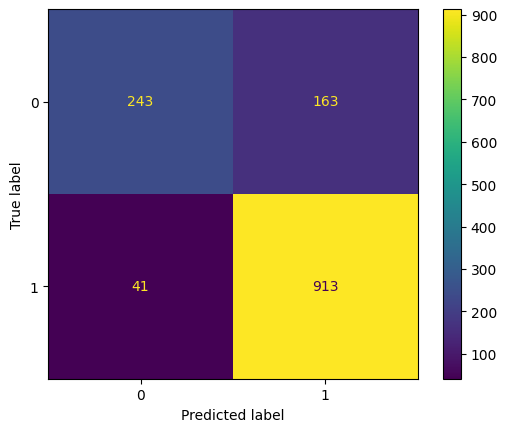

In [527]:
matrix1=confusion_matrix(y_test, y_pred)
ConfusionMatrixDisplay(matrix1).plot()

SVC - S ošetrením outlierov a so škálovaním a s tfidf n-gram

In [528]:
svc_model = SVC()
svc_model.fit(X_train_combined2_scal_out_svc, y_train)

SVC()

In [529]:
y_pred_train = svc_model.predict(X_train_combined2_scal_out_svc)
print("Presnosť:", accuracy_score(y_train, y_pred_train))
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train))

Presnosť: 0.7241488020176545
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.66      0.13      0.22       935
           1       0.73      0.97      0.83      2237

    accuracy                           0.72      3172
   macro avg       0.70      0.55      0.52      3172
weighted avg       0.71      0.72      0.65      3172



In [530]:
y_pred = svc_model.predict(X_test_combined2_scal_out_svc)
print("Presnosť:", accuracy_score(y_test, y_pred))
print("Klasifikačný report:\n", classification_report(y_test, y_pred))

Presnosť: 0.7264705882352941
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.70      0.15      0.24       406
           1       0.73      0.97      0.83       954

    accuracy                           0.73      1360
   macro avg       0.72      0.56      0.54      1360
weighted avg       0.72      0.73      0.66      1360



In [531]:
results_list2_svc.append({
        'accuracy_train': accuracy_score(y_train, y_pred_train),
    'accuracy_test': accuracy_score(y_test, y_pred),
    'precision_train': precision_score(y_train, y_pred_train, average='binary'),
    'precision_test': precision_score(y_test, y_pred, average='binary'),
 'recall_train': recall_score(y_train, y_pred_train, average='binary'),
 'recall_test': recall_score(y_test, y_pred, average='binary'),
 'f1_train': f1_score(y_train, y_pred_train, average='binary'),
 'f1_test': f1_score(y_test, y_pred, average='binary')
        
    })

In [532]:
accuracy = accuracy_score(y_test, y_pred)
recall = recall_score(y_test, y_pred, average='binary')  # 'macro' pre nevyvážené triedy
precision = precision_score(y_test, y_pred, average='binary')
f1 = f1_score(y_test, y_pred, average='binary')

print("Accuracy: {:.2f}".format(accuracy))
print("Recall: {:.2f}".format(recall))
print("Precision: {:.2f}".format(precision))
print("F1 Score: {:.2f}".format(f1))

Accuracy: 0.73
Recall: 0.97
Precision: 0.73
F1 Score: 0.83


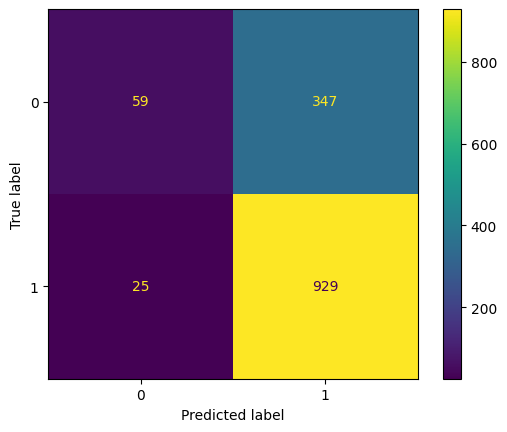

In [533]:
matrix1=confusion_matrix(y_test, y_pred)
ConfusionMatrixDisplay(matrix1).plot()

SVC - S ošetrením outlierov a so škálovaním a s word frequency

In [534]:
svc_model = SVC()
svc_model.fit(X_train_combined3_scal_out_svc, y_train)

SVC()

In [535]:
y_pred_train = svc_model.predict(X_train_combined3_scal_out_svc)
print("Presnosť:", accuracy_score(y_train, y_pred_train))
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train))

Presnosť: 0.8770491803278688
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.90      0.66      0.76       935
           1       0.87      0.97      0.92      2237

    accuracy                           0.88      3172
   macro avg       0.89      0.81      0.84      3172
weighted avg       0.88      0.88      0.87      3172



In [536]:
y_pred = svc_model.predict(X_test_combined3_scal_out_svc)
print("Presnosť:", accuracy_score(y_test, y_pred))
print("Klasifikačný report:\n", classification_report(y_test, y_pred))

Presnosť: 0.8477941176470588
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.85      0.59      0.70       406
           1       0.85      0.96      0.90       954

    accuracy                           0.85      1360
   macro avg       0.85      0.77      0.80      1360
weighted avg       0.85      0.85      0.84      1360



In [537]:
results_list2_svc.append({
        'accuracy_train': accuracy_score(y_train, y_pred_train),
    'accuracy_test': accuracy_score(y_test, y_pred),
    'precision_train': precision_score(y_train, y_pred_train, average='binary'),
    'precision_test': precision_score(y_test, y_pred, average='binary'),
 'recall_train': recall_score(y_train, y_pred_train, average='binary'),
 'recall_test': recall_score(y_test, y_pred, average='binary'),
 'f1_train': f1_score(y_train, y_pred_train, average='binary'),
 'f1_test': f1_score(y_test, y_pred, average='binary')
        
    })

In [538]:
accuracy = accuracy_score(y_test, y_pred)
recall = recall_score(y_test, y_pred, average='binary')  # 'macro' pre nevyvážené triedy
precision = precision_score(y_test, y_pred, average='binary')
f1 = f1_score(y_test, y_pred, average='binary')

print("Accuracy: {:.2f}".format(accuracy))
print("Recall: {:.2f}".format(recall))
print("Precision: {:.2f}".format(precision))
print("F1 Score: {:.2f}".format(f1))

Accuracy: 0.85
Recall: 0.96
Precision: 0.85
F1 Score: 0.90


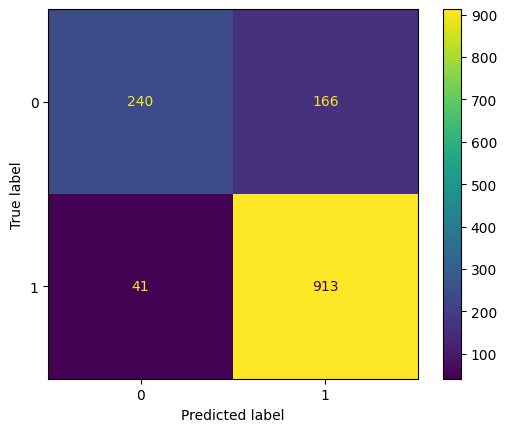

In [539]:
matrix1=confusion_matrix(y_test, y_pred)
ConfusionMatrixDisplay(matrix1).plot()

SVC - S ošetrením outlierov a so škálovaním a s tfidf word frequency

In [540]:
svc_model = SVC()
svc_model.fit(X_train_combined4_scal_out_svc, y_train)

SVC()

In [541]:
y_pred_train = svc_model.predict(X_train_combined4_scal_out_svc)
print("Presnosť:", accuracy_score(y_train, y_pred_train))
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train))

Presnosť: 0.7241488020176545
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.66      0.13      0.22       935
           1       0.73      0.97      0.83      2237

    accuracy                           0.72      3172
   macro avg       0.70      0.55      0.52      3172
weighted avg       0.71      0.72      0.65      3172



In [542]:
y_pred = svc_model.predict(X_test_combined4_scal_out_svc)
print("Presnosť:", accuracy_score(y_test, y_pred))
print("Klasifikačný report:\n", classification_report(y_test, y_pred))

Presnosť: 0.7264705882352941
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.70      0.15      0.24       406
           1       0.73      0.97      0.83       954

    accuracy                           0.73      1360
   macro avg       0.72      0.56      0.54      1360
weighted avg       0.72      0.73      0.66      1360



In [543]:
results_list2_svc.append({
        'accuracy_train': accuracy_score(y_train, y_pred_train),
    'accuracy_test': accuracy_score(y_test, y_pred),
    'precision_train': precision_score(y_train, y_pred_train, average='binary'),
    'precision_test': precision_score(y_test, y_pred, average='binary'),
 'recall_train': recall_score(y_train, y_pred_train, average='binary'),
 'recall_test': recall_score(y_test, y_pred, average='binary'),
 'f1_train': f1_score(y_train, y_pred_train, average='binary'),
 'f1_test': f1_score(y_test, y_pred, average='binary')
        
    })

In [544]:
accuracy = accuracy_score(y_test, y_pred)
recall = recall_score(y_test, y_pred, average='binary')  # 'macro' pre nevyvážené triedy
precision = precision_score(y_test, y_pred, average='binary')
f1 = f1_score(y_test, y_pred, average='binary')

print("Accuracy: {:.2f}".format(accuracy))
print("Recall: {:.2f}".format(recall))
print("Precision: {:.2f}".format(precision))
print("F1 Score: {:.2f}".format(f1))

Accuracy: 0.73
Recall: 0.97
Precision: 0.73
F1 Score: 0.83


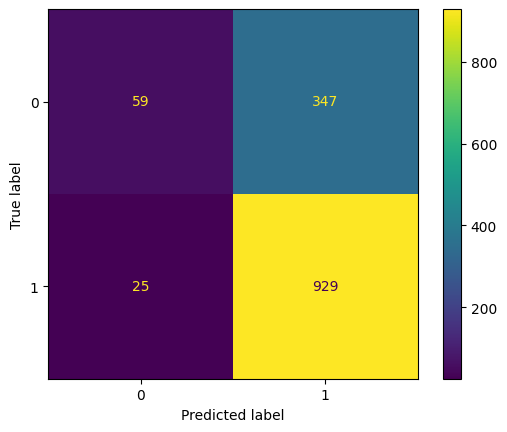

In [545]:
matrix1=confusion_matrix(y_test, y_pred)
ConfusionMatrixDisplay(matrix1).plot()

In [546]:
results_svc2 = pd.DataFrame(results_list2_svc)
print(results_svc2)

    accuracy_train  accuracy_test  precision_train  precision_test  \
0         0.724779       0.725000         0.727031        0.724806   
1         0.868852       0.846324         0.861453        0.839562   
2         0.915826       0.877206         0.911102        0.875836   
3         0.862547       0.840441         0.855788        0.834089   
4         0.924338       0.878676         0.918307        0.875357   
5         0.748739       0.746324         0.755682        0.753117   
6         0.885561       0.850000         0.880585        0.848513   
7         0.724149       0.726471         0.727759        0.728056   
8         0.877049       0.847794         0.871033        0.846154   
9         0.724149       0.726471         0.727759        0.728056   
10        0.732661       0.733088         0.734708        0.733597   
11        0.868852       0.846324         0.861453        0.839562   
12        0.916772       0.878676         0.911556        0.876791   
13        0.862547  

Podľa výsledkov po druhom testovani svc môžeme vidieť, že najlepší výsledok mal dataset s ošetrenými outliermi a tfidf frekvenciou slov, a s ošetrenými outliermi so skalovanim a tfidf frekvenciou slov. Takže je zrejme, že najväčší vplyv na úspešnosť malo pridanie textovej reprezentácií a ošetrenie outlierov. V porovnaní s prvým textom sa accuracy mierne zvýšilo.

RANDOM FOREST - Bez ošetrenia outlierov a bez skalovania

In [547]:
results_list2_rf=[]

Trenovanie modelu

In [548]:
rf_model = RandomForestClassifier()
rf_model.fit(X_train_rf, y_train)

RandomForestClassifier()

Predikovanie na trenovacich datach

In [549]:
y_pred_train = rf_model.predict(X_train_rf)
print("Presnosť:", accuracy_score(y_train, y_pred_train))
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train))

Presnosť: 0.8064312736443884
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.86      0.41      0.56       935
           1       0.80      0.97      0.88      2237

    accuracy                           0.81      3172
   macro avg       0.83      0.69      0.72      3172
weighted avg       0.82      0.81      0.78      3172



Predikovanie na testovacich datach

In [550]:
y_pred = rf_model.predict(X_test_rf)
print("Presnosť:", accuracy_score(y_test, y_pred))
print("Klasifikačný report:\n", classification_report(y_test, y_pred))

Presnosť: 0.6801470588235294
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.43      0.23      0.30       406
           1       0.73      0.87      0.79       954

    accuracy                           0.68      1360
   macro avg       0.58      0.55      0.55      1360
weighted avg       0.64      0.68      0.65      1360



In [551]:
results_list2_rf.append({
        'accuracy_train': accuracy_score(y_train, y_pred_train),
    'accuracy_test': accuracy_score(y_test, y_pred),
    'precision_train': precision_score(y_train, y_pred_train, average='binary'),
    'precision_test': precision_score(y_test, y_pred, average='binary'),
 'recall_train': recall_score(y_train, y_pred_train, average='binary'),
 'recall_test': recall_score(y_test, y_pred, average='binary'),
 'f1_train': f1_score(y_train, y_pred_train, average='binary'),
 'f1_test': f1_score(y_test, y_pred, average='binary')
        
    })

Zobrazenie metrik

In [552]:
accuracy = accuracy_score(y_test, y_pred)
recall = recall_score(y_test, y_pred, average='binary')  # 'macro' pre nevyvážené triedy, 'binary' pre binárnu klasifikáciu
precision = precision_score(y_test, y_pred, average='binary')
f1 = f1_score(y_test, y_pred, average='binary')

print("Accuracy: {:.2f}".format(accuracy))
print("Recall: {:.2f}".format(recall))
print("Precision: {:.2f}".format(precision))
print("F1 Score: {:.2f}".format(f1))

Accuracy: 0.68
Recall: 0.87
Precision: 0.73
F1 Score: 0.79


Vizualizácia výkonnosti modelu

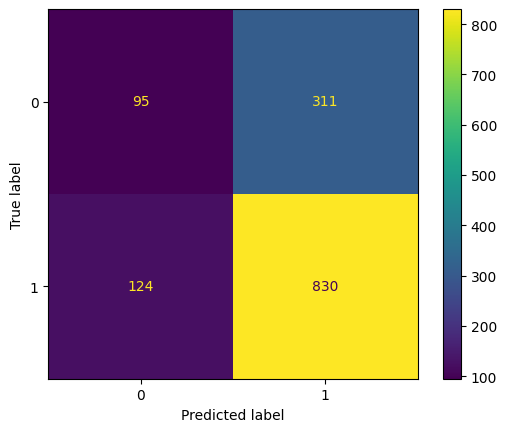

In [553]:
matrix1=confusion_matrix(y_test, y_pred)
ConfusionMatrixDisplay(matrix1).plot()

RANDOM FOREST - S n-gram

In [554]:
rf_model = RandomForestClassifier()
rf_model.fit(X_train_combined_rf, y_train)

RandomForestClassifier()

In [555]:
y_pred_train = rf_model.predict(X_train_combined_rf)
print("Presnosť:", accuracy_score(y_train, y_pred_train))
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train))

Presnosť: 1.0
Klasifikačný report:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00       935
           1       1.00      1.00      1.00      2237

    accuracy                           1.00      3172
   macro avg       1.00      1.00      1.00      3172
weighted avg       1.00      1.00      1.00      3172



In [556]:
y_pred = rf_model.predict(X_test_combined_rf)
print("Presnosť:", accuracy_score(y_test, y_pred))
print("Klasifikačný report:\n", classification_report(y_test, y_pred))

Presnosť: 0.8529411764705882
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.92      0.56      0.69       406
           1       0.84      0.98      0.90       954

    accuracy                           0.85      1360
   macro avg       0.88      0.77      0.80      1360
weighted avg       0.86      0.85      0.84      1360



In [557]:
results_list2_rf.append({
        'accuracy_train': accuracy_score(y_train, y_pred_train),
    'accuracy_test': accuracy_score(y_test, y_pred),
    'precision_train': precision_score(y_train, y_pred_train, average='binary'),
    'precision_test': precision_score(y_test, y_pred, average='binary'),
 'recall_train': recall_score(y_train, y_pred_train, average='binary'),
 'recall_test': recall_score(y_test, y_pred, average='binary'),
 'f1_train': f1_score(y_train, y_pred_train, average='binary'),
 'f1_test': f1_score(y_test, y_pred, average='binary')
        
    })

In [558]:
accuracy = accuracy_score(y_test, y_pred)
recall = recall_score(y_test, y_pred, average='binary')  # 'macro' pre nevyvážené triedy, 'binary' pre binárnu klasifikáciu
precision = precision_score(y_test, y_pred, average='binary')
f1 = f1_score(y_test, y_pred, average='binary')

print("Accuracy: {:.2f}".format(accuracy))
print("Recall: {:.2f}".format(recall))
print("Precision: {:.2f}".format(precision))
print("F1 Score: {:.2f}".format(f1))

Accuracy: 0.85
Recall: 0.98
Precision: 0.84
F1 Score: 0.90


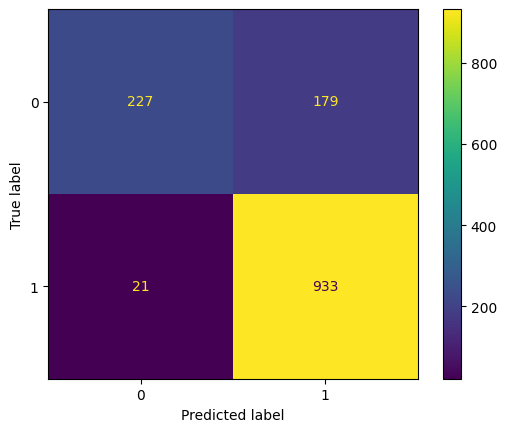

In [559]:
matrix1=confusion_matrix(y_test, y_pred)
ConfusionMatrixDisplay(matrix1).plot()

RANDOM FOREST - S n-gram tfidf

In [560]:
rf_model = RandomForestClassifier()
rf_model.fit(X_train_combined2_rf, y_train)

RandomForestClassifier()

In [561]:
y_pred_train = rf_model.predict(X_train_combined2_rf)
print("Presnosť:", accuracy_score(y_train, y_pred_train))
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train))

Presnosť: 1.0
Klasifikačný report:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00       935
           1       1.00      1.00      1.00      2237

    accuracy                           1.00      3172
   macro avg       1.00      1.00      1.00      3172
weighted avg       1.00      1.00      1.00      3172



In [562]:
y_pred = rf_model.predict(X_test_combined2_rf)
print("Presnosť:", accuracy_score(y_test, y_pred))
print("Klasifikačný report:\n", classification_report(y_test, y_pred))

Presnosť: 0.8426470588235294
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.90      0.53      0.67       406
           1       0.83      0.98      0.90       954

    accuracy                           0.84      1360
   macro avg       0.87      0.75      0.78      1360
weighted avg       0.85      0.84      0.83      1360



In [563]:
results_list2_rf.append({
        'accuracy_train': accuracy_score(y_train, y_pred_train),
    'accuracy_test': accuracy_score(y_test, y_pred),
    'precision_train': precision_score(y_train, y_pred_train, average='binary'),
    'precision_test': precision_score(y_test, y_pred, average='binary'),
 'recall_train': recall_score(y_train, y_pred_train, average='binary'),
 'recall_test': recall_score(y_test, y_pred, average='binary'),
 'f1_train': f1_score(y_train, y_pred_train, average='binary'),
 'f1_test': f1_score(y_test, y_pred, average='binary')
        
    })

In [564]:
accuracy = accuracy_score(y_test, y_pred)
recall = recall_score(y_test, y_pred, average='binary')  # 'macro' pre nevyvážené triedy, 'binary' pre binárnu klasifikáciu
precision = precision_score(y_test, y_pred, average='binary')
f1 = f1_score(y_test, y_pred, average='binary')

print("Accuracy: {:.2f}".format(accuracy))
print("Recall: {:.2f}".format(recall))
print("Precision: {:.2f}".format(precision))
print("F1 Score: {:.2f}".format(f1))

Accuracy: 0.84
Recall: 0.98
Precision: 0.83
F1 Score: 0.90


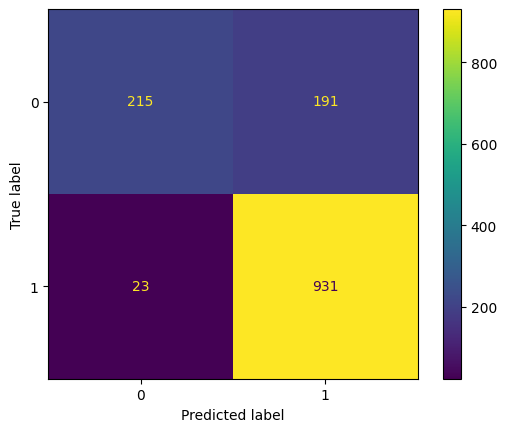

In [565]:
matrix1=confusion_matrix(y_test, y_pred)
ConfusionMatrixDisplay(matrix1).plot()

RANDOM FOREST - S word frequency

In [566]:
rf_model = RandomForestClassifier()
rf_model.fit(X_train_combined3_rf, y_train)

RandomForestClassifier()

In [567]:
y_pred_train = rf_model.predict(X_train_combined3_rf)
print("Presnosť:", accuracy_score(y_train, y_pred_train))
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train))

Presnosť: 1.0
Klasifikačný report:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00       935
           1       1.00      1.00      1.00      2237

    accuracy                           1.00      3172
   macro avg       1.00      1.00      1.00      3172
weighted avg       1.00      1.00      1.00      3172



In [568]:
y_pred = rf_model.predict(X_test_combined3_rf)
print("Presnosť:", accuracy_score(y_test, y_pred))
print("Klasifikačný report:\n", classification_report(y_test, y_pred))

Presnosť: 0.8455882352941176
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.89      0.55      0.68       406
           1       0.84      0.97      0.90       954

    accuracy                           0.85      1360
   macro avg       0.86      0.76      0.79      1360
weighted avg       0.85      0.85      0.83      1360



In [569]:
results_list2_rf.append({
        'accuracy_train': accuracy_score(y_train, y_pred_train),
    'accuracy_test': accuracy_score(y_test, y_pred),
    'precision_train': precision_score(y_train, y_pred_train, average='binary'),
    'precision_test': precision_score(y_test, y_pred, average='binary'),
 'recall_train': recall_score(y_train, y_pred_train, average='binary'),
 'recall_test': recall_score(y_test, y_pred, average='binary'),
 'f1_train': f1_score(y_train, y_pred_train, average='binary'),
 'f1_test': f1_score(y_test, y_pred, average='binary')
        
    })

In [570]:
accuracy = accuracy_score(y_test, y_pred)
recall = recall_score(y_test, y_pred, average='binary')  # 'macro' pre nevyvážené triedy, 'binary' pre binárnu klasifikáciu
precision = precision_score(y_test, y_pred, average='binary')
f1 = f1_score(y_test, y_pred, average='binary')

print("Accuracy: {:.2f}".format(accuracy))
print("Recall: {:.2f}".format(recall))
print("Precision: {:.2f}".format(precision))
print("F1 Score: {:.2f}".format(f1))

Accuracy: 0.85
Recall: 0.97
Precision: 0.84
F1 Score: 0.90


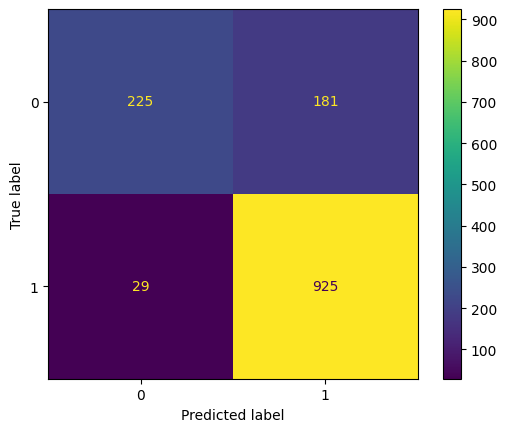

In [571]:
matrix1=confusion_matrix(y_test, y_pred)
ConfusionMatrixDisplay(matrix1).plot()

RANDOM FOREST - S tfidf word frequency

In [572]:
rf_model = RandomForestClassifier()
rf_model.fit(X_train_combined4_rf, y_train)

RandomForestClassifier()

In [573]:
y_pred_train = rf_model.predict(X_train_combined4_rf)
print("Presnosť:", accuracy_score(y_train, y_pred_train))
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train))

Presnosť: 1.0
Klasifikačný report:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00       935
           1       1.00      1.00      1.00      2237

    accuracy                           1.00      3172
   macro avg       1.00      1.00      1.00      3172
weighted avg       1.00      1.00      1.00      3172



In [574]:
y_pred = rf_model.predict(X_test_combined4_rf)
print("Presnosť:", accuracy_score(y_test, y_pred))
print("Klasifikačný report:\n", classification_report(y_test, y_pred))

Presnosť: 0.8573529411764705
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.92      0.57      0.70       406
           1       0.84      0.98      0.91       954

    accuracy                           0.86      1360
   macro avg       0.88      0.77      0.81      1360
weighted avg       0.87      0.86      0.85      1360



In [575]:
results_list2_rf.append({
        'accuracy_train': accuracy_score(y_train, y_pred_train),
    'accuracy_test': accuracy_score(y_test, y_pred),
    'precision_train': precision_score(y_train, y_pred_train, average='binary'),
    'precision_test': precision_score(y_test, y_pred, average='binary'),
 'recall_train': recall_score(y_train, y_pred_train, average='binary'),
 'recall_test': recall_score(y_test, y_pred, average='binary'),
 'f1_train': f1_score(y_train, y_pred_train, average='binary'),
 'f1_test': f1_score(y_test, y_pred, average='binary')
        
    })

In [576]:
accuracy = accuracy_score(y_test, y_pred)
recall = recall_score(y_test, y_pred, average='binary')  # 'macro' pre nevyvážené triedy, 'binary' pre binárnu klasifikáciu
precision = precision_score(y_test, y_pred, average='binary')
f1 = f1_score(y_test, y_pred, average='binary')

print("Accuracy: {:.2f}".format(accuracy))
print("Recall: {:.2f}".format(recall))
print("Precision: {:.2f}".format(precision))
print("F1 Score: {:.2f}".format(f1))

Accuracy: 0.86
Recall: 0.98
Precision: 0.84
F1 Score: 0.91


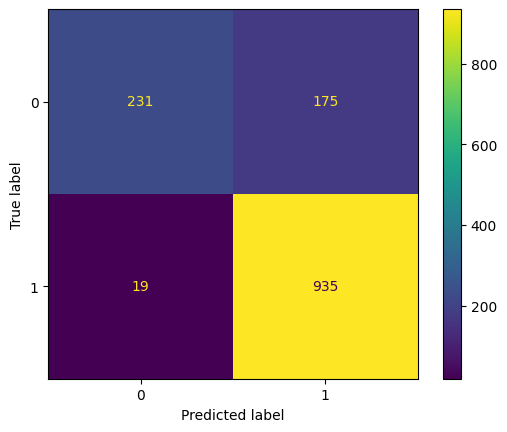

In [577]:
matrix1=confusion_matrix(y_test, y_pred)
ConfusionMatrixDisplay(matrix1).plot()

RANDOM FOREST - S ošetrenim outlierov

In [578]:
rf_model = RandomForestClassifier()
rf_model.fit(X_train_out_rf, y_train)

RandomForestClassifier()

In [579]:
y_pred_train = rf_model.predict(X_train_out_rf)
print("Presnosť:", accuracy_score(y_train, y_pred_train))
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train))

Presnosť: 1.0
Klasifikačný report:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00       935
           1       1.00      1.00      1.00      2237

    accuracy                           1.00      3172
   macro avg       1.00      1.00      1.00      3172
weighted avg       1.00      1.00      1.00      3172



In [580]:
y_pred = rf_model.predict(X_test_out_rf)
print("Presnosť:", accuracy_score(y_test, y_pred))
print("Klasifikačný report:\n", classification_report(y_test, y_pred))

Presnosť: 0.9139705882352941
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.91      0.79      0.85       406
           1       0.91      0.97      0.94       954

    accuracy                           0.91      1360
   macro avg       0.91      0.88      0.89      1360
weighted avg       0.91      0.91      0.91      1360



In [581]:
results_list2_rf.append({
        'accuracy_train': accuracy_score(y_train, y_pred_train),
    'accuracy_test': accuracy_score(y_test, y_pred),
    'precision_train': precision_score(y_train, y_pred_train, average='binary'),
    'precision_test': precision_score(y_test, y_pred, average='binary'),
 'recall_train': recall_score(y_train, y_pred_train, average='binary'),
 'recall_test': recall_score(y_test, y_pred, average='binary'),
 'f1_train': f1_score(y_train, y_pred_train, average='binary'),
 'f1_test': f1_score(y_test, y_pred, average='binary')
        
    })

In [582]:
accuracy = accuracy_score(y_test, y_pred)
recall = recall_score(y_test, y_pred, average='binary')  # 'macro' pre nevyvážené triedy, 'binary' pre binárnu klasifikáciu
precision = precision_score(y_test, y_pred, average='binary')
f1 = f1_score(y_test, y_pred, average='binary')

print("Accuracy: {:.2f}".format(accuracy))
print("Recall: {:.2f}".format(recall))
print("Precision: {:.2f}".format(precision))
print("F1 Score: {:.2f}".format(f1))

Accuracy: 0.91
Recall: 0.97
Precision: 0.91
F1 Score: 0.94


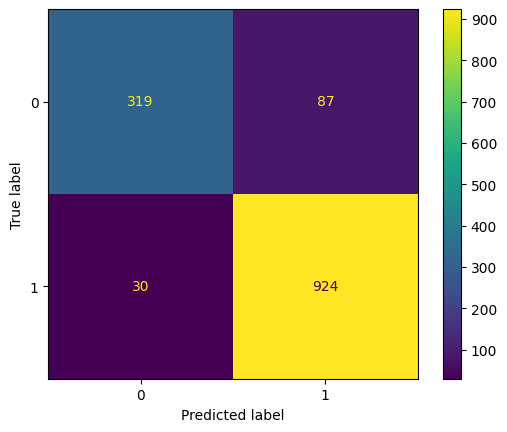

In [583]:
matrix1=confusion_matrix(y_test, y_pred)
ConfusionMatrixDisplay(matrix1).plot()

RANDOM FOREST - S ošetrenim outlierov a n-gram

In [584]:
rf_model = RandomForestClassifier()
rf_model.fit(X_train_combined_out_rf, y_train)

RandomForestClassifier()

In [585]:
y_pred_train = rf_model.predict(X_train_combined_out_rf)
print("Presnosť:", accuracy_score(y_train, y_pred_train))
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train))

Presnosť: 1.0
Klasifikačný report:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00       935
           1       1.00      1.00      1.00      2237

    accuracy                           1.00      3172
   macro avg       1.00      1.00      1.00      3172
weighted avg       1.00      1.00      1.00      3172



In [586]:
y_pred = rf_model.predict(X_test_combined_out_rf)
print("Presnosť:", accuracy_score(y_test, y_pred))
print("Klasifikačný report:\n", classification_report(y_test, y_pred))

Presnosť: 0.8573529411764705
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.92      0.57      0.71       406
           1       0.84      0.98      0.91       954

    accuracy                           0.86      1360
   macro avg       0.88      0.78      0.81      1360
weighted avg       0.87      0.86      0.85      1360



In [587]:
results_list2_rf.append({
        'accuracy_train': accuracy_score(y_train, y_pred_train),
    'accuracy_test': accuracy_score(y_test, y_pred),
    'precision_train': precision_score(y_train, y_pred_train, average='binary'),
    'precision_test': precision_score(y_test, y_pred, average='binary'),
 'recall_train': recall_score(y_train, y_pred_train, average='binary'),
 'recall_test': recall_score(y_test, y_pred, average='binary'),
 'f1_train': f1_score(y_train, y_pred_train, average='binary'),
 'f1_test': f1_score(y_test, y_pred, average='binary')
        
    })

In [588]:
accuracy = accuracy_score(y_test, y_pred)
recall = recall_score(y_test, y_pred, average='binary')  # 'macro' pre nevyvážené triedy, 'binary' pre binárnu klasifikáciu
precision = precision_score(y_test, y_pred, average='binary')
f1 = f1_score(y_test, y_pred, average='binary')

print("Accuracy: {:.2f}".format(accuracy))
print("Recall: {:.2f}".format(recall))
print("Precision: {:.2f}".format(precision))
print("F1 Score: {:.2f}".format(f1))

Accuracy: 0.86
Recall: 0.98
Precision: 0.84
F1 Score: 0.91


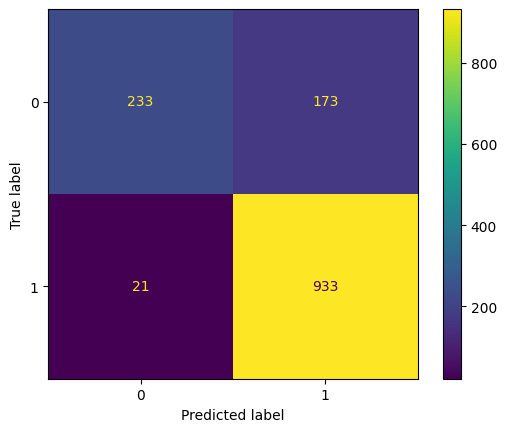

In [589]:
matrix1=confusion_matrix(y_test, y_pred)
ConfusionMatrixDisplay(matrix1).plot()

RANDOM FOREST - S ošetrenim outlierov a tfidf n-gram

In [590]:
rf_model = RandomForestClassifier()
rf_model.fit(X_train_combined2_out_rf, y_train)

RandomForestClassifier()

In [591]:
y_pred_train = rf_model.predict(X_train_combined2_out_rf)
print("Presnosť:", accuracy_score(y_train, y_pred_train))
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train))

Presnosť: 1.0
Klasifikačný report:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00       935
           1       1.00      1.00      1.00      2237

    accuracy                           1.00      3172
   macro avg       1.00      1.00      1.00      3172
weighted avg       1.00      1.00      1.00      3172



In [592]:
y_pred = rf_model.predict(X_test_combined2_out_rf)
print("Presnosť:", accuracy_score(y_test, y_pred))
print("Klasifikačný report:\n", classification_report(y_test, y_pred))

Presnosť: 0.8705882352941177
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.91      0.63      0.74       406
           1       0.86      0.97      0.91       954

    accuracy                           0.87      1360
   macro avg       0.88      0.80      0.83      1360
weighted avg       0.87      0.87      0.86      1360



In [593]:
results_list2_rf.append({
        'accuracy_train': accuracy_score(y_train, y_pred_train),
    'accuracy_test': accuracy_score(y_test, y_pred),
    'precision_train': precision_score(y_train, y_pred_train, average='binary'),
    'precision_test': precision_score(y_test, y_pred, average='binary'),
 'recall_train': recall_score(y_train, y_pred_train, average='binary'),
 'recall_test': recall_score(y_test, y_pred, average='binary'),
 'f1_train': f1_score(y_train, y_pred_train, average='binary'),
 'f1_test': f1_score(y_test, y_pred, average='binary')
        
    })

In [594]:
accuracy = accuracy_score(y_test, y_pred)
recall = recall_score(y_test, y_pred, average='binary')  # 'macro' pre nevyvážené triedy, 'binary' pre binárnu klasifikáciu
precision = precision_score(y_test, y_pred, average='binary')
f1 = f1_score(y_test, y_pred, average='binary')

print("Accuracy: {:.2f}".format(accuracy))
print("Recall: {:.2f}".format(recall))
print("Precision: {:.2f}".format(precision))
print("F1 Score: {:.2f}".format(f1))

Accuracy: 0.87
Recall: 0.97
Precision: 0.86
F1 Score: 0.91


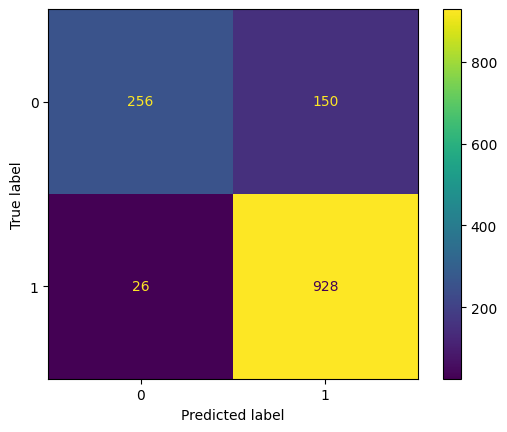

In [595]:
matrix1=confusion_matrix(y_test, y_pred)
ConfusionMatrixDisplay(matrix1).plot()

RANDOM FOREST - S ošetrenim outlierov a word frequency

In [596]:
rf_model = RandomForestClassifier()
rf_model.fit(X_train_combined3_out_rf, y_train)

RandomForestClassifier()

In [597]:
y_pred_train = rf_model.predict(X_train_combined3_out_rf)
print("Presnosť:", accuracy_score(y_train, y_pred_train))
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train))

Presnosť: 1.0
Klasifikačný report:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00       935
           1       1.00      1.00      1.00      2237

    accuracy                           1.00      3172
   macro avg       1.00      1.00      1.00      3172
weighted avg       1.00      1.00      1.00      3172



In [598]:
y_pred = rf_model.predict(X_test_combined3_out_rf)
print("Presnosť:", accuracy_score(y_test, y_pred))
print("Klasifikačný report:\n", classification_report(y_test, y_pred))

Presnosť: 0.888235294117647
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.95      0.66      0.78       406
           1       0.87      0.99      0.93       954

    accuracy                           0.89      1360
   macro avg       0.91      0.82      0.85      1360
weighted avg       0.90      0.89      0.88      1360



In [599]:
results_list2_rf.append({
        'accuracy_train': accuracy_score(y_train, y_pred_train),
    'accuracy_test': accuracy_score(y_test, y_pred),
    'precision_train': precision_score(y_train, y_pred_train, average='binary'),
    'precision_test': precision_score(y_test, y_pred, average='binary'),
 'recall_train': recall_score(y_train, y_pred_train, average='binary'),
 'recall_test': recall_score(y_test, y_pred, average='binary'),
 'f1_train': f1_score(y_train, y_pred_train, average='binary'),
 'f1_test': f1_score(y_test, y_pred, average='binary')
        
    })

In [600]:
accuracy = accuracy_score(y_test, y_pred)
recall = recall_score(y_test, y_pred, average='binary')  # 'macro' pre nevyvážené triedy, 'binary' pre binárnu klasifikáciu
precision = precision_score(y_test, y_pred, average='binary')
f1 = f1_score(y_test, y_pred, average='binary')

print("Accuracy: {:.2f}".format(accuracy))
print("Recall: {:.2f}".format(recall))
print("Precision: {:.2f}".format(precision))
print("F1 Score: {:.2f}".format(f1))

Accuracy: 0.89
Recall: 0.99
Precision: 0.87
F1 Score: 0.93


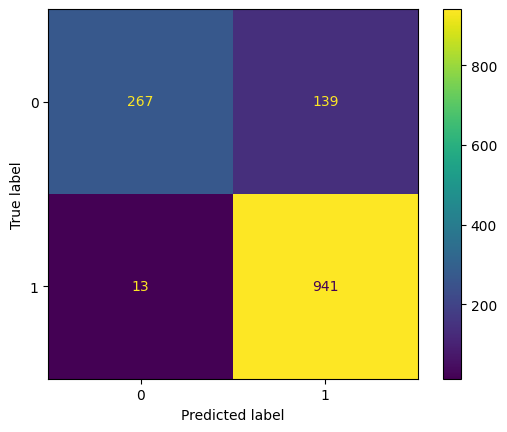

In [601]:
matrix1=confusion_matrix(y_test, y_pred)
ConfusionMatrixDisplay(matrix1).plot()

RANDOM FOREST - S ošetrenim outlierov a tfidf word frequency

In [602]:
rf_model = RandomForestClassifier()
rf_model.fit(X_train_combined4_out_rf, y_train)

RandomForestClassifier()

In [603]:
y_pred_train = rf_model.predict(X_train_combined4_out_rf)
print("Presnosť:", accuracy_score(y_train, y_pred_train))
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train))

Presnosť: 1.0
Klasifikačný report:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00       935
           1       1.00      1.00      1.00      2237

    accuracy                           1.00      3172
   macro avg       1.00      1.00      1.00      3172
weighted avg       1.00      1.00      1.00      3172



In [604]:
y_pred = rf_model.predict(X_test_combined4_out_rf)
print("Presnosť:", accuracy_score(y_test, y_pred))
print("Klasifikačný report:\n", classification_report(y_test, y_pred))

Presnosť: 0.8588235294117647
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.92      0.58      0.71       406
           1       0.84      0.98      0.91       954

    accuracy                           0.86      1360
   macro avg       0.88      0.78      0.81      1360
weighted avg       0.87      0.86      0.85      1360



In [605]:
results_list2_rf.append({
        'accuracy_train': accuracy_score(y_train, y_pred_train),
    'accuracy_test': accuracy_score(y_test, y_pred),
    'precision_train': precision_score(y_train, y_pred_train, average='binary'),
    'precision_test': precision_score(y_test, y_pred, average='binary'),
 'recall_train': recall_score(y_train, y_pred_train, average='binary'),
 'recall_test': recall_score(y_test, y_pred, average='binary'),
 'f1_train': f1_score(y_train, y_pred_train, average='binary'),
 'f1_test': f1_score(y_test, y_pred, average='binary')
        
    })

In [606]:
accuracy = accuracy_score(y_test, y_pred)
recall = recall_score(y_test, y_pred, average='binary')  # 'macro' pre nevyvážené triedy, 'binary' pre binárnu klasifikáciu
precision = precision_score(y_test, y_pred, average='binary')
f1 = f1_score(y_test, y_pred, average='binary')

print("Accuracy: {:.2f}".format(accuracy))
print("Recall: {:.2f}".format(recall))
print("Precision: {:.2f}".format(precision))
print("F1 Score: {:.2f}".format(f1))

Accuracy: 0.86
Recall: 0.98
Precision: 0.84
F1 Score: 0.91


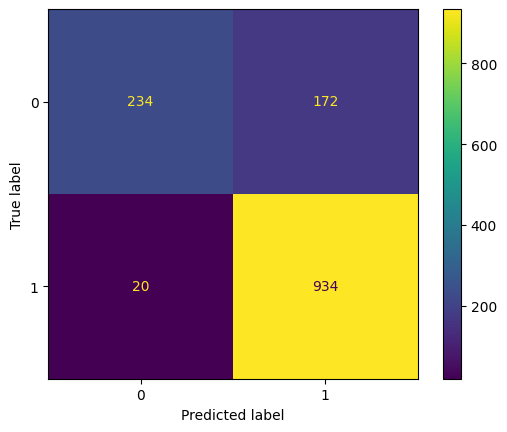

In [607]:
matrix1=confusion_matrix(y_test, y_pred)
ConfusionMatrixDisplay(matrix1).plot()

RANDOM FOREST - So škálovaním

In [608]:
rf_model = RandomForestClassifier()
rf_model.fit(X_train_scaled_rf, y_train)

RandomForestClassifier()

In [609]:
y_pred_train = rf_model.predict(X_train_scaled_rf)
print("Presnosť:", accuracy_score(y_train, y_pred_train))
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train))

Presnosť: 0.8064312736443884
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.84      0.42      0.56       935
           1       0.80      0.97      0.88      2237

    accuracy                           0.81      3172
   macro avg       0.82      0.69      0.72      3172
weighted avg       0.81      0.81      0.78      3172



In [610]:
y_pred = rf_model.predict(X_test_scaled_rf)
print("Presnosť:", accuracy_score(y_test, y_pred))
print("Klasifikačný report:\n", classification_report(y_test, y_pred))

Presnosť: 0.6705882352941176
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.41      0.23      0.29       406
           1       0.72      0.86      0.79       954

    accuracy                           0.67      1360
   macro avg       0.57      0.54      0.54      1360
weighted avg       0.63      0.67      0.64      1360



In [611]:
results_list2_rf.append({
        'accuracy_train': accuracy_score(y_train, y_pred_train),
    'accuracy_test': accuracy_score(y_test, y_pred),
    'precision_train': precision_score(y_train, y_pred_train, average='binary'),
    'precision_test': precision_score(y_test, y_pred, average='binary'),
 'recall_train': recall_score(y_train, y_pred_train, average='binary'),
 'recall_test': recall_score(y_test, y_pred, average='binary'),
 'f1_train': f1_score(y_train, y_pred_train, average='binary'),
 'f1_test': f1_score(y_test, y_pred, average='binary')
        
    })

In [612]:
accuracy = accuracy_score(y_test, y_pred)
recall = recall_score(y_test, y_pred, average='binary')  # 'macro' pre nevyvážené triedy, 'binary' pre binárnu klasifikáciu
precision = precision_score(y_test, y_pred, average='binary')
f1 = f1_score(y_test, y_pred, average='binary')

print("Accuracy: {:.2f}".format(accuracy))
print("Recall: {:.2f}".format(recall))
print("Precision: {:.2f}".format(precision))
print("F1 Score: {:.2f}".format(f1))

Accuracy: 0.67
Recall: 0.86
Precision: 0.72
F1 Score: 0.79


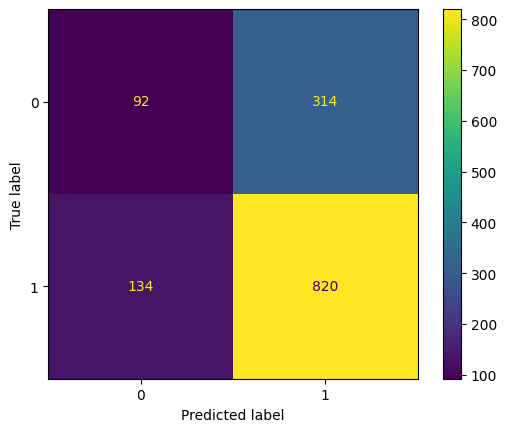

In [613]:
matrix1=confusion_matrix(y_test, y_pred)
ConfusionMatrixDisplay(matrix1).plot()

RANDOM FOREST - So škálovaním a n-gram

In [614]:
rf_model = RandomForestClassifier()
rf_model.fit(X_train_combined_scaled_rf, y_train)

RandomForestClassifier()

In [615]:
y_pred_train = rf_model.predict(X_train_combined_scaled_rf)
print("Presnosť:", accuracy_score(y_train, y_pred_train))
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train))

Presnosť: 1.0
Klasifikačný report:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00       935
           1       1.00      1.00      1.00      2237

    accuracy                           1.00      3172
   macro avg       1.00      1.00      1.00      3172
weighted avg       1.00      1.00      1.00      3172



In [616]:
y_pred = rf_model.predict(X_test_combined_scaled_rf)
print("Presnosť:", accuracy_score(y_test, y_pred))
print("Klasifikačný report:\n", classification_report(y_test, y_pred))

Presnosť: 0.8463235294117647
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.89      0.55      0.68       406
           1       0.84      0.97      0.90       954

    accuracy                           0.85      1360
   macro avg       0.86      0.76      0.79      1360
weighted avg       0.85      0.85      0.83      1360



In [617]:
results_list2_rf.append({
        'accuracy_train': accuracy_score(y_train, y_pred_train),
    'accuracy_test': accuracy_score(y_test, y_pred),
    'precision_train': precision_score(y_train, y_pred_train, average='binary'),
    'precision_test': precision_score(y_test, y_pred, average='binary'),
 'recall_train': recall_score(y_train, y_pred_train, average='binary'),
 'recall_test': recall_score(y_test, y_pred, average='binary'),
 'f1_train': f1_score(y_train, y_pred_train, average='binary'),
 'f1_test': f1_score(y_test, y_pred, average='binary')
        
    })

In [618]:
accuracy = accuracy_score(y_test, y_pred)
recall = recall_score(y_test, y_pred, average='binary')  # 'macro' pre nevyvážené triedy, 'binary' pre binárnu klasifikáciu
precision = precision_score(y_test, y_pred, average='binary')
f1 = f1_score(y_test, y_pred, average='binary')

print("Accuracy: {:.2f}".format(accuracy))
print("Recall: {:.2f}".format(recall))
print("Precision: {:.2f}".format(precision))
print("F1 Score: {:.2f}".format(f1))

Accuracy: 0.85
Recall: 0.97
Precision: 0.84
F1 Score: 0.90


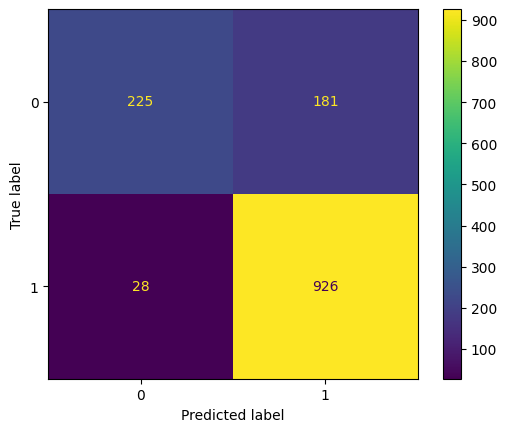

In [619]:
matrix1=confusion_matrix(y_test, y_pred)
ConfusionMatrixDisplay(matrix1).plot()

RANDOM FOREST - So škálovaním a tfidf n-gram

In [620]:
rf_model = RandomForestClassifier()
rf_model.fit(X_train_combined2_scaled_rf, y_train)

RandomForestClassifier()

In [621]:
y_pred_train = rf_model.predict(X_train_combined2_scaled_rf)
print("Presnosť:", accuracy_score(y_train, y_pred_train))
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train))

Presnosť: 1.0
Klasifikačný report:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00       935
           1       1.00      1.00      1.00      2237

    accuracy                           1.00      3172
   macro avg       1.00      1.00      1.00      3172
weighted avg       1.00      1.00      1.00      3172



In [622]:
y_pred = rf_model.predict(X_test_combined2_scaled_rf)
print("Presnosť:", accuracy_score(y_test, y_pred))
print("Klasifikačný report:\n", classification_report(y_test, y_pred))

Presnosť: 0.8470588235294118
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.89      0.55      0.68       406
           1       0.84      0.97      0.90       954

    accuracy                           0.85      1360
   macro avg       0.86      0.76      0.79      1360
weighted avg       0.85      0.85      0.83      1360



In [623]:
results_list2_rf.append({
        'accuracy_train': accuracy_score(y_train, y_pred_train),
    'accuracy_test': accuracy_score(y_test, y_pred),
    'precision_train': precision_score(y_train, y_pred_train, average='binary'),
    'precision_test': precision_score(y_test, y_pred, average='binary'),
 'recall_train': recall_score(y_train, y_pred_train, average='binary'),
 'recall_test': recall_score(y_test, y_pred, average='binary'),
 'f1_train': f1_score(y_train, y_pred_train, average='binary'),
 'f1_test': f1_score(y_test, y_pred, average='binary')
        
    })

In [624]:
accuracy = accuracy_score(y_test, y_pred)
recall = recall_score(y_test, y_pred, average='binary')  # 'macro' pre nevyvážené triedy, 'binary' pre binárnu klasifikáciu
precision = precision_score(y_test, y_pred, average='binary')
f1 = f1_score(y_test, y_pred, average='binary')

print("Accuracy: {:.2f}".format(accuracy))
print("Recall: {:.2f}".format(recall))
print("Precision: {:.2f}".format(precision))
print("F1 Score: {:.2f}".format(f1))

Accuracy: 0.85
Recall: 0.97
Precision: 0.84
F1 Score: 0.90


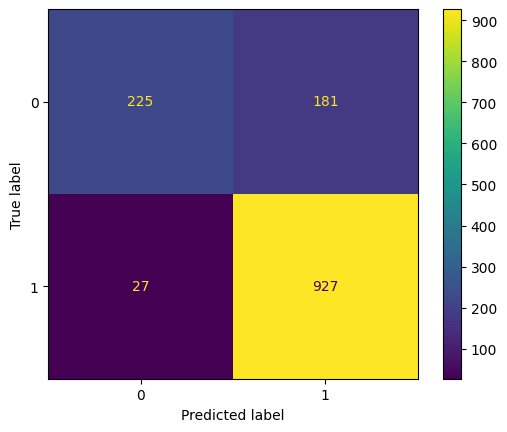

In [625]:
matrix1=confusion_matrix(y_test, y_pred)
ConfusionMatrixDisplay(matrix1).plot()

RANDOM FOREST - So škálovaním a word frequency

In [626]:
rf_model = RandomForestClassifier()
rf_model.fit(X_train_combined3_scaled_rf, y_train)

RandomForestClassifier()

In [627]:
y_pred_train = rf_model.predict(X_train_combined3_scaled_rf)
print("Presnosť:", accuracy_score(y_train, y_pred_train))
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train))

Presnosť: 1.0
Klasifikačný report:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00       935
           1       1.00      1.00      1.00      2237

    accuracy                           1.00      3172
   macro avg       1.00      1.00      1.00      3172
weighted avg       1.00      1.00      1.00      3172



In [628]:
y_pred = rf_model.predict(X_test_combined3_scaled_rf)
print("Presnosť:", accuracy_score(y_test, y_pred))
print("Klasifikačný report:\n", classification_report(y_test, y_pred))

Presnosť: 0.8426470588235294
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.90      0.53      0.67       406
           1       0.83      0.97      0.90       954

    accuracy                           0.84      1360
   macro avg       0.86      0.75      0.78      1360
weighted avg       0.85      0.84      0.83      1360



In [629]:
results_list2_rf.append({
        'accuracy_train': accuracy_score(y_train, y_pred_train),
    'accuracy_test': accuracy_score(y_test, y_pred),
    'precision_train': precision_score(y_train, y_pred_train, average='binary'),
    'precision_test': precision_score(y_test, y_pred, average='binary'),
 'recall_train': recall_score(y_train, y_pred_train, average='binary'),
 'recall_test': recall_score(y_test, y_pred, average='binary'),
 'f1_train': f1_score(y_train, y_pred_train, average='binary'),
 'f1_test': f1_score(y_test, y_pred, average='binary')
        
    })

In [630]:
accuracy = accuracy_score(y_test, y_pred)
recall = recall_score(y_test, y_pred, average='binary')  # 'macro' pre nevyvážené triedy, 'binary' pre binárnu klasifikáciu
precision = precision_score(y_test, y_pred, average='binary')
f1 = f1_score(y_test, y_pred, average='binary')

print("Accuracy: {:.2f}".format(accuracy))
print("Recall: {:.2f}".format(recall))
print("Precision: {:.2f}".format(precision))
print("F1 Score: {:.2f}".format(f1))

Accuracy: 0.84
Recall: 0.97
Precision: 0.83
F1 Score: 0.90


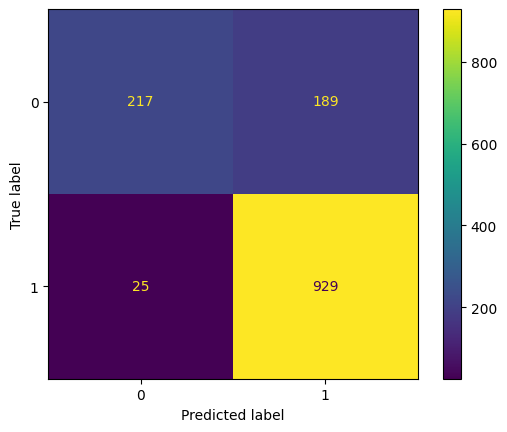

In [631]:
matrix1=confusion_matrix(y_test, y_pred)
ConfusionMatrixDisplay(matrix1).plot()

RANDOM FOREST - So škálovaním a tfidf word frequency

In [632]:
rf_model = RandomForestClassifier()
rf_model.fit(X_train_combined4_scaled_rf, y_train)

RandomForestClassifier()

In [633]:
y_pred_train = rf_model.predict(X_train_combined4_scaled_rf)
print("Presnosť:", accuracy_score(y_train, y_pred_train))
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train))

Presnosť: 1.0
Klasifikačný report:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00       935
           1       1.00      1.00      1.00      2237

    accuracy                           1.00      3172
   macro avg       1.00      1.00      1.00      3172
weighted avg       1.00      1.00      1.00      3172



In [634]:
y_pred = rf_model.predict(X_test_combined4_scaled_rf)
print("Presnosť:", accuracy_score(y_test, y_pred))
print("Klasifikačný report:\n", classification_report(y_test, y_pred))

Presnosť: 0.8470588235294118
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.91      0.54      0.68       406
           1       0.83      0.98      0.90       954

    accuracy                           0.85      1360
   macro avg       0.87      0.76      0.79      1360
weighted avg       0.86      0.85      0.83      1360



In [635]:
results_list2_rf.append({
        'accuracy_train': accuracy_score(y_train, y_pred_train),
    'accuracy_test': accuracy_score(y_test, y_pred),
    'precision_train': precision_score(y_train, y_pred_train, average='binary'),
    'precision_test': precision_score(y_test, y_pred, average='binary'),
 'recall_train': recall_score(y_train, y_pred_train, average='binary'),
 'recall_test': recall_score(y_test, y_pred, average='binary'),
 'f1_train': f1_score(y_train, y_pred_train, average='binary'),
 'f1_test': f1_score(y_test, y_pred, average='binary')
        
    })

In [636]:
accuracy = accuracy_score(y_test, y_pred)
recall = recall_score(y_test, y_pred, average='binary')  # 'macro' pre nevyvážené triedy, 'binary' pre binárnu klasifikáciu
precision = precision_score(y_test, y_pred, average='binary')
f1 = f1_score(y_test, y_pred, average='binary')

print("Accuracy: {:.2f}".format(accuracy))
print("Recall: {:.2f}".format(recall))
print("Precision: {:.2f}".format(precision))
print("F1 Score: {:.2f}".format(f1))

Accuracy: 0.85
Recall: 0.98
Precision: 0.83
F1 Score: 0.90


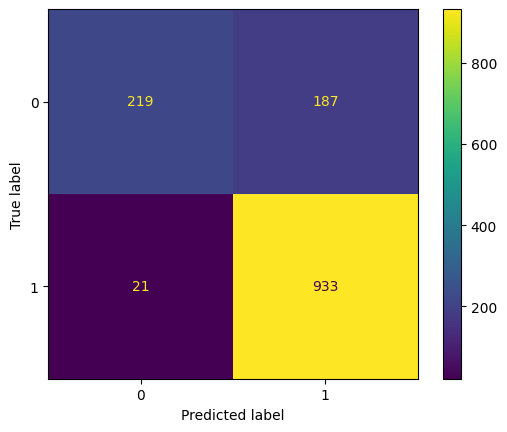

In [637]:
matrix1=confusion_matrix(y_test, y_pred)
ConfusionMatrixDisplay(matrix1).plot()

RANDOM FOREST - S ošetrením outlierov a so škálovaním

In [638]:
rf_model = RandomForestClassifier()
rf_model.fit(X_train_scal_out_rf, y_train)

RandomForestClassifier()

In [639]:
y_pred_train = rf_model.predict(X_train_scal_out_rf)
print("Presnosť:", accuracy_score(y_train, y_pred_train))
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train))

Presnosť: 1.0
Klasifikačný report:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00       935
           1       1.00      1.00      1.00      2237

    accuracy                           1.00      3172
   macro avg       1.00      1.00      1.00      3172
weighted avg       1.00      1.00      1.00      3172



In [640]:
y_pred = rf_model.predict(X_test_scal_out_rf)
print("Presnosť:", accuracy_score(y_test, y_pred))
print("Klasifikačný report:\n", classification_report(y_test, y_pred))

Presnosť: 0.9014705882352941
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.87      0.78      0.83       406
           1       0.91      0.95      0.93       954

    accuracy                           0.90      1360
   macro avg       0.89      0.87      0.88      1360
weighted avg       0.90      0.90      0.90      1360



In [641]:
results_list2_rf.append({
        'accuracy_train': accuracy_score(y_train, y_pred_train),
    'accuracy_test': accuracy_score(y_test, y_pred),
    'precision_train': precision_score(y_train, y_pred_train, average='binary'),
    'precision_test': precision_score(y_test, y_pred, average='binary'),
 'recall_train': recall_score(y_train, y_pred_train, average='binary'),
 'recall_test': recall_score(y_test, y_pred, average='binary'),
 'f1_train': f1_score(y_train, y_pred_train, average='binary'),
 'f1_test': f1_score(y_test, y_pred, average='binary')
        
    })

In [642]:
accuracy = accuracy_score(y_test, y_pred)
recall = recall_score(y_test, y_pred, average='binary')  # 'macro' pre nevyvážené triedy, 'binary' pre binárnu klasifikáciu
precision = precision_score(y_test, y_pred, average='binary')
f1 = f1_score(y_test, y_pred, average='binary')

print("Accuracy: {:.2f}".format(accuracy))
print("Recall: {:.2f}".format(recall))
print("Precision: {:.2f}".format(precision))
print("F1 Score: {:.2f}".format(f1))

Accuracy: 0.90
Recall: 0.95
Precision: 0.91
F1 Score: 0.93


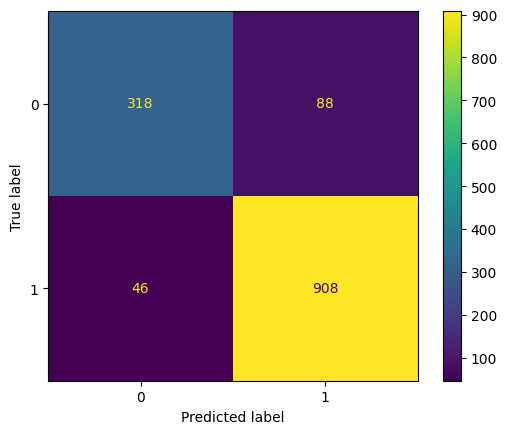

In [643]:
matrix1=confusion_matrix(y_test, y_pred)
ConfusionMatrixDisplay(matrix1).plot()

RANDOM FOREST - S ošetrením outlierov a so škálovaním a s n-gram

In [644]:
rf_model = RandomForestClassifier()
rf_model.fit(X_train_combined_scal_out_rf, y_train)

RandomForestClassifier()

In [645]:
y_pred_train = rf_model.predict(X_train_combined_scal_out_rf)
print("Presnosť:", accuracy_score(y_train, y_pred_train))
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train))

Presnosť: 1.0
Klasifikačný report:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00       935
           1       1.00      1.00      1.00      2237

    accuracy                           1.00      3172
   macro avg       1.00      1.00      1.00      3172
weighted avg       1.00      1.00      1.00      3172



In [646]:
y_pred = rf_model.predict(X_test_combined_scal_out_rf)
print("Presnosť:", accuracy_score(y_test, y_pred))
print("Klasifikačný report:\n", classification_report(y_test, y_pred))

Presnosť: 0.8573529411764705
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.91      0.58      0.71       406
           1       0.84      0.98      0.91       954

    accuracy                           0.86      1360
   macro avg       0.88      0.78      0.81      1360
weighted avg       0.86      0.86      0.85      1360



In [647]:
results_list2_rf.append({
        'accuracy_train': accuracy_score(y_train, y_pred_train),
    'accuracy_test': accuracy_score(y_test, y_pred),
    'precision_train': precision_score(y_train, y_pred_train, average='binary'),
    'precision_test': precision_score(y_test, y_pred, average='binary'),
 'recall_train': recall_score(y_train, y_pred_train, average='binary'),
 'recall_test': recall_score(y_test, y_pred, average='binary'),
 'f1_train': f1_score(y_train, y_pred_train, average='binary'),
 'f1_test': f1_score(y_test, y_pred, average='binary')
        
    })

In [648]:
accuracy = accuracy_score(y_test, y_pred)
recall = recall_score(y_test, y_pred, average='binary')  # 'macro' pre nevyvážené triedy, 'binary' pre binárnu klasifikáciu
precision = precision_score(y_test, y_pred, average='binary')
f1 = f1_score(y_test, y_pred, average='binary')

print("Accuracy: {:.2f}".format(accuracy))
print("Recall: {:.2f}".format(recall))
print("Precision: {:.2f}".format(precision))
print("F1 Score: {:.2f}".format(f1))

Accuracy: 0.86
Recall: 0.98
Precision: 0.84
F1 Score: 0.91


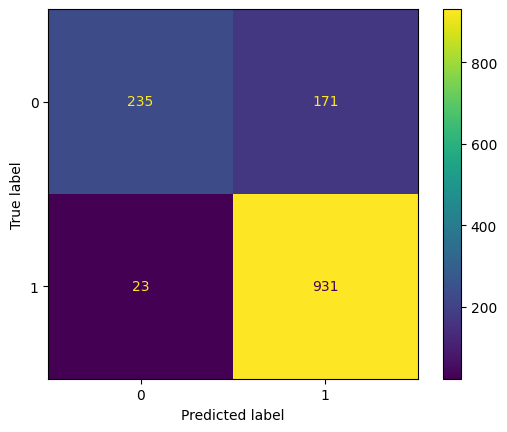

In [649]:
matrix1=confusion_matrix(y_test, y_pred)
ConfusionMatrixDisplay(matrix1).plot()

RANDOM FOREST - S ošetrením outlierov a so škálovaním a s tfidf-ngram

In [650]:
rf_model = RandomForestClassifier()
rf_model.fit(X_train_combined2_scal_out_rf, y_train)

RandomForestClassifier()

In [651]:
y_pred_train = rf_model.predict(X_train_combined2_scal_out_rf)
print("Presnosť:", accuracy_score(y_train, y_pred_train))
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train))

Presnosť: 1.0
Klasifikačný report:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00       935
           1       1.00      1.00      1.00      2237

    accuracy                           1.00      3172
   macro avg       1.00      1.00      1.00      3172
weighted avg       1.00      1.00      1.00      3172



In [652]:
y_pred = rf_model.predict(X_test_combined2_scal_out_rf)
print("Presnosť:", accuracy_score(y_test, y_pred))
print("Klasifikačný report:\n", classification_report(y_test, y_pred))

Presnosť: 0.8610294117647059
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.91      0.60      0.72       406
           1       0.85      0.97      0.91       954

    accuracy                           0.86      1360
   macro avg       0.88      0.78      0.81      1360
weighted avg       0.87      0.86      0.85      1360



In [653]:
results_list2_rf.append({
        'accuracy_train': accuracy_score(y_train, y_pred_train),
    'accuracy_test': accuracy_score(y_test, y_pred),
    'precision_train': precision_score(y_train, y_pred_train, average='binary'),
    'precision_test': precision_score(y_test, y_pred, average='binary'),
 'recall_train': recall_score(y_train, y_pred_train, average='binary'),
 'recall_test': recall_score(y_test, y_pred, average='binary'),
 'f1_train': f1_score(y_train, y_pred_train, average='binary'),
 'f1_test': f1_score(y_test, y_pred, average='binary')
        
    })

In [654]:
accuracy = accuracy_score(y_test, y_pred)
recall = recall_score(y_test, y_pred, average='binary')  # 'macro' pre nevyvážené triedy, 'binary' pre binárnu klasifikáciu
precision = precision_score(y_test, y_pred, average='binary')
f1 = f1_score(y_test, y_pred, average='binary')

print("Accuracy: {:.2f}".format(accuracy))
print("Recall: {:.2f}".format(recall))
print("Precision: {:.2f}".format(precision))
print("F1 Score: {:.2f}".format(f1))

Accuracy: 0.86
Recall: 0.97
Precision: 0.85
F1 Score: 0.91


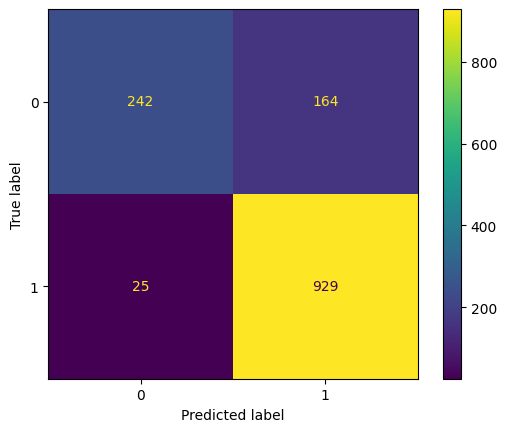

In [655]:
matrix1=confusion_matrix(y_test, y_pred)
ConfusionMatrixDisplay(matrix1).plot()

RANDOM FOREST - S ošetrením outlierov a so škálovaním a s word frequency

In [656]:
rf_model = RandomForestClassifier()
rf_model.fit(X_train_combined3_scal_out_rf, y_train)

RandomForestClassifier()

In [657]:
y_pred_train = rf_model.predict(X_train_combined3_scal_out_rf)
print("Presnosť:", accuracy_score(y_train, y_pred_train))
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train))

Presnosť: 1.0
Klasifikačný report:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00       935
           1       1.00      1.00      1.00      2237

    accuracy                           1.00      3172
   macro avg       1.00      1.00      1.00      3172
weighted avg       1.00      1.00      1.00      3172



In [658]:
y_pred = rf_model.predict(X_test_combined3_scal_out_rf)
print("Presnosť:", accuracy_score(y_test, y_pred))
print("Klasifikačný report:\n", classification_report(y_test, y_pred))

Presnosť: 0.8676470588235294
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.93      0.60      0.73       406
           1       0.85      0.98      0.91       954

    accuracy                           0.87      1360
   macro avg       0.89      0.79      0.82      1360
weighted avg       0.88      0.87      0.86      1360



In [659]:
results_list2_rf.append({
        'accuracy_train': accuracy_score(y_train, y_pred_train),
    'accuracy_test': accuracy_score(y_test, y_pred),
    'precision_train': precision_score(y_train, y_pred_train, average='binary'),
    'precision_test': precision_score(y_test, y_pred, average='binary'),
 'recall_train': recall_score(y_train, y_pred_train, average='binary'),
 'recall_test': recall_score(y_test, y_pred, average='binary'),
 'f1_train': f1_score(y_train, y_pred_train, average='binary'),
 'f1_test': f1_score(y_test, y_pred, average='binary')
        
    })


In [660]:
accuracy = accuracy_score(y_test, y_pred)
recall = recall_score(y_test, y_pred, average='binary')  # 'macro' pre nevyvážené triedy, 'binary' pre binárnu klasifikáciu
precision = precision_score(y_test, y_pred, average='binary')
f1 = f1_score(y_test, y_pred, average='binary')

print("Accuracy: {:.2f}".format(accuracy))
print("Recall: {:.2f}".format(recall))
print("Precision: {:.2f}".format(precision))
print("F1 Score: {:.2f}".format(f1))

Accuracy: 0.87
Recall: 0.98
Precision: 0.85
F1 Score: 0.91


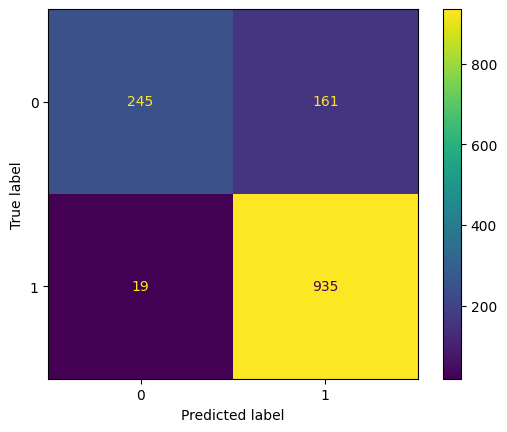

In [661]:
matrix1=confusion_matrix(y_test, y_pred)
ConfusionMatrixDisplay(matrix1).plot()

RANDOM FOREST - S ošetrením outlierov a so škálovaním a s tfidf word frequency

In [662]:
rf_model = RandomForestClassifier()
rf_model.fit(X_train_combined4_scal_out_rf, y_train)

RandomForestClassifier()

In [663]:
y_pred_train = rf_model.predict(X_train_combined4_scal_out_rf)
print("Presnosť:", accuracy_score(y_train, y_pred_train))
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train))

Presnosť: 1.0
Klasifikačný report:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00       935
           1       1.00      1.00      1.00      2237

    accuracy                           1.00      3172
   macro avg       1.00      1.00      1.00      3172
weighted avg       1.00      1.00      1.00      3172



In [664]:
y_pred = rf_model.predict(X_test_combined4_scal_out_rf)
print("Presnosť:", accuracy_score(y_test, y_pred))
print("Klasifikačný report:\n", classification_report(y_test, y_pred))

Presnosť: 0.8625
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.93      0.58      0.72       406
           1       0.85      0.98      0.91       954

    accuracy                           0.86      1360
   macro avg       0.89      0.78      0.81      1360
weighted avg       0.87      0.86      0.85      1360



In [665]:
results_list2_rf.append({
        'accuracy_train': accuracy_score(y_train, y_pred_train),
    'accuracy_test': accuracy_score(y_test, y_pred),
    'precision_train': precision_score(y_train, y_pred_train, average='binary'),
    'precision_test': precision_score(y_test, y_pred, average='binary'),
 'recall_train': recall_score(y_train, y_pred_train, average='binary'),
 'recall_test': recall_score(y_test, y_pred, average='binary'),
 'f1_train': f1_score(y_train, y_pred_train, average='binary'),
 'f1_test': f1_score(y_test, y_pred, average='binary')
        
    })

In [666]:
accuracy = accuracy_score(y_test, y_pred)
recall = recall_score(y_test, y_pred, average='binary')  # 'macro' pre nevyvážené triedy, 'binary' pre binárnu klasifikáciu
precision = precision_score(y_test, y_pred, average='binary')
f1 = f1_score(y_test, y_pred, average='binary')

print("Accuracy: {:.2f}".format(accuracy))
print("Recall: {:.2f}".format(recall))
print("Precision: {:.2f}".format(precision))
print("F1 Score: {:.2f}".format(f1))

Accuracy: 0.86
Recall: 0.98
Precision: 0.85
F1 Score: 0.91


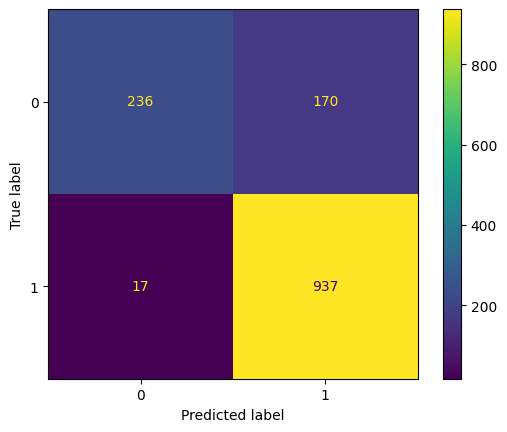

In [667]:
matrix1=confusion_matrix(y_test, y_pred)
ConfusionMatrixDisplay(matrix1).plot()

In [668]:
results_rf2 = pd.DataFrame(results_list2_rf)
print(results_rf2)

    accuracy_train  accuracy_test  precision_train  precision_test  \
0         0.806431       0.680147          0.79758        0.727432   
1         1.000000       0.852941          1.00000        0.839029   
2         1.000000       0.842647          1.00000        0.829768   
3         1.000000       0.845588          1.00000        0.836347   
4         1.000000       0.857353          1.00000        0.842342   
5         1.000000       0.913971          1.00000        0.913947   
6         1.000000       0.857353          1.00000        0.843580   
7         1.000000       0.870588          1.00000        0.860853   
8         1.000000       0.888235          1.00000        0.871296   
9         1.000000       0.858824          1.00000        0.844485   
10        0.806431       0.670588          0.80000        0.723104   
11        1.000000       0.846324          1.00000        0.836495   
12        1.000000       0.847059          1.00000        0.836643   
13        1.000000  

Podľa výsledkov po druhom testovani random forest môžeme vidieť, že najlepší výsledok mal dataset s ošetrenými outliermi. Takže je zrejme, že najväčší vplyv na úspešnosť malo ošetrenie outlierov. V porovnaní s prvým testom sa accuracy mierne zvýšilo. Aj ked sme zníšili počet črt, tak model je stále pretrénovaný.

GRADIENT BOOSTING CLASSIFIER - Bez ošetrenia outlierov a bez skalovania

In [669]:
results_list2_gbm=[]

Trenovanie modelu

In [670]:
gbm_model = GradientBoostingClassifier()
gbm_model.fit(X_train_gbm, y_train)

GradientBoostingClassifier()

Predikovanie na trenovacich datach

In [671]:
y_pred_train = gbm_model.predict(X_train_gbm)
print("Presnosť:", accuracy_score(y_train, y_pred_train))
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train))

Presnosť: 0.8253467843631778
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.85      0.50      0.63       935
           1       0.82      0.96      0.89      2237

    accuracy                           0.83      3172
   macro avg       0.83      0.73      0.76      3172
weighted avg       0.83      0.83      0.81      3172



Predikovanie na testovacich datach

In [672]:
y_pred = gbm_model.predict(X_test_gbm)
print("Presnosť:", accuracy_score(y_test, y_pred))
print("Klasifikačný report:\n", classification_report(y_test, y_pred))

Presnosť: 0.774264705882353
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.72      0.40      0.51       406
           1       0.78      0.94      0.85       954

    accuracy                           0.77      1360
   macro avg       0.75      0.67      0.68      1360
weighted avg       0.77      0.77      0.75      1360



In [673]:
results_list2_gbm.append({
        'accuracy_train': accuracy_score(y_train, y_pred_train),
    'accuracy_test': accuracy_score(y_test, y_pred),
    'precision_train': precision_score(y_train, y_pred_train, average='binary'),
    'precision_test': precision_score(y_test, y_pred, average='binary'),
 'recall_train': recall_score(y_train, y_pred_train, average='binary'),
 'recall_test': recall_score(y_test, y_pred, average='binary'),
 'f1_train': f1_score(y_train, y_pred_train, average='binary'),
 'f1_test': f1_score(y_test, y_pred, average='binary')
        
    })

Zobrazenie metrik

In [674]:
accuracy = accuracy_score(y_test, y_pred)
recall = recall_score(y_test, y_pred, average='binary')  # 'macro' pre nevyvážené triedy, 'binary' pre binárnu klasifikáciu
precision = precision_score(y_test, y_pred, average='binary')
f1 = f1_score(y_test, y_pred, average='binary')

print("Accuracy: {:.2f}".format(accuracy))
print("Recall: {:.2f}".format(recall))
print("Precision: {:.2f}".format(precision))
print("F1 Score: {:.2f}".format(f1))

Accuracy: 0.77
Recall: 0.94
Precision: 0.78
F1 Score: 0.85


Vizualizácia výkonnosti modelu

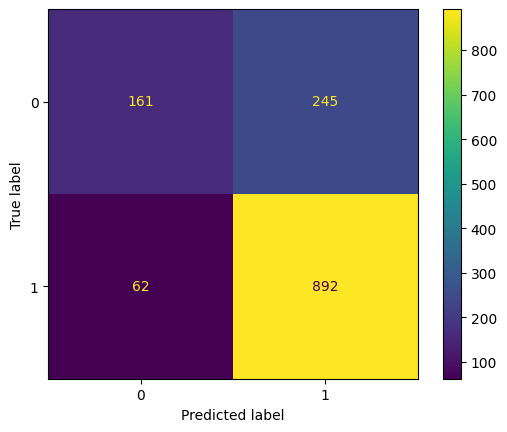

In [675]:
matrix1=confusion_matrix(y_test, y_pred)
ConfusionMatrixDisplay(matrix1).plot()

GBM - S n-gram

In [676]:
gbm_model = GradientBoostingClassifier()
gbm_model.fit(X_train_combined_gbm, y_train)

GradientBoostingClassifier()

In [677]:
y_pred_train = gbm_model.predict(X_train_combined_gbm)
print("Presnosť:", accuracy_score(y_train, y_pred_train))
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train))

Presnosť: 0.969735182849937
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.97      0.93      0.95       935
           1       0.97      0.99      0.98      2237

    accuracy                           0.97      3172
   macro avg       0.97      0.96      0.96      3172
weighted avg       0.97      0.97      0.97      3172



In [678]:
y_pred = gbm_model.predict(X_test_combined_gbm)
print("Presnosť:", accuracy_score(y_test, y_pred))
print("Klasifikačný report:\n", classification_report(y_test, y_pred))

Presnosť: 0.9080882352941176
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.89      0.79      0.84       406
           1       0.92      0.96      0.94       954

    accuracy                           0.91      1360
   macro avg       0.90      0.88      0.89      1360
weighted avg       0.91      0.91      0.91      1360



In [679]:
results_list2_gbm.append({
        'accuracy_train': accuracy_score(y_train, y_pred_train),
    'accuracy_test': accuracy_score(y_test, y_pred),
    'precision_train': precision_score(y_train, y_pred_train, average='binary'),
    'precision_test': precision_score(y_test, y_pred, average='binary'),
 'recall_train': recall_score(y_train, y_pred_train, average='binary'),
 'recall_test': recall_score(y_test, y_pred, average='binary'),
 'f1_train': f1_score(y_train, y_pred_train, average='binary'),
 'f1_test': f1_score(y_test, y_pred, average='binary')
        
    })

In [680]:
accuracy = accuracy_score(y_test, y_pred)
recall = recall_score(y_test, y_pred, average='binary')  # 'macro' pre nevyvážené triedy, 'binary' pre binárnu klasifikáciu
precision = precision_score(y_test, y_pred, average='binary')
f1 = f1_score(y_test, y_pred, average='binary')

print("Accuracy: {:.2f}".format(accuracy))
print("Recall: {:.2f}".format(recall))
print("Precision: {:.2f}".format(precision))
print("F1 Score: {:.2f}".format(f1))

Accuracy: 0.91
Recall: 0.96
Precision: 0.92
F1 Score: 0.94


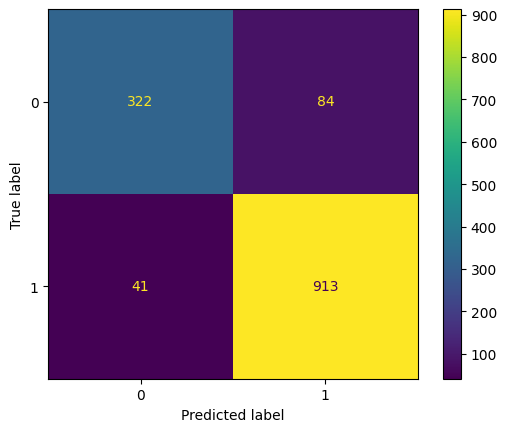

In [681]:
matrix1=confusion_matrix(y_test, y_pred)
ConfusionMatrixDisplay(matrix1).plot()

GBM - S n-gram tfidf

In [682]:
gbm_model = GradientBoostingClassifier()
gbm_model.fit(X_train_combined2_gbm, y_train)

GradientBoostingClassifier()

In [683]:
y_pred_train = gbm_model.predict(X_train_combined2_gbm)
print("Presnosť:", accuracy_score(y_train, y_pred_train))
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train))

Presnosť: 0.9722572509457755
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.97      0.93      0.95       935
           1       0.97      0.99      0.98      2237

    accuracy                           0.97      3172
   macro avg       0.97      0.96      0.97      3172
weighted avg       0.97      0.97      0.97      3172



In [684]:
y_pred = gbm_model.predict(X_test_combined2_gbm)
print("Presnosť:", accuracy_score(y_test, y_pred))
print("Klasifikačný report:\n", classification_report(y_test, y_pred))

Presnosť: 0.8970588235294118
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.87      0.77      0.82       406
           1       0.91      0.95      0.93       954

    accuracy                           0.90      1360
   macro avg       0.89      0.86      0.87      1360
weighted avg       0.90      0.90      0.90      1360



In [685]:
results_list2_gbm.append({
        'accuracy_train': accuracy_score(y_train, y_pred_train),
    'accuracy_test': accuracy_score(y_test, y_pred),
    'precision_train': precision_score(y_train, y_pred_train, average='binary'),
    'precision_test': precision_score(y_test, y_pred, average='binary'),
 'recall_train': recall_score(y_train, y_pred_train, average='binary'),
 'recall_test': recall_score(y_test, y_pred, average='binary'),
 'f1_train': f1_score(y_train, y_pred_train, average='binary'),
 'f1_test': f1_score(y_test, y_pred, average='binary')
        
    })

In [686]:
accuracy = accuracy_score(y_test, y_pred)
recall = recall_score(y_test, y_pred, average='binary')  # 'macro' pre nevyvážené triedy, 'binary' pre binárnu klasifikáciu
precision = precision_score(y_test, y_pred, average='binary')
f1 = f1_score(y_test, y_pred, average='binary')

print("Accuracy: {:.2f}".format(accuracy))
print("Recall: {:.2f}".format(recall))
print("Precision: {:.2f}".format(precision))
print("F1 Score: {:.2f}".format(f1))

Accuracy: 0.90
Recall: 0.95
Precision: 0.91
F1 Score: 0.93


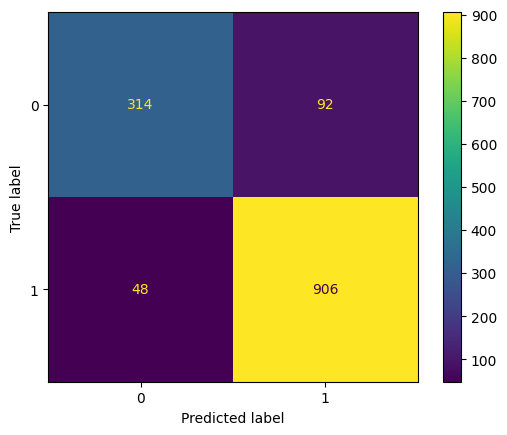

In [687]:
matrix1=confusion_matrix(y_test, y_pred)
ConfusionMatrixDisplay(matrix1).plot()

GBM - S word frequency

In [688]:
gbm_model = GradientBoostingClassifier()
gbm_model.fit(X_train_combined3_gbm, y_train)

GradientBoostingClassifier()

In [689]:
y_pred_train = gbm_model.predict(X_train_combined3_gbm)
print("Presnosť:", accuracy_score(y_train, y_pred_train))
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train))

Presnosť: 0.9612232030264817
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.96      0.91      0.93       935
           1       0.96      0.98      0.97      2237

    accuracy                           0.96      3172
   macro avg       0.96      0.95      0.95      3172
weighted avg       0.96      0.96      0.96      3172



In [690]:
y_pred = gbm_model.predict(X_test_combined3_gbm)
print("Presnosť:", accuracy_score(y_test, y_pred))
print("Klasifikačný report:\n", classification_report(y_test, y_pred))

Presnosť: 0.8977941176470589
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.87      0.77      0.82       406
           1       0.91      0.95      0.93       954

    accuracy                           0.90      1360
   macro avg       0.89      0.86      0.87      1360
weighted avg       0.90      0.90      0.90      1360



In [691]:
results_list2_gbm.append({
        'accuracy_train': accuracy_score(y_train, y_pred_train),
    'accuracy_test': accuracy_score(y_test, y_pred),
    'precision_train': precision_score(y_train, y_pred_train, average='binary'),
    'precision_test': precision_score(y_test, y_pred, average='binary'),
 'recall_train': recall_score(y_train, y_pred_train, average='binary'),
 'recall_test': recall_score(y_test, y_pred, average='binary'),
 'f1_train': f1_score(y_train, y_pred_train, average='binary'),
 'f1_test': f1_score(y_test, y_pred, average='binary')
        
    })

In [692]:
accuracy = accuracy_score(y_test, y_pred)
recall = recall_score(y_test, y_pred, average='binary')  # 'macro' pre nevyvážené triedy, 'binary' pre binárnu klasifikáciu
precision = precision_score(y_test, y_pred, average='binary')
f1 = f1_score(y_test, y_pred, average='binary')

print("Accuracy: {:.2f}".format(accuracy))
print("Recall: {:.2f}".format(recall))
print("Precision: {:.2f}".format(precision))
print("F1 Score: {:.2f}".format(f1))

Accuracy: 0.90
Recall: 0.95
Precision: 0.91
F1 Score: 0.93


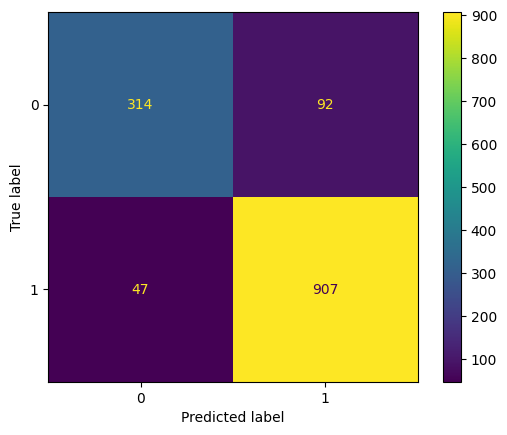

In [693]:
matrix1=confusion_matrix(y_test, y_pred)
ConfusionMatrixDisplay(matrix1).plot()

GBM - S tfidf word frequency

In [694]:
gbm_model = GradientBoostingClassifier()
gbm_model.fit(X_train_combined4_gbm, y_train)

GradientBoostingClassifier()

In [695]:
y_pred_train = gbm_model.predict(X_train_combined4_gbm)
print("Presnosť:", accuracy_score(y_train, y_pred_train))
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train))

Presnosť: 0.9716267339218159
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.97      0.93      0.95       935
           1       0.97      0.99      0.98      2237

    accuracy                           0.97      3172
   macro avg       0.97      0.96      0.97      3172
weighted avg       0.97      0.97      0.97      3172



In [696]:
y_pred = gbm_model.predict(X_test_combined4_gbm)
print("Presnosť:", accuracy_score(y_test, y_pred))
print("Klasifikačný report:\n", classification_report(y_test, y_pred))

Presnosť: 0.9080882352941176
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.88      0.80      0.84       406
           1       0.92      0.95      0.94       954

    accuracy                           0.91      1360
   macro avg       0.90      0.88      0.89      1360
weighted avg       0.91      0.91      0.91      1360



In [697]:
results_list2_gbm.append({
        'accuracy_train': accuracy_score(y_train, y_pred_train),
    'accuracy_test': accuracy_score(y_test, y_pred),
    'precision_train': precision_score(y_train, y_pred_train, average='binary'),
    'precision_test': precision_score(y_test, y_pred, average='binary'),
 'recall_train': recall_score(y_train, y_pred_train, average='binary'),
 'recall_test': recall_score(y_test, y_pred, average='binary'),
 'f1_train': f1_score(y_train, y_pred_train, average='binary'),
 'f1_test': f1_score(y_test, y_pred, average='binary')
        
    })

In [698]:
accuracy = accuracy_score(y_test, y_pred)
recall = recall_score(y_test, y_pred, average='binary')  # 'macro' pre nevyvážené triedy, 'binary' pre binárnu klasifikáciu
precision = precision_score(y_test, y_pred, average='binary')
f1 = f1_score(y_test, y_pred, average='binary')

print("Accuracy: {:.2f}".format(accuracy))
print("Recall: {:.2f}".format(recall))
print("Precision: {:.2f}".format(precision))
print("F1 Score: {:.2f}".format(f1))

Accuracy: 0.91
Recall: 0.95
Precision: 0.92
F1 Score: 0.94


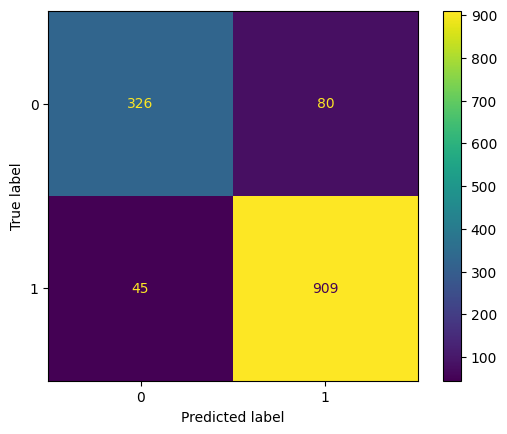

In [699]:
matrix1=confusion_matrix(y_test, y_pred)
ConfusionMatrixDisplay(matrix1).plot()

GBM - S ošetrenim outlierov

In [700]:
gbm_model = GradientBoostingClassifier()
gbm_model.fit(X_train_out_gbm, y_train)

GradientBoostingClassifier()

In [701]:
y_pred_train = gbm_model.predict(X_train_out_gbm)
print("Presnosť:", accuracy_score(y_train, y_pred_train))
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train))

Presnosť: 0.9492433795712484
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.96      0.86      0.91       935
           1       0.94      0.99      0.96      2237

    accuracy                           0.95      3172
   macro avg       0.95      0.92      0.94      3172
weighted avg       0.95      0.95      0.95      3172



In [702]:
y_pred = gbm_model.predict(X_test_out_gbm)
print("Presnosť:", accuracy_score(y_test, y_pred))
print("Klasifikačný report:\n", classification_report(y_test, y_pred))

Presnosť: 0.9367647058823529
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.93      0.85      0.89       406
           1       0.94      0.97      0.96       954

    accuracy                           0.94      1360
   macro avg       0.94      0.91      0.92      1360
weighted avg       0.94      0.94      0.94      1360



In [703]:
results_list2_gbm.append({
        'accuracy_train': accuracy_score(y_train, y_pred_train),
    'accuracy_test': accuracy_score(y_test, y_pred),
    'precision_train': precision_score(y_train, y_pred_train, average='binary'),
    'precision_test': precision_score(y_test, y_pred, average='binary'),
 'recall_train': recall_score(y_train, y_pred_train, average='binary'),
 'recall_test': recall_score(y_test, y_pred, average='binary'),
 'f1_train': f1_score(y_train, y_pred_train, average='binary'),
 'f1_test': f1_score(y_test, y_pred, average='binary')
        
    })

In [704]:
accuracy = accuracy_score(y_test, y_pred)
recall = recall_score(y_test, y_pred, average='binary')  # 'macro' pre nevyvážené triedy, 'binary' pre binárnu klasifikáciu
precision = precision_score(y_test, y_pred, average='binary')
f1 = f1_score(y_test, y_pred, average='binary')

print("Accuracy: {:.2f}".format(accuracy))
print("Recall: {:.2f}".format(recall))
print("Precision: {:.2f}".format(precision))
print("F1 Score: {:.2f}".format(f1))

Accuracy: 0.94
Recall: 0.97
Precision: 0.94
F1 Score: 0.96


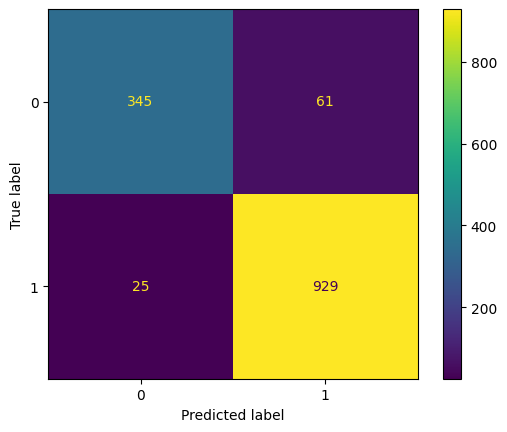

In [705]:
matrix1=confusion_matrix(y_test, y_pred)
ConfusionMatrixDisplay(matrix1).plot()

GBM - S ošetrenim outlierov a n-gram

In [706]:
gbm_model = GradientBoostingClassifier()
gbm_model.fit(X_train_combined_out_gbm, y_train)

GradientBoostingClassifier()

In [707]:
y_pred_train = gbm_model.predict(X_train_combined_out_gbm)
print("Presnosť:", accuracy_score(y_train, y_pred_train))
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train))

Presnosť: 0.9974779319041615
Klasifikačný report:
               precision    recall  f1-score   support

           0       1.00      0.99      1.00       935
           1       1.00      1.00      1.00      2237

    accuracy                           1.00      3172
   macro avg       1.00      1.00      1.00      3172
weighted avg       1.00      1.00      1.00      3172



In [708]:
y_pred = gbm_model.predict(X_test_combined_out_gbm)
print("Presnosť:", accuracy_score(y_test, y_pred))
print("Klasifikačný report:\n", classification_report(y_test, y_pred))

Presnosť: 0.9536764705882353
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.95      0.89      0.92       406
           1       0.95      0.98      0.97       954

    accuracy                           0.95      1360
   macro avg       0.95      0.94      0.94      1360
weighted avg       0.95      0.95      0.95      1360



In [709]:
results_list2_gbm.append({
        'accuracy_train': accuracy_score(y_train, y_pred_train),
    'accuracy_test': accuracy_score(y_test, y_pred),
    'precision_train': precision_score(y_train, y_pred_train, average='binary'),
    'precision_test': precision_score(y_test, y_pred, average='binary'),
 'recall_train': recall_score(y_train, y_pred_train, average='binary'),
 'recall_test': recall_score(y_test, y_pred, average='binary'),
 'f1_train': f1_score(y_train, y_pred_train, average='binary'),
 'f1_test': f1_score(y_test, y_pred, average='binary')
        
    })

In [710]:
accuracy = accuracy_score(y_test, y_pred)
recall = recall_score(y_test, y_pred, average='binary')  # 'macro' pre nevyvážené triedy, 'binary' pre binárnu klasifikáciu
precision = precision_score(y_test, y_pred, average='binary')
f1 = f1_score(y_test, y_pred, average='binary')

print("Accuracy: {:.2f}".format(accuracy))
print("Recall: {:.2f}".format(recall))
print("Precision: {:.2f}".format(precision))
print("F1 Score: {:.2f}".format(f1))

Accuracy: 0.95
Recall: 0.98
Precision: 0.95
F1 Score: 0.97


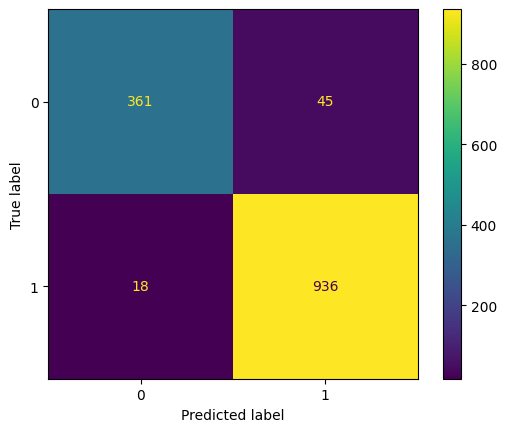

In [711]:
matrix1=confusion_matrix(y_test, y_pred)
ConfusionMatrixDisplay(matrix1).plot()

GBM - S ošetrenim outlierov a tfidf n-gram

In [712]:
gbm_model = GradientBoostingClassifier()
gbm_model.fit(X_train_combined2_out_gbm, y_train)

GradientBoostingClassifier()

In [713]:
y_pred_train = gbm_model.predict(X_train_combined2_out_gbm)
print("Presnosť:", accuracy_score(y_train, y_pred_train))
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train))

Presnosť: 0.9971626733921816
Klasifikačný report:
               precision    recall  f1-score   support

           0       1.00      0.99      1.00       935
           1       1.00      1.00      1.00      2237

    accuracy                           1.00      3172
   macro avg       1.00      1.00      1.00      3172
weighted avg       1.00      1.00      1.00      3172



In [714]:
y_pred = gbm_model.predict(X_test_combined2_out_gbm)
print("Presnosť:", accuracy_score(y_test, y_pred))
print("Klasifikačný report:\n", classification_report(y_test, y_pred))

Presnosť: 0.9477941176470588
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.94      0.88      0.91       406
           1       0.95      0.98      0.96       954

    accuracy                           0.95      1360
   macro avg       0.95      0.93      0.94      1360
weighted avg       0.95      0.95      0.95      1360



In [715]:
results_list2_gbm.append({
        'accuracy_train': accuracy_score(y_train, y_pred_train),
    'accuracy_test': accuracy_score(y_test, y_pred),
    'precision_train': precision_score(y_train, y_pred_train, average='binary'),
    'precision_test': precision_score(y_test, y_pred, average='binary'),
 'recall_train': recall_score(y_train, y_pred_train, average='binary'),
 'recall_test': recall_score(y_test, y_pred, average='binary'),
 'f1_train': f1_score(y_train, y_pred_train, average='binary'),
 'f1_test': f1_score(y_test, y_pred, average='binary')
        
    })

In [716]:
accuracy = accuracy_score(y_test, y_pred)
recall = recall_score(y_test, y_pred, average='binary')  # 'macro' pre nevyvážené triedy, 'binary' pre binárnu klasifikáciu
precision = precision_score(y_test, y_pred, average='binary')
f1 = f1_score(y_test, y_pred, average='binary')

print("Accuracy: {:.2f}".format(accuracy))
print("Recall: {:.2f}".format(recall))
print("Precision: {:.2f}".format(precision))
print("F1 Score: {:.2f}".format(f1))

Accuracy: 0.95
Recall: 0.98
Precision: 0.95
F1 Score: 0.96


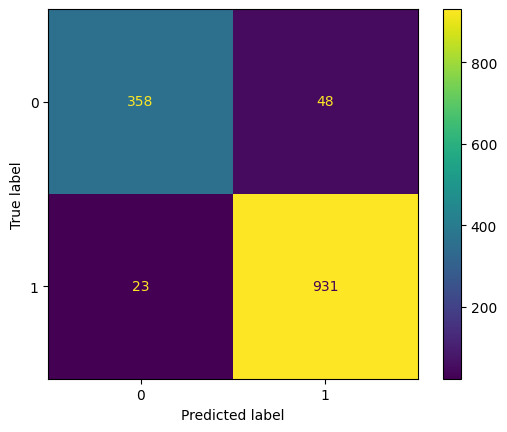

In [717]:
matrix1=confusion_matrix(y_test, y_pred)
ConfusionMatrixDisplay(matrix1).plot()

GBM - S ošetrenim outlierov a word frequency

In [718]:
gbm_model = GradientBoostingClassifier()
gbm_model.fit(X_train_combined3_out_gbm, y_train)

GradientBoostingClassifier()

In [719]:
y_pred_train = gbm_model.predict(X_train_combined3_out_gbm)
print("Presnosť:", accuracy_score(y_train, y_pred_train))
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train))

Presnosť: 0.9924337957124842
Klasifikačný report:
               precision    recall  f1-score   support

           0       1.00      0.98      0.99       935
           1       0.99      1.00      0.99      2237

    accuracy                           0.99      3172
   macro avg       0.99      0.99      0.99      3172
weighted avg       0.99      0.99      0.99      3172



In [720]:
y_pred = gbm_model.predict(X_test_combined3_out_gbm)
print("Presnosť:", accuracy_score(y_test, y_pred))
print("Klasifikačný report:\n", classification_report(y_test, y_pred))

Presnosť: 0.961764705882353
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.96      0.91      0.93       406
           1       0.96      0.98      0.97       954

    accuracy                           0.96      1360
   macro avg       0.96      0.95      0.95      1360
weighted avg       0.96      0.96      0.96      1360



In [721]:
results_list2_gbm.append({
        'accuracy_train': accuracy_score(y_train, y_pred_train),
    'accuracy_test': accuracy_score(y_test, y_pred),
    'precision_train': precision_score(y_train, y_pred_train, average='binary'),
    'precision_test': precision_score(y_test, y_pred, average='binary'),
 'recall_train': recall_score(y_train, y_pred_train, average='binary'),
 'recall_test': recall_score(y_test, y_pred, average='binary'),
 'f1_train': f1_score(y_train, y_pred_train, average='binary'),
 'f1_test': f1_score(y_test, y_pred, average='binary')
        
    })

In [722]:
accuracy = accuracy_score(y_test, y_pred)
recall = recall_score(y_test, y_pred, average='binary')  # 'macro' pre nevyvážené triedy, 'binary' pre binárnu klasifikáciu
precision = precision_score(y_test, y_pred, average='binary')
f1 = f1_score(y_test, y_pred, average='binary')

print("Accuracy: {:.2f}".format(accuracy))
print("Recall: {:.2f}".format(recall))
print("Precision: {:.2f}".format(precision))
print("F1 Score: {:.2f}".format(f1))

Accuracy: 0.96
Recall: 0.98
Precision: 0.96
F1 Score: 0.97


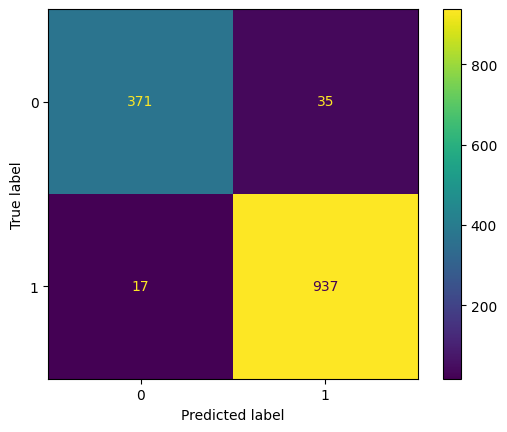

In [723]:
matrix1=confusion_matrix(y_test, y_pred)
ConfusionMatrixDisplay(matrix1).plot()

GBM - S ošetrenim outlierov a tfidf word frequency

In [724]:
gbm_model = GradientBoostingClassifier()
gbm_model.fit(X_train_combined4_out_gbm, y_train)

GradientBoostingClassifier()

In [725]:
y_pred_train = gbm_model.predict(X_train_combined4_out_gbm)
print("Presnosť:", accuracy_score(y_train, y_pred_train))
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train))

Presnosť: 0.9974779319041615
Klasifikačný report:
               precision    recall  f1-score   support

           0       1.00      0.99      1.00       935
           1       1.00      1.00      1.00      2237

    accuracy                           1.00      3172
   macro avg       1.00      1.00      1.00      3172
weighted avg       1.00      1.00      1.00      3172



In [726]:
y_pred = gbm_model.predict(X_test_combined4_out_gbm)
print("Presnosť:", accuracy_score(y_test, y_pred))
print("Klasifikačný report:\n", classification_report(y_test, y_pred))

Presnosť: 0.9573529411764706
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.97      0.89      0.93       406
           1       0.95      0.99      0.97       954

    accuracy                           0.96      1360
   macro avg       0.96      0.94      0.95      1360
weighted avg       0.96      0.96      0.96      1360



In [727]:
results_list2_gbm.append({
        'accuracy_train': accuracy_score(y_train, y_pred_train),
    'accuracy_test': accuracy_score(y_test, y_pred),
    'precision_train': precision_score(y_train, y_pred_train, average='binary'),
    'precision_test': precision_score(y_test, y_pred, average='binary'),
 'recall_train': recall_score(y_train, y_pred_train, average='binary'),
 'recall_test': recall_score(y_test, y_pred, average='binary'),
 'f1_train': f1_score(y_train, y_pred_train, average='binary'),
 'f1_test': f1_score(y_test, y_pred, average='binary')
        
    })

In [728]:
accuracy = accuracy_score(y_test, y_pred)
recall = recall_score(y_test, y_pred, average='binary')  # 'macro' pre nevyvážené triedy, 'binary' pre binárnu klasifikáciu
precision = precision_score(y_test, y_pred, average='binary')
f1 = f1_score(y_test, y_pred, average='binary')

print("Accuracy: {:.2f}".format(accuracy))
print("Recall: {:.2f}".format(recall))
print("Precision: {:.2f}".format(precision))
print("F1 Score: {:.2f}".format(f1))

Accuracy: 0.96
Recall: 0.99
Precision: 0.95
F1 Score: 0.97


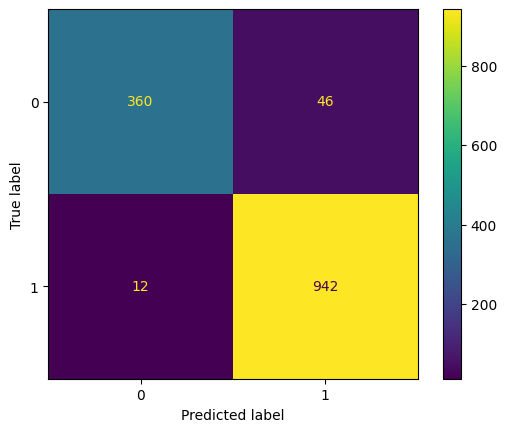

In [729]:
matrix1=confusion_matrix(y_test, y_pred)
ConfusionMatrixDisplay(matrix1).plot()

GBM - So škálovaním

In [730]:
gbm_model = GradientBoostingClassifier()
gbm_model.fit(X_train_scaled_gbm, y_train)

GradientBoostingClassifier()

In [731]:
y_pred_train = gbm_model.predict(X_train_scaled_gbm)
print("Presnosť:", accuracy_score(y_train, y_pred_train))
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train))

Presnosť: 0.7919293820933165
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.79      0.40      0.53       935
           1       0.79      0.96      0.87      2237

    accuracy                           0.79      3172
   macro avg       0.79      0.68      0.70      3172
weighted avg       0.79      0.79      0.77      3172



In [732]:
y_pred = gbm_model.predict(X_test_scaled_gbm)
print("Presnosť:", accuracy_score(y_test, y_pred))
print("Klasifikačný report:\n", classification_report(y_test, y_pred))

Presnosť: 0.7544117647058823
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.68      0.33      0.45       406
           1       0.77      0.94      0.84       954

    accuracy                           0.75      1360
   macro avg       0.72      0.63      0.64      1360
weighted avg       0.74      0.75      0.72      1360



In [733]:
results_list2_gbm.append({
        'accuracy_train': accuracy_score(y_train, y_pred_train),
    'accuracy_test': accuracy_score(y_test, y_pred),
    'precision_train': precision_score(y_train, y_pred_train, average='binary'),
    'precision_test': precision_score(y_test, y_pred, average='binary'),
 'recall_train': recall_score(y_train, y_pred_train, average='binary'),
 'recall_test': recall_score(y_test, y_pred, average='binary'),
 'f1_train': f1_score(y_train, y_pred_train, average='binary'),
 'f1_test': f1_score(y_test, y_pred, average='binary')
        
    })

In [734]:
accuracy = accuracy_score(y_test, y_pred)
recall = recall_score(y_test, y_pred, average='binary')  # 'macro' pre nevyvážené triedy, 'binary' pre binárnu klasifikáciu
precision = precision_score(y_test, y_pred, average='binary')
f1 = f1_score(y_test, y_pred, average='binary')

print("Accuracy: {:.2f}".format(accuracy))
print("Recall: {:.2f}".format(recall))
print("Precision: {:.2f}".format(precision))
print("F1 Score: {:.2f}".format(f1))

Accuracy: 0.75
Recall: 0.94
Precision: 0.77
F1 Score: 0.84


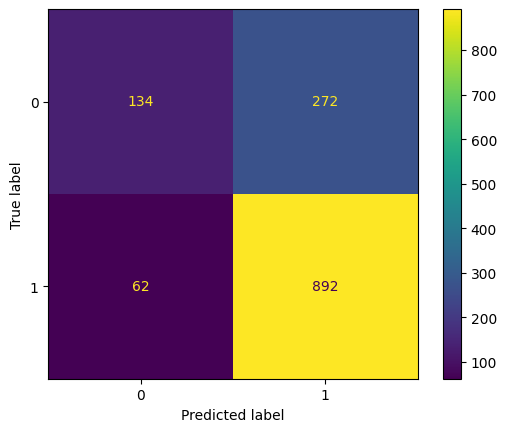

In [735]:
matrix1=confusion_matrix(y_test, y_pred)
ConfusionMatrixDisplay(matrix1).plot()

GBM - So škálovaním a n-gram

In [736]:
gbm_model = GradientBoostingClassifier()
gbm_model.fit(X_train_combined_scaled_gbm, y_train)

GradientBoostingClassifier()

In [737]:
y_pred_train = gbm_model.predict(X_train_combined_scaled_gbm)
print("Presnosť:", accuracy_score(y_train, y_pred_train))
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train))

Presnosť: 0.9691046658259773
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.97      0.93      0.95       935
           1       0.97      0.99      0.98      2237

    accuracy                           0.97      3172
   macro avg       0.97      0.96      0.96      3172
weighted avg       0.97      0.97      0.97      3172



In [738]:
y_pred = gbm_model.predict(X_test_combined_scaled_gbm)
print("Presnosť:", accuracy_score(y_test, y_pred))
print("Klasifikačný report:\n", classification_report(y_test, y_pred))

Presnosť: 0.9022058823529412
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.87      0.79      0.83       406
           1       0.91      0.95      0.93       954

    accuracy                           0.90      1360
   macro avg       0.89      0.87      0.88      1360
weighted avg       0.90      0.90      0.90      1360



In [739]:
results_list2_gbm.append({
        'accuracy_train': accuracy_score(y_train, y_pred_train),
    'accuracy_test': accuracy_score(y_test, y_pred),
    'precision_train': precision_score(y_train, y_pred_train, average='binary'),
    'precision_test': precision_score(y_test, y_pred, average='binary'),
 'recall_train': recall_score(y_train, y_pred_train, average='binary'),
 'recall_test': recall_score(y_test, y_pred, average='binary'),
 'f1_train': f1_score(y_train, y_pred_train, average='binary'),
 'f1_test': f1_score(y_test, y_pred, average='binary')
        
    })

In [740]:
accuracy = accuracy_score(y_test, y_pred)
recall = recall_score(y_test, y_pred, average='binary')  # 'macro' pre nevyvážené triedy, 'binary' pre binárnu klasifikáciu
precision = precision_score(y_test, y_pred, average='binary')
f1 = f1_score(y_test, y_pred, average='binary')

print("Accuracy: {:.2f}".format(accuracy))
print("Recall: {:.2f}".format(recall))
print("Precision: {:.2f}".format(precision))
print("F1 Score: {:.2f}".format(f1))

Accuracy: 0.90
Recall: 0.95
Precision: 0.91
F1 Score: 0.93


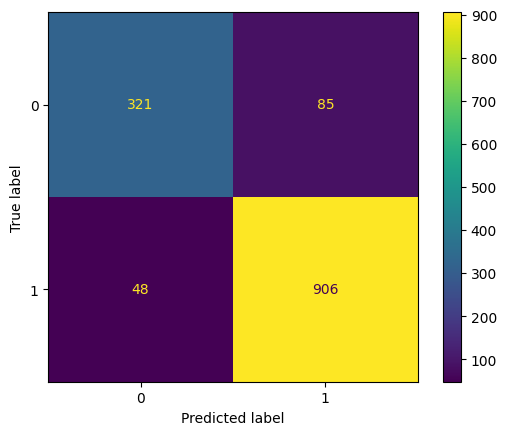

In [741]:
matrix1=confusion_matrix(y_test, y_pred)
ConfusionMatrixDisplay(matrix1).plot()

GBM - So škálovaním a tfidf n-gram

In [742]:
gbm_model = GradientBoostingClassifier()
gbm_model.fit(X_train_combined2_scaled_gbm, y_train)

GradientBoostingClassifier()

In [743]:
y_pred_train = gbm_model.predict(X_train_combined2_scaled_gbm)
print("Presnosť:", accuracy_score(y_train, y_pred_train))
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train))

Presnosť: 0.9722572509457755
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.97      0.93      0.95       935
           1       0.97      0.99      0.98      2237

    accuracy                           0.97      3172
   macro avg       0.97      0.96      0.97      3172
weighted avg       0.97      0.97      0.97      3172



In [744]:
y_pred = gbm_model.predict(X_test_combined2_scaled_gbm)
print("Presnosť:", accuracy_score(y_test, y_pred))
print("Klasifikačný report:\n", classification_report(y_test, y_pred))

Presnosť: 0.8963235294117647
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.87      0.77      0.82       406
           1       0.91      0.95      0.93       954

    accuracy                           0.90      1360
   macro avg       0.89      0.86      0.87      1360
weighted avg       0.90      0.90      0.89      1360



In [745]:
results_list2_gbm.append({
        'accuracy_train': accuracy_score(y_train, y_pred_train),
    'accuracy_test': accuracy_score(y_test, y_pred),
    'precision_train': precision_score(y_train, y_pred_train, average='binary'),
    'precision_test': precision_score(y_test, y_pred, average='binary'),
 'recall_train': recall_score(y_train, y_pred_train, average='binary'),
 'recall_test': recall_score(y_test, y_pred, average='binary'),
 'f1_train': f1_score(y_train, y_pred_train, average='binary'),
 'f1_test': f1_score(y_test, y_pred, average='binary')
        
    })

In [746]:
accuracy = accuracy_score(y_test, y_pred)
recall = recall_score(y_test, y_pred, average='binary')  # 'macro' pre nevyvážené triedy, 'binary' pre binárnu klasifikáciu
precision = precision_score(y_test, y_pred, average='binary')
f1 = f1_score(y_test, y_pred, average='binary')

print("Accuracy: {:.2f}".format(accuracy))
print("Recall: {:.2f}".format(recall))
print("Precision: {:.2f}".format(precision))
print("F1 Score: {:.2f}".format(f1))

Accuracy: 0.90
Recall: 0.95
Precision: 0.91
F1 Score: 0.93


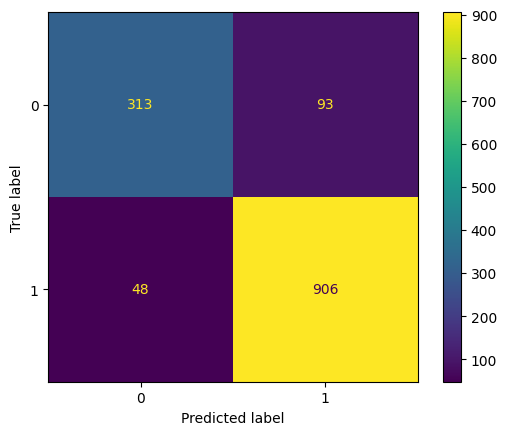

In [747]:
matrix1=confusion_matrix(y_test, y_pred)
ConfusionMatrixDisplay(matrix1).plot()

GBM - So škálovaním a word frequency

In [748]:
gbm_model = GradientBoostingClassifier()
gbm_model.fit(X_train_combined3_scaled_gbm, y_train)

GradientBoostingClassifier()

In [749]:
y_pred_train = gbm_model.predict(X_train_combined3_scaled_gbm)
print("Presnosť:", accuracy_score(y_train, y_pred_train))
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train))

Presnosť: 0.9599621689785625
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.96      0.90      0.93       935
           1       0.96      0.98      0.97      2237

    accuracy                           0.96      3172
   macro avg       0.96      0.94      0.95      3172
weighted avg       0.96      0.96      0.96      3172



In [750]:
y_pred = gbm_model.predict(X_test_combined3_scaled_gbm)
print("Presnosť:", accuracy_score(y_test, y_pred))
print("Klasifikačný report:\n", classification_report(y_test, y_pred))

Presnosť: 0.8955882352941177
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.87      0.77      0.81       406
           1       0.91      0.95      0.93       954

    accuracy                           0.90      1360
   macro avg       0.89      0.86      0.87      1360
weighted avg       0.89      0.90      0.89      1360



In [751]:
results_list2_gbm.append({
        'accuracy_train': accuracy_score(y_train, y_pred_train),
    'accuracy_test': accuracy_score(y_test, y_pred),
    'precision_train': precision_score(y_train, y_pred_train, average='binary'),
    'precision_test': precision_score(y_test, y_pred, average='binary'),
 'recall_train': recall_score(y_train, y_pred_train, average='binary'),
 'recall_test': recall_score(y_test, y_pred, average='binary'),
 'f1_train': f1_score(y_train, y_pred_train, average='binary'),
 'f1_test': f1_score(y_test, y_pred, average='binary')
        
    })

In [752]:
accuracy = accuracy_score(y_test, y_pred)
recall = recall_score(y_test, y_pred, average='binary')  # 'macro' pre nevyvážené triedy, 'binary' pre binárnu klasifikáciu
precision = precision_score(y_test, y_pred, average='binary')
f1 = f1_score(y_test, y_pred, average='binary')

print("Accuracy: {:.2f}".format(accuracy))
print("Recall: {:.2f}".format(recall))
print("Precision: {:.2f}".format(precision))
print("F1 Score: {:.2f}".format(f1))

Accuracy: 0.90
Recall: 0.95
Precision: 0.91
F1 Score: 0.93


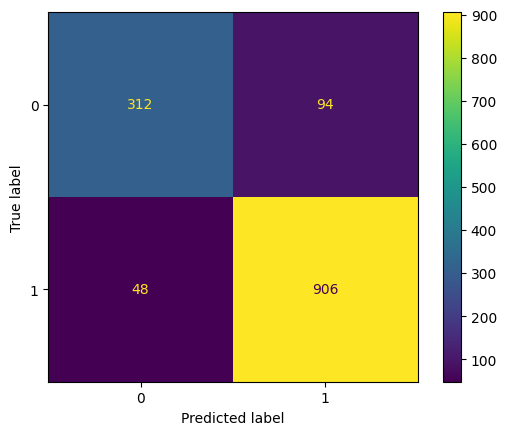

In [753]:
matrix1=confusion_matrix(y_test, y_pred)
ConfusionMatrixDisplay(matrix1).plot()

GBM - So škálovaním a tfidf word frequency

In [754]:
gbm_model = GradientBoostingClassifier()
gbm_model.fit(X_train_combined4_scaled_gbm, y_train)

GradientBoostingClassifier()

In [755]:
y_pred_train = gbm_model.predict(X_train_combined4_scaled_gbm)
print("Presnosť:", accuracy_score(y_train, y_pred_train))
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train))

Presnosť: 0.9709962168978562
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.97      0.93      0.95       935
           1       0.97      0.99      0.98      2237

    accuracy                           0.97      3172
   macro avg       0.97      0.96      0.96      3172
weighted avg       0.97      0.97      0.97      3172



In [756]:
y_pred = gbm_model.predict(X_test_combined4_scaled_gbm)
print("Presnosť:", accuracy_score(y_test, y_pred))
print("Klasifikačný report:\n", classification_report(y_test, y_pred))

Presnosť: 0.9088235294117647
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.88      0.80      0.84       406
           1       0.92      0.95      0.94       954

    accuracy                           0.91      1360
   macro avg       0.90      0.88      0.89      1360
weighted avg       0.91      0.91      0.91      1360



In [757]:
results_list2_gbm.append({
        'accuracy_train': accuracy_score(y_train, y_pred_train),
    'accuracy_test': accuracy_score(y_test, y_pred),
    'precision_train': precision_score(y_train, y_pred_train, average='binary'),
    'precision_test': precision_score(y_test, y_pred, average='binary'),
 'recall_train': recall_score(y_train, y_pred_train, average='binary'),
 'recall_test': recall_score(y_test, y_pred, average='binary'),
 'f1_train': f1_score(y_train, y_pred_train, average='binary'),
 'f1_test': f1_score(y_test, y_pred, average='binary')
        
    })

In [758]:
accuracy = accuracy_score(y_test, y_pred)
recall = recall_score(y_test, y_pred, average='binary')  # 'macro' pre nevyvážené triedy, 'binary' pre binárnu klasifikáciu
precision = precision_score(y_test, y_pred, average='binary')
f1 = f1_score(y_test, y_pred, average='binary')

print("Accuracy: {:.2f}".format(accuracy))
print("Recall: {:.2f}".format(recall))
print("Precision: {:.2f}".format(precision))
print("F1 Score: {:.2f}".format(f1))

Accuracy: 0.91
Recall: 0.95
Precision: 0.92
F1 Score: 0.94


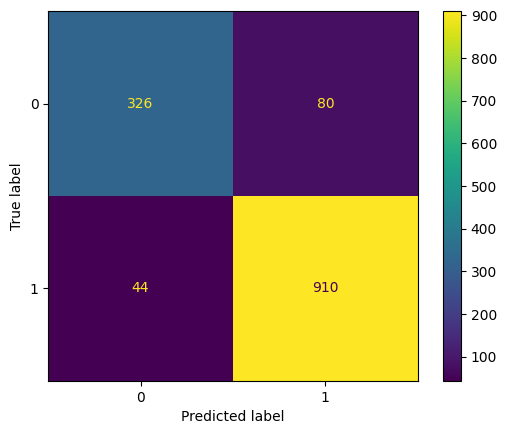

In [759]:
matrix1=confusion_matrix(y_test, y_pred)
ConfusionMatrixDisplay(matrix1).plot()

GBM - S ošetrením outlierov a so škálovaním

In [760]:
gbm_model = GradientBoostingClassifier()
gbm_model.fit(X_train_scal_out_gbm, y_train)

GradientBoostingClassifier()

In [761]:
y_pred_train = gbm_model.predict(X_train_scal_out_gbm)
print("Presnosť:", accuracy_score(y_train, y_pred_train))
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train))

Presnosť: 0.9492433795712484
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.96      0.86      0.91       935
           1       0.94      0.99      0.96      2237

    accuracy                           0.95      3172
   macro avg       0.95      0.92      0.94      3172
weighted avg       0.95      0.95      0.95      3172



In [762]:
y_pred = gbm_model.predict(X_test_scal_out_gbm)
print("Presnosť:", accuracy_score(y_test, y_pred))
print("Klasifikačný report:\n", classification_report(y_test, y_pred))

Presnosť: 0.9367647058823529
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.93      0.85      0.89       406
           1       0.94      0.97      0.96       954

    accuracy                           0.94      1360
   macro avg       0.94      0.91      0.92      1360
weighted avg       0.94      0.94      0.94      1360



In [763]:
results_list2_gbm.append({
        'accuracy_train': accuracy_score(y_train, y_pred_train),
    'accuracy_test': accuracy_score(y_test, y_pred),
    'precision_train': precision_score(y_train, y_pred_train, average='binary'),
    'precision_test': precision_score(y_test, y_pred, average='binary'),
 'recall_train': recall_score(y_train, y_pred_train, average='binary'),
 'recall_test': recall_score(y_test, y_pred, average='binary'),
 'f1_train': f1_score(y_train, y_pred_train, average='binary'),
 'f1_test': f1_score(y_test, y_pred, average='binary')
        
    })

In [764]:
accuracy = accuracy_score(y_test, y_pred)
recall = recall_score(y_test, y_pred, average='binary')  # 'macro' pre nevyvážené triedy, 'binary' pre binárnu klasifikáciu
precision = precision_score(y_test, y_pred, average='binary')
f1 = f1_score(y_test, y_pred, average='binary')

print("Accuracy: {:.2f}".format(accuracy))
print("Recall: {:.2f}".format(recall))
print("Precision: {:.2f}".format(precision))
print("F1 Score: {:.2f}".format(f1))

Accuracy: 0.94
Recall: 0.97
Precision: 0.94
F1 Score: 0.96


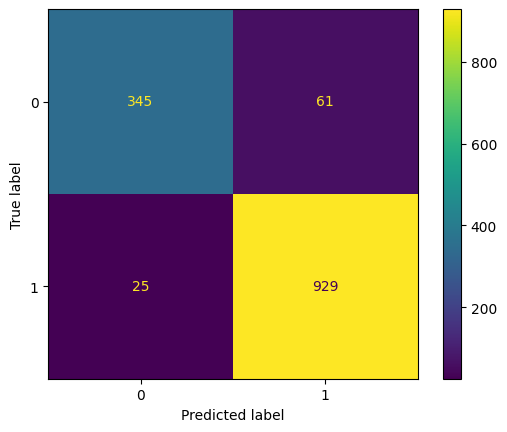

In [765]:
matrix1=confusion_matrix(y_test, y_pred)
ConfusionMatrixDisplay(matrix1).plot()

GBM - S ošetrením outlierov a so škálovaním a n-gram

In [766]:
gbm_model = GradientBoostingClassifier()
gbm_model.fit(X_train_combined_scal_out_gbm, y_train)

GradientBoostingClassifier()

In [767]:
y_pred_train = gbm_model.predict(X_train_combined_scal_out_gbm)
print("Presnosť:", accuracy_score(y_train, y_pred_train))
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train))

Presnosť: 0.9974779319041615
Klasifikačný report:
               precision    recall  f1-score   support

           0       1.00      0.99      1.00       935
           1       1.00      1.00      1.00      2237

    accuracy                           1.00      3172
   macro avg       1.00      1.00      1.00      3172
weighted avg       1.00      1.00      1.00      3172



In [768]:
y_pred = gbm_model.predict(X_test_combined_scal_out_gbm)
print("Presnosť:", accuracy_score(y_test, y_pred))
print("Klasifikačný report:\n", classification_report(y_test, y_pred))

Presnosť: 0.9544117647058824
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.95      0.89      0.92       406
           1       0.96      0.98      0.97       954

    accuracy                           0.95      1360
   macro avg       0.95      0.94      0.94      1360
weighted avg       0.95      0.95      0.95      1360



In [769]:
results_list2_gbm.append({
        'accuracy_train': accuracy_score(y_train, y_pred_train),
    'accuracy_test': accuracy_score(y_test, y_pred),
    'precision_train': precision_score(y_train, y_pred_train, average='binary'),
    'precision_test': precision_score(y_test, y_pred, average='binary'),
 'recall_train': recall_score(y_train, y_pred_train, average='binary'),
 'recall_test': recall_score(y_test, y_pred, average='binary'),
 'f1_train': f1_score(y_train, y_pred_train, average='binary'),
 'f1_test': f1_score(y_test, y_pred, average='binary')
        
    })

In [770]:
accuracy = accuracy_score(y_test, y_pred)
recall = recall_score(y_test, y_pred, average='binary')  # 'macro' pre nevyvážené triedy, 'binary' pre binárnu klasifikáciu
precision = precision_score(y_test, y_pred, average='binary')
f1 = f1_score(y_test, y_pred, average='binary')

print("Accuracy: {:.2f}".format(accuracy))
print("Recall: {:.2f}".format(recall))
print("Precision: {:.2f}".format(precision))
print("F1 Score: {:.2f}".format(f1))

Accuracy: 0.95
Recall: 0.98
Precision: 0.96
F1 Score: 0.97


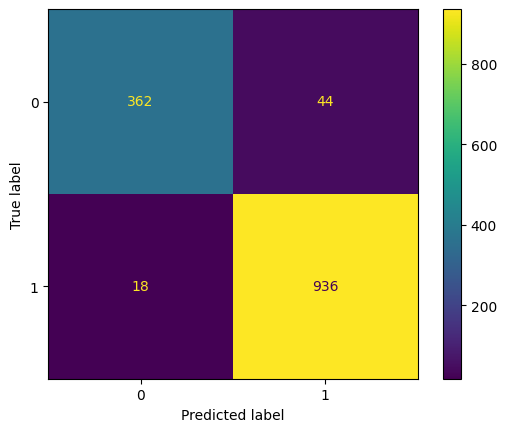

In [771]:
matrix1=confusion_matrix(y_test, y_pred)
ConfusionMatrixDisplay(matrix1).plot()

GBM - S ošetrením outlierov a so škálovaním a tfidf n-gram

In [772]:
gbm_model = GradientBoostingClassifier()
gbm_model.fit(X_train_combined2_scal_out_gbm, y_train)

GradientBoostingClassifier()

In [773]:
y_pred_train = gbm_model.predict(X_train_combined2_scal_out_gbm)
print("Presnosť:", accuracy_score(y_train, y_pred_train))
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train))

Presnosť: 0.9971626733921816
Klasifikačný report:
               precision    recall  f1-score   support

           0       1.00      0.99      1.00       935
           1       1.00      1.00      1.00      2237

    accuracy                           1.00      3172
   macro avg       1.00      1.00      1.00      3172
weighted avg       1.00      1.00      1.00      3172



In [774]:
y_pred = gbm_model.predict(X_test_combined2_scal_out_gbm)
print("Presnosť:", accuracy_score(y_test, y_pred))
print("Klasifikačný report:\n", classification_report(y_test, y_pred))

Presnosť: 0.9477941176470588
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.94      0.88      0.91       406
           1       0.95      0.98      0.96       954

    accuracy                           0.95      1360
   macro avg       0.95      0.93      0.94      1360
weighted avg       0.95      0.95      0.95      1360



In [775]:
results_list2_gbm.append({
        'accuracy_train': accuracy_score(y_train, y_pred_train),
    'accuracy_test': accuracy_score(y_test, y_pred),
    'precision_train': precision_score(y_train, y_pred_train, average='binary'),
    'precision_test': precision_score(y_test, y_pred, average='binary'),
 'recall_train': recall_score(y_train, y_pred_train, average='binary'),
 'recall_test': recall_score(y_test, y_pred, average='binary'),
 'f1_train': f1_score(y_train, y_pred_train, average='binary'),
 'f1_test': f1_score(y_test, y_pred, average='binary')
        
    })

In [776]:
accuracy = accuracy_score(y_test, y_pred)
recall = recall_score(y_test, y_pred, average='binary')  # 'macro' pre nevyvážené triedy, 'binary' pre binárnu klasifikáciu
precision = precision_score(y_test, y_pred, average='binary')
f1 = f1_score(y_test, y_pred, average='binary')

print("Accuracy: {:.2f}".format(accuracy))
print("Recall: {:.2f}".format(recall))
print("Precision: {:.2f}".format(precision))
print("F1 Score: {:.2f}".format(f1))

Accuracy: 0.95
Recall: 0.98
Precision: 0.95
F1 Score: 0.96


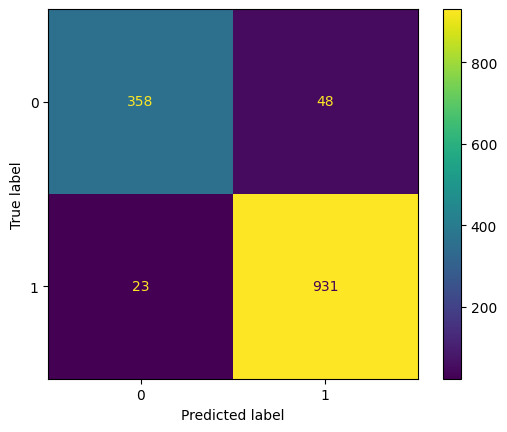

In [777]:
matrix1=confusion_matrix(y_test, y_pred)
ConfusionMatrixDisplay(matrix1).plot()

GBM - S ošetrením outlierov a so škálovaním a word frequency

In [778]:
gbm_model = GradientBoostingClassifier()
gbm_model.fit(X_train_combined3_scal_out_gbm, y_train)

GradientBoostingClassifier()

In [779]:
y_pred_train = gbm_model.predict(X_train_combined3_scal_out_gbm)
print("Presnosť:", accuracy_score(y_train, y_pred_train))
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train))

Presnosť: 0.9924337957124842
Klasifikačný report:
               precision    recall  f1-score   support

           0       1.00      0.98      0.99       935
           1       0.99      1.00      0.99      2237

    accuracy                           0.99      3172
   macro avg       0.99      0.99      0.99      3172
weighted avg       0.99      0.99      0.99      3172



In [780]:
y_pred = gbm_model.predict(X_test_combined3_scal_out_gbm)
print("Presnosť:", accuracy_score(y_test, y_pred))
print("Klasifikačný report:\n", classification_report(y_test, y_pred))

Presnosť: 0.9625
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.96      0.92      0.94       406
           1       0.96      0.98      0.97       954

    accuracy                           0.96      1360
   macro avg       0.96      0.95      0.95      1360
weighted avg       0.96      0.96      0.96      1360



In [781]:
results_list2_gbm.append({
        'accuracy_train': accuracy_score(y_train, y_pred_train),
    'accuracy_test': accuracy_score(y_test, y_pred),
    'precision_train': precision_score(y_train, y_pred_train, average='binary'),
    'precision_test': precision_score(y_test, y_pred, average='binary'),
 'recall_train': recall_score(y_train, y_pred_train, average='binary'),
 'recall_test': recall_score(y_test, y_pred, average='binary'),
 'f1_train': f1_score(y_train, y_pred_train, average='binary'),
 'f1_test': f1_score(y_test, y_pred, average='binary')
        
    })

In [782]:
accuracy = accuracy_score(y_test, y_pred)
recall = recall_score(y_test, y_pred, average='binary')  # 'macro' pre nevyvážené triedy, 'binary' pre binárnu klasifikáciu
precision = precision_score(y_test, y_pred, average='binary')
f1 = f1_score(y_test, y_pred, average='binary')

print("Accuracy: {:.2f}".format(accuracy))
print("Recall: {:.2f}".format(recall))
print("Precision: {:.2f}".format(precision))
print("F1 Score: {:.2f}".format(f1))

Accuracy: 0.96
Recall: 0.98
Precision: 0.96
F1 Score: 0.97


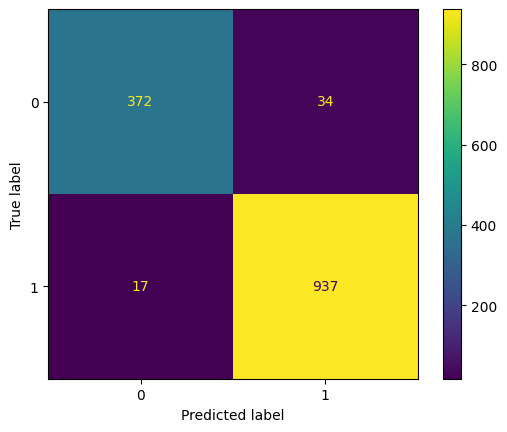

In [783]:
matrix1=confusion_matrix(y_test, y_pred)
ConfusionMatrixDisplay(matrix1).plot()

GBM - S ošetrením outlierov a so škálovaním a tfidf word frequency

In [784]:
gbm_model = GradientBoostingClassifier()
gbm_model.fit(X_train_combined4_scal_out_gbm, y_train)

GradientBoostingClassifier()

In [785]:
y_pred_train = gbm_model.predict(X_train_combined4_scal_out_gbm)
print("Presnosť:", accuracy_score(y_train, y_pred_train))
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train))

Presnosť: 0.9974779319041615
Klasifikačný report:
               precision    recall  f1-score   support

           0       1.00      0.99      1.00       935
           1       1.00      1.00      1.00      2237

    accuracy                           1.00      3172
   macro avg       1.00      1.00      1.00      3172
weighted avg       1.00      1.00      1.00      3172



In [786]:
y_pred = gbm_model.predict(X_test_combined4_scal_out_gbm)
print("Presnosť:", accuracy_score(y_test, y_pred))
print("Klasifikačný report:\n", classification_report(y_test, y_pred))

Presnosť: 0.9573529411764706
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.97      0.89      0.93       406
           1       0.95      0.99      0.97       954

    accuracy                           0.96      1360
   macro avg       0.96      0.94      0.95      1360
weighted avg       0.96      0.96      0.96      1360



In [787]:
results_list2_gbm.append({
        'accuracy_train': accuracy_score(y_train, y_pred_train),
    'accuracy_test': accuracy_score(y_test, y_pred),
    'precision_train': precision_score(y_train, y_pred_train, average='binary'),
    'precision_test': precision_score(y_test, y_pred, average='binary'),
 'recall_train': recall_score(y_train, y_pred_train, average='binary'),
 'recall_test': recall_score(y_test, y_pred, average='binary'),
 'f1_train': f1_score(y_train, y_pred_train, average='binary'),
 'f1_test': f1_score(y_test, y_pred, average='binary')
        
    })

In [788]:
accuracy = accuracy_score(y_test, y_pred)
recall = recall_score(y_test, y_pred, average='binary')  # 'macro' pre nevyvážené triedy, 'binary' pre binárnu klasifikáciu
precision = precision_score(y_test, y_pred, average='binary')
f1 = f1_score(y_test, y_pred, average='binary')

print("Accuracy: {:.2f}".format(accuracy))
print("Recall: {:.2f}".format(recall))
print("Precision: {:.2f}".format(precision))
print("F1 Score: {:.2f}".format(f1))

Accuracy: 0.96
Recall: 0.99
Precision: 0.95
F1 Score: 0.97


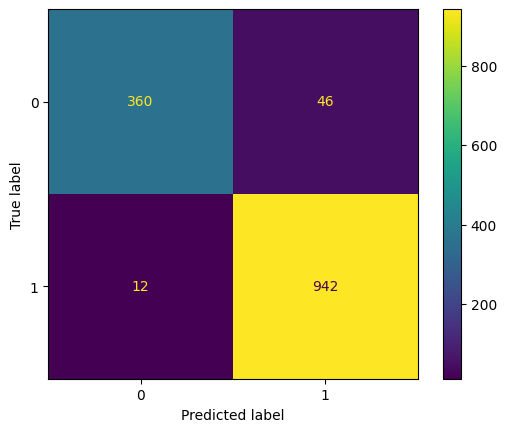

In [789]:
matrix1=confusion_matrix(y_test, y_pred)
ConfusionMatrixDisplay(matrix1).plot()

In [790]:
results_gbm2 = pd.DataFrame(results_list2_gbm)
print(results_gbm2)

    accuracy_train  accuracy_test  precision_train  precision_test  \
0         0.825347       0.774265         0.820327        0.784521   
1         0.969735       0.908088         0.969724        0.915747   
2         0.972257       0.897059         0.972308        0.907816   
3         0.961223       0.897794         0.962380        0.907908   
4         0.971627       0.908088         0.971040        0.919110   
5         0.949243       0.936765         0.944730        0.938384   
6         0.997478       0.953676         0.996437        0.954128   
7         0.997163       0.947794         0.997321        0.950970   
8         0.992434       0.961765         0.990253        0.963992   
9         0.997478       0.957353         0.997323        0.953441   
10        0.791929       0.754412         0.791497        0.766323   
11        0.969105       0.902206         0.969697        0.914228   
12        0.972257       0.896324         0.971893        0.906907   
13        0.959962  

Podľa výsledkov po druhom testovani random forest môžeme vidieť, že najlepší výsledok mal dataset s ošetrenými outliermi a skalovaním a frekvenciou slov. Takže je zrejme, že najväčší vplyv na úspešnosť malo ošetrenie outlierov a pridávanie textovej reprezentácie. V porovnaní s prvým testom sa accuracy mierne zvýšilo.

HYPERPARAMETRE

Teraz vykonáme testovanie 3, pričom použijeme datasety s výberom črt. Preddefinujeme si hyperparametre, ktoré bude gridsearch skúšať a bude hľadať tú najlepšiu kombináciu aby dosiahol čím najvýšie accuracy. Potom s týmito parametrami si spustíme predikciu na trenovacej aj testovacej sade.

SVC - bez osetrenia outlierov a skalovania

In [791]:
results_list3_svc=[]

Určenie hyperparametrov, ktore budeme v grid search skúšať

In [792]:
param_grid = {
    'C': [0.1, 1, 10, 100],
    'kernel': ['linear', 'poly', 'rbf', 'sigmoid'],
    'gamma': ['scale', 'auto'],
    'coef0': [0.0, 0.5, 1.0, 1.5],
}

Grid search - vyskúša každú kombináciu hyperparametrov a vypíše tu najlepšiu pre accuracy

In [793]:
model = SVC()
grid_search = GridSearchCV(estimator=model, param_grid=param_grid, cv=5, scoring='accuracy', n_jobs=8)
grid_search.fit(X_train_svc, y_train)
print("Najlepšie parametre:", grid_search.best_params_)
print("Najlepšie skóre:", grid_search.best_score_)

Najlepšie parametre: {'C': 100, 'coef0': 0.0, 'gamma': 'scale', 'kernel': 'rbf'}
Najlepšie skóre: 0.7197362080528577


Predikovanie na trenovacich datach

In [794]:
best_model = grid_search.best_estimator_
y_pred_train = best_model.predict(X_train_svc)

In [795]:
print("Presnosť:", accuracy_score(y_train, y_pred_train))
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train))

Presnosť: 0.7345523329129886
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.71      0.17      0.27       935
           1       0.74      0.97      0.84      2237

    accuracy                           0.73      3172
   macro avg       0.72      0.57      0.55      3172
weighted avg       0.73      0.73      0.67      3172



Predikovanie na testovacich datach

In [796]:
y_pred = best_model.predict(X_test_svc)

In [797]:
results_list3_svc.append({
        'best_score': grid_search.best_score_,
        'accuracy_train': accuracy_score(y_train, y_pred_train),
    'accuracy_test': accuracy_score(y_test, y_pred),
    'precision_train': precision_score(y_train, y_pred_train, average='binary'),
    'precision_test': precision_score(y_test, y_pred, average='binary'),
 'recall_train': recall_score(y_train, y_pred_train, average='binary'),
 'recall_test': recall_score(y_test, y_pred, average='binary'),
 'f1_train': f1_score(y_train, y_pred_train, average='binary'),
 'f1_test': f1_score(y_test, y_pred, average='binary')
        
    })

In [798]:
print("Presnosť:", accuracy_score(y_test, y_pred))
print("Klasifikačný report:\n", classification_report(y_test, y_pred))

Presnosť: 0.7198529411764706
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.63      0.15      0.24       406
           1       0.73      0.96      0.83       954

    accuracy                           0.72      1360
   macro avg       0.68      0.56      0.53      1360
weighted avg       0.70      0.72      0.65      1360



Vizualizácia výkonnosti modelu

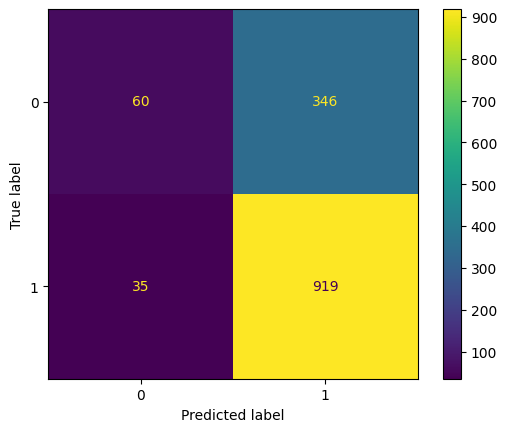

In [799]:
matrix = confusion_matrix(y_test, y_pred)
ConfusionMatrixDisplay(matrix).plot()

SVC - bez osetrenia outlierov a skalovania a ngram

In [800]:
model = SVC(**grid_search.best_params_)
print(grid_search.best_params_)
# grid_search = GridSearchCV(estimator=model, param_grid=param_grid, cv=5, scoring='accuracy', n_jobs=8)
model.fit(X_train_combined_svc, y_train)
# print("Najlepšie parametre:", grid_search.best_params_)
# print("Najlepšie skóre:", grid_search.best_score_)

{'C': 100, 'coef0': 0.0, 'gamma': 'scale', 'kernel': 'rbf'}


SVC(C=100)

In [801]:
#best_model = grid_search.best_estimator_
y_pred_train = model.predict(X_train_combined_svc)

In [802]:
print("Presnosť:", accuracy_score(y_train, y_pred_train))
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train))

Presnosť: 0.9996847414880202
Klasifikačný report:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00       935
           1       1.00      1.00      1.00      2237

    accuracy                           1.00      3172
   macro avg       1.00      1.00      1.00      3172
weighted avg       1.00      1.00      1.00      3172



In [803]:
y_pred = model.predict(X_test_combined_svc)

In [804]:
results_list3_svc.append({
        'accuracy_train': accuracy_score(y_train, y_pred_train),
    'accuracy_test': accuracy_score(y_test, y_pred),
    'precision_train': precision_score(y_train, y_pred_train, average='binary'),
    'precision_test': precision_score(y_test, y_pred, average='binary'),
 'recall_train': recall_score(y_train, y_pred_train, average='binary'),
 'recall_test': recall_score(y_test, y_pred, average='binary'),
 'f1_train': f1_score(y_train, y_pred_train, average='binary'),
 'f1_test': f1_score(y_test, y_pred, average='binary')
        
    })

In [805]:
print("Presnosť:", accuracy_score(y_test, y_pred))
print("Klasifikačný report:\n", classification_report(y_test, y_pred))

Presnosť: 0.8948529411764706
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.84      0.80      0.82       406
           1       0.92      0.93      0.93       954

    accuracy                           0.89      1360
   macro avg       0.88      0.87      0.87      1360
weighted avg       0.89      0.89      0.89      1360



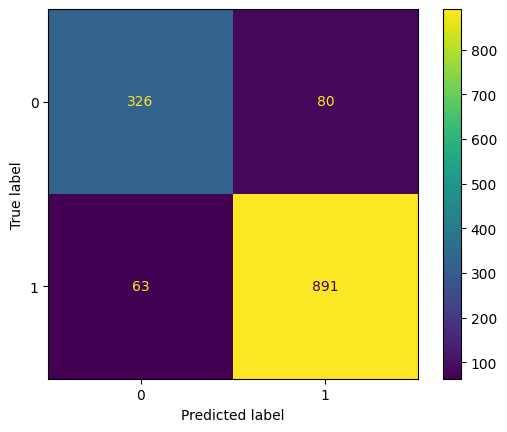

In [806]:
matrix = confusion_matrix(y_test, y_pred)
ConfusionMatrixDisplay(matrix).plot()

SVC - bez osetrenia outlierov a skalovania a tfidf ngram

In [807]:
model = SVC(**grid_search.best_params_)
# grid_search = GridSearchCV(estimator=model, param_grid=param_grid, cv=5, scoring='accuracy', n_jobs=8)
model.fit(X_train_combined2_svc, y_train)
# print("Najlepšie parametre:", grid_search.best_params_)
# print("Najlepšie skóre:", grid_search.best_score_)

SVC(C=100)

In [808]:
y_pred_train = model.predict(X_train_combined2_svc)

In [809]:
print("Presnosť:", accuracy_score(y_train, y_pred_train))
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train))

Presnosť: 1.0
Klasifikačný report:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00       935
           1       1.00      1.00      1.00      2237

    accuracy                           1.00      3172
   macro avg       1.00      1.00      1.00      3172
weighted avg       1.00      1.00      1.00      3172



In [810]:
y_pred = model.predict(X_test_combined2_svc)

In [811]:
results_list3_svc.append({
        'accuracy_train': accuracy_score(y_train, y_pred_train),
    'accuracy_test': accuracy_score(y_test, y_pred),
    'precision_train': precision_score(y_train, y_pred_train, average='binary'),
    'precision_test': precision_score(y_test, y_pred, average='binary'),
 'recall_train': recall_score(y_train, y_pred_train, average='binary'),
 'recall_test': recall_score(y_test, y_pred, average='binary'),
 'f1_train': f1_score(y_train, y_pred_train, average='binary'),
 'f1_test': f1_score(y_test, y_pred, average='binary')
        
    })

In [812]:
print("Presnosť:", accuracy_score(y_test, y_pred))
print("Klasifikačný report:\n", classification_report(y_test, y_pred))

Presnosť: 0.9022058823529412
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.85      0.82      0.83       406
           1       0.92      0.94      0.93       954

    accuracy                           0.90      1360
   macro avg       0.89      0.88      0.88      1360
weighted avg       0.90      0.90      0.90      1360



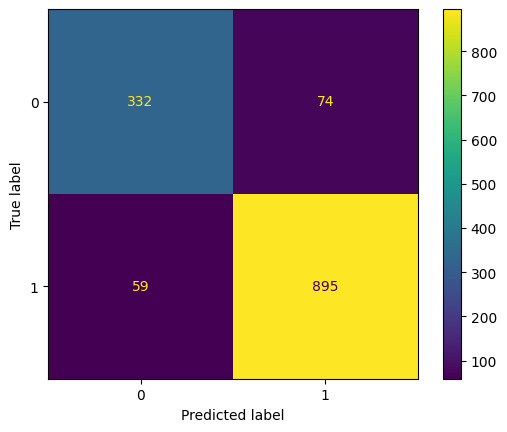

In [813]:
matrix = confusion_matrix(y_test, y_pred)
ConfusionMatrixDisplay(matrix).plot()

SVC - bez osetrenia outlierov a skalovania a word frequency

In [814]:
model = SVC(**grid_search.best_params_)
# grid_search = GridSearchCV(estimator=model, param_grid=param_grid, cv=5, scoring='accuracy', n_jobs=8)
model.fit(X_train_combined3_svc, y_train)
# print("Najlepšie parametre:", grid_search.best_params_)
# print("Najlepšie skóre:", grid_search.best_score_)

SVC(C=100)

In [815]:

y_pred_train = model.predict(X_train_combined3_svc)

In [816]:
print("Presnosť:", accuracy_score(y_train, y_pred_train))
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train))

Presnosť: 0.9974779319041615
Klasifikačný report:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00       935
           1       1.00      1.00      1.00      2237

    accuracy                           1.00      3172
   macro avg       1.00      1.00      1.00      3172
weighted avg       1.00      1.00      1.00      3172



In [817]:
y_pred = model.predict(X_test_combined3_svc)

In [818]:
results_list3_svc.append({
        'accuracy_train': accuracy_score(y_train, y_pred_train),
    'accuracy_test': accuracy_score(y_test, y_pred),
    'precision_train': precision_score(y_train, y_pred_train, average='binary'),
    'precision_test': precision_score(y_test, y_pred, average='binary'),
 'recall_train': recall_score(y_train, y_pred_train, average='binary'),
 'recall_test': recall_score(y_test, y_pred, average='binary'),
 'f1_train': f1_score(y_train, y_pred_train, average='binary'),
 'f1_test': f1_score(y_test, y_pred, average='binary')
        
    })


In [819]:
print("Presnosť:", accuracy_score(y_test, y_pred))
print("Klasifikačný report:\n", classification_report(y_test, y_pred))

Presnosť: 0.8757352941176471
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.80      0.79      0.79       406
           1       0.91      0.91      0.91       954

    accuracy                           0.88      1360
   macro avg       0.85      0.85      0.85      1360
weighted avg       0.88      0.88      0.88      1360



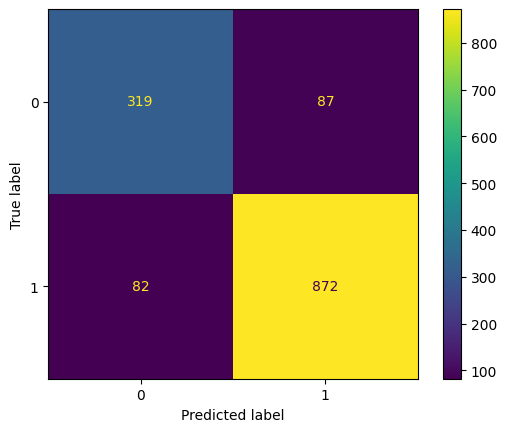

In [820]:
matrix = confusion_matrix(y_test, y_pred)
ConfusionMatrixDisplay(matrix).plot()

SVC - bez osetrenia outlierov a skalovania a tfidf word frequency

In [821]:
model = SVC(**grid_search.best_params_)
# grid_search = GridSearchCV(estimator=model, param_grid=param_grid, cv=5, scoring='accuracy', n_jobs=8)
model.fit(X_train_combined4_svc, y_train)
# print("Najlepšie parametre:", grid_search.best_params_)
# print("Najlepšie skóre:", grid_search.best_score_)

SVC(C=100)

In [822]:
y_pred_train = model.predict(X_train_combined4_svc)

In [823]:
print("Presnosť:", accuracy_score(y_train, y_pred_train))
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train))

Presnosť: 1.0
Klasifikačný report:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00       935
           1       1.00      1.00      1.00      2237

    accuracy                           1.00      3172
   macro avg       1.00      1.00      1.00      3172
weighted avg       1.00      1.00      1.00      3172



In [824]:
y_pred = model.predict(X_test_combined4_svc)

In [825]:
results_list3_svc.append({
        'accuracy_train': accuracy_score(y_train, y_pred_train),
    'accuracy_test': accuracy_score(y_test, y_pred),
    'precision_train': precision_score(y_train, y_pred_train, average='binary'),
    'precision_test': precision_score(y_test, y_pred, average='binary'),
 'recall_train': recall_score(y_train, y_pred_train, average='binary'),
 'recall_test': recall_score(y_test, y_pred, average='binary'),
 'f1_train': f1_score(y_train, y_pred_train, average='binary'),
 'f1_test': f1_score(y_test, y_pred, average='binary')
        
    })

In [826]:
print("Presnosť:", accuracy_score(y_test, y_pred))
print("Klasifikačný report:\n", classification_report(y_test, y_pred))

Presnosť: 0.9
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.87      0.78      0.82       406
           1       0.91      0.95      0.93       954

    accuracy                           0.90      1360
   macro avg       0.89      0.87      0.88      1360
weighted avg       0.90      0.90      0.90      1360



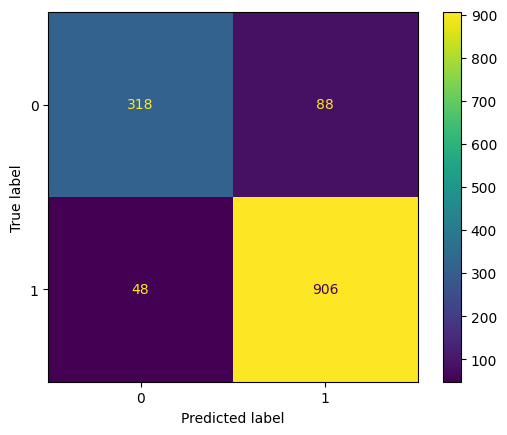

In [827]:
matrix = confusion_matrix(y_test, y_pred)
ConfusionMatrixDisplay(matrix).plot()

SVC - s osetrenim outlierov

In [828]:
model = SVC()
grid_search = GridSearchCV(estimator=model, param_grid=param_grid, cv=5, scoring='accuracy', n_jobs=-1)
grid_search.fit(X_train_out_svc, y_train)
parameters=grid_search.best_params_
print("Najlepšie parametre:", grid_search.best_params_)
print("Najlepšie skóre:", grid_search.best_score_)

Najlepšie parametre: {'C': 100, 'coef0': 0.0, 'gamma': 'scale', 'kernel': 'rbf'}
Najlepšie skóre: 0.75094214958146


In [829]:
best_model = grid_search.best_estimator_
y_pred_train = best_model.predict(X_train_out_svc)

In [830]:
print("Presnosť:", accuracy_score(y_train, y_pred_train))
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train))

Presnosť: 0.7534678436317781
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.67      0.32      0.43       935
           1       0.77      0.93      0.84      2237

    accuracy                           0.75      3172
   macro avg       0.72      0.63      0.64      3172
weighted avg       0.74      0.75      0.72      3172



In [831]:
y_pred = best_model.predict(X_test_out_svc)

In [832]:
results_list3_svc.append({
        'best_score': grid_search.best_score_,
        'accuracy_train': accuracy_score(y_train, y_pred_train),
    'accuracy_test': accuracy_score(y_test, y_pred),
    'precision_train': precision_score(y_train, y_pred_train, average='binary'),
    'precision_test': precision_score(y_test, y_pred, average='binary'),
 'recall_train': recall_score(y_train, y_pred_train, average='binary'),
 'recall_test': recall_score(y_test, y_pred, average='binary'),
 'f1_train': f1_score(y_train, y_pred_train, average='binary'),
 'f1_test': f1_score(y_test, y_pred, average='binary')
        
    })

In [833]:
print("Presnosť:", accuracy_score(y_test, y_pred))
print("Klasifikačný report:\n", classification_report(y_test, y_pred))

Presnosť: 0.7558823529411764
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.69      0.34      0.45       406
           1       0.77      0.93      0.84       954

    accuracy                           0.76      1360
   macro avg       0.73      0.64      0.65      1360
weighted avg       0.74      0.76      0.73      1360



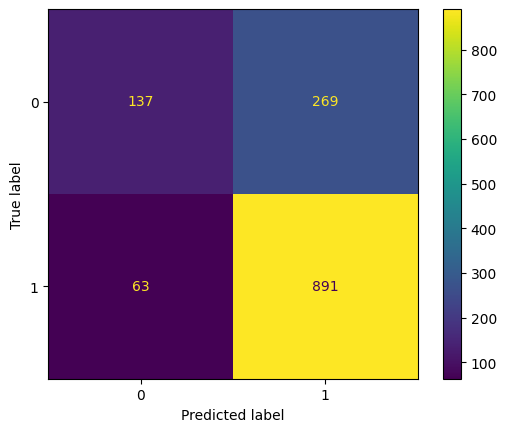

In [834]:
matrix = confusion_matrix(y_test, y_pred)
ConfusionMatrixDisplay(matrix).plot()

SVC -  s osetrenim outlierov a ngram

In [835]:
model = SVC(C=0.1, kernel='linear')
# grid_search = GridSearchCV(estimator=model, param_grid=param_grid, cv=5, scoring='accuracy', n_jobs=8)
model.fit(X_train_combined_out_svc, y_train)
# print("Najlepšie parametre:", grid_search.best_params_)
# print("Najlepšie skóre:", grid_search.best_score_)

SVC(C=0.1, kernel='linear')

In [836]:

y_pred_train = model.predict(X_train_combined_out_svc)

In [837]:
print("Presnosť:", accuracy_score(y_train, y_pred_train))
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train))

Presnosť: 1.0
Klasifikačný report:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00       935
           1       1.00      1.00      1.00      2237

    accuracy                           1.00      3172
   macro avg       1.00      1.00      1.00      3172
weighted avg       1.00      1.00      1.00      3172



In [838]:
y_pred = model.predict(X_test_combined_out_svc)

In [839]:
results_list3_svc.append({
        'accuracy_train': accuracy_score(y_train, y_pred_train),
    'accuracy_test': accuracy_score(y_test, y_pred),
    'precision_train': precision_score(y_train, y_pred_train, average='binary'),
    'precision_test': precision_score(y_test, y_pred, average='binary'),
 'recall_train': recall_score(y_train, y_pred_train, average='binary'),
 'recall_test': recall_score(y_test, y_pred, average='binary'),
 'f1_train': f1_score(y_train, y_pred_train, average='binary'),
 'f1_test': f1_score(y_test, y_pred, average='binary')
        
    })

In [840]:
print("Presnosť:", accuracy_score(y_test, y_pred))
print("Klasifikačný report:\n", classification_report(y_test, y_pred))

Presnosť: 0.8838235294117647
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.81      0.81      0.81       406
           1       0.92      0.92      0.92       954

    accuracy                           0.88      1360
   macro avg       0.86      0.86      0.86      1360
weighted avg       0.88      0.88      0.88      1360



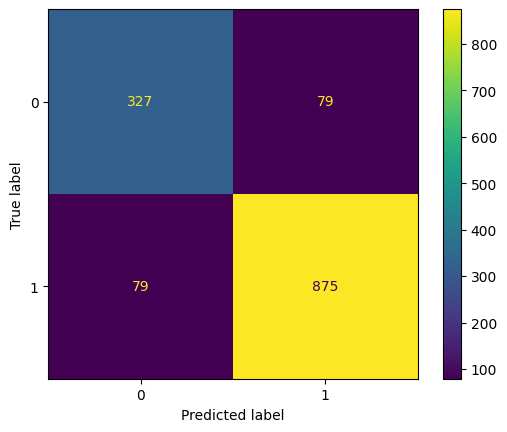

In [841]:
matrix = confusion_matrix(y_test, y_pred)
ConfusionMatrixDisplay(matrix).plot()

SVC -  s osetrenim outlierov a tfidf ngram

In [842]:
model = SVC(**grid_search.best_params_)
# grid_search = GridSearchCV(estimator=model, param_grid=param_grid, cv=5, scoring='accuracy', n_jobs=8)
model.fit(X_train_combined2_out_svc, y_train)
# print("Najlepšie parametre:", grid_search.best_params_)
# print("Najlepšie skóre:", grid_search.best_score_)

SVC(C=100)

In [843]:

y_pred_train = model.predict(X_train_combined2_out_svc)

In [844]:
print("Presnosť:", accuracy_score(y_train, y_pred_train))
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train))

Presnosť: 0.8054854981084489
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.81      0.44      0.57       935
           1       0.80      0.96      0.87      2237

    accuracy                           0.81      3172
   macro avg       0.81      0.70      0.72      3172
weighted avg       0.81      0.81      0.79      3172



In [845]:
y_pred = model.predict(X_test_combined2_out_svc)

In [846]:
results_list3_svc.append({
        'accuracy_train': accuracy_score(y_train, y_pred_train),
    'accuracy_test': accuracy_score(y_test, y_pred),
    'precision_train': precision_score(y_train, y_pred_train, average='binary'),
    'precision_test': precision_score(y_test, y_pred, average='binary'),
 'recall_train': recall_score(y_train, y_pred_train, average='binary'),
 'recall_test': recall_score(y_test, y_pred, average='binary'),
 'f1_train': f1_score(y_train, y_pred_train, average='binary'),
 'f1_test': f1_score(y_test, y_pred, average='binary')
        
    })

In [847]:
print("Presnosť:", accuracy_score(y_test, y_pred))
print("Klasifikačný report:\n", classification_report(y_test, y_pred))

Presnosť: 0.8058823529411765
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.81      0.46      0.59       406
           1       0.81      0.95      0.87       954

    accuracy                           0.81      1360
   macro avg       0.81      0.71      0.73      1360
weighted avg       0.81      0.81      0.79      1360



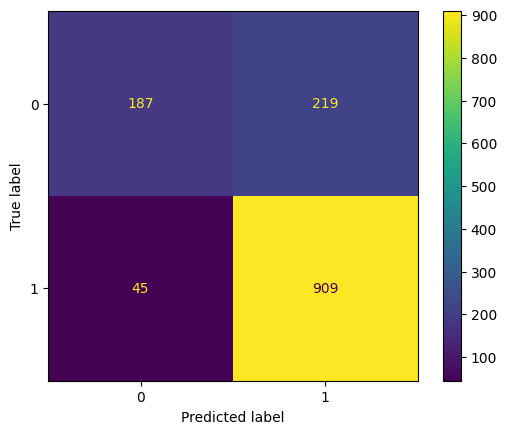

In [848]:
matrix = confusion_matrix(y_test, y_pred)
ConfusionMatrixDisplay(matrix).plot()

SVC - s osetrenim outlierov a word frequency

In [849]:
model = SVC(**grid_search.best_params_)
# grid_search = GridSearchCV(estimator=model, param_grid=param_grid, cv=5, scoring='accuracy', n_jobs=8)
model.fit(X_train_combined3_out_svc, y_train)
# print("Najlepšie parametre:", grid_search.best_params_)
# print("Najlepšie skóre:", grid_search.best_score_)

SVC(C=100)

In [850]:

y_pred_train = model.predict(X_train_combined3_out_svc)

In [851]:
print("Presnosť:", accuracy_score(y_train, y_pred_train))
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train))

Presnosť: 0.9974779319041615
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.99      1.00      1.00       935
           1       1.00      1.00      1.00      2237

    accuracy                           1.00      3172
   macro avg       1.00      1.00      1.00      3172
weighted avg       1.00      1.00      1.00      3172



In [852]:
y_pred = model.predict(X_test_combined3_out_svc)

In [853]:
results_list3_svc.append({
        'accuracy_train': accuracy_score(y_train, y_pred_train),
    'accuracy_test': accuracy_score(y_test, y_pred),
    'precision_train': precision_score(y_train, y_pred_train, average='binary'),
    'precision_test': precision_score(y_test, y_pred, average='binary'),
 'recall_train': recall_score(y_train, y_pred_train, average='binary'),
 'recall_test': recall_score(y_test, y_pred, average='binary'),
 'f1_train': f1_score(y_train, y_pred_train, average='binary'),
 'f1_test': f1_score(y_test, y_pred, average='binary')
        
    })

In [854]:
print("Presnosť:", accuracy_score(y_test, y_pred))
print("Klasifikačný report:\n", classification_report(y_test, y_pred))

Presnosť: 0.8794117647058823
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.81      0.78      0.79       406
           1       0.91      0.92      0.91       954

    accuracy                           0.88      1360
   macro avg       0.86      0.85      0.85      1360
weighted avg       0.88      0.88      0.88      1360



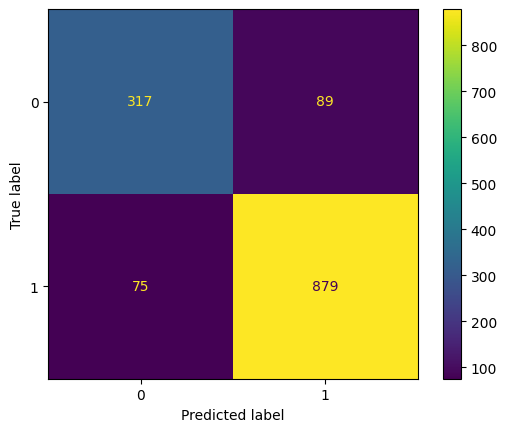

In [855]:
matrix = confusion_matrix(y_test, y_pred)
ConfusionMatrixDisplay(matrix).plot()

SVC - s osetrenim outlierov a tfidf word frequency

In [856]:
model = SVC(**grid_search.best_params_)
# grid_search = GridSearchCV(estimator=model, param_grid=param_grid, cv=5, scoring='accuracy', n_jobs=8)
model.fit(X_train_combined4_out_svc, y_train)
# print("Najlepšie parametre:", grid_search.best_params_)
# print("Najlepšie skóre:", grid_search.best_score_)

SVC(C=100)

In [857]:

y_pred_train = model.predict(X_train_combined4_out_svc)

In [858]:
print("Presnosť:", accuracy_score(y_train, y_pred_train))
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train))

Presnosť: 0.8029634300126104
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.82      0.42      0.56       935
           1       0.80      0.96      0.87      2237

    accuracy                           0.80      3172
   macro avg       0.81      0.69      0.72      3172
weighted avg       0.81      0.80      0.78      3172



In [859]:
y_pred = model.predict(X_test_combined4_out_svc)

In [860]:
results_list3_svc.append({
        'accuracy_train': accuracy_score(y_train, y_pred_train),
    'accuracy_test': accuracy_score(y_test, y_pred),
    'precision_train': precision_score(y_train, y_pred_train, average='binary'),
    'precision_test': precision_score(y_test, y_pred, average='binary'),
 'recall_train': recall_score(y_train, y_pred_train, average='binary'),
 'recall_test': recall_score(y_test, y_pred, average='binary'),
 'f1_train': f1_score(y_train, y_pred_train, average='binary'),
 'f1_test': f1_score(y_test, y_pred, average='binary')
        
    })

In [861]:
print("Presnosť:", accuracy_score(y_test, y_pred))
print("Klasifikačný report:\n", classification_report(y_test, y_pred))

Presnosť: 0.8007352941176471
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.80      0.44      0.57       406
           1       0.80      0.95      0.87       954

    accuracy                           0.80      1360
   macro avg       0.80      0.70      0.72      1360
weighted avg       0.80      0.80      0.78      1360



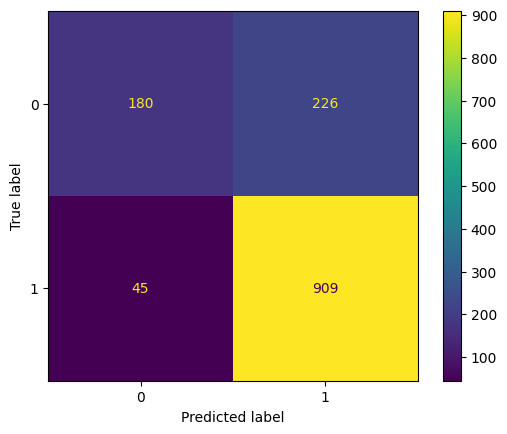

In [862]:
matrix = confusion_matrix(y_test, y_pred)
ConfusionMatrixDisplay(matrix).plot()

SVC - so skalovanim

In [863]:
model = SVC()
grid_search = GridSearchCV(estimator=model, param_grid=param_grid, cv=5, scoring='accuracy', n_jobs=8)
grid_search.fit(X_train_scaled_svc, y_train)
print("Najlepšie parametre:", grid_search.best_params_)
print("Najlepšie skóre:", grid_search.best_score_)

Najlepšie parametre: {'C': 1, 'coef0': 0.0, 'gamma': 'scale', 'kernel': 'rbf'}
Najlepšie skóre: 0.7269867607243101


In [864]:
best_model = grid_search.best_estimator_
y_pred_train = best_model.predict(X_train_scaled_svc)

In [865]:
print("Presnosť:", accuracy_score(y_train, y_pred_train))
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train))

Presnosť: 0.7326607818411097
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.70      0.16      0.26       935
           1       0.73      0.97      0.84      2237

    accuracy                           0.73      3172
   macro avg       0.72      0.57      0.55      3172
weighted avg       0.73      0.73      0.67      3172



In [866]:
y_pred = best_model.predict(X_test_scaled_svc)

In [867]:
results_list3_svc.append({
        'best_score': grid_search.best_score_,
        'accuracy_train': accuracy_score(y_train, y_pred_train),
    'accuracy_test': accuracy_score(y_test, y_pred),
    'precision_train': precision_score(y_train, y_pred_train, average='binary'),
    'precision_test': precision_score(y_test, y_pred, average='binary'),
 'recall_train': recall_score(y_train, y_pred_train, average='binary'),
 'recall_test': recall_score(y_test, y_pred, average='binary'),
 'f1_train': f1_score(y_train, y_pred_train, average='binary'),
 'f1_test': f1_score(y_test, y_pred, average='binary')
        
    })

In [868]:
print("Presnosť:", accuracy_score(y_test, y_pred))
print("Klasifikačný report:\n", classification_report(y_test, y_pred))

Presnosť: 0.7330882352941176
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.73      0.17      0.28       406
           1       0.73      0.97      0.84       954

    accuracy                           0.73      1360
   macro avg       0.73      0.57      0.56      1360
weighted avg       0.73      0.73      0.67      1360



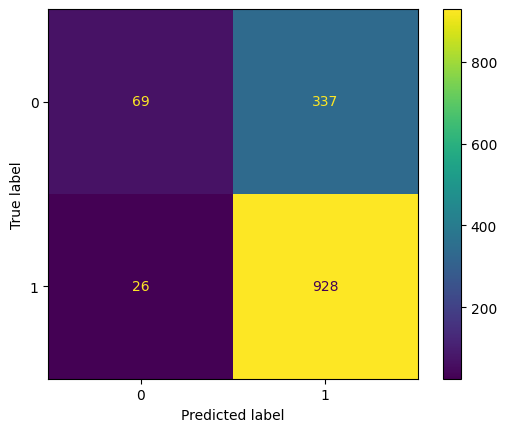

In [869]:
matrix = confusion_matrix(y_test, y_pred)
ConfusionMatrixDisplay(matrix).plot()

SVC - so skalovanim a ngram

In [870]:
model = SVC(**grid_search.best_params_)
# grid_search = GridSearchCV(estimator=model, param_grid=param_grid, cv=5, scoring='accuracy', n_jobs=8)
model.fit(X_train_combined_scaled_svc, y_train)
# print("Najlepšie parametre:", grid_search.best_params_)
# print("Najlepšie skóre:", grid_search.best_score_)

SVC(C=1)

In [871]:

y_pred_train = model.predict(X_train_combined_scaled_svc)

In [872]:
print("Presnosť:", accuracy_score(y_train, y_pred_train))
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train))

Presnosť: 0.8688524590163934
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.90      0.63      0.74       935
           1       0.86      0.97      0.91      2237

    accuracy                           0.87      3172
   macro avg       0.88      0.80      0.83      3172
weighted avg       0.87      0.87      0.86      3172



In [873]:
y_pred = model.predict(X_test_combined_scaled_svc)

In [874]:
results_list3_svc.append({
        'accuracy_train': accuracy_score(y_train, y_pred_train),
    'accuracy_test': accuracy_score(y_test, y_pred),
    'precision_train': precision_score(y_train, y_pred_train, average='binary'),
    'precision_test': precision_score(y_test, y_pred, average='binary'),
 'recall_train': recall_score(y_train, y_pred_train, average='binary'),
 'recall_test': recall_score(y_test, y_pred, average='binary'),
 'f1_train': f1_score(y_train, y_pred_train, average='binary'),
 'f1_test': f1_score(y_test, y_pred, average='binary')
        
    })

In [875]:
print("Presnosť:", accuracy_score(y_test, y_pred))
print("Klasifikačný report:\n", classification_report(y_test, y_pred))

Presnosť: 0.8463235294117647
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.87      0.57      0.69       406
           1       0.84      0.97      0.90       954

    accuracy                           0.85      1360
   macro avg       0.86      0.77      0.79      1360
weighted avg       0.85      0.85      0.84      1360



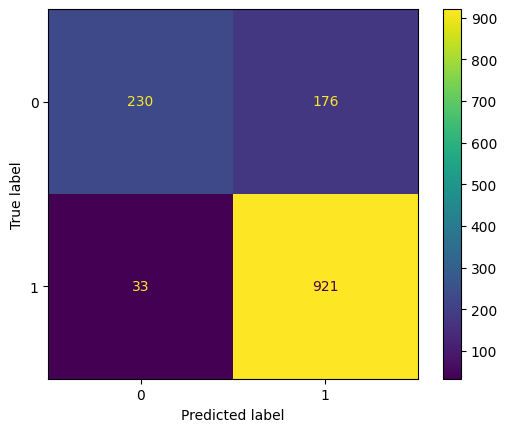

In [876]:
matrix = confusion_matrix(y_test, y_pred)
ConfusionMatrixDisplay(matrix).plot()

SVC - so skalovanim a tfidf ngram

In [877]:
model = SVC(**grid_search.best_params_)
# grid_search = GridSearchCV(estimator=model, param_grid=param_grid, cv=5, scoring='accuracy', n_jobs=8)
model.fit(X_train_combined2_scaled_svc, y_train)
# print("Najlepšie parametre:", grid_search.best_params_)
# print("Najlepšie skóre:", grid_search.best_score_)

SVC(C=1)

In [878]:
y_pred_train = model.predict(X_train_combined2_scaled_svc)

In [879]:
print("Presnosť:", accuracy_score(y_train, y_pred_train))
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train))

Presnosť: 0.9167717528373266
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.93      0.77      0.85       935
           1       0.91      0.98      0.94      2237

    accuracy                           0.92      3172
   macro avg       0.92      0.88      0.89      3172
weighted avg       0.92      0.92      0.91      3172



In [880]:
y_pred = model.predict(X_test_combined2_scaled_svc)

In [881]:
results_list3_svc.append({
        'accuracy_train': accuracy_score(y_train, y_pred_train),
    'accuracy_test': accuracy_score(y_test, y_pred),
    'precision_train': precision_score(y_train, y_pred_train, average='binary'),
    'precision_test': precision_score(y_test, y_pred, average='binary'),
 'recall_train': recall_score(y_train, y_pred_train, average='binary'),
 'recall_test': recall_score(y_test, y_pred, average='binary'),
 'f1_train': f1_score(y_train, y_pred_train, average='binary'),
 'f1_test': f1_score(y_test, y_pred, average='binary')
        
    })

In [882]:
print("Presnosť:", accuracy_score(y_test, y_pred))
print("Klasifikačný report:\n", classification_report(y_test, y_pred))

Presnosť: 0.8786764705882353
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.88      0.68      0.77       406
           1       0.88      0.96      0.92       954

    accuracy                           0.88      1360
   macro avg       0.88      0.82      0.84      1360
weighted avg       0.88      0.88      0.87      1360



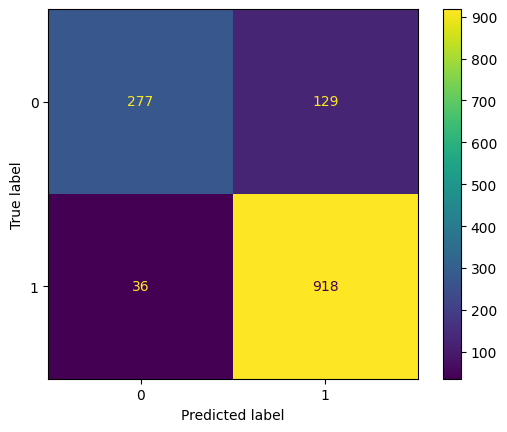

In [883]:
matrix = confusion_matrix(y_test, y_pred)
ConfusionMatrixDisplay(matrix).plot()

SVC - so skalovanim a word frequency

In [884]:
model = SVC(**grid_search.best_params_)
# grid_search = GridSearchCV(estimator=model, param_grid=param_grid, cv=5, scoring='accuracy', n_jobs=8)
model.fit(X_train_combined3_scaled_svc, y_train)
# print("Najlepšie parametre:", grid_search.best_params_)
# print("Najlepšie skóre:", grid_search.best_score_)

SVC(C=1)

In [885]:

y_pred_train = model.predict(X_train_combined3_scaled_svc)

In [886]:
print("Presnosť:", accuracy_score(y_train, y_pred_train))
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train))

Presnosť: 0.862547288776797
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.89      0.61      0.72       935
           1       0.86      0.97      0.91      2237

    accuracy                           0.86      3172
   macro avg       0.87      0.79      0.82      3172
weighted avg       0.87      0.86      0.85      3172



In [887]:
y_pred = model.predict(X_test_combined3_scaled_svc)

In [888]:
results_list3_svc.append({
        'accuracy_train': accuracy_score(y_train, y_pred_train),
    'accuracy_test': accuracy_score(y_test, y_pred),
    'precision_train': precision_score(y_train, y_pred_train, average='binary'),
    'precision_test': precision_score(y_test, y_pred, average='binary'),
 'recall_train': recall_score(y_train, y_pred_train, average='binary'),
 'recall_test': recall_score(y_test, y_pred, average='binary'),
 'f1_train': f1_score(y_train, y_pred_train, average='binary'),
 'f1_test': f1_score(y_test, y_pred, average='binary')
        
    })

In [889]:
print("Presnosť:", accuracy_score(y_test, y_pred))
print("Klasifikačný report:\n", classification_report(y_test, y_pred))

Presnosť: 0.8404411764705882
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.87      0.55      0.67       406
           1       0.83      0.96      0.89       954

    accuracy                           0.84      1360
   macro avg       0.85      0.76      0.78      1360
weighted avg       0.84      0.84      0.83      1360



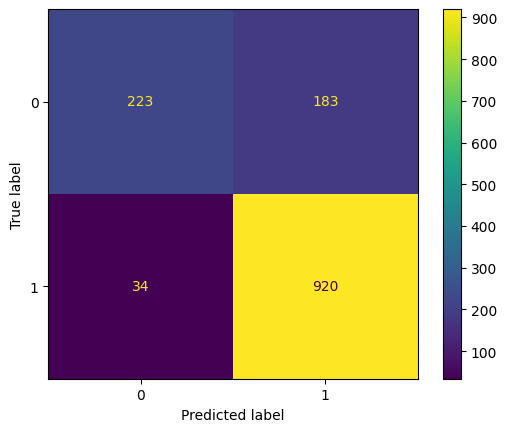

In [890]:
matrix = confusion_matrix(y_test, y_pred)
ConfusionMatrixDisplay(matrix).plot()

SVC - so skalovanim a tfidf word frequency

In [891]:
model = SVC(**grid_search.best_params_)
# grid_search = GridSearchCV(estimator=model, param_grid=param_grid, cv=5, scoring='accuracy', n_jobs=8)
model.fit(X_train_combined4_scaled_svc, y_train)
# print("Najlepšie parametre:", grid_search.best_params_)
# print("Najlepšie skóre:", grid_search.best_score_)

SVC(C=1)

In [892]:
y_pred_train = model.predict(X_train_combined4_scaled_svc)

In [893]:
print("Presnosť:", accuracy_score(y_train, y_pred_train))
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train))

Presnosť: 0.9246532156368222
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.94      0.79      0.86       935
           1       0.92      0.98      0.95      2237

    accuracy                           0.92      3172
   macro avg       0.93      0.89      0.90      3172
weighted avg       0.93      0.92      0.92      3172



In [894]:
y_pred = model.predict(X_test_combined4_scaled_svc)

In [895]:
results_list3_svc.append({
        'accuracy_train': accuracy_score(y_train, y_pred_train),
    'accuracy_test': accuracy_score(y_test, y_pred),
    'precision_train': precision_score(y_train, y_pred_train, average='binary'),
    'precision_test': precision_score(y_test, y_pred, average='binary'),
 'recall_train': recall_score(y_train, y_pred_train, average='binary'),
 'recall_test': recall_score(y_test, y_pred, average='binary'),
 'f1_train': f1_score(y_train, y_pred_train, average='binary'),
 'f1_test': f1_score(y_test, y_pred, average='binary')
        
    })

In [896]:
print("Presnosť:", accuracy_score(y_test, y_pred))
print("Klasifikačný report:\n", classification_report(y_test, y_pred))

Presnosť: 0.8779411764705882
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.88      0.68      0.77       406
           1       0.88      0.96      0.92       954

    accuracy                           0.88      1360
   macro avg       0.88      0.82      0.84      1360
weighted avg       0.88      0.88      0.87      1360



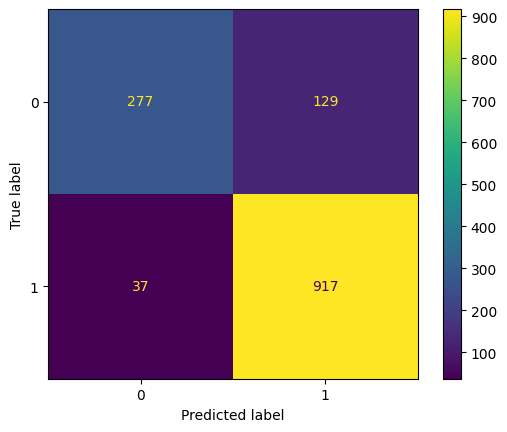

In [897]:
matrix = confusion_matrix(y_test, y_pred)
ConfusionMatrixDisplay(matrix).plot()

SVC - s osetrenim outlierov a so skalovanim 

In [899]:
model = SVC()
grid_search = GridSearchCV(estimator=model, param_grid=param_grid, cv=5, scoring='accuracy', n_jobs=8)
grid_search.fit(X_train_scal_out_svc, y_train)
print("Najlepšie parametre:", grid_search.best_params_)
print("Najlepšie skóre:", grid_search.best_score_)

Najlepšie parametre: {'C': 100, 'coef0': 0.0, 'gamma': 'scale', 'kernel': 'rbf'}
Najlepšie skóre: 0.75094214958146


In [900]:
best_model = grid_search.best_estimator_
y_pred_train = best_model.predict(X_train_scal_out_svc)

In [901]:
print("Presnosť:", accuracy_score(y_train, y_pred_train))
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train))

Presnosť: 0.7534678436317781
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.67      0.32      0.43       935
           1       0.77      0.93      0.84      2237

    accuracy                           0.75      3172
   macro avg       0.72      0.63      0.64      3172
weighted avg       0.74      0.75      0.72      3172



In [902]:
y_pred = best_model.predict(X_test_scal_out_svc)

In [903]:
results_list3_svc.append({
        'best_score': grid_search.best_score_,
        'accuracy_train': accuracy_score(y_train, y_pred_train),
    'accuracy_test': accuracy_score(y_test, y_pred),
    'precision_train': precision_score(y_train, y_pred_train, average='binary'),
    'precision_test': precision_score(y_test, y_pred, average='binary'),
 'recall_train': recall_score(y_train, y_pred_train, average='binary'),
 'recall_test': recall_score(y_test, y_pred, average='binary'),
 'f1_train': f1_score(y_train, y_pred_train, average='binary'),
 'f1_test': f1_score(y_test, y_pred, average='binary')
        
    })

In [904]:
print("Presnosť:", accuracy_score(y_test, y_pred))
print("Klasifikačný report:\n", classification_report(y_test, y_pred))

Presnosť: 0.7558823529411764
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.69      0.34      0.45       406
           1       0.77      0.93      0.84       954

    accuracy                           0.76      1360
   macro avg       0.73      0.64      0.65      1360
weighted avg       0.74      0.76      0.73      1360



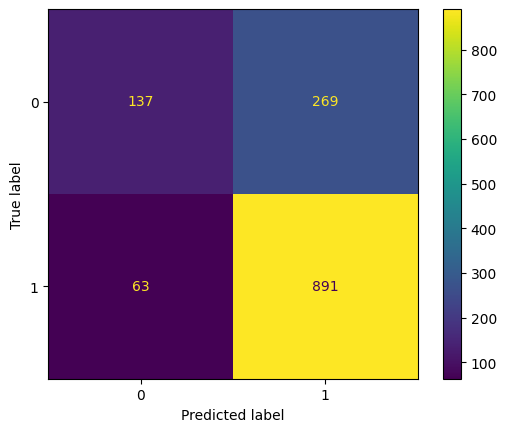

In [905]:
matrix = confusion_matrix(y_test, y_pred)
ConfusionMatrixDisplay(matrix).plot()

SVC - s osetrenim outlierov a so skalovanim a ngram

In [906]:
model = SVC(**grid_search.best_params_)
# grid_search = GridSearchCV(estimator=model, param_grid=param_grid, cv=5, scoring='accuracy', n_jobs=8)
model.fit(X_train_combined_scal_out_svc, y_train)
# print("Najlepšie parametre:", grid_search.best_params_)
# print("Najlepšie skóre:", grid_search.best_score_)

SVC(C=100)

In [907]:
y_pred_train = model.predict(X_train_combined_scal_out_svc)

In [908]:
print("Presnosť:", accuracy_score(y_train, y_pred_train))
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train))

Presnosť: 0.9996847414880202
Klasifikačný report:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00       935
           1       1.00      1.00      1.00      2237

    accuracy                           1.00      3172
   macro avg       1.00      1.00      1.00      3172
weighted avg       1.00      1.00      1.00      3172



In [909]:
y_pred = model.predict(X_test_combined_scal_out_svc)

In [910]:
results_list3_svc.append({
        'accuracy_train': accuracy_score(y_train, y_pred_train),
    'accuracy_test': accuracy_score(y_test, y_pred),
    'precision_train': precision_score(y_train, y_pred_train, average='binary'),
    'precision_test': precision_score(y_test, y_pred, average='binary'),
 'recall_train': recall_score(y_train, y_pred_train, average='binary'),
 'recall_test': recall_score(y_test, y_pred, average='binary'),
 'f1_train': f1_score(y_train, y_pred_train, average='binary'),
 'f1_test': f1_score(y_test, y_pred, average='binary')
        
    })

In [911]:
print("Presnosť:", accuracy_score(y_test, y_pred))
print("Klasifikačný report:\n", classification_report(y_test, y_pred))

Presnosť: 0.8977941176470589
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.84      0.81      0.83       406
           1       0.92      0.93      0.93       954

    accuracy                           0.90      1360
   macro avg       0.88      0.87      0.88      1360
weighted avg       0.90      0.90      0.90      1360



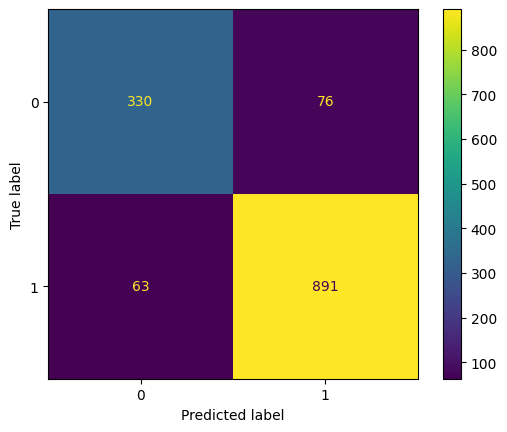

In [912]:
matrix = confusion_matrix(y_test, y_pred)
ConfusionMatrixDisplay(matrix).plot()

SVC - s osetrenim outlierov a so skalovanim a tfidf n-gram

In [913]:
model = SVC(**grid_search.best_params_)
# grid_search = GridSearchCV(estimator=model, param_grid=param_grid, cv=5, scoring='accuracy', n_jobs=8)
model.fit(X_train_combined2_scal_out_svc, y_train)
# print("Najlepšie parametre:", grid_search.best_params_)
# print("Najlepšie skóre:", grid_search.best_score_)

SVC(C=100)

In [914]:
y_pred_train = model.predict(X_train_combined2_scal_out_svc)

In [915]:
print("Presnosť:", accuracy_score(y_train, y_pred_train))
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train))

Presnosť: 0.8054854981084489
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.81      0.44      0.57       935
           1       0.80      0.96      0.87      2237

    accuracy                           0.81      3172
   macro avg       0.81      0.70      0.72      3172
weighted avg       0.81      0.81      0.79      3172



In [916]:
y_pred = model.predict(X_test_combined2_scal_out_svc)

In [917]:
results_list3_svc.append({
        'accuracy_train': accuracy_score(y_train, y_pred_train),
    'accuracy_test': accuracy_score(y_test, y_pred),
    'precision_train': precision_score(y_train, y_pred_train, average='binary'),
    'precision_test': precision_score(y_test, y_pred, average='binary'),
 'recall_train': recall_score(y_train, y_pred_train, average='binary'),
 'recall_test': recall_score(y_test, y_pred, average='binary'),
 'f1_train': f1_score(y_train, y_pred_train, average='binary'),
 'f1_test': f1_score(y_test, y_pred, average='binary')
        
    })

In [918]:
print("Presnosť:", accuracy_score(y_test, y_pred))
print("Klasifikačný report:\n", classification_report(y_test, y_pred))

Presnosť: 0.8058823529411765
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.81      0.46      0.59       406
           1       0.81      0.95      0.87       954

    accuracy                           0.81      1360
   macro avg       0.81      0.71      0.73      1360
weighted avg       0.81      0.81      0.79      1360



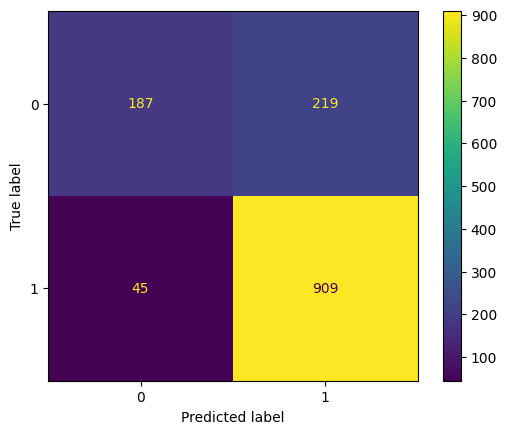

In [919]:
matrix = confusion_matrix(y_test, y_pred)
ConfusionMatrixDisplay(matrix).plot()

SVC - s osetrenim outlierov a so skalovanim a word frequency

In [920]:
model = SVC(**grid_search.best_params_)
# grid_search = GridSearchCV(estimator=model, param_grid=param_grid, cv=5, scoring='accuracy', n_jobs=8)
model.fit(X_train_combined3_scal_out_svc, y_train)
# print("Najlepšie parametre:", grid_search.best_params_)
# print("Najlepšie skóre:", grid_search.best_score_)

SVC(C=100)

In [921]:
y_pred_train = model.predict(X_train_combined3_scal_out_svc)

In [922]:
print("Presnosť:", accuracy_score(y_train, y_pred_train))
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train))

Presnosť: 0.9974779319041615
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.99      1.00      1.00       935
           1       1.00      1.00      1.00      2237

    accuracy                           1.00      3172
   macro avg       1.00      1.00      1.00      3172
weighted avg       1.00      1.00      1.00      3172



In [923]:
y_pred = model.predict(X_test_combined3_scal_out_svc)

In [924]:
results_list3_svc.append({
        'accuracy_train': accuracy_score(y_train, y_pred_train),
    'accuracy_test': accuracy_score(y_test, y_pred),
    'precision_train': precision_score(y_train, y_pred_train, average='binary'),
    'precision_test': precision_score(y_test, y_pred, average='binary'),
 'recall_train': recall_score(y_train, y_pred_train, average='binary'),
 'recall_test': recall_score(y_test, y_pred, average='binary'),
 'f1_train': f1_score(y_train, y_pred_train, average='binary'),
 'f1_test': f1_score(y_test, y_pred, average='binary')
        
    })

In [925]:
print("Presnosť:", accuracy_score(y_test, y_pred))
print("Klasifikačný report:\n", classification_report(y_test, y_pred))

Presnosť: 0.8794117647058823
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.81      0.78      0.79       406
           1       0.91      0.92      0.91       954

    accuracy                           0.88      1360
   macro avg       0.86      0.85      0.85      1360
weighted avg       0.88      0.88      0.88      1360



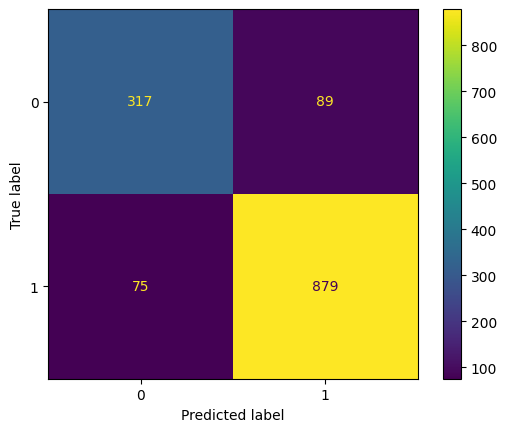

In [926]:
matrix = confusion_matrix(y_test, y_pred)
ConfusionMatrixDisplay(matrix).plot()

SVC - s osetrenim outlierov a so skalovanim a tfidf word frequency

In [927]:
model = SVC(**grid_search.best_params_)
# grid_search = GridSearchCV(estimator=model, param_grid=param_grid, cv=5, scoring='accuracy', n_jobs=8)
model.fit(X_train_combined4_scal_out_svc, y_train)
# print("Najlepšie parametre:", grid_search.best_params_)
# print("Najlepšie skóre:", grid_search.best_score_)

SVC(C=100)

In [928]:
y_pred_train = model.predict(X_train_combined4_scal_out_svc)

In [929]:
print("Presnosť:", accuracy_score(y_train, y_pred_train))
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train))

Presnosť: 0.8029634300126104
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.82      0.42      0.56       935
           1       0.80      0.96      0.87      2237

    accuracy                           0.80      3172
   macro avg       0.81      0.69      0.72      3172
weighted avg       0.81      0.80      0.78      3172



In [930]:
y_pred = model.predict(X_test_combined4_scal_out_svc)

In [931]:
results_list3_svc.append({
        'accuracy_train': accuracy_score(y_train, y_pred_train),
    'accuracy_test': accuracy_score(y_test, y_pred),
    'precision_train': precision_score(y_train, y_pred_train, average='binary'),
    'precision_test': precision_score(y_test, y_pred, average='binary'),
 'recall_train': recall_score(y_train, y_pred_train, average='binary'),
 'recall_test': recall_score(y_test, y_pred, average='binary'),
 'f1_train': f1_score(y_train, y_pred_train, average='binary'),
 'f1_test': f1_score(y_test, y_pred, average='binary')
        
    })

In [932]:
print("Presnosť:", accuracy_score(y_test, y_pred))
print("Klasifikačný report:\n", classification_report(y_test, y_pred))

Presnosť: 0.8007352941176471
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.80      0.44      0.57       406
           1       0.80      0.95      0.87       954

    accuracy                           0.80      1360
   macro avg       0.80      0.70      0.72      1360
weighted avg       0.80      0.80      0.78      1360



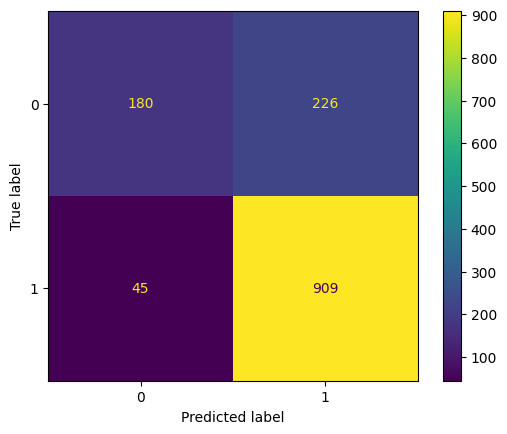

In [933]:
matrix = confusion_matrix(y_test, y_pred)
ConfusionMatrixDisplay(matrix).plot()

In [934]:
results_svc3 = pd.DataFrame(results_list3_svc)
print(results_svc3)

    best_score  accuracy_train  accuracy_test  precision_train  \
0     0.719736        0.734552       0.719853         0.736200   
1          NaN        0.999685       0.894853         1.000000   
2          NaN        1.000000       0.902206         1.000000   
3          NaN        0.997478       0.875735         0.998212   
4          NaN        1.000000       0.900000         1.000000   
5     0.750942        0.753468       0.755882         0.766777   
6          NaN        1.000000       0.883824         1.000000   
7          NaN        0.805485       0.805882         0.804054   
8          NaN        0.997478       0.879412         0.998658   
9          NaN        0.802963       0.800735         0.799183   
10    0.726987        0.732661       0.733088         0.734708   
11         NaN        0.868852       0.846324         0.861453   
12         NaN        0.916772       0.878676         0.911556   
13         NaN        0.862547       0.840441         0.855788   
14        

Najvyššiu presnosť sme dosiahli pomocou datasetu bez ošetrenia outlierov a skalovania s tfidf ngramami. Niektoré presnosti sa nám znížili z dôvodu, že sme na nich nevykonali gridsearch a neboli efektívne hyperparametre spustené na nich. 

RANDOM FOREST - bez osetrenia outlierov a skalovania

In [935]:
results_list3_rf=[]

Určenie hyperparametrov, ktore budeme v grid search skúšať

In [936]:
param_grid = {
    'n_estimators': [10, 50, 100, 200],  # Počet stromov v lese
    'max_depth': [None, 10, 20, 30, 40],  # Maximálna hĺbka stromu
    'min_samples_split': [2, 5, 10],  # Minimálny počet vzoriek potrebný na rozdelenie uzla
    'min_samples_leaf': [1, 2, 4]  # Minimálny počet vzoriek potrebný v listovom uzle
}

Grid search - bude skúšať všetky kombinácie hyperparametrov a vyberie tie najlepšie pre accuracy

In [937]:
model = RandomForestClassifier()
grid_search_rf = GridSearchCV(model, param_grid,  cv=5, scoring='accuracy', n_jobs=8)
grid_search_rf.fit(X_train_rf, y_train)
print("Najlepší hyperparametre:", grid_search_rf.best_params_)
print("Najlepší skóre:", grid_search_rf.best_score_)

Najlepší hyperparametre: {'max_depth': 10, 'min_samples_leaf': 4, 'min_samples_split': 5, 'n_estimators': 50}
Najlepší skóre: 0.6964057726222709


Predikovanie na trenovacich datach

In [938]:
best_rf_model = grid_search_rf.best_estimator_
y_pred_train_rf = best_rf_model.predict(X_train_rf)

In [939]:
print("Presnosť:", accuracy_score(y_train, y_pred_train_rf))
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train_rf))

Presnosť: 0.7351828499369483
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.71      0.17      0.27       935
           1       0.74      0.97      0.84      2237

    accuracy                           0.74      3172
   macro avg       0.72      0.57      0.56      3172
weighted avg       0.73      0.74      0.67      3172



Predikovanie na testovacich datach

In [940]:
y_pred_rf = best_rf_model.predict(X_test_rf)

In [941]:
results_list3_rf.append({
        'best_score': grid_search_rf.best_score_,
        'accuracy_train': accuracy_score(y_train, y_pred_train_rf),
    'accuracy_test': accuracy_score(y_test, y_pred_rf),
    'precision_train': precision_score(y_train, y_pred_train_rf, average='macro'),
    'precision_test': precision_score(y_test, y_pred_rf, average='macro'),
 'recall_train': recall_score(y_train, y_pred_train_rf, average='macro'),
 'recall_test': recall_score(y_test, y_pred_rf, average='macro'),
 'f1_train': f1_score(y_train, y_pred_train_rf, average='macro'),
 'f1_test': f1_score(y_test, y_pred_rf, average='macro')
        
    })

In [942]:
print("Presnosť:", accuracy_score(y_test, y_pred_rf))
print("Klasifikačný report:\n", classification_report(y_test, y_pred_rf))

Presnosť: 0.6970588235294117
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.47      0.10      0.17       406
           1       0.71      0.95      0.81       954

    accuracy                           0.70      1360
   macro avg       0.59      0.53      0.49      1360
weighted avg       0.64      0.70      0.62      1360



Vizualizácia výkonnosti modelu

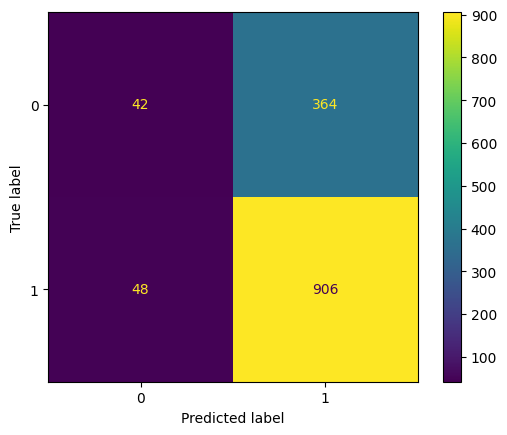

In [943]:
matrix_rf = confusion_matrix(y_test, y_pred_rf)
ConfusionMatrixDisplay(matrix_rf).plot()

RANDOM FOREST - bez osetrenia outlierov a skalovania s ngram

In [944]:
model = RandomForestClassifier(**grid_search_rf.best_params_)
# grid_search_rf = GridSearchCV(model, param_grid,  cv=5, scoring='accuracy', n_jobs=8)
model.fit(X_train_combined_rf, y_train)
# print("Najlepší hyperparametre:", grid_search_rf.best_params_)
# print("Najlepší skóre:", grid_search_rf.best_score_)

RandomForestClassifier(max_depth=10, min_samples_leaf=4, min_samples_split=5,
                       n_estimators=50)

In [945]:
y_pred_train_rf = model.predict(X_train_combined_rf)

In [946]:
print("Presnosť:", accuracy_score(y_train, y_pred_train_rf))
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train_rf))

Presnosť: 0.955233291298865
Klasifikačný report:
               precision    recall  f1-score   support

           0       1.00      0.85      0.92       935
           1       0.94      1.00      0.97      2237

    accuracy                           0.96      3172
   macro avg       0.97      0.92      0.94      3172
weighted avg       0.96      0.96      0.95      3172



In [947]:
y_pred_rf = model.predict(X_test_combined_rf)

In [948]:
results_list3_rf.append({
        'accuracy_train': accuracy_score(y_train, y_pred_train_rf),
    'accuracy_test': accuracy_score(y_test, y_pred_rf),
    'precision_train': precision_score(y_train, y_pred_train_rf, average='macro'),
    'precision_test': precision_score(y_test, y_pred_rf, average='macro'),
 'recall_train': recall_score(y_train, y_pred_train_rf, average='macro'),
 'recall_test': recall_score(y_test, y_pred_rf, average='macro'),
 'f1_train': f1_score(y_train, y_pred_train_rf, average='macro'),
 'f1_test': f1_score(y_test, y_pred_rf, average='macro')
        
    })

In [949]:
print("Presnosť:", accuracy_score(y_test, y_pred_rf))
print("Klasifikačný report:\n", classification_report(y_test, y_pred_rf))

Presnosť: 0.8338235294117647
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.91      0.50      0.64       406
           1       0.82      0.98      0.89       954

    accuracy                           0.83      1360
   macro avg       0.86      0.74      0.77      1360
weighted avg       0.85      0.83      0.82      1360



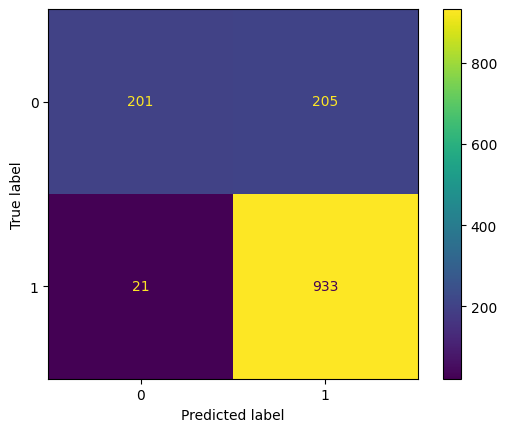

In [950]:
matrix_rf = confusion_matrix(y_test, y_pred_rf)
ConfusionMatrixDisplay(matrix_rf).plot()

RANDOM FOREST - bez osetrenia outlierov a skalovania a tfidf gram

In [951]:
model = RandomForestClassifier(**grid_search_rf.best_params_)
# grid_search_rf = GridSearchCV(model, param_grid,  cv=5, scoring='accuracy', n_jobs=8)
model.fit(X_train_combined2_rf, y_train)
# print("Najlepší hyperparametre:", grid_search_rf.best_params_)
# print("Najlepší skóre:", grid_search_rf.best_score_)

RandomForestClassifier(max_depth=10, min_samples_leaf=4, min_samples_split=5,
                       n_estimators=50)

In [952]:
y_pred_train_rf = model.predict(X_train_combined2_rf)

In [953]:
print("Presnosť:", accuracy_score(y_train, y_pred_train_rf))
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train_rf))

Presnosť: 0.9631147540983607
Klasifikačný report:
               precision    recall  f1-score   support

           0       1.00      0.87      0.93       935
           1       0.95      1.00      0.97      2237

    accuracy                           0.96      3172
   macro avg       0.98      0.94      0.95      3172
weighted avg       0.96      0.96      0.96      3172



In [954]:
y_pred_rf = model.predict(X_test_combined2_rf)

In [955]:
results_list3_rf.append({
        'accuracy_train': accuracy_score(y_train, y_pred_train_rf),
    'accuracy_test': accuracy_score(y_test, y_pred_rf),
    'precision_train': precision_score(y_train, y_pred_train_rf, average='macro'),
    'precision_test': precision_score(y_test, y_pred_rf, average='macro'),
 'recall_train': recall_score(y_train, y_pred_train_rf, average='macro'),
 'recall_test': recall_score(y_test, y_pred_rf, average='macro'),
 'f1_train': f1_score(y_train, y_pred_train_rf, average='macro'),
 'f1_test': f1_score(y_test, y_pred_rf, average='macro')
        
    })

In [956]:
print("Presnosť:", accuracy_score(y_test, y_pred_rf))
print("Klasifikačný report:\n", classification_report(y_test, y_pred_rf))

Presnosť: 0.8360294117647059
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.88      0.52      0.66       406
           1       0.83      0.97      0.89       954

    accuracy                           0.84      1360
   macro avg       0.85      0.75      0.77      1360
weighted avg       0.84      0.84      0.82      1360



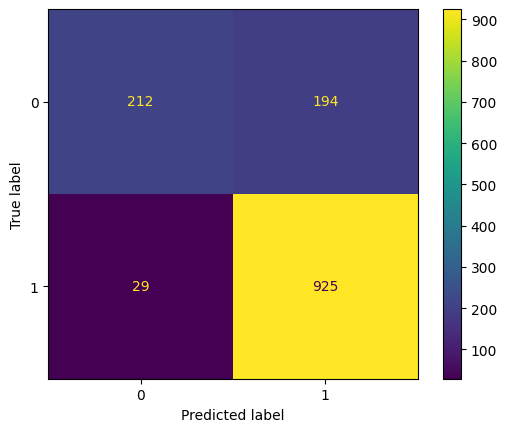

In [957]:
matrix_rf = confusion_matrix(y_test, y_pred_rf)
ConfusionMatrixDisplay(matrix_rf).plot()

RANDOM FOREST - bez osetrenia outlierov a skalovania a word frequency

In [958]:
model = RandomForestClassifier(**grid_search_rf.best_params_)
# grid_search_rf = GridSearchCV(model, param_grid,  cv=5, scoring='accuracy', n_jobs=8)
model.fit(X_train_combined3_rf, y_train)
# print("Najlepší hyperparametre:", grid_search_rf.best_params_)
# print("Najlepší skóre:", grid_search_rf.best_score_)

RandomForestClassifier(max_depth=10, min_samples_leaf=4, min_samples_split=5,
                       n_estimators=50)

In [959]:
y_pred_train_rf = model.predict(X_train_combined3_rf)

In [960]:
print("Presnosť:", accuracy_score(y_train, y_pred_train_rf))
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train_rf))

Presnosť: 0.9713114754098361
Klasifikačný report:
               precision    recall  f1-score   support

           0       1.00      0.90      0.95       935
           1       0.96      1.00      0.98      2237

    accuracy                           0.97      3172
   macro avg       0.98      0.95      0.96      3172
weighted avg       0.97      0.97      0.97      3172



In [961]:
y_pred_rf = model.predict(X_test_combined3_rf)

In [962]:
results_list3_rf.append({
        'accuracy_train': accuracy_score(y_train, y_pred_train_rf),
    'accuracy_test': accuracy_score(y_test, y_pred_rf),
    'precision_train': precision_score(y_train, y_pred_train_rf, average='macro'),
    'precision_test': precision_score(y_test, y_pred_rf, average='macro'),
 'recall_train': recall_score(y_train, y_pred_train_rf, average='macro'),
 'recall_test': recall_score(y_test, y_pred_rf, average='macro'),
 'f1_train': f1_score(y_train, y_pred_train_rf, average='macro'),
 'f1_test': f1_score(y_test, y_pred_rf, average='macro')
        
    })

In [963]:
print("Presnosť:", accuracy_score(y_test, y_pred_rf))
print("Klasifikačný report:\n", classification_report(y_test, y_pred_rf))

Presnosť: 0.8323529411764706
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.90      0.50      0.64       406
           1       0.82      0.98      0.89       954

    accuracy                           0.83      1360
   macro avg       0.86      0.74      0.76      1360
weighted avg       0.84      0.83      0.82      1360



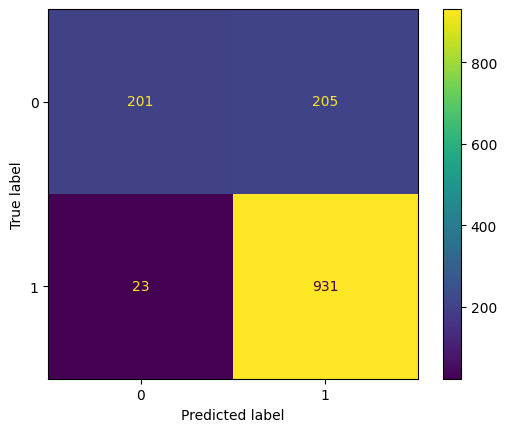

In [964]:
matrix_rf = confusion_matrix(y_test, y_pred_rf)
ConfusionMatrixDisplay(matrix_rf).plot()

RANDOM FOREST - bez osetrenia outlierov a skalovania a tfidf word frequency

In [965]:
model = RandomForestClassifier(**grid_search_rf.best_params_)
# grid_search_rf = GridSearchCV(model, param_grid,  cv=5, scoring='accuracy', n_jobs=8)
model.fit(X_train_combined4_rf, y_train)
# print("Najlepší hyperparametre:", grid_search_rf.best_params_)
# print("Najlepší skóre:", grid_search_rf.best_score_)

RandomForestClassifier(max_depth=10, min_samples_leaf=4, min_samples_split=5,
                       n_estimators=50)

In [966]:
y_pred_train_rf = model.predict(X_train_combined4_rf)

In [967]:
print("Presnosť:", accuracy_score(y_train, y_pred_train_rf))
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train_rf))

Presnosť: 0.9432534678436317
Klasifikačný report:
               precision    recall  f1-score   support

           0       1.00      0.81      0.89       935
           1       0.93      1.00      0.96      2237

    accuracy                           0.94      3172
   macro avg       0.96      0.90      0.93      3172
weighted avg       0.95      0.94      0.94      3172



In [968]:
y_pred_rf = model.predict(X_test_combined4_rf)

In [969]:
results_list3_rf.append({
        'accuracy_train': accuracy_score(y_train, y_pred_train_rf),
    'accuracy_test': accuracy_score(y_test, y_pred_rf),
    'precision_train': precision_score(y_train, y_pred_train_rf, average='macro'),
    'precision_test': precision_score(y_test, y_pred_rf, average='macro'),
 'recall_train': recall_score(y_train, y_pred_train_rf, average='macro'),
 'recall_test': recall_score(y_test, y_pred_rf, average='macro'),
 'f1_train': f1_score(y_train, y_pred_train_rf, average='macro'),
 'f1_test': f1_score(y_test, y_pred_rf, average='macro')
        
    })

In [970]:
print("Presnosť:", accuracy_score(y_test, y_pred_rf))
print("Klasifikačný report:\n", classification_report(y_test, y_pred_rf))

Presnosť: 0.8375
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.95      0.48      0.64       406
           1       0.82      0.99      0.90       954

    accuracy                           0.84      1360
   macro avg       0.88      0.73      0.77      1360
weighted avg       0.86      0.84      0.82      1360



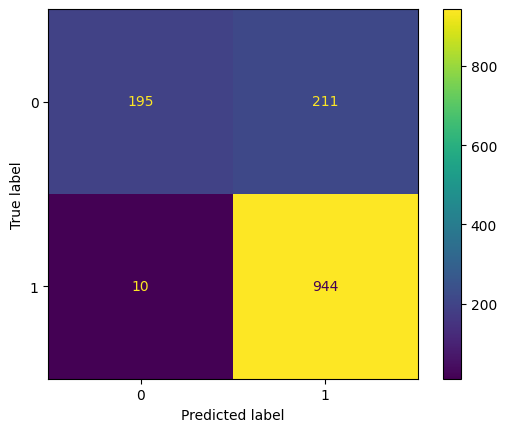

In [971]:
matrix_rf = confusion_matrix(y_test, y_pred_rf)
ConfusionMatrixDisplay(matrix_rf).plot()

RANDOM FOREST - s osetrenim outlierov

In [972]:
model = RandomForestClassifier()
grid_search_rf = GridSearchCV(model, param_grid,  cv=5, scoring='accuracy', n_jobs=8)
grid_search_rf.fit(X_train_out_rf, y_train)
print("Najlepší hyperparametre:", grid_search_rf.best_params_)
print("Najlepší skóre:", grid_search_rf.best_score_)

Najlepší hyperparametre: {'max_depth': 20, 'min_samples_leaf': 1, 'min_samples_split': 5, 'n_estimators': 200}
Najlepší skóre: 0.9060503241511215


In [973]:
best_rf_model = grid_search_rf.best_estimator_
y_pred_train_rf = best_rf_model.predict(X_train_out_rf)

In [974]:
print("Presnosť:", accuracy_score(y_train, y_pred_train_rf))
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train_rf))

Presnosť: 0.9993694829760403
Klasifikačný report:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00       935
           1       1.00      1.00      1.00      2237

    accuracy                           1.00      3172
   macro avg       1.00      1.00      1.00      3172
weighted avg       1.00      1.00      1.00      3172



In [975]:
y_pred_rf = best_rf_model.predict(X_test_out_rf)

In [976]:
results_list3_rf.append({
        'best_score': grid_search_rf.best_score_,
        'accuracy_train': accuracy_score(y_train, y_pred_train_rf),
    'accuracy_test': accuracy_score(y_test, y_pred_rf),
    'precision_train': precision_score(y_train, y_pred_train_rf, average='macro'),
    'precision_test': precision_score(y_test, y_pred_rf, average='macro'),
 'recall_train': recall_score(y_train, y_pred_train_rf, average='macro'),
 'recall_test': recall_score(y_test, y_pred_rf, average='macro'),
 'f1_train': f1_score(y_train, y_pred_train_rf, average='macro'),
 'f1_test': f1_score(y_test, y_pred_rf, average='macro')
        
    })

In [977]:
print("Presnosť:", accuracy_score(y_test, y_pred_rf))
print("Klasifikačný report:\n", classification_report(y_test, y_pred_rf))

Presnosť: 0.9117647058823529
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.91      0.79      0.84       406
           1       0.91      0.97      0.94       954

    accuracy                           0.91      1360
   macro avg       0.91      0.88      0.89      1360
weighted avg       0.91      0.91      0.91      1360



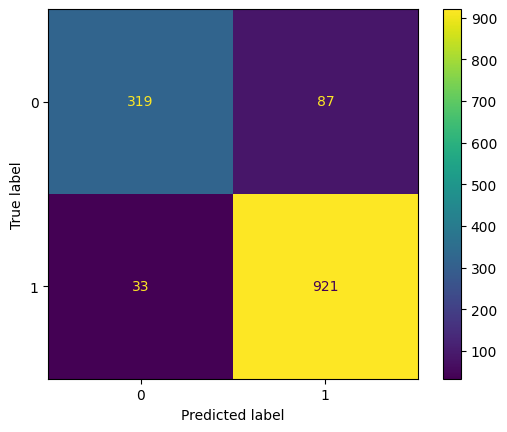

In [978]:
matrix_rf = confusion_matrix(y_test, y_pred_rf)
ConfusionMatrixDisplay(matrix_rf).plot()

RANDOM FOREST - s osetrenim outlierov a ngram

In [979]:
model = RandomForestClassifier(**grid_search_rf.best_params_)
# grid_search_rf = GridSearchCV(model, param_grid,  cv=5, scoring='accuracy', n_jobs=8)
model.fit(X_train_combined_out_rf, y_train)
# print("Najlepší hyperparametre:", grid_search_rf.best_params_)
# print("Najlepší skóre:", grid_search_rf.best_score_)

RandomForestClassifier(max_depth=20, min_samples_split=5, n_estimators=200)

In [980]:
y_pred_train_rf = model.predict(X_train_combined_out_rf)

In [981]:
print("Presnosť:", accuracy_score(y_train, y_pred_train_rf))
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train_rf))

Presnosť: 0.9993694829760403
Klasifikačný report:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00       935
           1       1.00      1.00      1.00      2237

    accuracy                           1.00      3172
   macro avg       1.00      1.00      1.00      3172
weighted avg       1.00      1.00      1.00      3172



In [982]:
y_pred_rf = model.predict(X_test_combined_out_rf)

In [983]:
results_list3_rf.append({
        'accuracy_train': accuracy_score(y_train, y_pred_train_rf),
    'accuracy_test': accuracy_score(y_test, y_pred_rf),
    'precision_train': precision_score(y_train, y_pred_train_rf, average='macro'),
    'precision_test': precision_score(y_test, y_pred_rf, average='macro'),
 'recall_train': recall_score(y_train, y_pred_train_rf, average='macro'),
 'recall_test': recall_score(y_test, y_pred_rf, average='macro'),
 'f1_train': f1_score(y_train, y_pred_train_rf, average='macro'),
 'f1_test': f1_score(y_test, y_pred_rf, average='macro')
        
    })

In [984]:
print("Presnosť:", accuracy_score(y_test, y_pred_rf))
print("Klasifikačný report:\n", classification_report(y_test, y_pred_rf))

Presnosť: 0.8492647058823529
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.94      0.53      0.68       406
           1       0.83      0.99      0.90       954

    accuracy                           0.85      1360
   macro avg       0.89      0.76      0.79      1360
weighted avg       0.86      0.85      0.83      1360



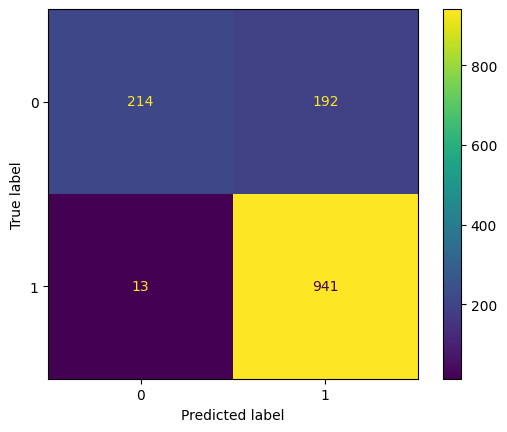

In [985]:
matrix_rf = confusion_matrix(y_test, y_pred_rf)
ConfusionMatrixDisplay(matrix_rf).plot()

RANDOM FOREST - s osetrenim outlierov a tfidf ngram

In [986]:
model = RandomForestClassifier(**grid_search_rf.best_params_)
# grid_search_rf = GridSearchCV(model, param_grid,  cv=5, scoring='accuracy', n_jobs=8)
model.fit(X_train_combined2_out_rf, y_train)
# print("Najlepší hyperparametre:", grid_search_rf.best_params_)
# print("Najlepší skóre:", grid_search_rf.best_score_)

RandomForestClassifier(max_depth=20, min_samples_split=5, n_estimators=200)

In [987]:
y_pred_train_rf = model.predict(X_train_combined2_out_rf)

In [988]:
print("Presnosť:", accuracy_score(y_train, y_pred_train_rf))
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train_rf))

Presnosť: 1.0
Klasifikačný report:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00       935
           1       1.00      1.00      1.00      2237

    accuracy                           1.00      3172
   macro avg       1.00      1.00      1.00      3172
weighted avg       1.00      1.00      1.00      3172



In [989]:
y_pred_rf = model.predict(X_test_combined2_out_rf)

In [990]:
results_list3_rf.append({
        'accuracy_train': accuracy_score(y_train, y_pred_train_rf),
    'accuracy_test': accuracy_score(y_test, y_pred_rf),
    'precision_train': precision_score(y_train, y_pred_train_rf, average='macro'),
    'precision_test': precision_score(y_test, y_pred_rf, average='macro'),
 'recall_train': recall_score(y_train, y_pred_train_rf, average='macro'),
 'recall_test': recall_score(y_test, y_pred_rf, average='macro'),
 'f1_train': f1_score(y_train, y_pred_train_rf, average='macro'),
 'f1_test': f1_score(y_test, y_pred_rf, average='macro')
        
    })

In [991]:
print("Presnosť:", accuracy_score(y_test, y_pred_rf))
print("Klasifikačný report:\n", classification_report(y_test, y_pred_rf))

Presnosť: 0.8588235294117647
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.92      0.57      0.71       406
           1       0.84      0.98      0.91       954

    accuracy                           0.86      1360
   macro avg       0.88      0.78      0.81      1360
weighted avg       0.87      0.86      0.85      1360



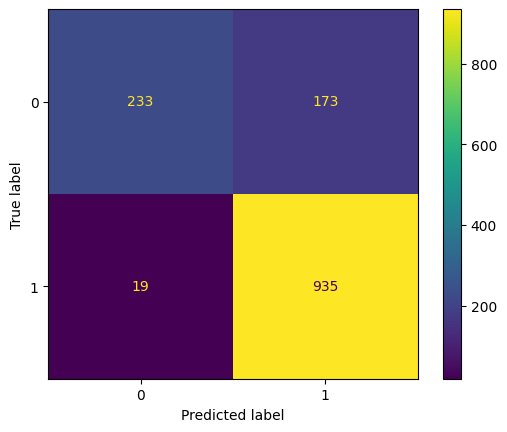

In [992]:
matrix_rf = confusion_matrix(y_test, y_pred_rf)
ConfusionMatrixDisplay(matrix_rf).plot()

RANDOM FOREST - s osetrenim outlierov a word frequency

In [993]:
model = RandomForestClassifier(**grid_search_rf.best_params_)
# grid_search_rf = GridSearchCV(model, param_grid,  cv=5, scoring='accuracy', n_jobs=8)
model.fit(X_train_combined3_out_rf, y_train)
# print("Najlepší hyperparametre:", grid_search_rf.best_params_)
# print("Najlepší skóre:", grid_search_rf.best_score_)

RandomForestClassifier(max_depth=20, min_samples_split=5, n_estimators=200)

In [994]:
y_pred_train_rf = model.predict(X_train_combined3_out_rf)

In [995]:
print("Presnosť:", accuracy_score(y_train, y_pred_train_rf))
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train_rf))

Presnosť: 0.9996847414880202
Klasifikačný report:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00       935
           1       1.00      1.00      1.00      2237

    accuracy                           1.00      3172
   macro avg       1.00      1.00      1.00      3172
weighted avg       1.00      1.00      1.00      3172



In [996]:
y_pred_rf = model.predict(X_test_combined3_out_rf)

In [997]:
results_list3_rf.append({
        'accuracy_train': accuracy_score(y_train, y_pred_train_rf),
    'accuracy_test': accuracy_score(y_test, y_pred_rf),
    'precision_train': precision_score(y_train, y_pred_train_rf, average='macro'),
    'precision_test': precision_score(y_test, y_pred_rf, average='macro'),
 'recall_train': recall_score(y_train, y_pred_train_rf, average='macro'),
 'recall_test': recall_score(y_test, y_pred_rf, average='macro'),
 'f1_train': f1_score(y_train, y_pred_train_rf, average='macro'),
 'f1_test': f1_score(y_test, y_pred_rf, average='macro')
        
    })

In [998]:
print("Presnosť:", accuracy_score(y_test, y_pred_rf))
print("Klasifikačný report:\n", classification_report(y_test, y_pred_rf))

Presnosť: 0.8772058823529412
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.95      0.62      0.75       406
           1       0.86      0.99      0.92       954

    accuracy                           0.88      1360
   macro avg       0.91      0.80      0.83      1360
weighted avg       0.89      0.88      0.87      1360



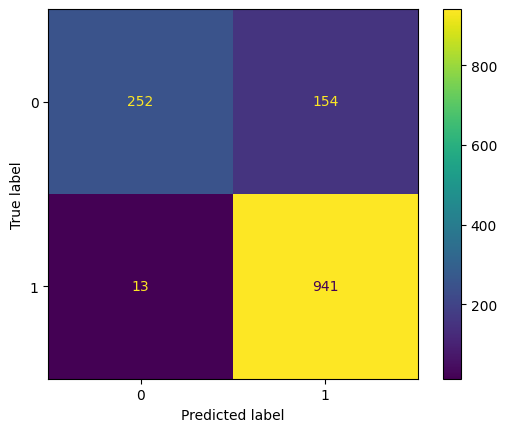

In [999]:
matrix_rf = confusion_matrix(y_test, y_pred_rf)
ConfusionMatrixDisplay(matrix_rf).plot()

RANDOM FOREST - s osetrenim outlierov a tfidf word frequency

In [1000]:
model = RandomForestClassifier(**grid_search_rf.best_params_)
# grid_search_rf = GridSearchCV(model, param_grid,  cv=5, scoring='accuracy', n_jobs=8)
model.fit(X_train_combined4_out_rf, y_train)
# print("Najlepší hyperparametre:", grid_search_rf.best_params_)
# print("Najlepší skóre:", grid_search_rf.best_score_)

RandomForestClassifier(max_depth=20, min_samples_split=5, n_estimators=200)

In [1001]:
y_pred_train_rf = model.predict(X_train_combined4_out_rf)

In [1002]:
print("Presnosť:", accuracy_score(y_train, y_pred_train_rf))
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train_rf))

Presnosť: 0.9996847414880202
Klasifikačný report:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00       935
           1       1.00      1.00      1.00      2237

    accuracy                           1.00      3172
   macro avg       1.00      1.00      1.00      3172
weighted avg       1.00      1.00      1.00      3172



In [1003]:
y_pred_rf = model.predict(X_test_combined4_out_rf)

In [1004]:
results_list3_rf.append({
        'accuracy_train': accuracy_score(y_train, y_pred_train_rf),
    'accuracy_test': accuracy_score(y_test, y_pred_rf),
    'precision_train': precision_score(y_train, y_pred_train_rf, average='macro'),
    'precision_test': precision_score(y_test, y_pred_rf, average='macro'),
 'recall_train': recall_score(y_train, y_pred_train_rf, average='macro'),
 'recall_test': recall_score(y_test, y_pred_rf, average='macro'),
 'f1_train': f1_score(y_train, y_pred_train_rf, average='macro'),
 'f1_test': f1_score(y_test, y_pred_rf, average='macro')
        
    })

In [1005]:
print("Presnosť:", accuracy_score(y_test, y_pred_rf))
print("Klasifikačný report:\n", classification_report(y_test, y_pred_rf))

Presnosť: 0.8595588235294118
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.95      0.56      0.70       406
           1       0.84      0.99      0.91       954

    accuracy                           0.86      1360
   macro avg       0.89      0.77      0.81      1360
weighted avg       0.87      0.86      0.85      1360



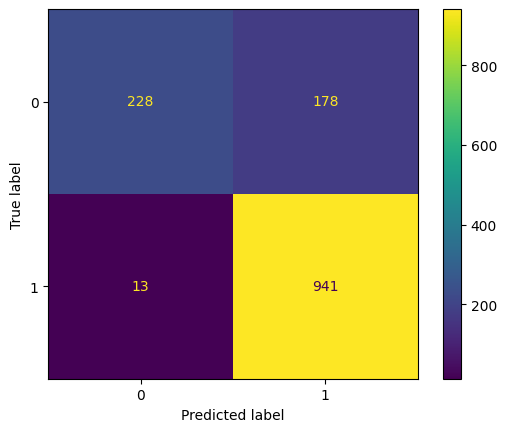

In [1006]:
matrix_rf = confusion_matrix(y_test, y_pred_rf)
ConfusionMatrixDisplay(matrix_rf).plot()

RANDOM FOREST - so skalovanim

In [1007]:
model = RandomForestClassifier()
grid_search_rf = GridSearchCV(model, param_grid,  cv=5, scoring='accuracy', n_jobs=8)
grid_search_rf.fit(X_train_scaled_rf, y_train)
print("Najlepší hyperparametre:", grid_search_rf.best_params_)
print("Najlepší skóre:", grid_search_rf.best_score_)

Najlepší hyperparametre: {'max_depth': 10, 'min_samples_leaf': 4, 'min_samples_split': 5, 'n_estimators': 100}
Najlepší skóre: 0.6973491641620507


In [1008]:
best_rf_model = grid_search_rf.best_estimator_
y_pred_train_rf = best_rf_model.predict(X_train_scaled_rf)

In [1009]:
print("Presnosť:", accuracy_score(y_train, y_pred_train_rf))
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train_rf))

Presnosť: 0.7370744010088273
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.72      0.18      0.28       935
           1       0.74      0.97      0.84      2237

    accuracy                           0.74      3172
   macro avg       0.73      0.57      0.56      3172
weighted avg       0.73      0.74      0.68      3172



In [1010]:
y_pred_rf = best_rf_model.predict(X_test_scaled_rf)

In [1011]:
results_list3_rf.append({
        'best_score': grid_search_rf.best_score_,
        'accuracy_train': accuracy_score(y_train, y_pred_train_rf),
    'accuracy_test': accuracy_score(y_test, y_pred_rf),
    'precision_train': precision_score(y_train, y_pred_train_rf, average='macro'),
    'precision_test': precision_score(y_test, y_pred_rf, average='macro'),
 'recall_train': recall_score(y_train, y_pred_train_rf, average='macro'),
 'recall_test': recall_score(y_test, y_pred_rf, average='macro'),
 'f1_train': f1_score(y_train, y_pred_train_rf, average='macro'),
 'f1_test': f1_score(y_test, y_pred_rf, average='macro')
        
    })

In [1012]:
print("Presnosť:", accuracy_score(y_test, y_pred_rf))
print("Klasifikačný report:\n", classification_report(y_test, y_pred_rf))

Presnosť: 0.6882352941176471
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.42      0.11      0.17       406
           1       0.71      0.94      0.81       954

    accuracy                           0.69      1360
   macro avg       0.56      0.52      0.49      1360
weighted avg       0.62      0.69      0.62      1360



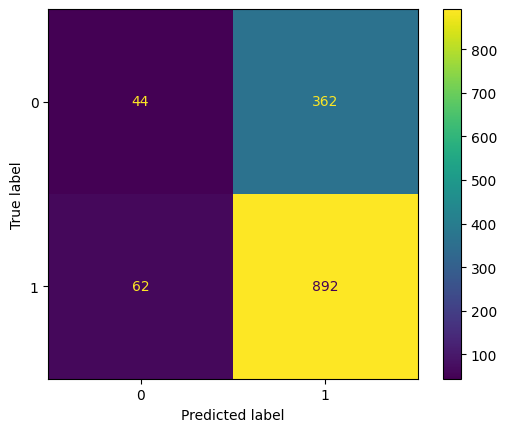

In [1013]:
matrix_rf = confusion_matrix(y_test, y_pred_rf)
ConfusionMatrixDisplay(matrix_rf).plot()

RANDOM FOREST - so skalovanim a ngram

In [1014]:
model = RandomForestClassifier(**grid_search_rf.best_params_)
# grid_search_rf = GridSearchCV(model, param_grid,  cv=5, scoring='accuracy', n_jobs=8)
model.fit(X_train_combined_scaled_rf, y_train)
# print("Najlepší hyperparametre:", grid_search_rf.best_params_)
# print("Najlepší skóre:", grid_search_rf.best_score_)

RandomForestClassifier(max_depth=10, min_samples_leaf=4, min_samples_split=5)

In [1015]:
y_pred_train_rf = model.predict(X_train_combined_scaled_rf)

In [1016]:
print("Presnosť:", accuracy_score(y_train, y_pred_train_rf))
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train_rf))

Presnosť: 0.9505044136191677
Klasifikačný report:
               precision    recall  f1-score   support

           0       1.00      0.83      0.91       935
           1       0.93      1.00      0.97      2237

    accuracy                           0.95      3172
   macro avg       0.97      0.92      0.94      3172
weighted avg       0.95      0.95      0.95      3172



In [1017]:
y_pred_rf = model.predict(X_test_combined_scaled_rf)

In [1018]:
results_list3_rf.append({
        'accuracy_train': accuracy_score(y_train, y_pred_train_rf),
    'accuracy_test': accuracy_score(y_test, y_pred_rf),
    'precision_train': precision_score(y_train, y_pred_train_rf, average='macro'),
    'precision_test': precision_score(y_test, y_pred_rf, average='macro'),
 'recall_train': recall_score(y_train, y_pred_train_rf, average='macro'),
 'recall_test': recall_score(y_test, y_pred_rf, average='macro'),
 'f1_train': f1_score(y_train, y_pred_train_rf, average='macro'),
 'f1_test': f1_score(y_test, y_pred_rf, average='macro')
        
    })

In [1019]:
print("Presnosť:", accuracy_score(y_test, y_pred_rf))
print("Klasifikačný report:\n", classification_report(y_test, y_pred_rf))

Presnosť: 0.8360294117647059
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.92      0.49      0.64       406
           1       0.82      0.98      0.89       954

    accuracy                           0.84      1360
   macro avg       0.87      0.74      0.77      1360
weighted avg       0.85      0.84      0.82      1360



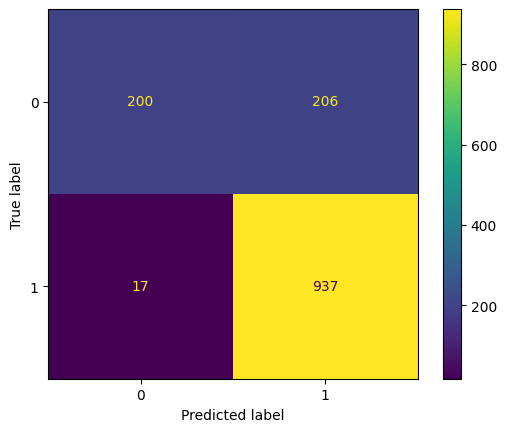

In [1020]:
matrix_rf = confusion_matrix(y_test, y_pred_rf)
ConfusionMatrixDisplay(matrix_rf).plot()

RANDOM FOREST - so skalovanim a tfidf ngram

In [1021]:
model = RandomForestClassifier(**grid_search_rf.best_params_)
# grid_search_rf = GridSearchCV(model, param_grid,  cv=5, scoring='accuracy', n_jobs=8)
model.fit(X_train_combined2_scaled_rf, y_train)
# print("Najlepší hyperparametre:", grid_search_rf.best_params_)
# print("Najlepší skóre:", grid_search_rf.best_score_)

RandomForestClassifier(max_depth=10, min_samples_leaf=4, min_samples_split=5)

In [1022]:
y_pred_train_rf = model.predict(X_train_combined2_scaled_rf)

In [1023]:
print("Presnosť:", accuracy_score(y_train, y_pred_train_rf))
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train_rf))

Presnosť: 0.9637452711223203
Klasifikačný report:
               precision    recall  f1-score   support

           0       1.00      0.88      0.93       935
           1       0.95      1.00      0.97      2237

    accuracy                           0.96      3172
   macro avg       0.98      0.94      0.95      3172
weighted avg       0.97      0.96      0.96      3172



In [1024]:
y_pred_rf = model.predict(X_test_combined2_scaled_rf)

In [1025]:
results_list3_rf.append({
        'accuracy_train': accuracy_score(y_train, y_pred_train_rf),
    'accuracy_test': accuracy_score(y_test, y_pred_rf),
    'precision_train': precision_score(y_train, y_pred_train_rf, average='macro'),
    'precision_test': precision_score(y_test, y_pred_rf, average='macro'),
 'recall_train': recall_score(y_train, y_pred_train_rf, average='macro'),
 'recall_test': recall_score(y_test, y_pred_rf, average='macro'),
 'f1_train': f1_score(y_train, y_pred_train_rf, average='macro'),
 'f1_test': f1_score(y_test, y_pred_rf, average='macro')
        
    })

In [1026]:
print("Presnosť:", accuracy_score(y_test, y_pred_rf))
print("Klasifikačný report:\n", classification_report(y_test, y_pred_rf))

Presnosť: 0.8382352941176471
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.90      0.51      0.65       406
           1       0.82      0.98      0.89       954

    accuracy                           0.84      1360
   macro avg       0.86      0.74      0.77      1360
weighted avg       0.85      0.84      0.82      1360



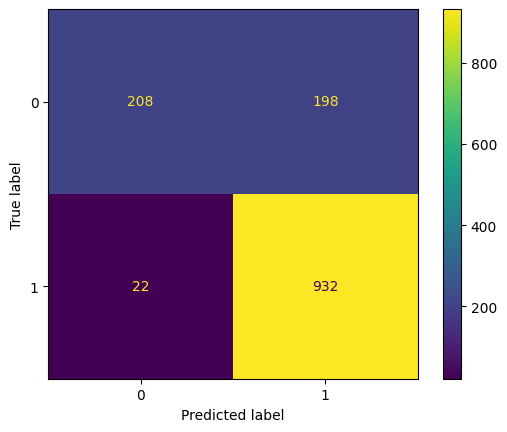

In [1027]:
matrix_rf = confusion_matrix(y_test, y_pred_rf)
ConfusionMatrixDisplay(matrix_rf).plot()

RANDOM FOREST - so skalovanim a word frequency

In [1028]:
model = RandomForestClassifier(**grid_search_rf.best_params_)
# grid_search_rf = GridSearchCV(model, param_grid,  cv=5, scoring='accuracy', n_jobs=8)
model.fit(X_train_combined3_scaled_rf, y_train)
# print("Najlepší hyperparametre:", grid_search_rf.best_params_)
# print("Najlepší skóre:", grid_search_rf.best_score_)

RandomForestClassifier(max_depth=10, min_samples_leaf=4, min_samples_split=5)

In [1029]:
y_pred_train_rf = model.predict(X_train_combined3_scaled_rf)

In [1030]:
print("Presnosť:", accuracy_score(y_train, y_pred_train_rf))
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train_rf))

Presnosť: 0.9713114754098361
Klasifikačný report:
               precision    recall  f1-score   support

           0       1.00      0.90      0.95       935
           1       0.96      1.00      0.98      2237

    accuracy                           0.97      3172
   macro avg       0.98      0.95      0.96      3172
weighted avg       0.97      0.97      0.97      3172



In [1031]:
y_pred_rf = model.predict(X_test_combined3_scaled_rf)

In [1032]:
results_list3_rf.append({
        'accuracy_train': accuracy_score(y_train, y_pred_train_rf),
    'accuracy_test': accuracy_score(y_test, y_pred_rf),
    'precision_train': precision_score(y_train, y_pred_train_rf, average='macro'),
    'precision_test': precision_score(y_test, y_pred_rf, average='macro'),
 'recall_train': recall_score(y_train, y_pred_train_rf, average='macro'),
 'recall_test': recall_score(y_test, y_pred_rf, average='macro'),
 'f1_train': f1_score(y_train, y_pred_train_rf, average='macro'),
 'f1_test': f1_score(y_test, y_pred_rf, average='macro')
        
    })


In [1033]:
print("Presnosť:", accuracy_score(y_test, y_pred_rf))
print("Klasifikačný report:\n", classification_report(y_test, y_pred_rf))

Presnosť: 0.8389705882352941
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.93      0.50      0.65       406
           1       0.82      0.98      0.90       954

    accuracy                           0.84      1360
   macro avg       0.88      0.74      0.77      1360
weighted avg       0.85      0.84      0.82      1360



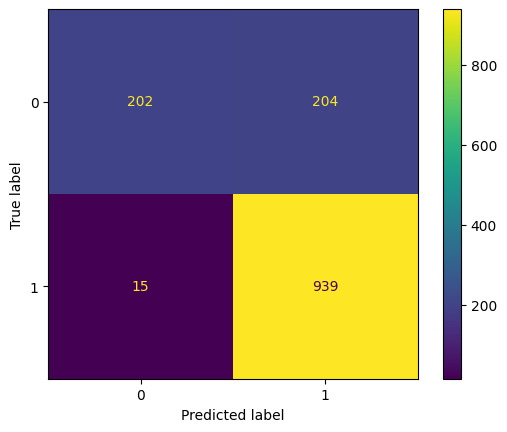

In [1034]:
matrix_rf = confusion_matrix(y_test, y_pred_rf)
ConfusionMatrixDisplay(matrix_rf).plot()

RANDOM FOREST - so skalovanim a tfidf word frequency

In [1035]:
model = RandomForestClassifier(**grid_search_rf.best_params_)
# grid_search_rf = GridSearchCV(model, param_grid,  cv=5, scoring='accuracy', n_jobs=8)
model.fit(X_train_combined4_scaled_rf, y_train)
# print("Najlepší hyperparametre:", grid_search_rf.best_params_)
# print("Najlepší skóre:", grid_search_rf.best_score_)

RandomForestClassifier(max_depth=10, min_samples_leaf=4, min_samples_split=5)

In [1036]:
y_pred_train_rf = model.predict(X_train_combined4_scaled_rf)

In [1037]:
print("Presnosť:", accuracy_score(y_train, y_pred_train_rf))
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train_rf))

Presnosť: 0.9467213114754098
Klasifikačný report:
               precision    recall  f1-score   support

           0       1.00      0.82      0.90       935
           1       0.93      1.00      0.96      2237

    accuracy                           0.95      3172
   macro avg       0.96      0.91      0.93      3172
weighted avg       0.95      0.95      0.95      3172



In [1038]:
y_pred_rf = model.predict(X_test_combined4_scaled_rf)

In [1039]:
results_list3_rf.append({
        'accuracy_train': accuracy_score(y_train, y_pred_train_rf),
    'accuracy_test': accuracy_score(y_test, y_pred_rf),
    'precision_train': precision_score(y_train, y_pred_train_rf, average='macro'),
    'precision_test': precision_score(y_test, y_pred_rf, average='macro'),
 'recall_train': recall_score(y_train, y_pred_train_rf, average='macro'),
 'recall_test': recall_score(y_test, y_pred_rf, average='macro'),
 'f1_train': f1_score(y_train, y_pred_train_rf, average='macro'),
 'f1_test': f1_score(y_test, y_pred_rf, average='macro')
        
    })


In [1040]:
print("Presnosť:", accuracy_score(y_test, y_pred_rf))
print("Klasifikačný report:\n", classification_report(y_test, y_pred_rf))

Presnosť: 0.8308823529411765
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.94      0.47      0.62       406
           1       0.81      0.99      0.89       954

    accuracy                           0.83      1360
   macro avg       0.87      0.73      0.76      1360
weighted avg       0.85      0.83      0.81      1360



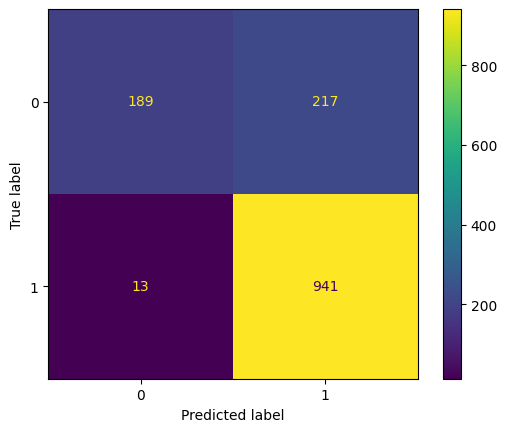

In [1041]:
matrix_rf = confusion_matrix(y_test, y_pred_rf)
ConfusionMatrixDisplay(matrix_rf).plot()

RANDOM FOREST - s osetrenymi outliermi a skalovanim

In [1042]:
model = RandomForestClassifier()
grid_search_rf = GridSearchCV(model, param_grid,  cv=5, scoring='accuracy', n_jobs=8)
grid_search_rf.fit(X_train_scal_out_rf, y_train)
print("Najlepší hyperparametre:", grid_search_rf.best_params_)
print("Najlepší skóre:", grid_search_rf.best_score_)

Najlepší hyperparametre: {'max_depth': 30, 'min_samples_leaf': 1, 'min_samples_split': 10, 'n_estimators': 100}
Najlepší skóre: 0.8931265058744629


In [1043]:
best_rf_model = grid_search_rf.best_estimator_
y_pred_train_rf = best_rf_model.predict(X_train_scal_out_rf)

In [1044]:
print("Presnosť:", accuracy_score(y_train, y_pred_train_rf))
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train_rf))

Presnosť: 0.9754098360655737
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.99      0.92      0.96       935
           1       0.97      1.00      0.98      2237

    accuracy                           0.98      3172
   macro avg       0.98      0.96      0.97      3172
weighted avg       0.98      0.98      0.98      3172



In [1045]:
y_pred_rf = best_rf_model.predict(X_test_scal_out_rf)

In [1046]:
results_list3_rf.append({
        'best_score': grid_search_rf.best_score_,
        'accuracy_train': accuracy_score(y_train, y_pred_train_rf),
    'accuracy_test': accuracy_score(y_test, y_pred_rf),
    'precision_train': precision_score(y_train, y_pred_train_rf, average='macro'),
    'precision_test': precision_score(y_test, y_pred_rf, average='macro'),
 'recall_train': recall_score(y_train, y_pred_train_rf, average='macro'),
 'recall_test': recall_score(y_test, y_pred_rf, average='macro'),
 'f1_train': f1_score(y_train, y_pred_train_rf, average='macro'),
 'f1_test': f1_score(y_test, y_pred_rf, average='macro')
        
    })

In [1047]:
print("Presnosť:", accuracy_score(y_test, y_pred_rf))
print("Klasifikačný report:\n", classification_report(y_test, y_pred_rf))

Presnosť: 0.8985294117647059
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.88      0.77      0.82       406
           1       0.91      0.95      0.93       954

    accuracy                           0.90      1360
   macro avg       0.89      0.86      0.87      1360
weighted avg       0.90      0.90      0.90      1360



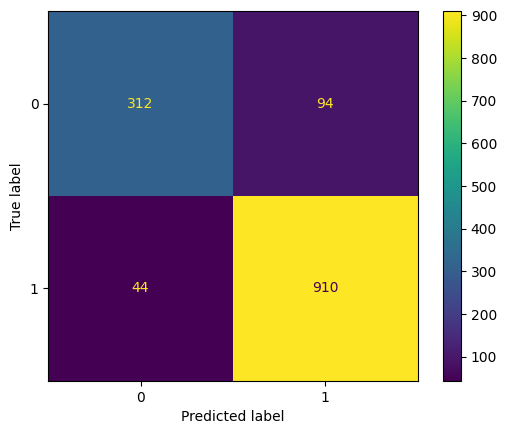

In [1048]:
matrix_rf = confusion_matrix(y_test, y_pred_rf)
ConfusionMatrixDisplay(matrix_rf).plot()

RANDOM FOREST - s osetrenymi outliermi a skalovanim a ngram

In [1049]:
model = RandomForestClassifier(**grid_search_rf.best_params_)
# grid_search_rf = GridSearchCV(model, param_grid,  cv=5, scoring='accuracy', n_jobs=8)
model.fit(X_train_combined_scal_out_rf, y_train)
# print("Najlepší hyperparametre:", grid_search_rf.best_params_)
# print("Najlepší skóre:", grid_search_rf.best_score_)

RandomForestClassifier(max_depth=30, min_samples_split=10)

In [1050]:
y_pred_train_rf = model.predict(X_train_combined_scal_out_rf)

In [1051]:
print("Presnosť:", accuracy_score(y_train, y_pred_train_rf))
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train_rf))

Presnosť: 0.9993694829760403
Klasifikačný report:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00       935
           1       1.00      1.00      1.00      2237

    accuracy                           1.00      3172
   macro avg       1.00      1.00      1.00      3172
weighted avg       1.00      1.00      1.00      3172



In [1052]:
y_pred_rf = model.predict(X_test_combined_scal_out_rf)

In [1053]:
results_list3_rf.append({
        'accuracy_train': accuracy_score(y_train, y_pred_train_rf),
    'accuracy_test': accuracy_score(y_test, y_pred_rf),
    'precision_train': precision_score(y_train, y_pred_train_rf, average='macro'),
    'precision_test': precision_score(y_test, y_pred_rf, average='macro'),
 'recall_train': recall_score(y_train, y_pred_train_rf, average='macro'),
 'recall_test': recall_score(y_test, y_pred_rf, average='macro'),
 'f1_train': f1_score(y_train, y_pred_train_rf, average='macro'),
 'f1_test': f1_score(y_test, y_pred_rf, average='macro')
        
    })

In [1054]:
print("Presnosť:", accuracy_score(y_test, y_pred_rf))
print("Klasifikačný report:\n", classification_report(y_test, y_pred_rf))

Presnosť: 0.8573529411764705
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.93      0.56      0.70       406
           1       0.84      0.98      0.91       954

    accuracy                           0.86      1360
   macro avg       0.89      0.77      0.80      1360
weighted avg       0.87      0.86      0.85      1360



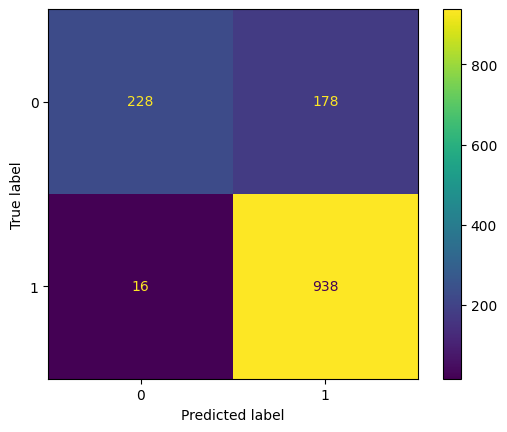

In [1055]:
matrix_rf = confusion_matrix(y_test, y_pred_rf)
ConfusionMatrixDisplay(matrix_rf).plot()

RANDOM FOREST - s osetrenymi outliermi a skalovanim a tfidf ngram

In [1056]:
model = RandomForestClassifier(**grid_search_rf.best_params_)
# grid_search_rf = GridSearchCV(model, param_grid,  cv=5, scoring='accuracy', n_jobs=8)
model.fit(X_train_combined2_scal_out_rf, y_train)
# print("Najlepší hyperparametre:", grid_search_rf.best_params_)
# print("Najlepší skóre:", grid_search_rf.best_score_)

RandomForestClassifier(max_depth=30, min_samples_split=10)

In [1057]:
y_pred_train_rf = model.predict(X_train_combined2_scal_out_rf)

In [1058]:
print("Presnosť:", accuracy_score(y_train, y_pred_train_rf))
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train_rf))

Presnosť: 1.0
Klasifikačný report:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00       935
           1       1.00      1.00      1.00      2237

    accuracy                           1.00      3172
   macro avg       1.00      1.00      1.00      3172
weighted avg       1.00      1.00      1.00      3172



In [1059]:
y_pred_rf = model.predict(X_test_combined2_scal_out_rf)

In [1060]:
results_list3_rf.append({
        'accuracy_train': accuracy_score(y_train, y_pred_train_rf),
    'accuracy_test': accuracy_score(y_test, y_pred_rf),
    'precision_train': precision_score(y_train, y_pred_train_rf, average='macro'),
    'precision_test': precision_score(y_test, y_pred_rf, average='macro'),
 'recall_train': recall_score(y_train, y_pred_train_rf, average='macro'),
 'recall_test': recall_score(y_test, y_pred_rf, average='macro'),
 'f1_train': f1_score(y_train, y_pred_train_rf, average='macro'),
 'f1_test': f1_score(y_test, y_pred_rf, average='macro')
        
    })

In [1061]:
print("Presnosť:", accuracy_score(y_test, y_pred_rf))
print("Klasifikačný report:\n", classification_report(y_test, y_pred_rf))

Presnosť: 0.850735294117647
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.91      0.55      0.69       406
           1       0.84      0.98      0.90       954

    accuracy                           0.85      1360
   macro avg       0.87      0.77      0.80      1360
weighted avg       0.86      0.85      0.84      1360



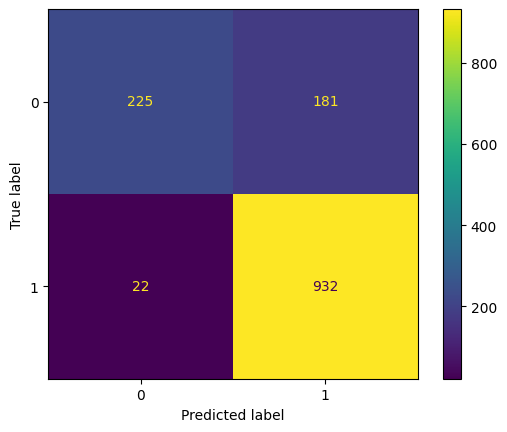

In [1062]:
matrix_rf = confusion_matrix(y_test, y_pred_rf)
ConfusionMatrixDisplay(matrix_rf).plot()

RANDOM FOREST - s osetrenymi outliermi a skalovanim a word frequency

In [1063]:
model = RandomForestClassifier(**grid_search_rf.best_params_)
# grid_search_rf = GridSearchCV(model, param_grid,  cv=5, scoring='accuracy', n_jobs=8)
model.fit(X_train_combined3_scal_out_rf, y_train)
# print("Najlepší hyperparametre:", grid_search_rf.best_params_)
# print("Najlepší skóre:", grid_search_rf.best_score_)

RandomForestClassifier(max_depth=30, min_samples_split=10)

In [1064]:
y_pred_train_rf = model.predict(X_train_combined3_scal_out_rf)

In [1065]:
print("Presnosť:", accuracy_score(y_train, y_pred_train_rf))
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train_rf))

Presnosť: 0.9993694829760403
Klasifikačný report:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00       935
           1       1.00      1.00      1.00      2237

    accuracy                           1.00      3172
   macro avg       1.00      1.00      1.00      3172
weighted avg       1.00      1.00      1.00      3172



In [1066]:
y_pred_rf = model.predict(X_test_combined3_scal_out_rf)

In [1067]:
results_list3_rf.append({
        'accuracy_train': accuracy_score(y_train, y_pred_train_rf),
    'accuracy_test': accuracy_score(y_test, y_pred_rf),
    'precision_train': precision_score(y_train, y_pred_train_rf, average='macro'),
    'precision_test': precision_score(y_test, y_pred_rf, average='macro'),
 'recall_train': recall_score(y_train, y_pred_train_rf, average='macro'),
 'recall_test': recall_score(y_test, y_pred_rf, average='macro'),
 'f1_train': f1_score(y_train, y_pred_train_rf, average='macro'),
 'f1_test': f1_score(y_test, y_pred_rf, average='macro')
        
    })

In [1068]:
print("Presnosť:", accuracy_score(y_test, y_pred_rf))
print("Klasifikačný report:\n", classification_report(y_test, y_pred_rf))

Presnosť: 0.8669117647058824
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.93      0.60      0.73       406
           1       0.85      0.98      0.91       954

    accuracy                           0.87      1360
   macro avg       0.89      0.79      0.82      1360
weighted avg       0.88      0.87      0.86      1360



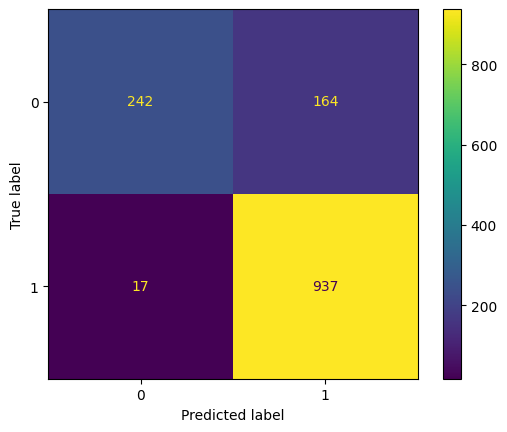

In [1069]:
matrix_rf = confusion_matrix(y_test, y_pred_rf)
ConfusionMatrixDisplay(matrix_rf).plot()

RANDOM FOREST - s osetrenymi outliermi a skalovanim a tfidf word frequency

In [1070]:
model = RandomForestClassifier(**grid_search_rf.best_params_)
# grid_search_rf = GridSearchCV(model, param_grid,  cv=5, scoring='accuracy', n_jobs=8)
model.fit(X_train_combined4_scal_out_rf, y_train)
# print("Najlepší hyperparametre:", grid_search_rf.best_params_)
# print("Najlepší skóre:", grid_search_rf.best_score_)

RandomForestClassifier(max_depth=30, min_samples_split=10)

In [1071]:
y_pred_train_rf = model.predict(X_train_combined4_scal_out_rf)

In [1072]:
print("Presnosť:", accuracy_score(y_train, y_pred_train_rf))
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train_rf))

Presnosť: 0.9996847414880202
Klasifikačný report:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00       935
           1       1.00      1.00      1.00      2237

    accuracy                           1.00      3172
   macro avg       1.00      1.00      1.00      3172
weighted avg       1.00      1.00      1.00      3172



In [1073]:
y_pred_rf = model.predict(X_test_combined4_scal_out_rf)

In [1074]:
results_list3_rf.append({
        'accuracy_train': accuracy_score(y_train, y_pred_train_rf),
    'accuracy_test': accuracy_score(y_test, y_pred_rf),
    'precision_train': precision_score(y_train, y_pred_train_rf, average='macro'),
    'precision_test': precision_score(y_test, y_pred_rf, average='macro'),
 'recall_train': recall_score(y_train, y_pred_train_rf, average='macro'),
 'recall_test': recall_score(y_test, y_pred_rf, average='macro'),
 'f1_train': f1_score(y_train, y_pred_train_rf, average='macro'),
 'f1_test': f1_score(y_test, y_pred_rf, average='macro')
        
    })


In [1075]:
print("Presnosť:", accuracy_score(y_test, y_pred_rf))
print("Klasifikačný report:\n", classification_report(y_test, y_pred_rf))

Presnosť: 0.8632352941176471
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.95      0.57      0.71       406
           1       0.84      0.99      0.91       954

    accuracy                           0.86      1360
   macro avg       0.90      0.78      0.81      1360
weighted avg       0.88      0.86      0.85      1360



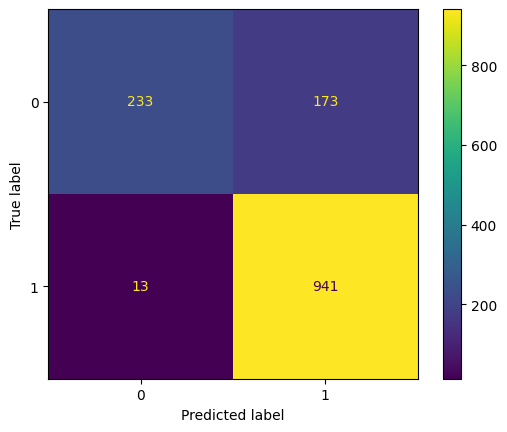

In [1076]:
matrix_rf = confusion_matrix(y_test, y_pred_rf)
ConfusionMatrixDisplay(matrix_rf).plot()

In [1077]:
results_rf3 = pd.DataFrame(results_list3_rf)
print(results_rf3)

    best_score  accuracy_train  accuracy_test  precision_train  \
0     0.696406        0.735183       0.697059         0.724932   
1          NaN        0.955233       0.833824         0.968835   
2          NaN        0.963115       0.836029         0.975149   
3          NaN        0.971311       0.832353         0.979673   
4          NaN        0.943253       0.837500         0.961799   
5     0.906050        0.999369       0.911765         0.999553   
6          NaN        0.999369       0.849265         0.999553   
7          NaN        1.000000       0.858824         1.000000   
8          NaN        0.999685       0.877206         0.999777   
9          NaN        0.999685       0.859559         0.999777   
10    0.697349        0.737074       0.688235         0.729443   
11         NaN        0.950504       0.836029         0.966750   
12         NaN        0.963745       0.838235         0.975136   
13         NaN        0.971311       0.838971         0.979673   
14        

Najvyššiu presnosť sme dosiahli pomocou datasetu s ošetrením outlierov. Niektoré presnosti sa nám znížili z dôvodu, že sme na nich nevykonali gridsearch a neboli efektívne hyperparametre spustené na nich. Preučenie sa na niektorých variantach znížilo.

GRADIENT BOOSTING CLASSIFIER - bez osetrenia outlierov a skalovania

In [1078]:
results_list3_gbm=[]

Určenie hyperparametrov, ktore budeme v grid search skúšať

In [1079]:
param_grid = {
    'n_estimators': [10, 50, 100, 200],  # Počet stromov v lese
    'max_depth': [None, 10, 20, 30, 40],  # Maximálna hĺbka stromu
    'min_samples_split': [2, 5, 10],  # Minimálny počet vzoriek potrebný na rozdelenie uzla
    'min_samples_leaf': [1, 2, 4]  # Minimálny počet vzoriek potrebný v listovom uzle
}

Grid search - vyskuša všetky kombinacie hyperparametrov a vyberie najlepší z nich podľa accuracy

In [1080]:
model = GradientBoostingClassifier()
grid_search_gbm = GridSearchCV(model, param_grid,  cv=5, scoring='accuracy', n_jobs=8)
grid_search_gbm.fit(X_train_gbm, y_train)
print("Najlepší hyperparametre:", grid_search_gbm.best_params_)
print("Najlepší skóre:", grid_search_gbm.best_score_)

Najlepší hyperparametre: {'max_depth': 10, 'min_samples_leaf': 1, 'min_samples_split': 5, 'n_estimators': 200}
Najlepší skóre: 0.7563069127400086


Predikovanie na trenovacich datach

In [1081]:
best_gbm_model = grid_search_gbm.best_estimator_
y_pred_train_gbm = best_gbm_model.predict(X_train_gbm)

In [1082]:
print("Presnosť:", accuracy_score(y_train, y_pred_train_gbm))
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train_gbm))

Presnosť: 1.0
Klasifikačný report:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00       935
           1       1.00      1.00      1.00      2237

    accuracy                           1.00      3172
   macro avg       1.00      1.00      1.00      3172
weighted avg       1.00      1.00      1.00      3172



Predikovanie na testovacich datach

In [1083]:
y_pred_gbm = best_gbm_model.predict(X_test_gbm)

In [1084]:
results_list3_gbm.append({
        'best_score': grid_search_gbm.best_score_,
        'accuracy_train': accuracy_score(y_train, y_pred_train_gbm),
    'accuracy_test': accuracy_score(y_test, y_pred_gbm),
    'precision_train': precision_score(y_train, y_pred_train_gbm, average='macro'),
    'precision_test': precision_score(y_test, y_pred_gbm, average='macro'),
 'recall_train': recall_score(y_train, y_pred_train_gbm, average='macro'),
 'recall_test': recall_score(y_test, y_pred_gbm, average='macro'),
 'f1_train': f1_score(y_train, y_pred_train_gbm, average='macro'),
 'f1_test': f1_score(y_test, y_pred_gbm, average='macro')
        
    })

In [1085]:
print("Presnosť:", accuracy_score(y_test, y_pred_gbm))
print("Klasifikačný report:\n", classification_report(y_test, y_pred_gbm))

Presnosť: 0.7580882352941176
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.66      0.40      0.49       406
           1       0.78      0.91      0.84       954

    accuracy                           0.76      1360
   macro avg       0.72      0.65      0.67      1360
weighted avg       0.74      0.76      0.74      1360



Vizualizácia výkonnosti modelu

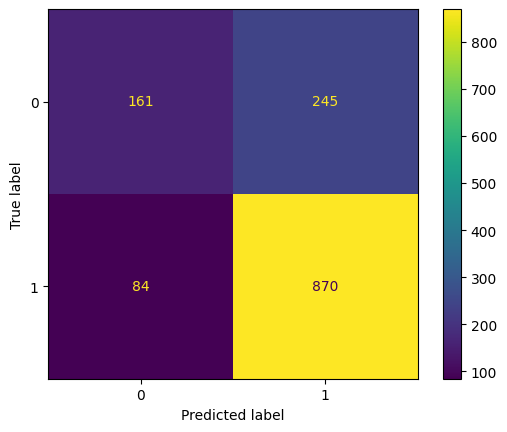

In [1086]:
matrix_gbm = confusion_matrix(y_test, y_pred_gbm)
ConfusionMatrixDisplay(matrix_gbm).plot()

GRADIENT BOOSTING CLASSIFIER - bez osetrenia outlierov a skalovania a ngram

In [1087]:
model = GradientBoostingClassifier(**grid_search_gbm.best_params_)
# grid_search_gbm = GridSearchCV(model, param_grid,  cv=5, scoring='accuracy', n_jobs=8)
model.fit(X_train_combined_gbm, y_train)
# print("Najlepší hyperparametre:", grid_search_gbm.best_params_)
# print("Najlepší skóre:", grid_search_gbm.best_score_)

GradientBoostingClassifier(max_depth=10, min_samples_split=5, n_estimators=200)

In [1088]:
y_pred_train_gbm = model.predict(X_train_combined_gbm)

In [1089]:
print("Presnosť:", accuracy_score(y_train, y_pred_train_gbm))
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train_gbm))

Presnosť: 1.0
Klasifikačný report:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00       935
           1       1.00      1.00      1.00      2237

    accuracy                           1.00      3172
   macro avg       1.00      1.00      1.00      3172
weighted avg       1.00      1.00      1.00      3172



In [1090]:
y_pred_gbm = model.predict(X_test_combined_gbm)

In [1091]:
results_list3_gbm.append({
        'accuracy_train': accuracy_score(y_train, y_pred_train_gbm),
    'accuracy_test': accuracy_score(y_test, y_pred_gbm),
    'precision_train': precision_score(y_train, y_pred_train_gbm, average='macro'),
    'precision_test': precision_score(y_test, y_pred_gbm, average='macro'),
 'recall_train': recall_score(y_train, y_pred_train_gbm, average='macro'),
 'recall_test': recall_score(y_test, y_pred_gbm, average='macro'),
 'f1_train': f1_score(y_train, y_pred_train_gbm, average='macro'),
 'f1_test': f1_score(y_test, y_pred_gbm, average='macro')
        
    })

In [1092]:
print("Presnosť:", accuracy_score(y_test, y_pred_gbm))
print("Klasifikačný report:\n", classification_report(y_test, y_pred_gbm))

Presnosť: 0.8948529411764706
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.87      0.76      0.81       406
           1       0.90      0.95      0.93       954

    accuracy                           0.89      1360
   macro avg       0.89      0.86      0.87      1360
weighted avg       0.89      0.89      0.89      1360



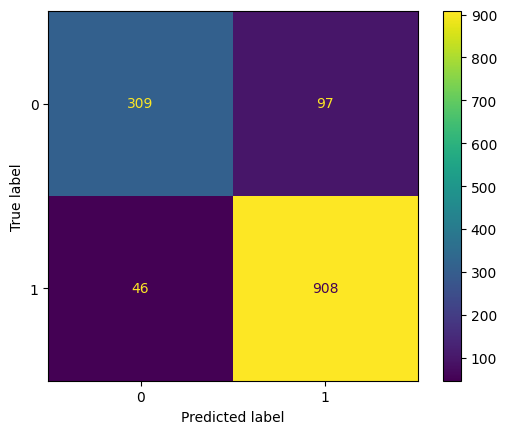

In [1093]:
matrix_gbm = confusion_matrix(y_test, y_pred_gbm)
ConfusionMatrixDisplay(matrix_gbm).plot()

GRADIENT BOOSTING CLASSIFIER - bez osetrenia outlierov a skalovania a tfidf ngram

In [1094]:
model = GradientBoostingClassifier(**grid_search_gbm.best_params_)
# grid_search_gbm = GridSearchCV(model, param_grid,  cv=5, scoring='accuracy', n_jobs=8)
model.fit(X_train_combined2_gbm, y_train)
# print("Najlepší hyperparametre:", grid_search_gbm.best_params_)
# print("Najlepší skóre:", grid_search_gbm.best_score_)

GradientBoostingClassifier(max_depth=10, min_samples_split=5, n_estimators=200)

In [1095]:
y_pred_train_gbm = model.predict(X_train_combined2_gbm)

In [1096]:
print("Presnosť:", accuracy_score(y_train, y_pred_train_gbm))
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train_gbm))

Presnosť: 1.0
Klasifikačný report:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00       935
           1       1.00      1.00      1.00      2237

    accuracy                           1.00      3172
   macro avg       1.00      1.00      1.00      3172
weighted avg       1.00      1.00      1.00      3172



In [1097]:
y_pred_gbm = model.predict(X_test_combined2_gbm)

In [1098]:
results_list3_gbm.append({
        'accuracy_train': accuracy_score(y_train, y_pred_train_gbm),
    'accuracy_test': accuracy_score(y_test, y_pred_gbm),
    'precision_train': precision_score(y_train, y_pred_train_gbm, average='macro'),
    'precision_test': precision_score(y_test, y_pred_gbm, average='macro'),
 'recall_train': recall_score(y_train, y_pred_train_gbm, average='macro'),
 'recall_test': recall_score(y_test, y_pred_gbm, average='macro'),
 'f1_train': f1_score(y_train, y_pred_train_gbm, average='macro'),
 'f1_test': f1_score(y_test, y_pred_gbm, average='macro')
        
    })

In [1099]:
print("Presnosť:", accuracy_score(y_test, y_pred_gbm))
print("Klasifikačný report:\n", classification_report(y_test, y_pred_gbm))

Presnosť: 0.8897058823529411
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.86      0.75      0.80       406
           1       0.90      0.95      0.92       954

    accuracy                           0.89      1360
   macro avg       0.88      0.85      0.86      1360
weighted avg       0.89      0.89      0.89      1360



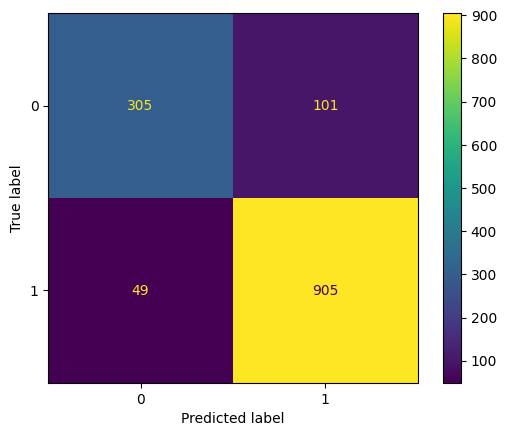

In [1100]:
matrix_gbm = confusion_matrix(y_test, y_pred_gbm)
ConfusionMatrixDisplay(matrix_gbm).plot()

GRADIENT BOOSTING CLASSIFIER - bez osetrenia outlierov a skalovania a word frequency

In [1101]:
model = GradientBoostingClassifier(**grid_search_gbm.best_params_)
# grid_search_gbm = GridSearchCV(model, param_grid,  cv=5, scoring='accuracy', n_jobs=8)
model.fit(X_train_combined3_gbm, y_train)
# print("Najlepší hyperparametre:", grid_search_gbm.best_params_)
# print("Najlepší skóre:", grid_search_gbm.best_score_)

GradientBoostingClassifier(max_depth=10, min_samples_split=5, n_estimators=200)

In [1102]:
y_pred_train_gbm = model.predict(X_train_combined3_gbm)

In [1103]:
print("Presnosť:", accuracy_score(y_train, y_pred_train_gbm))
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train_gbm))

Presnosť: 1.0
Klasifikačný report:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00       935
           1       1.00      1.00      1.00      2237

    accuracy                           1.00      3172
   macro avg       1.00      1.00      1.00      3172
weighted avg       1.00      1.00      1.00      3172



In [1104]:
y_pred_gbm = model.predict(X_test_combined3_gbm)

In [1105]:
results_list3_gbm.append({
        'accuracy_train': accuracy_score(y_train, y_pred_train_gbm),
    'accuracy_test': accuracy_score(y_test, y_pred_gbm),
    'precision_train': precision_score(y_train, y_pred_train_gbm, average='macro'),
    'precision_test': precision_score(y_test, y_pred_gbm, average='macro'),
 'recall_train': recall_score(y_train, y_pred_train_gbm, average='macro'),
 'recall_test': recall_score(y_test, y_pred_gbm, average='macro'),
 'f1_train': f1_score(y_train, y_pred_train_gbm, average='macro'),
 'f1_test': f1_score(y_test, y_pred_gbm, average='macro')
        
    })

In [1106]:
print("Presnosť:", accuracy_score(y_test, y_pred_gbm))
print("Klasifikačný report:\n", classification_report(y_test, y_pred_gbm))

Presnosť: 0.8823529411764706
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.85      0.74      0.79       406
           1       0.89      0.94      0.92       954

    accuracy                           0.88      1360
   macro avg       0.87      0.84      0.85      1360
weighted avg       0.88      0.88      0.88      1360



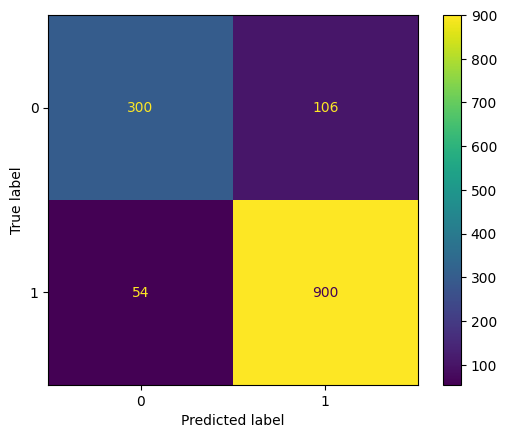

In [1107]:
matrix_gbm = confusion_matrix(y_test, y_pred_gbm)
ConfusionMatrixDisplay(matrix_gbm).plot()

GRADIENT BOOSTING CLASSIFIER - bez osetrenia outlierov a skalovania a tfidf word frequency

In [1108]:
model = GradientBoostingClassifier(**grid_search_gbm.best_params_)
# grid_search_gbm = GridSearchCV(model, param_grid,  cv=5, scoring='accuracy', n_jobs=8)
model.fit(X_train_combined4_gbm, y_train)
# print("Najlepší hyperparametre:", grid_search_gbm.best_params_)
# print("Najlepší skóre:", grid_search_gbm.best_score_)

GradientBoostingClassifier(max_depth=10, min_samples_split=5, n_estimators=200)

In [1109]:
y_pred_train_gbm = model.predict(X_train_combined4_gbm)

In [1110]:
print("Presnosť:", accuracy_score(y_train, y_pred_train_gbm))
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train_gbm))

Presnosť: 1.0
Klasifikačný report:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00       935
           1       1.00      1.00      1.00      2237

    accuracy                           1.00      3172
   macro avg       1.00      1.00      1.00      3172
weighted avg       1.00      1.00      1.00      3172



In [1111]:
y_pred_gbm = model.predict(X_test_combined4_gbm)

In [1112]:
results_list3_gbm.append({
        'accuracy_train': accuracy_score(y_train, y_pred_train_gbm),
    'accuracy_test': accuracy_score(y_test, y_pred_gbm),
    'precision_train': precision_score(y_train, y_pred_train_gbm, average='macro'),
    'precision_test': precision_score(y_test, y_pred_gbm, average='macro'),
 'recall_train': recall_score(y_train, y_pred_train_gbm, average='macro'),
 'recall_test': recall_score(y_test, y_pred_gbm, average='macro'),
 'f1_train': f1_score(y_train, y_pred_train_gbm, average='macro'),
 'f1_test': f1_score(y_test, y_pred_gbm, average='macro')
        
    })

In [1113]:
print("Presnosť:", accuracy_score(y_test, y_pred_gbm))
print("Klasifikačný report:\n", classification_report(y_test, y_pred_gbm))

Presnosť: 0.8860294117647058
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.83      0.77      0.80       406
           1       0.91      0.94      0.92       954

    accuracy                           0.89      1360
   macro avg       0.87      0.85      0.86      1360
weighted avg       0.88      0.89      0.88      1360



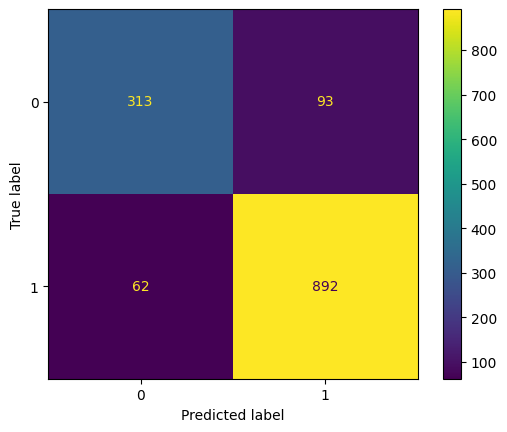

In [1114]:
matrix_gbm = confusion_matrix(y_test, y_pred_gbm)
ConfusionMatrixDisplay(matrix_gbm).plot()

GRADIENT BOOSTING CLASSIFIER - s osetrenim outlierov

In [1115]:
model = GradientBoostingClassifier()
grid_search_gbm = GridSearchCV(model, param_grid,  cv=5, scoring='accuracy', n_jobs=8)
grid_search_gbm.fit(X_train_out_gbm, y_train)
print("Najlepší hyperparametre:", grid_search_gbm.best_params_)
print("Najlepší skóre:", grid_search_gbm.best_score_)

Najlepší hyperparametre: {'max_depth': 30, 'min_samples_leaf': 4, 'min_samples_split': 10, 'n_estimators': 200}
Najlepší skóre: 0.9224451675401774


In [1116]:
best_gbm_model = grid_search_gbm.best_estimator_
y_pred_train_gbm = best_gbm_model.predict(X_train_out_gbm)

In [1117]:
print("Presnosť:", accuracy_score(y_train, y_pred_train_gbm))
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train_gbm))

Presnosť: 1.0
Klasifikačný report:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00       935
           1       1.00      1.00      1.00      2237

    accuracy                           1.00      3172
   macro avg       1.00      1.00      1.00      3172
weighted avg       1.00      1.00      1.00      3172



In [1118]:
y_pred_gbm = best_gbm_model.predict(X_test_out_gbm)

In [1119]:
results_list3_gbm.append({
        'best_score': grid_search_gbm.best_score_,
        'accuracy_train': accuracy_score(y_train, y_pred_train_gbm),
    'accuracy_test': accuracy_score(y_test, y_pred_gbm),
    'precision_train': precision_score(y_train, y_pred_train_gbm, average='macro'),
    'precision_test': precision_score(y_test, y_pred_gbm, average='macro'),
 'recall_train': recall_score(y_train, y_pred_train_gbm, average='macro'),
 'recall_test': recall_score(y_test, y_pred_gbm, average='macro'),
 'f1_train': f1_score(y_train, y_pred_train_gbm, average='macro'),
 'f1_test': f1_score(y_test, y_pred_gbm, average='macro')
        
    })

In [1120]:
print("Presnosť:", accuracy_score(y_test, y_pred_gbm))
print("Klasifikačný report:\n", classification_report(y_test, y_pred_gbm))

Presnosť: 0.9220588235294118
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.91      0.82      0.86       406
           1       0.92      0.97      0.95       954

    accuracy                           0.92      1360
   macro avg       0.92      0.89      0.90      1360
weighted avg       0.92      0.92      0.92      1360



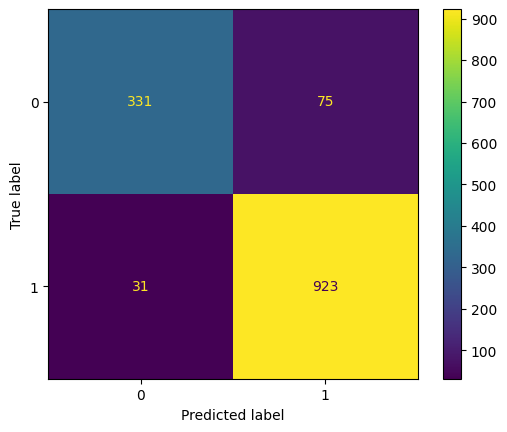

In [1121]:
matrix_gbm = confusion_matrix(y_test, y_pred_gbm)
ConfusionMatrixDisplay(matrix_gbm).plot()

GRADIENT BOOSTING CLASSIFIER - s osetrenim outlierov a ngram

In [1122]:
model = GradientBoostingClassifier(**grid_search_gbm.best_params_)
# grid_search_gbm = GridSearchCV(model, param_grid,  cv=5, scoring='accuracy', n_jobs=8)
model.fit(X_train_combined_out_gbm, y_train)
# print("Najlepší hyperparametre:", grid_search_gbm.best_params_)
# print("Najlepší skóre:", grid_search_gbm.best_score_)

GradientBoostingClassifier(max_depth=30, min_samples_leaf=4,
                           min_samples_split=10, n_estimators=200)

In [1123]:
y_pred_train_gbm = model.predict(X_train_combined_out_gbm)

In [1124]:
print("Presnosť:", accuracy_score(y_train, y_pred_train_gbm))
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train_gbm))

Presnosť: 1.0
Klasifikačný report:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00       935
           1       1.00      1.00      1.00      2237

    accuracy                           1.00      3172
   macro avg       1.00      1.00      1.00      3172
weighted avg       1.00      1.00      1.00      3172



In [1125]:
y_pred_gbm = model.predict(X_test_combined_out_gbm)

In [1126]:
results_list3_gbm.append({
        'accuracy_train': accuracy_score(y_train, y_pred_train_gbm),
    'accuracy_test': accuracy_score(y_test, y_pred_gbm),
    'precision_train': precision_score(y_train, y_pred_train_gbm, average='macro'),
    'precision_test': precision_score(y_test, y_pred_gbm, average='macro'),
 'recall_train': recall_score(y_train, y_pred_train_gbm, average='macro'),
 'recall_test': recall_score(y_test, y_pred_gbm, average='macro'),
 'f1_train': f1_score(y_train, y_pred_train_gbm, average='macro'),
 'f1_test': f1_score(y_test, y_pred_gbm, average='macro')
        
    })

In [1127]:
print("Presnosť:", accuracy_score(y_test, y_pred_gbm))
print("Klasifikačný report:\n", classification_report(y_test, y_pred_gbm))

Presnosť: 0.9308823529411765
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.93      0.83      0.88       406
           1       0.93      0.97      0.95       954

    accuracy                           0.93      1360
   macro avg       0.93      0.90      0.91      1360
weighted avg       0.93      0.93      0.93      1360



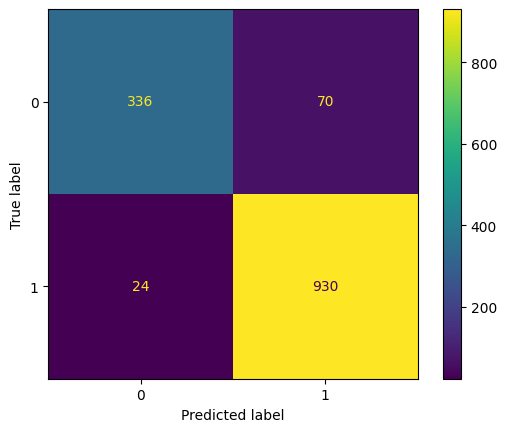

In [1128]:
matrix_gbm = confusion_matrix(y_test, y_pred_gbm)
ConfusionMatrixDisplay(matrix_gbm).plot()

GRADIENT BOOSTING CLASSIFIER - s osetrenim outlierov a tfidf ngram

In [1129]:
model = GradientBoostingClassifier(**grid_search_gbm.best_params_)
# grid_search_gbm = GridSearchCV(model, param_grid,  cv=5, scoring='accuracy', n_jobs=8)
model.fit(X_train_combined2_out_gbm, y_train)
# print("Najlepší hyperparametre:", grid_search_gbm.best_params_)
# print("Najlepší skóre:", grid_search_gbm.best_score_)

GradientBoostingClassifier(max_depth=30, min_samples_leaf=4,
                           min_samples_split=10, n_estimators=200)

In [1130]:
y_pred_train_gbm = model.predict(X_train_combined2_out_gbm)

In [1131]:
print("Presnosť:", accuracy_score(y_train, y_pred_train_gbm))
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train_gbm))

Presnosť: 1.0
Klasifikačný report:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00       935
           1       1.00      1.00      1.00      2237

    accuracy                           1.00      3172
   macro avg       1.00      1.00      1.00      3172
weighted avg       1.00      1.00      1.00      3172



In [1132]:
y_pred_gbm = model.predict(X_test_combined2_out_gbm)

In [1133]:
results_list3_gbm.append({
        'accuracy_train': accuracy_score(y_train, y_pred_train_gbm),
    'accuracy_test': accuracy_score(y_test, y_pred_gbm),
    'precision_train': precision_score(y_train, y_pred_train_gbm, average='macro'),
    'precision_test': precision_score(y_test, y_pred_gbm, average='macro'),
 'recall_train': recall_score(y_train, y_pred_train_gbm, average='macro'),
 'recall_test': recall_score(y_test, y_pred_gbm, average='macro'),
 'f1_train': f1_score(y_train, y_pred_train_gbm, average='macro'),
 'f1_test': f1_score(y_test, y_pred_gbm, average='macro')
        
    })

In [1134]:
print("Presnosť:", accuracy_score(y_test, y_pred_gbm))
print("Klasifikačný report:\n", classification_report(y_test, y_pred_gbm))

Presnosť: 0.9213235294117647
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.92      0.80      0.86       406
           1       0.92      0.97      0.95       954

    accuracy                           0.92      1360
   macro avg       0.92      0.89      0.90      1360
weighted avg       0.92      0.92      0.92      1360



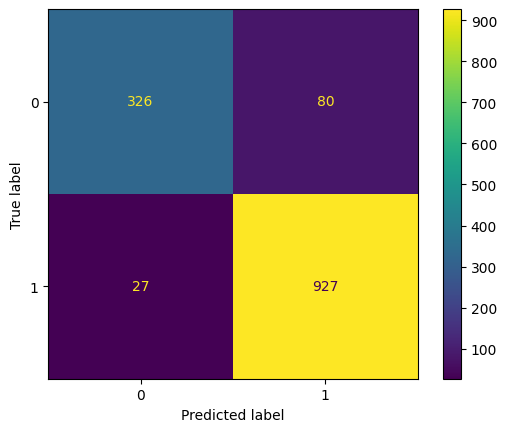

In [1135]:
matrix_gbm = confusion_matrix(y_test, y_pred_gbm)
ConfusionMatrixDisplay(matrix_gbm).plot()

GRADIENT BOOSTING CLASSIFIER - s osetrenim outlierov a word frequency

In [1136]:
model = GradientBoostingClassifier(**grid_search_gbm.best_params_)
# grid_search_gbm = GridSearchCV(model, param_grid,  cv=5, scoring='accuracy', n_jobs=8)
model.fit(X_train_combined3_out_gbm, y_train)
# print("Najlepší hyperparametre:", grid_search_gbm.best_params_)
# print("Najlepší skóre:", grid_search_gbm.best_score_)

GradientBoostingClassifier(max_depth=30, min_samples_leaf=4,
                           min_samples_split=10, n_estimators=200)

In [1137]:
y_pred_train_gbm = model.predict(X_train_combined3_out_gbm)

In [1138]:
print("Presnosť:", accuracy_score(y_train, y_pred_train_gbm))
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train_gbm))

Presnosť: 1.0
Klasifikačný report:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00       935
           1       1.00      1.00      1.00      2237

    accuracy                           1.00      3172
   macro avg       1.00      1.00      1.00      3172
weighted avg       1.00      1.00      1.00      3172



In [1139]:
y_pred_gbm = model.predict(X_test_combined3_out_gbm)

In [1140]:
results_list3_gbm.append({
        'accuracy_train': accuracy_score(y_train, y_pred_train_gbm),
    'accuracy_test': accuracy_score(y_test, y_pred_gbm),
    'precision_train': precision_score(y_train, y_pred_train_gbm, average='macro'),
    'precision_test': precision_score(y_test, y_pred_gbm, average='macro'),
 'recall_train': recall_score(y_train, y_pred_train_gbm, average='macro'),
 'recall_test': recall_score(y_test, y_pred_gbm, average='macro'),
 'f1_train': f1_score(y_train, y_pred_train_gbm, average='macro'),
 'f1_test': f1_score(y_test, y_pred_gbm, average='macro')
        
    })

In [1141]:
print("Presnosť:", accuracy_score(y_test, y_pred_gbm))
print("Klasifikačný report:\n", classification_report(y_test, y_pred_gbm))

Presnosť: 0.9375
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.92      0.87      0.89       406
           1       0.94      0.97      0.96       954

    accuracy                           0.94      1360
   macro avg       0.93      0.92      0.92      1360
weighted avg       0.94      0.94      0.94      1360



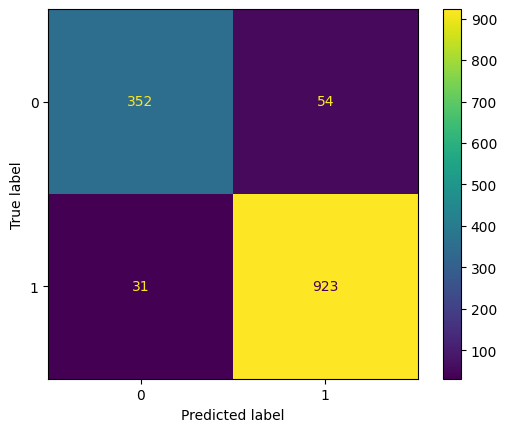

In [1142]:
matrix_gbm = confusion_matrix(y_test, y_pred_gbm)
ConfusionMatrixDisplay(matrix_gbm).plot()

GRADIENT BOOSTING CLASSIFIER - s osetrenim outlierov a tfidf word frequency

In [1143]:
model = GradientBoostingClassifier(**grid_search_gbm.best_params_)
# grid_search_gbm = GridSearchCV(model, param_grid,  cv=5, scoring='accuracy', n_jobs=8)
model.fit(X_train_combined4_out_gbm, y_train)
# print("Najlepší hyperparametre:", grid_search_gbm.best_params_)
# print("Najlepší skóre:", grid_search_gbm.best_score_)

GradientBoostingClassifier(max_depth=30, min_samples_leaf=4,
                           min_samples_split=10, n_estimators=200)

In [1144]:
y_pred_train_gbm = model.predict(X_train_combined4_out_gbm)

In [1145]:
print("Presnosť:", accuracy_score(y_train, y_pred_train_gbm))
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train_gbm))

Presnosť: 1.0
Klasifikačný report:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00       935
           1       1.00      1.00      1.00      2237

    accuracy                           1.00      3172
   macro avg       1.00      1.00      1.00      3172
weighted avg       1.00      1.00      1.00      3172



In [1146]:
y_pred_gbm = model.predict(X_test_combined4_out_gbm)

In [1147]:
results_list3_gbm.append({
        'accuracy_train': accuracy_score(y_train, y_pred_train_gbm),
    'accuracy_test': accuracy_score(y_test, y_pred_gbm),
    'precision_train': precision_score(y_train, y_pred_train_gbm, average='macro'),
    'precision_test': precision_score(y_test, y_pred_gbm, average='macro'),
 'recall_train': recall_score(y_train, y_pred_train_gbm, average='macro'),
 'recall_test': recall_score(y_test, y_pred_gbm, average='macro'),
 'f1_train': f1_score(y_train, y_pred_train_gbm, average='macro'),
 'f1_test': f1_score(y_test, y_pred_gbm, average='macro')
        
    })

In [1148]:
print("Presnosť:", accuracy_score(y_test, y_pred_gbm))
print("Klasifikačný report:\n", classification_report(y_test, y_pred_gbm))

Presnosť: 0.9345588235294118
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.93      0.84      0.89       406
           1       0.94      0.97      0.95       954

    accuracy                           0.93      1360
   macro avg       0.93      0.91      0.92      1360
weighted avg       0.93      0.93      0.93      1360



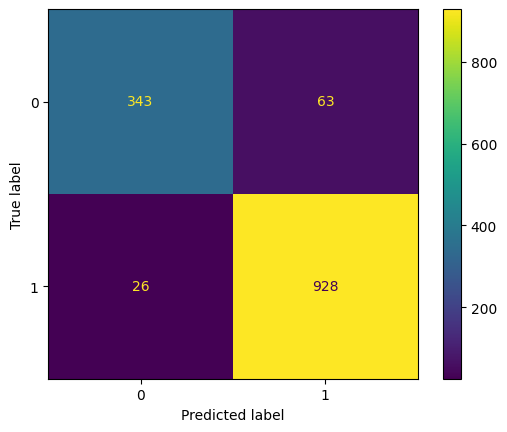

In [1149]:
matrix_gbm = confusion_matrix(y_test, y_pred_gbm)
ConfusionMatrixDisplay(matrix_gbm).plot()

GRADIENT BOOSTING CLASSIFIER - so skalovanim

In [1150]:
model = GradientBoostingClassifier()
grid_search_gbm = GridSearchCV(model, param_grid,  cv=5, scoring='accuracy', n_jobs=8)
grid_search_gbm.fit(X_train_scaled_gbm, y_train)
print("Najlepší hyperparametre:", grid_search_gbm.best_params_)
print("Najlepší skóre:", grid_search_gbm.best_score_)

Najlepší hyperparametre: {'max_depth': 10, 'min_samples_leaf': 4, 'min_samples_split': 10, 'n_estimators': 100}
Najlepší skóre: 0.730767778633349


In [1151]:
best_gbm_model = grid_search_gbm.best_estimator_
y_pred_train_gbm = best_gbm_model.predict(X_train_scaled_gbm)

In [1152]:
print("Presnosť:", accuracy_score(y_train, y_pred_train_gbm))
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train_gbm))

Presnosť: 0.9996847414880202
Klasifikačný report:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00       935
           1       1.00      1.00      1.00      2237

    accuracy                           1.00      3172
   macro avg       1.00      1.00      1.00      3172
weighted avg       1.00      1.00      1.00      3172



In [1153]:
y_pred_gbm = best_gbm_model.predict(X_test_scaled_gbm)

In [1154]:
results_list3_gbm.append({
        'best_score': grid_search_gbm.best_score_,
        'accuracy_train': accuracy_score(y_train, y_pred_train_gbm),
    'accuracy_test': accuracy_score(y_test, y_pred_gbm),
    'precision_train': precision_score(y_train, y_pred_train_gbm, average='macro'),
    'precision_test': precision_score(y_test, y_pred_gbm, average='macro'),
 'recall_train': recall_score(y_train, y_pred_train_gbm, average='macro'),
 'recall_test': recall_score(y_test, y_pred_gbm, average='macro'),
 'f1_train': f1_score(y_train, y_pred_train_gbm, average='macro'),
 'f1_test': f1_score(y_test, y_pred_gbm, average='macro')
        
    })

In [1155]:
print("Presnosť:", accuracy_score(y_test, y_pred_gbm))
print("Klasifikačný report:\n", classification_report(y_test, y_pred_gbm))

Presnosť: 0.7264705882352941
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.56      0.39      0.46       406
           1       0.77      0.87      0.82       954

    accuracy                           0.73      1360
   macro avg       0.67      0.63      0.64      1360
weighted avg       0.71      0.73      0.71      1360



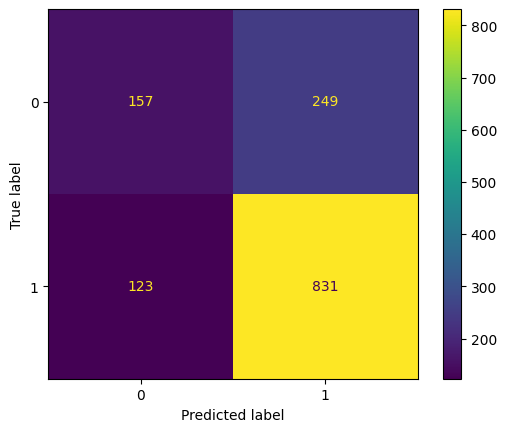

In [1156]:
matrix_gbm = confusion_matrix(y_test, y_pred_gbm)
ConfusionMatrixDisplay(matrix_gbm).plot()

GRADIENT BOOSTING CLASSIFIER - so skalovanim a ngram

In [1157]:
model = GradientBoostingClassifier(**grid_search_gbm.best_params_)
# grid_search_gbm = GridSearchCV(model, param_grid,  cv=5, scoring='accuracy', n_jobs=8)
model.fit(X_train_combined_scaled_gbm, y_train)
# print("Najlepší hyperparametre:", grid_search_gbm.best_params_)
# print("Najlepší skóre:", grid_search_gbm.best_score_)

GradientBoostingClassifier(max_depth=10, min_samples_leaf=4,
                           min_samples_split=10)

In [1158]:
y_pred_train_gbm = model.predict(X_train_combined_scaled_gbm)

In [1159]:
print("Presnosť:", accuracy_score(y_train, y_pred_train_gbm))
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train_gbm))

Presnosť: 1.0
Klasifikačný report:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00       935
           1       1.00      1.00      1.00      2237

    accuracy                           1.00      3172
   macro avg       1.00      1.00      1.00      3172
weighted avg       1.00      1.00      1.00      3172



In [1160]:
y_pred_gbm = model.predict(X_test_combined_scaled_gbm)

In [1161]:
results_list3_gbm.append({
        'accuracy_train': accuracy_score(y_train, y_pred_train_gbm),
    'accuracy_test': accuracy_score(y_test, y_pred_gbm),
    'precision_train': precision_score(y_train, y_pred_train_gbm, average='macro'),
    'precision_test': precision_score(y_test, y_pred_gbm, average='macro'),
 'recall_train': recall_score(y_train, y_pred_train_gbm, average='macro'),
 'recall_test': recall_score(y_test, y_pred_gbm, average='macro'),
 'f1_train': f1_score(y_train, y_pred_train_gbm, average='macro'),
 'f1_test': f1_score(y_test, y_pred_gbm, average='macro')
        
    })

In [1162]:
print("Presnosť:", accuracy_score(y_test, y_pred_gbm))
print("Klasifikačný report:\n", classification_report(y_test, y_pred_gbm))

Presnosť: 0.8875
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.87      0.74      0.80       406
           1       0.89      0.95      0.92       954

    accuracy                           0.89      1360
   macro avg       0.88      0.84      0.86      1360
weighted avg       0.89      0.89      0.88      1360



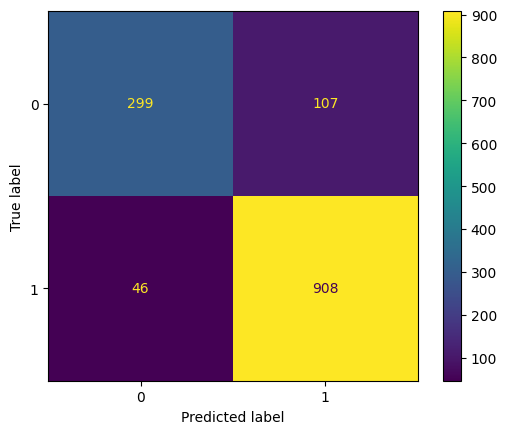

In [1163]:
matrix_gbm = confusion_matrix(y_test, y_pred_gbm)
ConfusionMatrixDisplay(matrix_gbm).plot()

GRADIENT BOOSTING CLASSIFIER - so skalovanim a tfidf ngram

In [1164]:
model = GradientBoostingClassifier(**grid_search_gbm.best_params_)
# grid_search_gbm = GridSearchCV(model, param_grid,  cv=5, scoring='accuracy', n_jobs=8)
model.fit(X_train_combined2_scaled_gbm, y_train)
# print("Najlepší hyperparametre:", grid_search_gbm.best_params_)
# print("Najlepší skóre:", grid_search_gbm.best_score_)

GradientBoostingClassifier(max_depth=10, min_samples_leaf=4,
                           min_samples_split=10)

In [1165]:
y_pred_train_gbm = model.predict(X_train_combined2_scaled_gbm)

In [1166]:
print("Presnosť:", accuracy_score(y_train, y_pred_train_gbm))
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train_gbm))

Presnosť: 1.0
Klasifikačný report:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00       935
           1       1.00      1.00      1.00      2237

    accuracy                           1.00      3172
   macro avg       1.00      1.00      1.00      3172
weighted avg       1.00      1.00      1.00      3172



In [1167]:
y_pred_gbm = model.predict(X_test_combined2_scaled_gbm)

In [1168]:
results_list3_gbm.append({
        'accuracy_train': accuracy_score(y_train, y_pred_train_gbm),
    'accuracy_test': accuracy_score(y_test, y_pred_gbm),
    'precision_train': precision_score(y_train, y_pred_train_gbm, average='macro'),
    'precision_test': precision_score(y_test, y_pred_gbm, average='macro'),
 'recall_train': recall_score(y_train, y_pred_train_gbm, average='macro'),
 'recall_test': recall_score(y_test, y_pred_gbm, average='macro'),
 'f1_train': f1_score(y_train, y_pred_train_gbm, average='macro'),
 'f1_test': f1_score(y_test, y_pred_gbm, average='macro')
        
    })

In [1169]:
print("Presnosť:", accuracy_score(y_test, y_pred_gbm))
print("Klasifikačný report:\n", classification_report(y_test, y_pred_gbm))

Presnosť: 0.8823529411764706
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.85      0.74      0.79       406
           1       0.90      0.94      0.92       954

    accuracy                           0.88      1360
   macro avg       0.87      0.84      0.85      1360
weighted avg       0.88      0.88      0.88      1360



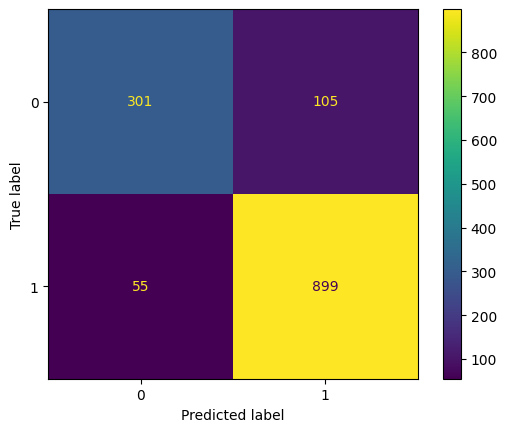

In [1170]:
matrix_gbm = confusion_matrix(y_test, y_pred_gbm)
ConfusionMatrixDisplay(matrix_gbm).plot()

GRADIENT BOOSTING CLASSIFIER - so skalovanim a word frequency

In [1171]:
model = GradientBoostingClassifier(**grid_search_gbm.best_params_)
# grid_search_gbm = GridSearchCV(model, param_grid,  cv=5, scoring='accuracy', n_jobs=8)
model.fit(X_train_combined3_scaled_gbm, y_train)
# print("Najlepší hyperparametre:", grid_search_gbm.best_params_)
# print("Najlepší skóre:", grid_search_gbm.best_score_)

GradientBoostingClassifier(max_depth=10, min_samples_leaf=4,
                           min_samples_split=10)

In [1172]:
y_pred_train_gbm = model.predict(X_train_combined3_scaled_gbm)

In [1173]:
print("Presnosť:", accuracy_score(y_train, y_pred_train_gbm))
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train_gbm))

Presnosť: 1.0
Klasifikačný report:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00       935
           1       1.00      1.00      1.00      2237

    accuracy                           1.00      3172
   macro avg       1.00      1.00      1.00      3172
weighted avg       1.00      1.00      1.00      3172



In [1174]:
y_pred_gbm = model.predict(X_test_combined3_scaled_gbm)

In [1175]:
results_list3_gbm.append({
        'accuracy_train': accuracy_score(y_train, y_pred_train_gbm),
    'accuracy_test': accuracy_score(y_test, y_pred_gbm),
    'precision_train': precision_score(y_train, y_pred_train_gbm, average='macro'),
    'precision_test': precision_score(y_test, y_pred_gbm, average='macro'),
 'recall_train': recall_score(y_train, y_pred_train_gbm, average='macro'),
 'recall_test': recall_score(y_test, y_pred_gbm, average='macro'),
 'f1_train': f1_score(y_train, y_pred_train_gbm, average='macro'),
 'f1_test': f1_score(y_test, y_pred_gbm, average='macro')
        
    })


In [1176]:
print("Presnosť:", accuracy_score(y_test, y_pred_gbm))
print("Klasifikačný report:\n", classification_report(y_test, y_pred_gbm))

Presnosť: 0.8867647058823529
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.86      0.74      0.80       406
           1       0.90      0.95      0.92       954

    accuracy                           0.89      1360
   macro avg       0.88      0.85      0.86      1360
weighted avg       0.89      0.89      0.88      1360



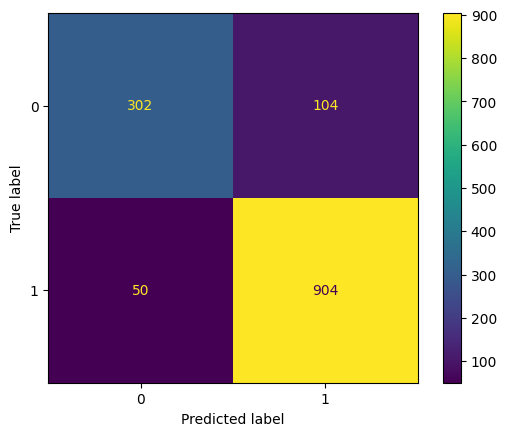

In [1177]:
matrix_gbm = confusion_matrix(y_test, y_pred_gbm)
ConfusionMatrixDisplay(matrix_gbm).plot()

GRADIENT BOOSTING CLASSIFIER - so skalovanim a tfidf word frequency

In [1178]:
model = GradientBoostingClassifier(**grid_search_gbm.best_params_)
# grid_search_gbm = GridSearchCV(model, param_grid,  cv=5, scoring='accuracy', n_jobs=8)
model.fit(X_train_combined4_scaled_gbm, y_train)
# print("Najlepší hyperparametre:", grid_search_gbm.best_params_)
# print("Najlepší skóre:", grid_search_gbm.best_score_)

GradientBoostingClassifier(max_depth=10, min_samples_leaf=4,
                           min_samples_split=10)

In [1179]:
y_pred_train_gbm = model.predict(X_train_combined4_scaled_gbm)

In [1180]:
print("Presnosť:", accuracy_score(y_train, y_pred_train_gbm))
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train_gbm))

Presnosť: 1.0
Klasifikačný report:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00       935
           1       1.00      1.00      1.00      2237

    accuracy                           1.00      3172
   macro avg       1.00      1.00      1.00      3172
weighted avg       1.00      1.00      1.00      3172



In [1181]:
y_pred_gbm = model.predict(X_test_combined4_scaled_gbm)

In [1182]:
results_list3_gbm.append({
        'accuracy_train': accuracy_score(y_train, y_pred_train_gbm),
    'accuracy_test': accuracy_score(y_test, y_pred_gbm),
    'precision_train': precision_score(y_train, y_pred_train_gbm, average='macro'),
    'precision_test': precision_score(y_test, y_pred_gbm, average='macro'),
 'recall_train': recall_score(y_train, y_pred_train_gbm, average='macro'),
 'recall_test': recall_score(y_test, y_pred_gbm, average='macro'),
 'f1_train': f1_score(y_train, y_pred_train_gbm, average='macro'),
 'f1_test': f1_score(y_test, y_pred_gbm, average='macro')
        
    })


In [1183]:
print("Presnosť:", accuracy_score(y_test, y_pred_gbm))
print("Klasifikačný report:\n", classification_report(y_test, y_pred_gbm))

Presnosť: 0.8867647058823529
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.85      0.75      0.80       406
           1       0.90      0.95      0.92       954

    accuracy                           0.89      1360
   macro avg       0.88      0.85      0.86      1360
weighted avg       0.89      0.89      0.88      1360



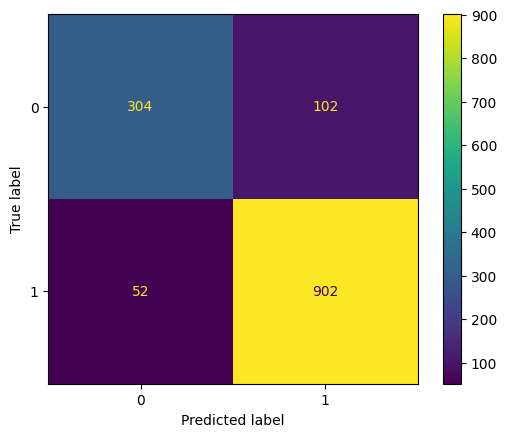

In [1184]:
matrix_gbm = confusion_matrix(y_test, y_pred_gbm)
ConfusionMatrixDisplay(matrix_gbm).plot()

GRADIENT BOOSTING CLASSIFIER - s osetrenim outlierov a skalovanim

In [1185]:
model = GradientBoostingClassifier()
grid_search_gbm = GridSearchCV(model, param_grid,  cv=5, scoring='accuracy', n_jobs=8)
grid_search_gbm.fit(X_train_scal_out_gbm, y_train)
print("Najlepší hyperparametre:", grid_search_gbm.best_params_)
print("Najlepší skóre:", grid_search_gbm.best_score_)

Najlepší hyperparametre: {'max_depth': 10, 'min_samples_leaf': 4, 'min_samples_split': 5, 'n_estimators': 200}
Najlepší skóre: 0.9221297101269281


In [1186]:
best_gbm_model = grid_search_gbm.best_estimator_
y_pred_train_gbm = best_gbm_model.predict(X_train_scal_out_gbm)

In [1187]:
print("Presnosť:", accuracy_score(y_train, y_pred_train_gbm))
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train_gbm))

Presnosť: 1.0
Klasifikačný report:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00       935
           1       1.00      1.00      1.00      2237

    accuracy                           1.00      3172
   macro avg       1.00      1.00      1.00      3172
weighted avg       1.00      1.00      1.00      3172



In [1188]:
y_pred_gbm = best_gbm_model.predict(X_test_scal_out_gbm)

In [1189]:
results_list3_gbm.append({
        'best_score': grid_search_gbm.best_score_,
        'accuracy_train': accuracy_score(y_train, y_pred_train_gbm),
    'accuracy_test': accuracy_score(y_test, y_pred_gbm),
    'precision_train': precision_score(y_train, y_pred_train_gbm, average='macro'),
    'precision_test': precision_score(y_test, y_pred_gbm, average='macro'),
 'recall_train': recall_score(y_train, y_pred_train_gbm, average='macro'),
 'recall_test': recall_score(y_test, y_pred_gbm, average='macro'),
 'f1_train': f1_score(y_train, y_pred_train_gbm, average='macro'),
 'f1_test': f1_score(y_test, y_pred_gbm, average='macro')
        
    })

In [1190]:
print("Presnosť:", accuracy_score(y_test, y_pred_gbm))
print("Klasifikačný report:\n", classification_report(y_test, y_pred_gbm))

Presnosť: 0.9176470588235294
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.91      0.80      0.85       406
           1       0.92      0.97      0.94       954

    accuracy                           0.92      1360
   macro avg       0.92      0.88      0.90      1360
weighted avg       0.92      0.92      0.92      1360



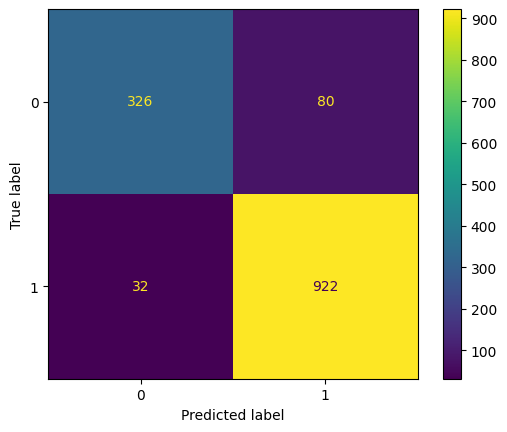

In [1191]:
matrix_gbm = confusion_matrix(y_test, y_pred_gbm)
ConfusionMatrixDisplay(matrix_gbm).plot()

GRADIENT BOOSTING CLASSIFIER - s osetrenim outlierov a skalovanim a ngram

In [1192]:
model = GradientBoostingClassifier(**grid_search_gbm.best_params_)
# grid_search_gbm = GridSearchCV(model, param_grid,  cv=5, scoring='accuracy', n_jobs=8)
model.fit(X_train_combined_scal_out_gbm, y_train)
# print("Najlepší hyperparametre:", grid_search_gbm.best_params_)
# print("Najlepší skóre:", grid_search_gbm.best_score_)

GradientBoostingClassifier(max_depth=10, min_samples_leaf=4,
                           min_samples_split=5, n_estimators=200)

In [1193]:
y_pred_train_gbm = model.predict(X_train_combined_scal_out_gbm)

In [1194]:
print("Presnosť:", accuracy_score(y_train, y_pred_train_gbm))
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train_gbm))

Presnosť: 1.0
Klasifikačný report:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00       935
           1       1.00      1.00      1.00      2237

    accuracy                           1.00      3172
   macro avg       1.00      1.00      1.00      3172
weighted avg       1.00      1.00      1.00      3172



In [1195]:
y_pred_gbm = model.predict(X_test_combined_scal_out_gbm)

In [1196]:
results_list3_gbm.append({
        'accuracy_train': accuracy_score(y_train, y_pred_train_gbm),
    'accuracy_test': accuracy_score(y_test, y_pred_gbm),
    'precision_train': precision_score(y_train, y_pred_train_gbm, average='macro'),
    'precision_test': precision_score(y_test, y_pred_gbm, average='macro'),
 'recall_train': recall_score(y_train, y_pred_train_gbm, average='macro'),
 'recall_test': recall_score(y_test, y_pred_gbm, average='macro'),
 'f1_train': f1_score(y_train, y_pred_train_gbm, average='macro'),
 'f1_test': f1_score(y_test, y_pred_gbm, average='macro')
        
    })

In [1197]:
print("Presnosť:", accuracy_score(y_test, y_pred_gbm))
print("Klasifikačný report:\n", classification_report(y_test, y_pred_gbm))

Presnosť: 0.9426470588235294
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.95      0.86      0.90       406
           1       0.94      0.98      0.96       954

    accuracy                           0.94      1360
   macro avg       0.94      0.92      0.93      1360
weighted avg       0.94      0.94      0.94      1360



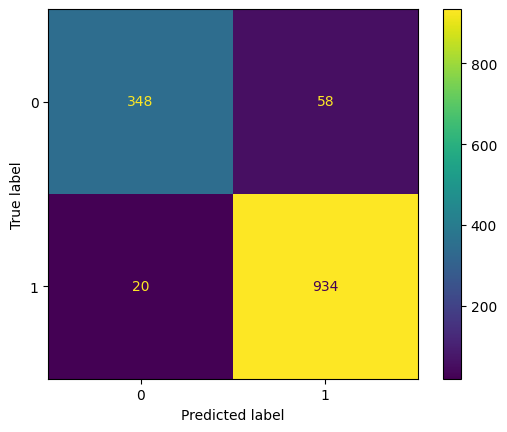

In [1198]:
matrix_gbm = confusion_matrix(y_test, y_pred_gbm)
ConfusionMatrixDisplay(matrix_gbm).plot()

GRADIENT BOOSTING CLASSIFIER - s osetrenim outlierov a skalovanim a tfidf ngram

In [1199]:
model = GradientBoostingClassifier(**grid_search_gbm.best_params_)
# grid_search_gbm = GridSearchCV(model, param_grid,  cv=5, scoring='accuracy', n_jobs=8)
model.fit(X_train_combined2_scal_out_gbm, y_train)
# print("Najlepší hyperparametre:", grid_search_gbm.best_params_)
# print("Najlepší skóre:", grid_search_gbm.best_score_)

GradientBoostingClassifier(max_depth=10, min_samples_leaf=4,
                           min_samples_split=5, n_estimators=200)

In [1200]:
y_pred_train_gbm = model.predict(X_train_combined2_scal_out_gbm)

In [1201]:
print("Presnosť:", accuracy_score(y_train, y_pred_train_gbm))
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train_gbm))

Presnosť: 1.0
Klasifikačný report:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00       935
           1       1.00      1.00      1.00      2237

    accuracy                           1.00      3172
   macro avg       1.00      1.00      1.00      3172
weighted avg       1.00      1.00      1.00      3172



In [1202]:
y_pred_gbm = model.predict(X_test_combined2_scal_out_gbm)

In [1203]:
results_list3_gbm.append({
        'accuracy_train': accuracy_score(y_train, y_pred_train_gbm),
    'accuracy_test': accuracy_score(y_test, y_pred_gbm),
    'precision_train': precision_score(y_train, y_pred_train_gbm, average='macro'),
    'precision_test': precision_score(y_test, y_pred_gbm, average='macro'),
 'recall_train': recall_score(y_train, y_pred_train_gbm, average='macro'),
 'recall_test': recall_score(y_test, y_pred_gbm, average='macro'),
 'f1_train': f1_score(y_train, y_pred_train_gbm, average='macro'),
 'f1_test': f1_score(y_test, y_pred_gbm, average='macro')
        
    })

In [1204]:
print("Presnosť:", accuracy_score(y_test, y_pred_gbm))
print("Klasifikačný report:\n", classification_report(y_test, y_pred_gbm))

Presnosť: 0.9352941176470588
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.94      0.83      0.89       406
           1       0.93      0.98      0.95       954

    accuracy                           0.94      1360
   macro avg       0.94      0.91      0.92      1360
weighted avg       0.94      0.94      0.93      1360



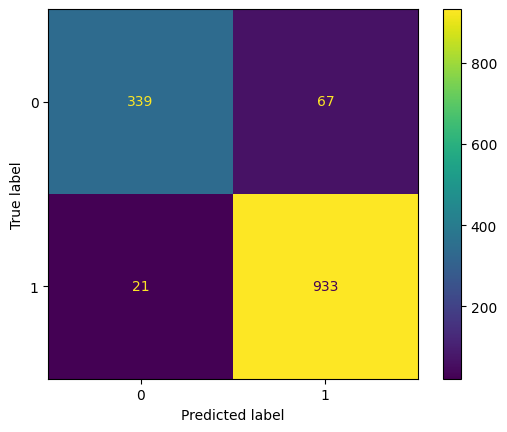

In [1205]:
matrix_gbm = confusion_matrix(y_test, y_pred_gbm)
ConfusionMatrixDisplay(matrix_gbm).plot()

GRADIENT BOOSTING CLASSIFIER - s osetrenim outlierov a skalovanim a word frequency

In [1206]:
model = GradientBoostingClassifier(**grid_search_gbm.best_params_)
# grid_search_gbm = GridSearchCV(model, param_grid,  cv=5, scoring='accuracy', n_jobs=8)
model.fit(X_train_combined3_scal_out_gbm, y_train)
# print("Najlepší hyperparametre:", grid_search_gbm.best_params_)
# print("Najlepší skóre:", grid_search_gbm.best_score_)

GradientBoostingClassifier(max_depth=10, min_samples_leaf=4,
                           min_samples_split=5, n_estimators=200)

In [1207]:
y_pred_train_gbm = model.predict(X_train_combined3_scal_out_gbm)

In [1208]:
print("Presnosť:", accuracy_score(y_train, y_pred_train_gbm))
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train_gbm))

Presnosť: 1.0
Klasifikačný report:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00       935
           1       1.00      1.00      1.00      2237

    accuracy                           1.00      3172
   macro avg       1.00      1.00      1.00      3172
weighted avg       1.00      1.00      1.00      3172



In [1209]:
y_pred_gbm = model.predict(X_test_combined3_scal_out_gbm)

In [1210]:
results_list3_gbm.append({
        'accuracy_train': accuracy_score(y_train, y_pred_train_gbm),
    'accuracy_test': accuracy_score(y_test, y_pred_gbm),
    'precision_train': precision_score(y_train, y_pred_train_gbm, average='macro'),
    'precision_test': precision_score(y_test, y_pred_gbm, average='macro'),
 'recall_train': recall_score(y_train, y_pred_train_gbm, average='macro'),
 'recall_test': recall_score(y_test, y_pred_gbm, average='macro'),
 'f1_train': f1_score(y_train, y_pred_train_gbm, average='macro'),
 'f1_test': f1_score(y_test, y_pred_gbm, average='macro')
        
    })


In [1211]:
print("Presnosť:", accuracy_score(y_test, y_pred_gbm))
print("Klasifikačný report:\n", classification_report(y_test, y_pred_gbm))

Presnosť: 0.9433823529411764
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.94      0.87      0.90       406
           1       0.95      0.98      0.96       954

    accuracy                           0.94      1360
   macro avg       0.94      0.92      0.93      1360
weighted avg       0.94      0.94      0.94      1360



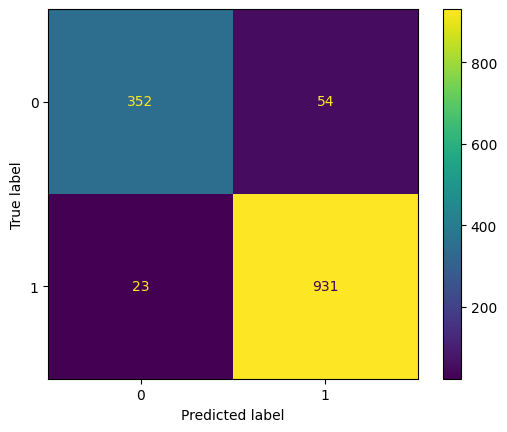

In [1212]:
matrix_gbm = confusion_matrix(y_test, y_pred_gbm)
ConfusionMatrixDisplay(matrix_gbm).plot()

GRADIENT BOOSTING CLASSIFIER - s osetrenim outlierov a skalovanim a tfidf word frequency

In [1213]:
model = GradientBoostingClassifier(**grid_search_gbm.best_params_)
# grid_search_gbm = GridSearchCV(model, param_grid,  cv=5, scoring='accuracy', n_jobs=8)
model.fit(X_train_combined4_scal_out_gbm, y_train)
# print("Najlepší hyperparametre:", grid_search_gbm.best_params_)
# print("Najlepší skóre:", grid_search_gbm.best_score_)

GradientBoostingClassifier(max_depth=10, min_samples_leaf=4,
                           min_samples_split=5, n_estimators=200)

In [1214]:
y_pred_train_gbm = model.predict(X_train_combined4_scal_out_gbm)

In [1215]:
print("Presnosť:", accuracy_score(y_train, y_pred_train_gbm))
print("Klasifikačný report:\n", classification_report(y_train, y_pred_train_gbm))

Presnosť: 1.0
Klasifikačný report:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00       935
           1       1.00      1.00      1.00      2237

    accuracy                           1.00      3172
   macro avg       1.00      1.00      1.00      3172
weighted avg       1.00      1.00      1.00      3172



In [1216]:
y_pred_gbm = model.predict(X_test_combined4_scal_out_gbm)

In [1217]:
results_list3_gbm.append({
        'accuracy_train': accuracy_score(y_train, y_pred_train_gbm),
    'accuracy_test': accuracy_score(y_test, y_pred_gbm),
    'precision_train': precision_score(y_train, y_pred_train_gbm, average='macro'),
    'precision_test': precision_score(y_test, y_pred_gbm, average='macro'),
 'recall_train': recall_score(y_train, y_pred_train_gbm, average='macro'),
 'recall_test': recall_score(y_test, y_pred_gbm, average='macro'),
 'f1_train': f1_score(y_train, y_pred_train_gbm, average='macro'),
 'f1_test': f1_score(y_test, y_pred_gbm, average='macro')
        
    })


In [1218]:
print("Presnosť:", accuracy_score(y_test, y_pred_gbm))
print("Klasifikačný report:\n", classification_report(y_test, y_pred_gbm))

Presnosť: 0.9345588235294118
Klasifikačný report:
               precision    recall  f1-score   support

           0       0.95      0.83      0.88       406
           1       0.93      0.98      0.95       954

    accuracy                           0.93      1360
   macro avg       0.94      0.90      0.92      1360
weighted avg       0.94      0.93      0.93      1360



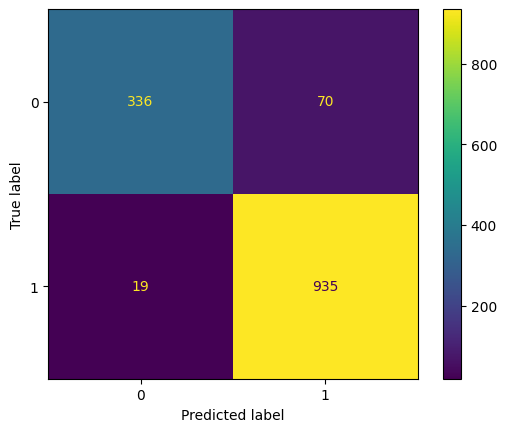

In [1219]:
matrix_gbm = confusion_matrix(y_test, y_pred_gbm)
ConfusionMatrixDisplay(matrix_gbm).plot()

In [1220]:
results_gbm3 = pd.DataFrame(results_list3_gbm)
print(results_gbm3)

    best_score  accuracy_train  accuracy_test  precision_train  \
0     0.756307        1.000000       0.758088         1.000000   
1          NaN        1.000000       0.894853         1.000000   
2          NaN        1.000000       0.889706         1.000000   
3          NaN        1.000000       0.882353         1.000000   
4          NaN        1.000000       0.886029         1.000000   
5     0.922445        1.000000       0.922059         1.000000   
6          NaN        1.000000       0.930882         1.000000   
7          NaN        1.000000       0.921324         1.000000   
8          NaN        1.000000       0.937500         1.000000   
9          NaN        1.000000       0.934559         1.000000   
10    0.730768        0.999685       0.726471         0.999777   
11         NaN        1.000000       0.887500         1.000000   
12         NaN        1.000000       0.882353         1.000000   
13         NaN        1.000000       0.886765         1.000000   
14        

Najvyššiu presnosť sme dosiahli pomocou datasetu s ošetrením outlierov a skálovaním a s frekvenciou slov. Niektoré presnosti sa nám znížili z dôvodu, že sme na nich nevykonali gridsearch a neboli efektívne hyperparametre spustené na nich. Niektoré sa znížili z toho, že sa model preučil.

In [1221]:
row_names = ['bez osetrenia outlierov a skalovania', 'bez osetrenia outlierov a skalovania s ngramami', 'bez osetrenia outlierov a skalovania s tfidf ngramami', 'bez osetrenia outlierov a skalovania s word frequency', 'bez osetrenia outlierov a skalovania s tfidf word frequency', 's osetrenim outlierov', 's osetrenim outlierov a s ngramami', 's osetrenim outlierov a s tfidf ngramami', 's osetrenim outlierov a s word frequency', 's osetrenim outlierov a s tfidf word frequency', 'so skalovanim','so skalovanim a s ngramami','so skalovanim a s tfidf ngramami', 'so skalovanim a s word frequency','so skalovanim a s tfidf word frequency','s osetrenim outlierov a skalovanim','s osetrenim outlierov a skalovanim a s ngramami','s osetrenim outlierov a skalovanim a s tfidf ngramami', 's osetrenim outlierov a skalovanim a s word frequency','s osetrenim outlierov a skalovanim a s tfidf word frequency']  # Zoznam by mal obsahovať meno pre každý riadok

# Priradenie zoznamu mien do indexu DataFrame
results_svc1.index = row_names
results_svc2.index = row_names
results_svc3.index = row_names

results_rf1.index = row_names
results_rf2.index = row_names
results_rf3.index = row_names

results_gbm1.index = row_names
results_gbm2.index = row_names
results_gbm3.index = row_names

OHODNOTENIE

Podľa výsledkov nižšie môžeme vidieť, že najlepšie výsledky nám poskytol model Gradient Boosting Maschine a to s verziami datasetu, kde boli ošetrený outlieri. Podľa tabuliek vidíme, že ošetrenie outlierov malo naväčší vplyv na accuracy. Naopak najhoršie výsledky mal čistý dataset bez ošetrenia outlierov a škálovania a bez pridania textových reprezentácií vo všetkých modeloch. Najhorší model na určovanie pohlavia v mojej práci bol SVC, tým sa mi najmenšie accuracy podarilo dosiahnúť.

In [1222]:
results_svc1

,accuracy_train,accuracy_test,precision_train,precision_test,recall_train,recall_test,f1_train,f1_test
bez osetrenia outlierov a skalovania,0.705233,0.701471,0.705233,0.701471,1.000000,1.000000,0.827140,0.824546
bez osetrenia outlierov a skalovania s ngramami,0.757881,0.760294,0.749745,0.748811,0.985695,0.990566,0.851680,0.852888
bez osetrenia outlierov a skalovania s tfidf ngramami,0.705233,0.701471,0.705233,0.701471,1.000000,1.000000,0.827140,0.824546
bez osetrenia outlierov a skalovania s word frequency,0.746217,0.751471,0.739625,0.741002,0.987930,0.992662,0.845933,0.848566
bez osetrenia outlierov a skalovania s tfidf word frequency,0.705233,0.701471,0.705233,0.701471,1.000000,1.000000,0.827140,0.824546
s osetrenim outlierov,0.705233,0.701471,0.705233,0.701471,1.000000,1.000000,0.827140,0.824546
s osetrenim outlierov a s ngramami,0.768916,0.766176,0.758775,0.754808,0.985695,0.987421,0.857476,0.855586
s osetrenim outlierov a s tfidf ngramami,0.705233,0.701471,0.705233,0.701471,1.000000,1.000000,0.827140,0.824546
s osetrenim outlierov a s word frequency,0.762295,0.759559,0.752125,0.749007,0.988824,0.988470,0.854384,0.852237
s osetrenim outlierov a s tfidf word frequency,0.705233,0.701471,0.705233,0.701471,1.000000,1.000000,0.827140,0.824546


In [1223]:
results_svc2

,accuracy_train,accuracy_test,precision_train,precision_test,recall_train,recall_test,f1_train,f1_test
bez osetrenia outlierov a skalovania,0.724779,0.725000,0.727031,0.724806,0.976308,0.980084,0.833429,0.833333
bez osetrenia outlierov a skalovania s ngramami,0.868852,0.846324,0.861453,0.839562,0.970049,0.965409,0.912532,0.898098
bez osetrenia outlierov a skalovania s tfidf ngramami,0.915826,0.877206,0.911102,0.875836,0.975861,0.961216,0.942370,0.916542
bez osetrenia outlierov a skalovania s word frequency,0.862547,0.840441,0.855788,0.834089,0.968261,0.964361,0.908557,0.894507
bez osetrenia outlierov a skalovania s tfidf word frequency,0.924338,0.878676,0.918307,0.875357,0.979884,0.964361,0.948097,0.917706
s osetrenim outlierov,0.748739,0.746324,0.755682,0.753117,0.951274,0.949686,0.842272,0.840056
s osetrenim outlierov a s ngramami,0.885561,0.850000,0.880585,0.848513,0.969155,0.957023,0.922750,0.899507
s osetrenim outlierov a s tfidf ngramami,0.724149,0.726471,0.727759,0.728056,0.972731,0.973795,0.832600,0.833184
s osetrenim outlierov a s word frequency,0.877049,0.847794,0.871033,0.846154,0.969155,0.957023,0.917478,0.898180
s osetrenim outlierov a s tfidf word frequency,0.724149,0.726471,0.727759,0.728056,0.972731,0.973795,0.832600,0.833184


In [1224]:
results_svc3

,best_score,accuracy_train,accuracy_test,precision_train,precision_test,recall_train,recall_test,f1_train,f1_test
bez osetrenia outlierov a skalovania,0.719736,0.734552,0.719853,0.736200,0.726482,0.971837,0.963312,0.837765,0.828301
bez osetrenia outlierov a skalovania s ngramami,NaN,0.999685,0.894853,1.000000,0.917611,0.999553,0.933962,0.999776,0.925714
bez osetrenia outlierov a skalovania s tfidf ngramami,NaN,1.000000,0.902206,1.000000,0.923633,1.000000,0.938155,1.000000,0.930837
bez osetrenia outlierov a skalovania s word frequency,NaN,0.997478,0.875735,0.998212,0.909281,0.998212,0.914046,0.998212,0.911657
bez osetrenia outlierov a skalovania s tfidf word frequency,NaN,1.000000,0.900000,1.000000,0.911469,1.000000,0.949686,1.000000,0.930185
s osetrenim outlierov,0.750942,0.753468,0.755882,0.766777,0.768103,0.934734,0.933962,0.842466,0.842952
s osetrenim outlierov a s ngramami,NaN,1.000000,0.883824,1.000000,0.917191,1.000000,0.917191,1.000000,0.917191
s osetrenim outlierov a s tfidf ngramami,NaN,0.805485,0.805882,0.804054,0.805851,0.957532,0.952830,0.874107,0.873199
s osetrenim outlierov a s word frequency,NaN,0.997478,0.879412,0.998658,0.908058,0.997765,0.921384,0.998211,0.914672
s osetrenim outlierov a s tfidf word frequency,NaN,0.802963,0.800735,0.799183,0.800881,0.962450,0.952830,0.873251,0.870273


In [1225]:
results_rf1

,accuracy_train,accuracy_test,precision_train,precision_test,recall_train,recall_test,f1_train,f1_test
bez osetrenia outlierov a skalovania,1.0,0.769118,1.0,0.773973,1.0,0.947589,1.0,0.852026
bez osetrenia outlierov a skalovania s ngramami,1.0,0.847059,1.0,0.837251,1.0,0.970650,1.0,0.899029
bez osetrenia outlierov a skalovania s tfidf ngramami,1.0,0.849265,1.0,0.839529,1.0,0.970650,1.0,0.900340
bez osetrenia outlierov a skalovania s word frequency,1.0,0.846324,1.0,0.833483,1.0,0.975891,1.0,0.899083
bez osetrenia outlierov a skalovania s tfidf word frequency,1.0,0.844853,1.0,0.831401,1.0,0.976939,1.0,0.898313
s osetrenim outlierov,1.0,0.908824,1.0,0.904483,1.0,0.972746,1.0,0.937374
s osetrenim outlierov a s ngramami,1.0,0.865441,1.0,0.852055,1.0,0.977987,1.0,0.910688
s osetrenim outlierov a s tfidf ngramami,1.0,0.879412,1.0,0.865741,1.0,0.980084,1.0,0.919371
s osetrenim outlierov a s word frequency,1.0,0.897059,1.0,0.883239,1.0,0.983229,1.0,0.930556
s osetrenim outlierov a s tfidf word frequency,1.0,0.873529,1.0,0.858716,1.0,0.981132,1.0,0.915851


In [1226]:
results_rf2

,accuracy_train,accuracy_test,precision_train,precision_test,recall_train,recall_test,f1_train,f1_test
bez osetrenia outlierov a skalovania,0.806431,0.680147,0.79758,0.727432,0.972284,0.870021,0.876309,0.792363
bez osetrenia outlierov a skalovania s ngramami,1.000000,0.852941,1.00000,0.839029,1.000000,0.977987,1.000000,0.903195
bez osetrenia outlierov a skalovania s tfidf ngramami,1.000000,0.842647,1.00000,0.829768,1.000000,0.975891,1.000000,0.896917
bez osetrenia outlierov a skalovania s word frequency,1.000000,0.845588,1.00000,0.836347,1.000000,0.969602,1.000000,0.898058
bez osetrenia outlierov a skalovania s tfidf word frequency,1.000000,0.857353,1.00000,0.842342,1.000000,0.980084,1.000000,0.906008
s osetrenim outlierov,1.000000,0.913971,1.00000,0.913947,1.000000,0.968553,1.000000,0.940458
s osetrenim outlierov a s ngramami,1.000000,0.857353,1.00000,0.843580,1.000000,0.977987,1.000000,0.905825
s osetrenim outlierov a s tfidf ngramami,1.000000,0.870588,1.00000,0.860853,1.000000,0.972746,1.000000,0.913386
s osetrenim outlierov a s word frequency,1.000000,0.888235,1.00000,0.871296,1.000000,0.986373,1.000000,0.925270
s osetrenim outlierov a s tfidf word frequency,1.000000,0.858824,1.00000,0.844485,1.000000,0.979036,1.000000,0.906796


In [1227]:
results_rf3

,best_score,accuracy_train,accuracy_test,precision_train,precision_test,recall_train,recall_test,f1_train,f1_test
bez osetrenia outlierov a skalovania,0.696406,0.735183,0.697059,0.724932,0.590026,0.570722,0.526567,0.556318,0.492052
bez osetrenia outlierov a skalovania s ngramami,NaN,0.955233,0.833824,0.968835,0.862632,0.924998,0.736531,0.943653,0.766048
bez osetrenia outlierov a skalovania s tfidf ngramami,NaN,0.963115,0.836029,0.975149,0.853149,0.937433,0.745885,0.953886,0.773879
bez osetrenia outlierov a skalovania s word frequency,NaN,0.971311,0.832353,0.979673,0.858432,0.951959,0.735482,0.964505,0.764502
bez osetrenia outlierov a skalovania s tfidf word frequency,NaN,0.943253,0.837500,0.961799,0.884268,0.904366,0.734907,0.927516,0.766754
s osetrenim outlierov,0.906050,0.999369,0.911765,0.999553,0.909970,0.998930,0.875562,0.999241,0.890263
s osetrenim outlierov a s ngramami,NaN,0.999369,0.849265,0.999553,0.886635,0.998930,0.756733,0.999241,0.788959
s osetrenim outlierov a s tfidf ngramami,NaN,1.000000,0.858824,1.000000,0.884233,1.000000,0.776988,1.000000,0.807547
s osetrenim outlierov a s word frequency,NaN,0.999685,0.877206,0.999777,0.905152,0.999465,0.803531,0.999621,0.834807
s osetrenim outlierov a s tfidf word frequency,NaN,0.999685,0.859559,0.999777,0.893494,0.999465,0.773975,0.999621,0.806327


In [1228]:
results_gbm1

,accuracy_train,accuracy_test,precision_train,precision_test,recall_train,recall_test,f1_train,f1_test
bez osetrenia outlierov a skalovania,0.855296,0.772794,0.848081,0.783641,0.968261,0.933962,0.904195,0.852224
bez osetrenia outlierov a skalovania s ngramami,0.971942,0.905147,0.970228,0.914573,0.990612,0.953878,0.980314,0.933812
bez osetrenia outlierov a skalovania s tfidf ngramami,0.973518,0.897059,0.974857,0.902970,0.987930,0.955975,0.981350,0.928717
bez osetrenia outlierov a skalovania s word frequency,0.961854,0.895588,0.964442,0.906000,0.982119,0.949686,0.973200,0.927329
bez osetrenia outlierov a skalovania s tfidf word frequency,0.973203,0.903676,0.973175,0.910269,0.989271,0.957023,0.981157,0.933061
s osetrenim outlierov,0.970681,0.937500,0.966899,0.936683,0.992401,0.976939,0.979484,0.956388
s osetrenim outlierov a s ngramami,0.998424,0.960294,0.997770,0.960123,1.000000,0.984277,0.998884,0.972050
s osetrenim outlierov a s tfidf ngramami,0.998739,0.957353,0.998660,0.958078,0.999553,0.982180,0.999106,0.969979
s osetrenim outlierov a s word frequency,0.995902,0.963235,0.995102,0.961224,0.999106,0.987421,0.997100,0.974147
s osetrenim outlierov a s tfidf word frequency,0.999685,0.959559,0.999553,0.954499,1.000000,0.989518,0.999777,0.971693


In [1229]:
results_gbm2

,accuracy_train,accuracy_test,precision_train,precision_test,recall_train,recall_test,f1_train,f1_test
bez osetrenia outlierov a skalovania,0.825347,0.774265,0.820327,0.784521,0.963344,0.935010,0.886102,0.853180
bez osetrenia outlierov a skalovania s ngramami,0.969735,0.908088,0.969724,0.915747,0.987930,0.957023,0.978742,0.935930
bez osetrenia outlierov a skalovania s tfidf ngramami,0.972257,0.897059,0.972308,0.907816,0.988824,0.949686,0.980496,0.928279
bez osetrenia outlierov a skalovania s word frequency,0.961223,0.897794,0.962380,0.907908,0.983460,0.950734,0.972806,0.928827
bez osetrenia outlierov a skalovania s tfidf word frequency,0.971627,0.908088,0.971040,0.919110,0.989271,0.952830,0.980071,0.935666
s osetrenim outlierov,0.949243,0.936765,0.944730,0.938384,0.985695,0.973795,0.964778,0.955761
s osetrenim outlierov a s ngramami,0.997478,0.953676,0.996437,0.954128,1.000000,0.981132,0.998215,0.967442
s osetrenim outlierov a s tfidf ngramami,0.997163,0.947794,0.997321,0.950970,0.998659,0.975891,0.997990,0.963270
s osetrenim outlierov a s word frequency,0.992434,0.961765,0.990253,0.963992,0.999106,0.982180,0.994660,0.973001
s osetrenim outlierov a s tfidf word frequency,0.997478,0.957353,0.997323,0.953441,0.999106,0.987421,0.998213,0.970134


In [1230]:
results_gbm3

,best_score,accuracy_train,accuracy_test,precision_train,precision_test,recall_train,recall_test,f1_train,f1_test
bez osetrenia outlierov a skalovania,0.756307,1.000000,0.758088,1.000000,0.718706,1.000000,0.654251,1.000000,0.667805
bez osetrenia outlierov a skalovania s ngramami,NaN,1.000000,0.894853,1.000000,0.886953,1.000000,0.856433,1.000000,0.869546
bez osetrenia outlierov a skalovania s tfidf ngramami,NaN,1.000000,0.889706,1.000000,0.880592,1.000000,0.849934,1.000000,0.863050
bez osetrenia outlierov a skalovania s word frequency,NaN,1.000000,0.882353,1.000000,0.871045,1.000000,0.841156,1.000000,0.853921
bez osetrenia outlierov a skalovania s tfidf word frequency,NaN,1.000000,0.886029,1.000000,0.870125,1.000000,0.852973,1.000000,0.860799
s osetrenim outlierov,0.922445,1.000000,0.922059,1.000000,0.919607,1.000000,0.891388,1.000000,0.903838
s osetrenim outlierov a s ngramami,NaN,1.000000,0.930882,1.000000,0.931667,1.000000,0.901214,1.000000,0.914589
s osetrenim outlierov a s tfidf ngramami,NaN,1.000000,0.921324,1.000000,0.922034,1.000000,0.887327,1.000000,0.902231
s osetrenim outlierov a s word frequency,NaN,1.000000,0.937500,1.000000,0.931894,1.000000,0.917250,1.000000,0.924125
s osetrenim outlierov a s tfidf word frequency,NaN,1.000000,0.934559,1.000000,0.932984,1.000000,0.908787,1.000000,0.919701


Grafická vizualizácia

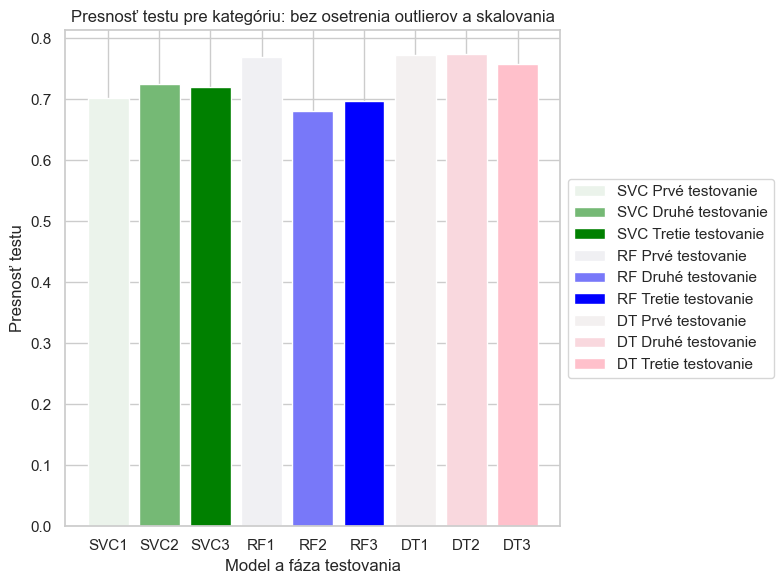

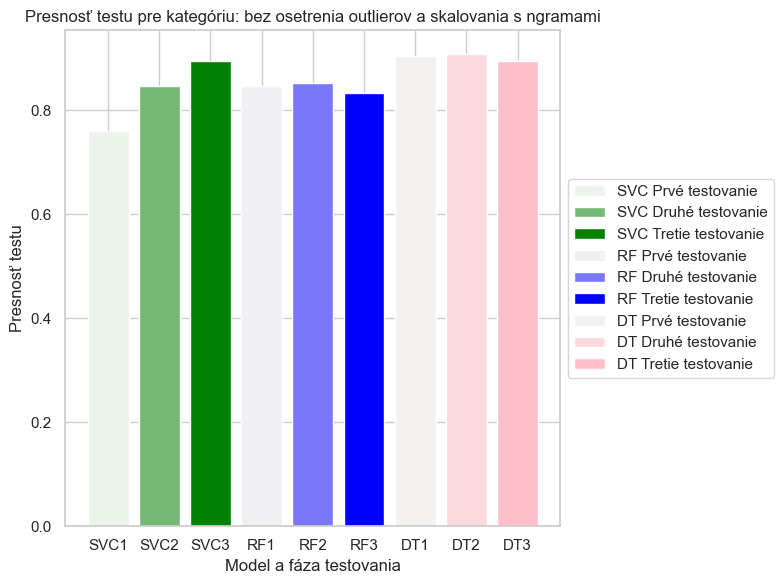

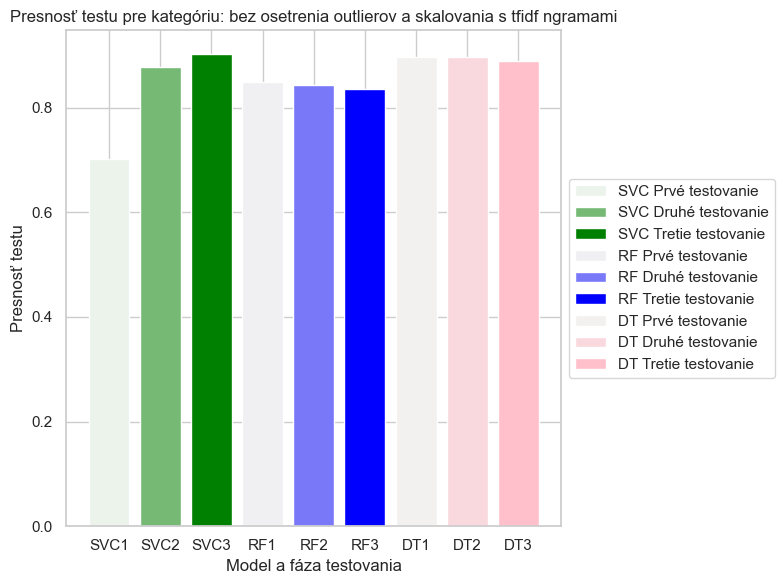

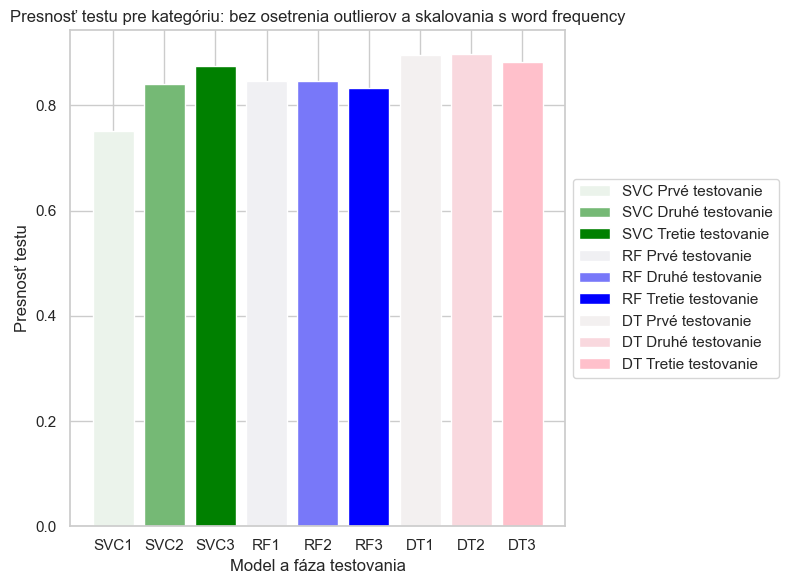

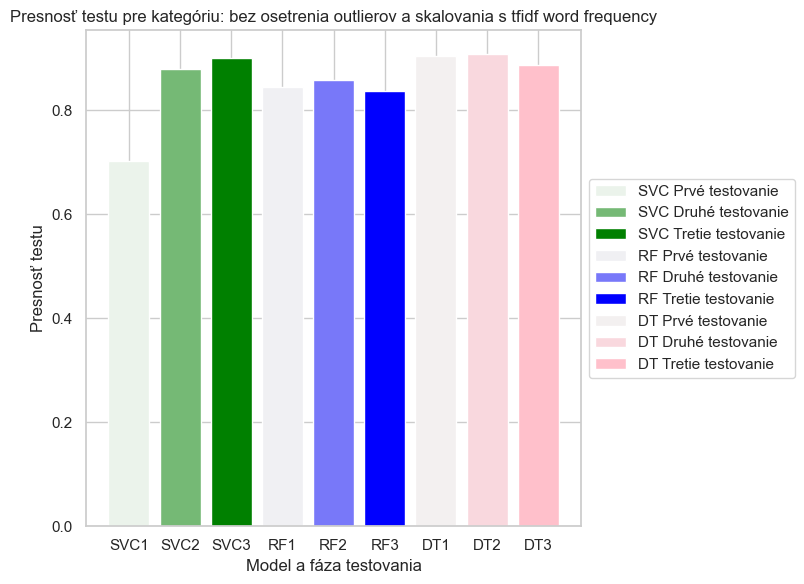

...

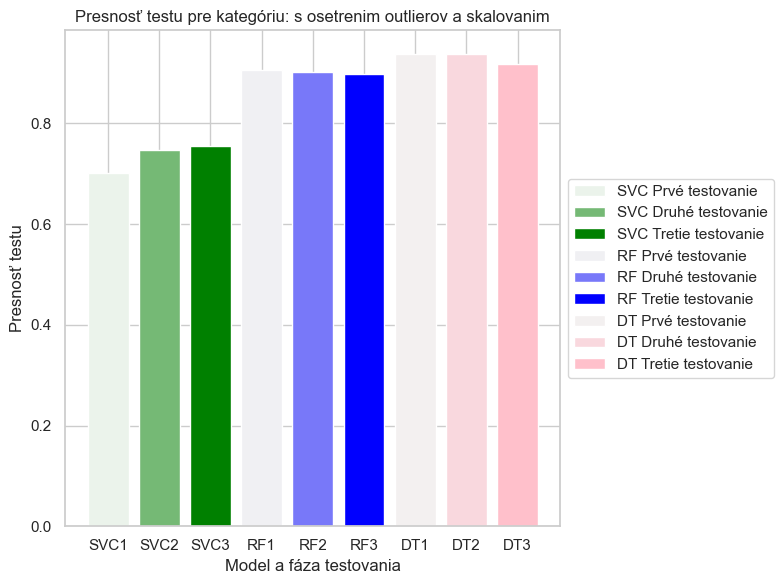

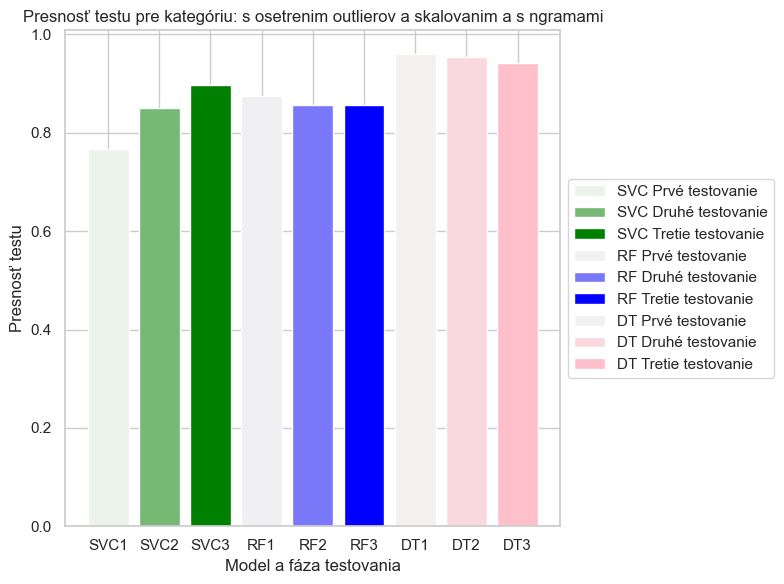

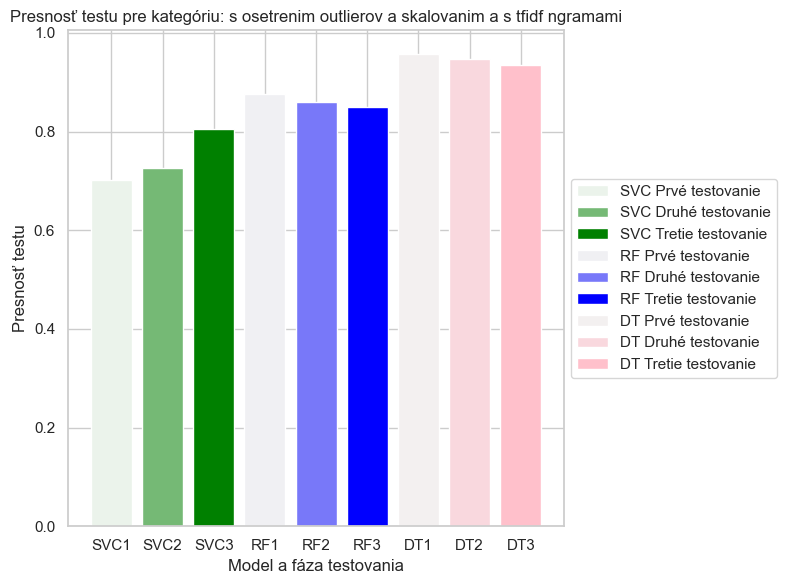

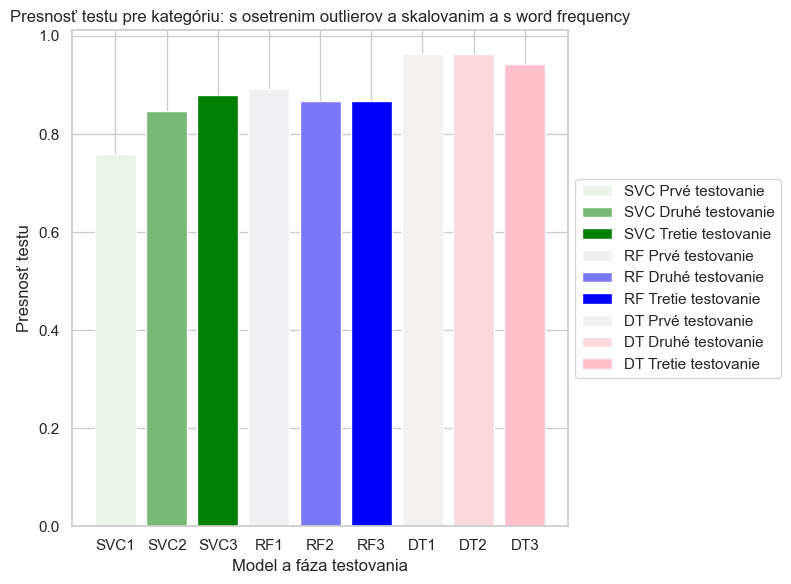

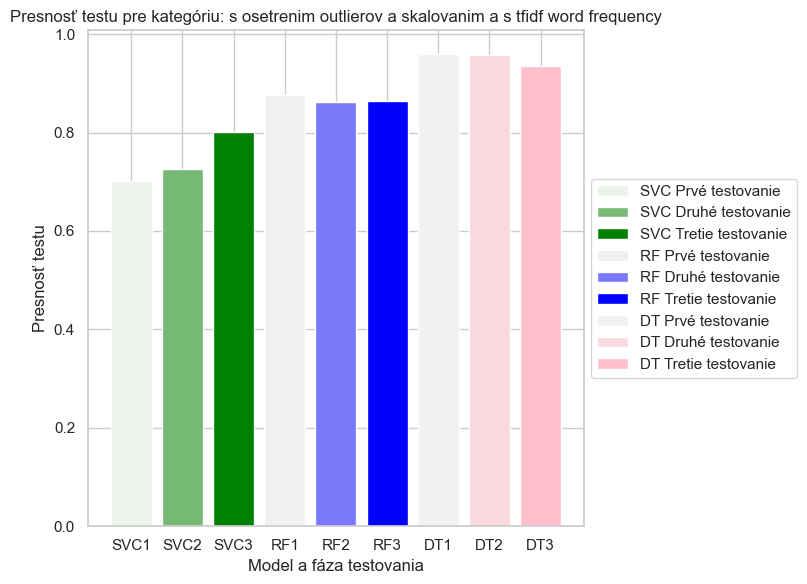

In [1231]:
# Nastavenie štýlu Seaborn pre pekné grafy
sns.set(style="whitegrid")

test_categories = results_svc1.index.tolist()

# Pre každú kategóriu vytvoríme graf
for category in test_categories:
    fig, ax = plt.subplots(figsize=(10, 6))

    # Farebné schémy pre testy
    colors_svc = sns.light_palette("green", 3)
    colors_rf = sns.light_palette("blue", 3)
    colors_gbm = sns.light_palette("pink", 3)

    # Pridanie dát pre SVC
    ax.bar('SVC1', results_svc1.loc[category, 'accuracy_test'], label='SVC Prvé testovanie', color=colors_svc[0])
    ax.bar('SVC2', results_svc2.loc[category, 'accuracy_test'], label='SVC Druhé testovanie', color=colors_svc[1])
    ax.bar('SVC3', results_svc3.loc[category, 'accuracy_test'], label='SVC Tretie testovanie', color=colors_svc[2])

    # Pridanie dát pre Random Forest
    ax.bar('RF1', results_rf1.loc[category, 'accuracy_test'], label='RF Prvé testovanie', color=colors_rf[0])
    ax.bar('RF2', results_rf2.loc[category, 'accuracy_test'], label='RF Druhé testovanie', color=colors_rf[1])
    ax.bar('RF3', results_rf3.loc[category, 'accuracy_test'], label='RF Tretie testovanie', color=colors_rf[2])

    # Pridanie dát pre GRADIENT BOOSTING MASHINE
    ax.bar('DT1', results_gbm1.loc[category, 'accuracy_test'], label='DT Prvé testovanie', color=colors_gbm[0])
    ax.bar('DT2', results_gbm2.loc[category, 'accuracy_test'], label='DT Druhé testovanie', color=colors_gbm[1])
    ax.bar('DT3', results_gbm3.loc[category, 'accuracy_test'], label='DT Tretie testovanie', color=colors_gbm[2])

    # Nastavenie legendy mimo grafu na pravej strane
    ax.legend(loc='center left', bbox_to_anchor=(1, 0.5))

    # Titulok grafu
    ax.set_title(f'Presnosť testu pre kategóriu: {category}')

    # Popisy osí
    ax.set_xlabel('Model a fáza testovania')
    ax.set_ylabel('Presnosť testu')

    # Zobrazenie grafu
    plt.tight_layout(rect=[0, 0, 0.8, 1])  # Uvoľnenie priestoru pre legendu
    plt.show()

<Figure size 1200x700 with 0 Axes>

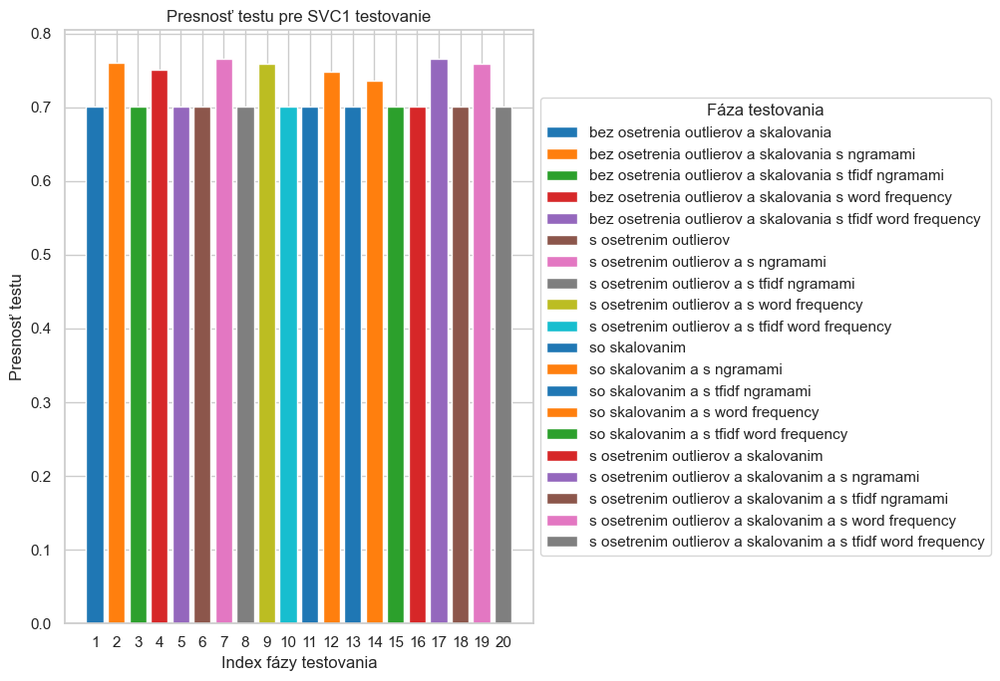

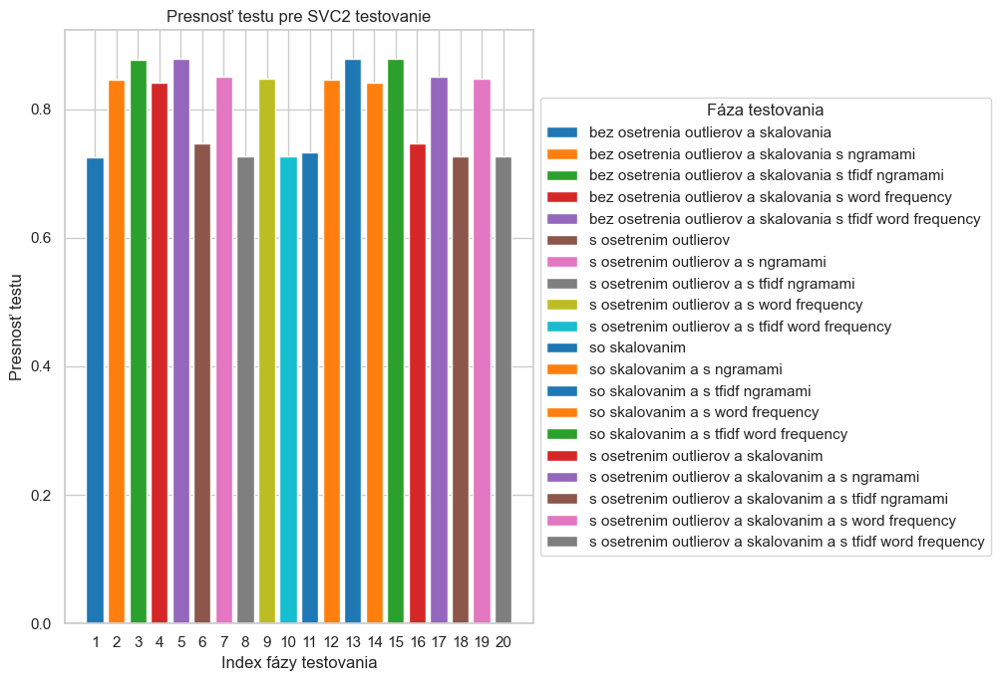

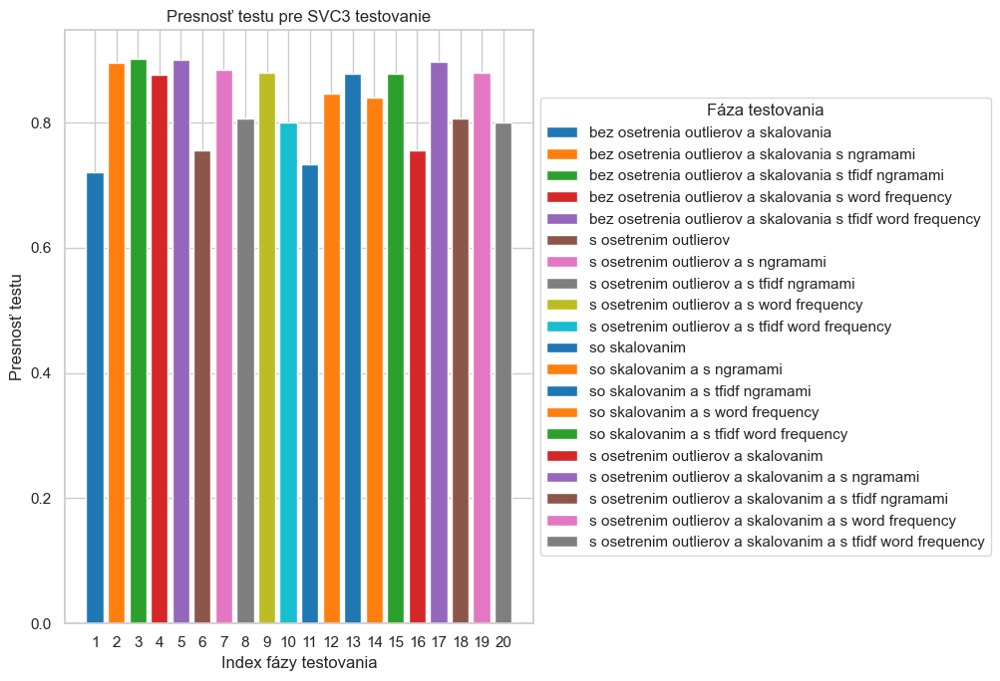

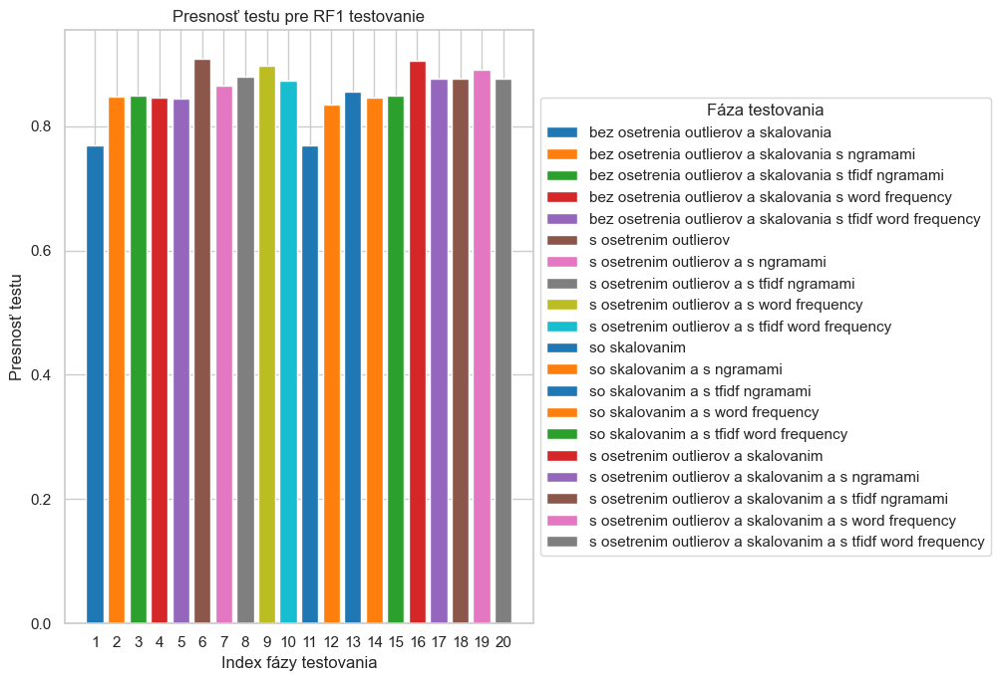

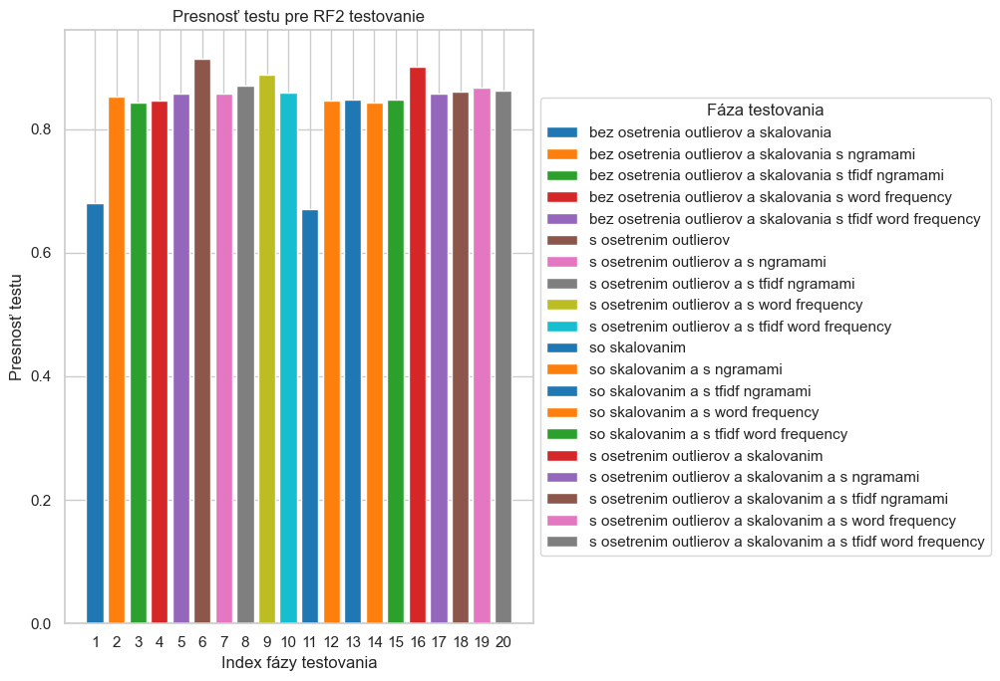

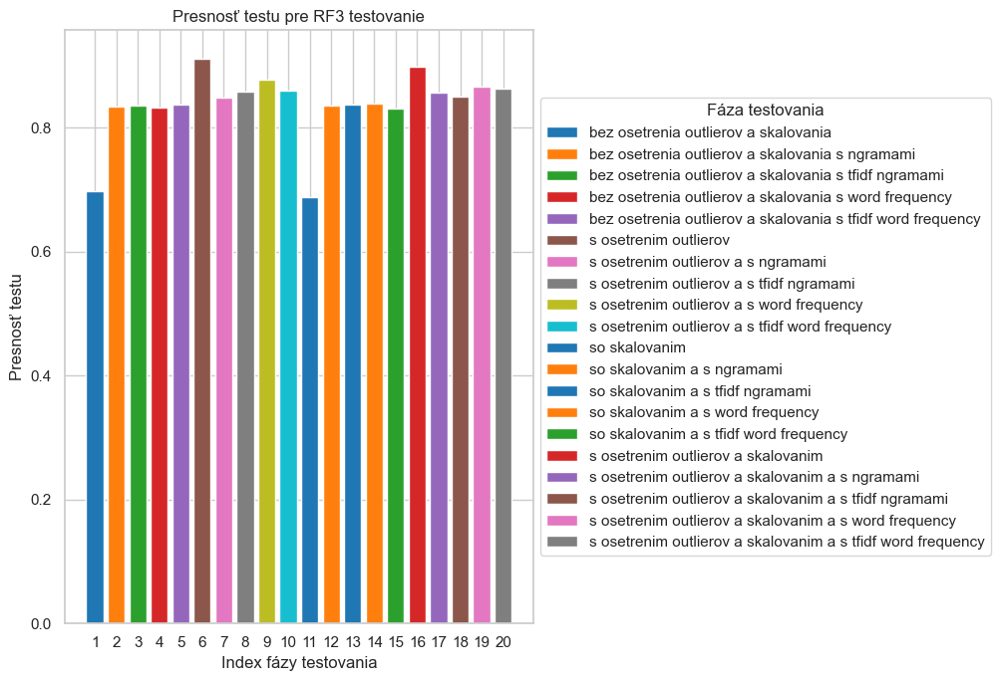

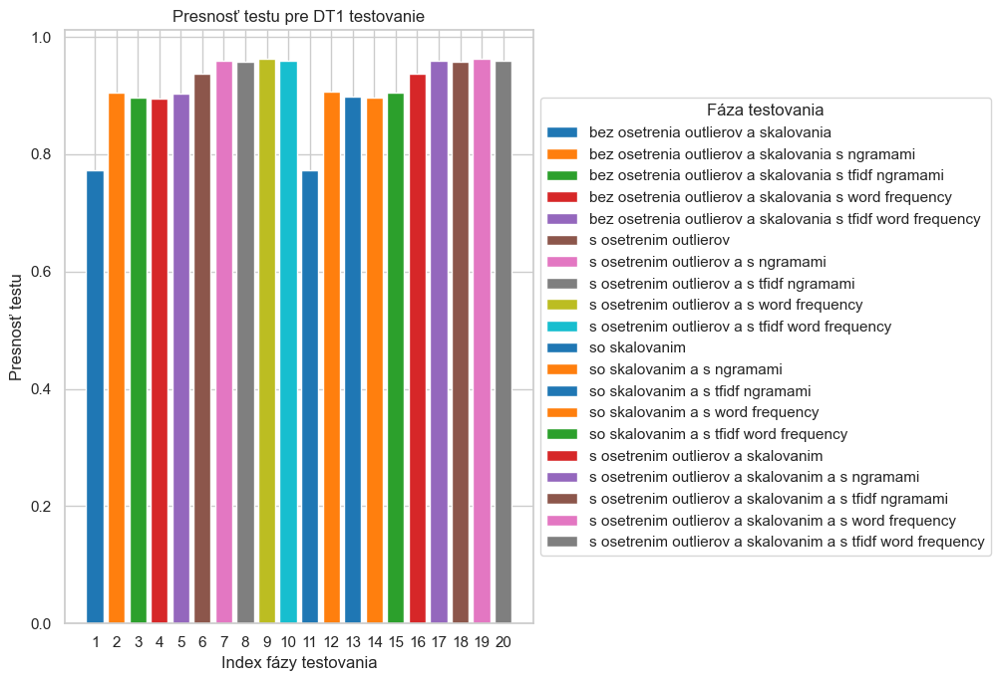

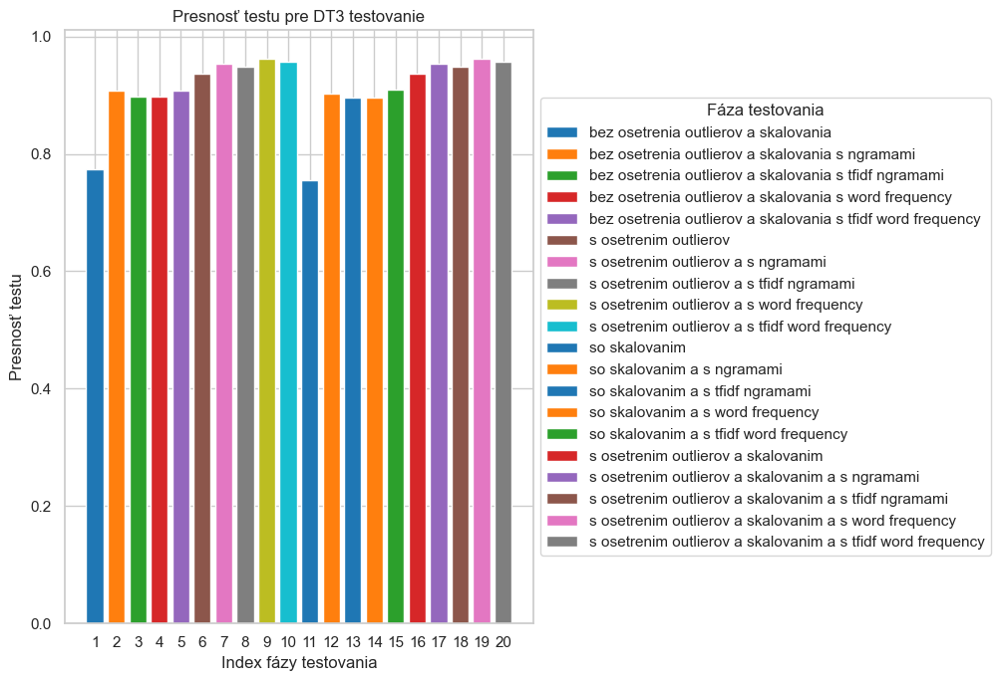

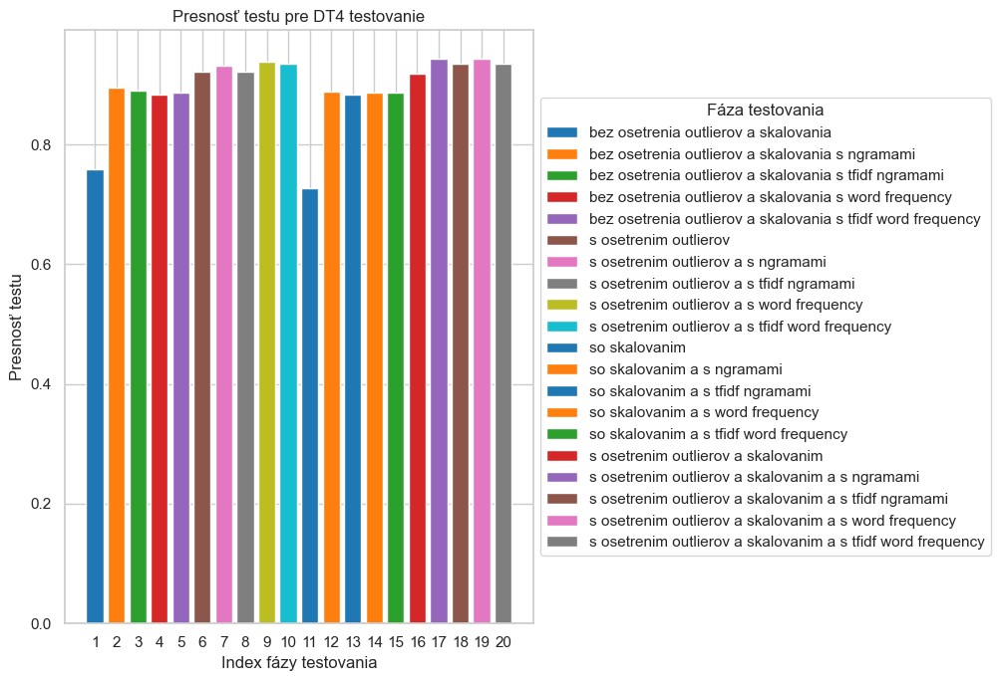

In [1232]:
# Nastavenie veľkosti grafu
plt.figure(figsize=(12, 7))

# Farebná paleta pre rôzne testovania
colors = sns.color_palette("tab10", 12)

# Vykreslenie grafu pre každý DataFrame
for results_df, label in [(results_svc1, 'SVC1'), (results_svc2, 'SVC2'), (results_svc3, 'SVC3'), (results_rf1, 'RF1'), (results_rf2, 'RF2'), (results_rf3, 'RF3'), (results_gbm1, 'DT1'), (results_gbm2, 'DT3'), (results_gbm3, 'DT4')]:
    fig, ax = plt.subplots(figsize=(12, 7))

    # Názvy indexov vo vašom DataFrame, upravte podľa potreby
    index_names = results_df.index.tolist()

    # Vykreslenie stĺpcov pre každý index
    for i, index_name in enumerate(index_names):
        # Vyberieme farbu pre aktuálny index
        color = colors[i % len(colors)]
        # Vykreslíme stĺpec a pridáme popisek pre legendu
        ax.bar(i, results_df.loc[index_name, 'accuracy_test'], color=color, label=index_name)

    # Nastavíme os x na čísla od 0 do počtu indexov - 1
    ax.set_xticks(np.arange(len(index_names)))
    ax.set_xticklabels(np.arange(1, len(index_names) + 1))

    # Pridáme legendu
    ax.legend(title='Fáza testovania', loc='center left', bbox_to_anchor=(1, 0.5))

    # Nastavíme názov grafu a popisy osí
    ax.set_title(f'Presnosť testu pre {label} testovanie')
    ax.set_xlabel('Index fázy testovania')
    ax.set_ylabel('Presnosť testu')

    # Zobrazíme graf
    plt.tight_layout(rect=[0, 0, 0.85, 1])
    plt.show()